In [1]:
# Boilerplate from Randy cheatsheet at https://docs.google.com/document/d/1utZuLHcKQEZNXTQLOysTNCxTHrqxczAUymmtplpn27Q/edit#
import pandas as pd
import geopandas as gpd
import numpy as np
from geopandas import GeoSeries, GeoDataFrame
import re
%matplotlib inline
pd.set_option('display.max_columns', 500)

# Wide display
from IPython.core.display import display, HTML
display(HTML("<style>#notebook-container { margin-left:-14px; width:calc(100% + 27px) !important; }</style>"))

In [2]:
import pandas as pd
import csv, json, os, math, numbers, pandas, re, scipy, scipy.sparse, shutil
import struct, subprocess, sys, threading, time, urllib2
import sqlite3, thread, urllib

def exec_ipynb(filename_or_url):
    nb = (urllib2.urlopen(filename_or_url) if re.match(r'https?:', filename_or_url) else open(filename_or_url)).read()
    jsonNb = json.loads(nb)
    #check for the modified formatting of Jupyter Notebook v4
    if(jsonNb['nbformat'] == 4):
        exec '\n'.join([''.join(cell['source']) for cell in jsonNb['cells'] if cell['cell_type'] == 'code']) in globals()
    else:
        exec '\n'.join([''.join(cell['input']) for cell in jsonNb['worksheets'][0]['cells'] if cell['cell_type'] == 'code']) in globals()

exec_ipynb('timelapse-utilities.ipynb')

In [3]:
def get_segments_from_ring(r):
    ret = set()
    for i in range(0, len(r)):
        ret.add((r[i - 1][0], r[i - 1][1], r[i][0], r[i][1]))
    return ret

def get_segments_from_polygon(p):
    return set.union(*[get_segments_from_ring(r) for r in p])

def get_segments_from_multipolygon(mp):
    return set.union(*[get_segments_from_polygon(p) for p in mp])

def get_segments(g):
    if 'features' in g:
        return set.union(*[get_segments(f) for f in g['features']])
    elif 'geometry' in g:
        if g['geometry']['type'] == 'Polygon':
            return get_segments_from_polygon(g['geometry']['coordinates'])
        elif g['geometry']['type'] == 'MultiPolygon':
            return get_segments_from_multipolygon(g['geometry']['coordinates'])
        else:
            raise Exception('unrecognized geometry type %s' % g['geometry']['type'])
    else:
        raise 'unrecognized type'
        
def LonLatToWebMercator(lon, lat):
    x = (lon + 180.0) * 256.0 / 360.0
    y = 128.0 - math.log(math.tan((lat + 90.0) * math.pi / 360.0)) * 128.0 / math.pi
    return [x, y]

def WebMercatorToLonLat(x,y):
    lat = math.atan(math.exp((128.0 - y) * math.pi / 128.0)) * 360.0 / math.pi - 90.0
    lon = x * 360.0 / 256.0 - 180.0
    return [lon, lat]

def project_and_binarize_segment(segment, dest):
    (x1, y1) = LonLatToWebMercator(segment[0], segment[1])
    (x2, y2) = LonLatToWebMercator(segment[2], segment[3])
    dest.write(struct.pack('<ffff', x1, y1, x2, y2))

def binarize_geojson_outlines(src, dest):
    gj = json.load(open(src))
    print 'Read %d features from %s' % (len(gj['features']), src)
    segments = get_segments(gj)
    print '%d segments' % len(segments)

    try:
        os.makedirs(os.path.dirname(dest))
    except OSError:
        pass
        
    out = open(dest + '.tmp', 'w')
    for segment in segments:
        project_and_binarize_segment(segment, out)
    out.close()
    os.rename(dest + '.tmp', dest)
    print 'Created %s (%d segments)' % (dest, os.stat(dest).st_size / 16)
        

In [4]:
pandas.options.display.max_colwidth = 300
pandas.set_option('display.max_columns', 500)

# Read in 2018 US House boundaries

In [11]:
ush_2018 = gpd.read_file('voting/Remedial Plan Shapefile.shp').to_crs(epsg=4326)

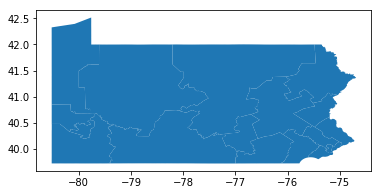

In [12]:
ush_2018.plot()

In [13]:
ush_2018

,ID,AREA,DISTRICT,MEMBERS,LOCKED,NAME,POPULATION,F18_POP,F18_AP_BLK,NH18_WHT,IDEAL_VALU,DEVIATION,F_DEVIATIO,F_18_AP_BL,F_NH18_WHT,geometry
0,1,655.201721,01,1.0,None,None,705687,543412,20074,474616,705688.0,-1.0,-0.000001,0.036941,0.873400,"POLYGON ((-75.48405700000001 40.418451, -75.479192 40.422939, -75.479049 40.423073, -75.475499 40.426399, -75.473145 40.428563, -75.472915 40.428775, -75.471053 40.430488, -75.471035 40.430503, -75.470972 40.430561, -75.469026 40.432359, -75.467159 40.434264, -75.46715 40.434274, -75.467108 40.4..."
1,2,65.945671,02,1.0,None,None,705688,526334,135399,258603,705688.0,0.0,0.000000,0.257249,0.491329,"POLYGON ((-74.980688 40.065007, -74.98070199999999 40.064878, -74.980706 40.064838, -74.980718 40.06472, -74.98073100000001 40.064592, -74.98081000000001 40.064389, -74.98090500000001 40.064269, -74.981022 40.063818, -74.981139 40.063683, -74.98114 40.063368, -74.98090500000001 40.06300700000001..."
2,3,54.538364,03,1.0,None,None,705688,568892,326217,187806,705688.0,0.0,0.000000,0.573425,0.330126,"POLYGON ((-75.206968 40.011372, -75.206914 40.011416, -75.20687100000001 40.01144800000001, -75.20679199999999 40.011512, -75.20628600000001 40.01192300000001, -75.206405 40.012002, -75.207599 40.012719, -75.207628 40.012736, -75.207728 40.012805, -75.20800800000001 40.012997, -75.20864899999999..."
3,4,480.801880,04,1.0,None,None,705687,543711,49311,443923,705688.0,-1.0,-0.000001,0.090693,0.816469,"POLYGON ((-75.48405700000001 40.418451, -75.48292499999999 40.417938, -75.48288700000001 40.417923, -75.482485 40.417686, -75.480785 40.416685, -75.47984099999999 40.41613, -75.477323 40.414648, -75.47653 40.414181, -75.474388 40.41297900000001, -75.47425800000001 40.412907, -75.47126 40.41114, ..."
4,5,221.704346,05,1.0,None,None,705688,541035,116060,377905,705688.0,0.0,0.000000,0.214515,0.698485,"POLYGON ((-75.502135 39.954367, -75.501051 39.954861, -75.499427 39.95560300000001, -75.49780199999999 39.956345, -75.496765 39.956819, -75.496719 39.95684, -75.495532 39.957382, -75.49434599999999 39.957924, -75.4939 39.958128, -75.49374299999999 39.958195, -75.493617 39.958253, -75.492351 39.9..."
5,6,922.566833,06,1.0,None,None,705688,528267,36673,420028,705688.0,0.0,0.000000,0.069421,0.795106,"POLYGON ((-75.46172900000001 40.103035, -75.461809 40.10247400000001, -75.461798 40.102346, -75.461795 40.102324, -75.461789 40.102255, -75.461788 40.102059, -75.46183000000001 40.101769, -75.461995 40.101498, -75.462361 40.101105, -75.462475 40.10095700000001, -75.46263 40.100578, -75.462637000..."
6,7,867.563293,07,1.0,None,None,705688,545100,32094,435449,705688.0,0.0,0.000000,0.058877,0.798842,"POLYGON ((-75.196803 40.60858, -75.19714999999999 40.60841600000001, -75.197287 40.608351, -75.19743200000001 40.60828300000001, -75.19759500000001 40.608205, -75.197654 40.608177, -75.197755 40.608129, -75.197802 40.60811200000001, -75.19782499999999 40.608103, -75.198019 40.608016, -75.198635 ..."
7,8,1117.711420,10,1.0,None,None,705688,545746,56209,446632,705688.0,0.0,0.000000,0.102995,0.818388,"POLYGON ((-76.701624 40.658082, -76.701566 40.658048, -76.70150700000001 40.658014, -76.70093300000001 40.65768, -76.698863 40.656477, -76.698173 40.656076, -76.696916 40.655321, -76.693145 40.653057, -76.691889 40.652303, -76.691603 40.652118, -76.69074600000002 40.651565, -76.69056 40.651445, ..."
8,9,1545.007080,11,1.0,None,None,705688,533533,18009,476409,705688.0,0.0,0.000000,0.033754,0.892933,"POLYGON ((-76.72162 40.12007, -76.721349 40.120606, -76.72094500000001 40.12141, -76.72054 40.122214, -76.720279 40.122734, -76.72027 40.122751, -76.720266 40.122757, -76.72025600000001 40.122778, -76.72025300000001 40.122785, -76.720139 40.123012, -76.72002500000001 40.123238, -76.7200200000000..."
9,10,9975.768550,12,1.0,None,None,705688,560669,12883,527131,705688.0,0.0,0.000000,0.022978,0.940182,"POLYGON ((-77.939424 40.775485, -77.93929 40.775576, -77.936916 40.777277, -77.93570200000001 40.778148, -77.927571 40.784001, -77.927249 40.7

In [14]:
# Create a GeoDataFrame that just has DISTRICT and geometry
ush_out_2018 = gpd.GeoDataFrame(ush_2018[['DISTRICT']], geometry=ush_2018.geometry,crs={'init': 'epsg:4326'})

In [15]:
ush_out_2018

,DISTRICT,geometry
0,01,"POLYGON ((-75.48405700000001 40.418451, -75.479192 40.422939, -75.479049 40.423073, -75.475499 40.426399, -75.473145 40.428563, -75.472915 40.428775, -75.471053 40.430488, -75.471035 40.430503, -75.470972 40.430561, -75.469026 40.432359, -75.467159 40.434264, -75.46715 40.434274, -75.467108 40.4..."
1,02,"POLYGON ((-74.980688 40.065007, -74.98070199999999 40.064878, -74.980706 40.064838, -74.980718 40.06472, -74.98073100000001 40.064592, -74.98081000000001 40.064389, -74.98090500000001 40.064269, -74.981022 40.063818, -74.981139 40.063683, -74.98114 40.063368, -74.98090500000001 40.06300700000001..."
2,03,"POLYGON ((-75.206968 40.011372, -75.206914 40.011416, -75.20687100000001 40.01144800000001, -75.20679199999999 40.011512, -75.20628600000001 40.01192300000001, -75.206405 40.012002, -75.207599 40.012719, -75.207628 40.012736, -75.207728 40.012805, -75.20800800000001 40.012997, -75.20864899999999..."
3,04,"POLYGON ((-75.48405700000001 40.418451, -75.48292499999999 40.417938, -75.48288700000001 40.417923, -75.482485 40.417686, -75.480785 40.416685, -75.47984099999999 40.41613, -75.477323 40.414648, -75.47653 40.414181, -75.474388 40.41297900000001, -75.47425800000001 40.412907, -75.47126 40.41114, ..."
4,05,"POLYGON ((-75.502135 39.954367, -75.501051 39.954861, -75.499427 39.95560300000001, -75.49780199999999 39.956345, -75.496765 39.956819, -75.496719 39.95684, -75.495532 39.957382, -75.49434599999999 39.957924, -75.4939 39.958128, -75.49374299999999 39.958195, -75.493617 39.958253, -75.492351 39.9..."
5,06,"POLYGON ((-75.46172900000001 40.103035, -75.461809 40.10247400000001, -75.461798 40.102346, -75.461795 40.102324, -75.461789 40.102255, -75.461788 40.102059, -75.46183000000001 40.101769, -75.461995 40.101498, -75.462361 40.101105, -75.462475 40.10095700000001, -75.46263 40.100578, -75.462637000..."
6,07,"POLYGON ((-75.196803 40.60858, -75.19714999999999 40.60841600000001, -75.197287 40.608351, -75.19743200000001 40.60828300000001, -75.19759500000001 40.608205, -75.197654 40.608177, -75.197755 40.608129, -75.197802 40.60811200000001, -75.19782499999999 40.608103, -75.198019 40.608016, -75.198635 ..."
7,10,"POLYGON ((-76.701624 40.658082, -76.701566 40.658048, -76.70150700000001 40.658014, -76.70093300000001 40.65768, -76.698863 40.656477, -76.698173 40.656076, -76.696916 40.655321, -76.693145 40.653057, -76.691889 40.652303, -76.691603 40.652118, -76.69074600000002 40.651565, -76.69056 40.651445, ..."
8,11,"POLYGON ((-76.72162 40.12007, -76.721349 40.120606, -76.72094500000001 40.12141, -76.72054 40.122214, -76.720279 40.122734, -76.72027 40.122751, -76.720266 40.122757, -76.72025600000001 40.122778, -76.72025300000001 40.122785, -76.720139 40.123012, -76.72002500000001 40.123238, -76.7200200000000..."
9,12,"POLYGON ((-77.939424 40.775485, -77.93929 40.775576, -77.936916 40.777277, -77.93570200000001 40.778148, -77.927571 40.784001, -77.927249 40.784218, -77.922938 40.787312, -77.921674 40.78822, -77.920844 40.788816, -77.920072 40.789364, -77.919318 40.7899, -77.917469 40.791233, -77.916546 40.7918..."


In [16]:
# Write out the 2018 US House geometry as a geojson file
ush_out_2018.to_file('voting/pa_us_house_boundaries_2018.geojson', driver="GeoJSON")

In [17]:
binarize_geojson_outlines('voting/pa_us_house_boundaries_2018.geojson', 
                          'voting/pa_us_house_boundaries_2018.bin')

Read 18 features from voting/pa_us_house_boundaries_2018.geojson
112242 segments
Created voting/pa_us_house_boundaries_2018.bin (112242 segments)


# Polling places

In [40]:
pp_2017 = gpd.read_file('voting/Polling_Place_Locations_May_2017.shp').to_crs(epsg=4326)

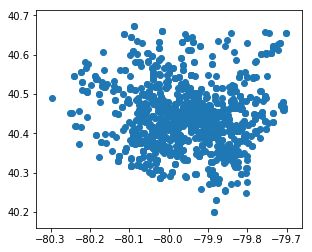

In [41]:
pp_2017.plot()

In [42]:
pp_2017

,OBJECTID_1,OBJECTID,Muni,Ward,District,LocName,Prefix,House,Fraction,Street,Suffix1,Suffix2,City,UnitDesc,UnitNumber,Zip,Parcel,Accessible,Leadman,Region,Coordinate,Coordina_1,DistrictCO,DistrictSE,DistrictLE,EditDate,MuniName,OrigAddres,MWD,POINT_X,POINT_Y,MWD2,NewAddress,geometry
0,1001,1004.0,223,0,6,#2 ENGINE HOUSE,None,24,None,AMHERST,AVE,None,WEST VIEW,None,None,15229-1536,0279B00091000000,None,27,4,1.330635e+06,440422.004210,4.0,40.0,20.0,None,WEST VIEW,14 AMHERST AVE,2230006,1.330635e+06,440422.004210,2230006,24 AMHERST AVE,POINT (-80.04459975708832 40.51958490057336)
1,1002,1005.0,223,0,7,WEST VIEW ELEMENTARY SCHOOL GYM,None,47,None,CHALFANT,ST,None,WEST VIEW,None,None,15229,0280A00114000000,None,27,4,1.334159e+06,440888.627960,4.0,40.0,20.0,None,WEST VIEW,47 CHALFANT STREET,2230007,1.334159e+06,440888.627960,2230007,47 CHALFANT ST,POINT (-80.03197026853063 40.52111598498339)
2,1003,1006.0,225,0,1,BALDWIN COMM. U M CHURCH-WESLEY HL.,None,5001,None,BAPTIST,RD,None,PITTSBURGH,None,None,15236-1717,0249S00160000000,None,34,1,1.341541e+06,381004.441744,18.0,37.0,22.0,None,WHITEHALL,5001 BAPTIST RD,2250001,1.341541e+06,381004.441744,2250001,5001 BAPTIST RD,POINT (-79.99994119350922 40.3573080268444)
3,1004,1007.0,225,0,2,ST. GABRIEL OF THE SORROW VIR SCH,None,5200,None,GREENRIDGE,DR,None,PITTSBURGH,None,None,15236-1742,0249R00224000002,None,34,1,1.339777e+06,380643.921640,18.0,37.0,22.0,None,WHITEHALL,5200 GREENRIDGE DR,2250002,1.339777e+06,380643.921640,2250002,5200 GREENRIDGE DR,POINT (-80.0062334032054 40.35619522924374)
4,1005,1008.0,225,0,3,BORO BLDG,None,100,None,BOROUGH PARK,DR,None,PITTSBURGH,None,None,15236-2013,0314E00100000000,None,34,1,1.347114e+06,378560.498948,18.0,37.0,22.0,None,WHITEHALL,100 BOROUGH PARK DR,2250003,1.347114e+06,378560.498948,2250003,100 BOROUGH PARK DR,POINT (-79.97972900445221 40.35098943665007)
5,1006,1009.0,225,0,4,BORO BLDG,None,100,None,BOROUGH PARK,DR,None,PITTSBURGH,None,None,15236-2013,0314E00100000000,None,34,1,1.346993e+06,378560.498948,18.0,37.0,22.0,None,WHITEHALL,100 BOROUGH PARK DR,2250004,1.346993e+06,378560.498948,2250004,100 BOROUGH PARK DR,POINT (-79.98016132404423 40.35098108293546)
6,1007,1010.0,225,0,5,BALDWIN HIGH SCHOOL GYM HALL,None,4653,None,CLAIRTON,BLVD,None,PITTSBURGH,None,None,15236-2149,0247P00200000000,None,34,1,1.347664e+06,380228.037400,18.0,37.0,36.0,None,WHITEHALL,4653 CLAIRTON BLVD,2250005,1.347664e+06,380228.037400,2250005,4653 CLAIRTON BLVD,POINT (-79.97790667249754 40.35560353933538)
7,1008,1011.0,225,0,6,BALDWIN HIGH SCHOOL GYM HALL,None,4653,None,CLAIRTON,BLVD,None,PITTSBURGH,None,None,15236-2149,0247P00200000000,None,34,1,1.347574e+06,380371.983290,18.0,37.0,36.0,None,WHITEHALL,4653 CLAIRTON BLVD,2250006,1.347574e+06,380371.983290,2250006,4653 CLAIRTON BLVD,POINT (-79.97824078788069 40.35599235126165)
8,1009,1012.0,225,0,7,CANONGATE APT-PARTY RM.,None,200,None,WHITE HAMPTON,LN,None,PITTSBURGH,None,None,15236-1575,0189N00050000000,None,34,1,1.342282e+06,383764.085281,18.0,37.0,22.0,None,WHITEHALL,200 WHITE HAMPTON LN,2250007,1.342282e+06,383764.085281,2250007,200 WHITE HAMPTON LN,POINT (-79.99753522747905 40.36493266801937)
9,1010,1013.0,225,0,8,WHITEHALL ELEMENTARY SCHOOL,None,4900,None,CURRY,RD,None,PITTSBURGH,None,None,15236-1817,0315F00115000000,None,34,1,1.343279e+06,379339.210060,18.0,37.0,22.0,None,WHITEHALL,4900 CURRY RD,2250008,1.343279e+06,379339.210060,2250008,4900 CURRY RD,POINT (-79.9935527513839 40.35285979665043)


In [43]:
# Create a GeoDataFrame that just has MuniName and geometry
pp_out_2017 = gpd.GeoDataFrame(pp_2017[['MuniName']], geometry=pp_2017.geometry,crs={'init': 'epsg:4326'})
pp_out_2017

,MuniName,geometry
0,WEST VIEW,POINT (-80.04459975708832 40.51958490057336)
1,WEST VIEW,POINT (-80.03197026853063 40.52111598498339)
2,WHITEHALL,POINT (-79.99994119350922 40.3573080268444)
3,WHITEHALL,POINT (-80.0062334032054 40.35619522924374)
4,WHITEHALL,POINT (-79.97972900445221 40.35098943665007)
5,WHITEHALL,POINT (-79.98016132404423 40.35098108293546)
6,WHITEHALL,POINT (-79.97790667249754 40.35560353933538)
7,WHITEHALL,POINT (-79.97824078788069 40.35599235126165)
8,WHITEHALL,POINT (-79.99753522747905 40.36493266801937)
9,WHITEHALL,POINT (-79.9935527513839 40.35285979665043)


# Deal with voting file from county

In [44]:
# Write out the 2017 polling place geometry as a geojson file
pp_out_2017.to_file('voting/pa_ac_polling_places_2017.geojson', driver="GeoJSON")
binarize_geojson_outlines('voting/pa_ac_polling_places_2017.geojson', 
                          'voting/pa_ac_polling_places_2017.bin')


Read 1323 features from voting/pa_ac_polling_places_2017.geojson


Exception: unrecognized geometry type Point

In [46]:
pp_out_2017.geometry[0].x

-80.04459975708832

In [47]:
def write_pp_csv(df, out_path):
    date_range = range(2017, 2019)
    out = open(out_path, 'w')
    # Write out header row.  First column doesn't have a column heading, next two are lat, lon, then each year
    out.write(",lat,lon,%s\n" % (",".join(map(str,date_range))))
    
    i=0
    for i in range(0,len(df)):
        lon = df.geometry[i].x
        lat = df.geometry[i].y
        
        out_data=[i, lat, lon]

        for year in date_range:
            out_val = 20
            out_data.append(out_val)
        out.write('%s\n' % (",".join(map(str,out_data))))
    out.close()

In [48]:
write_pp_csv(pp_out_2017, "voting/pa_ac_polling_places_2017.csv")

# Address mapping

In [2]:
# Key is string canonical address, value is a map: {'canonical_in_census_db': True/False,'canonical_in_google_db': True/False, 'other_addr_strings':Set, 'census_value':str, 'google_value':str
canonical_addr_map={}

In [13]:
def canonicalize_string(text):
    # Remove any leading or trailing whitespace, replace any internal whitespace with single spaces, upcase it all
    ret = re.sub("^\s+|\s+$", "", text)
    ret = re.sub("\s+", " ", ret)
    return ret.upper()

In [246]:
# Try to load canonical_addr_map originally created by 
#  http://localhost:8820/notebooks/projects/demographics/Fixup%20Address%20DB.ipynb
import pickle
pickle_file_path = 'assessments/canonical_addr_map_c.pickle'

In [15]:
# Load in canonical_addr_map
with open(pickle_file_path, 'rb') as handle:
    canonical_addr_map = pickle.load(handle)

In [247]:
# Save out canonical_addr_map
with open(pickle_file_path, 'wb') as handle:
    pickle.dump(canonical_addr_map, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [5]:
# From http://localhost:8820/notebooks/projects/demographics/Allegheny%20County%20Property%20Assessments-AW9.ipynb

# assessments/cd/AC Property Assessments_10012017.xls (which is actually TDF) from Amy Gottsegen and Randy Sargent buying a CD from the county assessors office
# assessments/Allegheny_County_Parcel_Boundaries.geojson from https://data.wprdc.org/dataset/allegheny-county-parcel-boundaries
import array, csv, datetime, json, math, numpy, os, random, re 
from dateutil.parser import parse
from shapely.geometry import mapping, shape
from PIL import Image
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import pandas,numbers
from operator import itemgetter, attrgetter
import string
import calendar,time
from IPython.core.display import HTML

# Use geopandas.  Boilerplate from https://docs.google.com/document/d/1utZuLHcKQEZNXTQLOysTNCxTHrqxczAUymmtplpn27Q/edit#heading=h.f50xoxwmcir
import pandas as pd
import geopandas as gpd
from geopandas import GeoSeries, GeoDataFrame
%matplotlib inline

pd.options.display.max_colwidth = 300
pd.options.display.max_rows = 100
pd.set_option('display.max_columns', 500)

# Built-in time handling fails for times before 1900.  Use arrow instead.  
# See https://arrow.readthedocs.io/en/latest/ for info
import arrow
import dateparser

def LonLatToPixelXY(lonlat):
    (lon, lat) = lonlat
    x = (lon + 180.0) * 256.0 / 360.0
    y = 128.0 - math.log(math.tan((lat + 90.0) * math.pi / 360.0)) * 128.0 / math.pi
    return [x, y]

# This does the same as above, but takes a GeoJSON point (which is what centroid returns)
def PointToPixelXY(point):
    lon=point.x
    lat=point.y
    x = (lon + 180.0) * 256.0 / 360.0
    y = 128.0 - math.log(math.tan((lat + 90.0) * math.pi / 360.0)) * 128.0 / math.pi
    return [x, y]

def GetCentroid(geometry):
    s = shape(geometry)
    return (s.centroid.x, s.centroid.y)   

def GetEpoch(date):
    return (date - datetime.datetime(1970, 1, 1)).total_seconds()

def HexToRgb(hex_string):
    rgb = colors.hex2color(hex_string)
    r,g,b = tuple([int(255*x) for x in rgb])
    return (r,g,b)

In [6]:
# Google addresses with the addition of using canonical_addr_map as cache
# Original version was from 
#  http://localhost:8820/notebooks/projects/demographics/Allegheny%20County%20Property%20Assessments-AW9.ipynb#
from shapely.geometry import Point
import collections


# Google geocoding API to geocode an address
# Assumes key is in google_api_key.txt
# Use as second level lookup only for those which fail census lookup

re_noalnum = re.compile('^([^\w]+)$')

def geocode_address_google(address):
    if(pandas.isnull(address) or re_noalnum.match(address)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(address)
        return None

    # String canonicalize the address
    caddr = canonicalize_string(address)

    # Check if we already have a value in canonical_addr_map, if so return it
    if(caddr in canonical_addr_map and canonical_addr_map[caddr]['google_value']):
        result = json.loads(canonical_addr_map[caddr]['google_value'])
    else:
        # Not yet in canonical_addr_map, fetch from sqlite DB or google address lookup service
        try:
            geocode_address_google.conn
        except:
            geocode_address_google.conn = sqlite3.connect('geocoding_cache')
            geocode_address_google.cur = geocode_address_google.conn.cursor()
            geocode_address_google.cur.execute(('CREATE TABLE IF NOT EXISTS kvs'
                                         ' (key PRIMARY KEY, value)'
                                         ' WITHOUT ROWID;'))
            geocode_address_google.conn.commit()

        geocode_address_google.cur.execute('SELECT value FROM kvs WHERE key=?', (caddr,))
        rows = geocode_address_google.cur.fetchall()
        if rows:
            #print "Google: Found %r in cache" % (caddr)
            gval = rows[0][0]
        else:
            # Not in sqlite, ask google address service
            #print "Google: %r not found in cache, fetching" % (address)

            api_key = open('google-api-key-do-not-commit.txt').read()
            payload = {'address':caddr, 'key':api_key}
            result = json.load(urllib2.urlopen('https://maps.googleapis.com/maps/api/geocode/json?%s' % urllib.urlencode(payload)))
            # Keep the stringified version for the DB/canonical_addr_map
            gval = json.dumps(result)
            geocode_address_google.cur.execute(('INSERT OR REPLACE INTO kvs (key, value)'
                                         ' VALUES (?, ?);'),
                                         (caddr, gval))
            geocode_address_google.conn.commit()
            
            # If the result succeeded and generated a formatted address, cache under that key too
            try:
                if(result['status']=='OK'):
                    if(len(result['results'])== 1):
                        canonical = result['results'][0]['formatted_address']
                        #print "Google: Storing canonical addr of %r for %r" % (canonical, address)
                        geocode_address_google.cur.execute(('INSERT OR REPLACE INTO kvs (key, value)'
                                                             ' VALUES (?, ?);'),
                                                             (canonical, gval))
                        geocode_address_google.conn.commit()
                    else:
                        print "Google: Fetch %r seemed to succeed, but results empty or non-unique" % (address)

                else:
                    print "Google: Fetch %r failed" % (address)
                
            except:
                #pass
                raise
                
        # We had to resort to sqlite/google address service.  Add gval to canonical_addr_map
        if(caddr not in canonical_addr_map):
            canonical_addr_map[caddr]={'canonical_in_census_db':False,'canonical_in_google_db': True, 
                                       'census_value':None, 'google_value':gval}
        else:
            # Already there, presumably for census.  Add google value 
            canonical_addr_map[caddr]['canonical_in_google_db']=True
            canonical_addr_map[caddr]['google_value']=gval
 
    
    return result

def get_canonical_address_google(raw_addr):
    if(pandas.isnull(raw_addr) or re_noalnum.match(raw_addr)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(raw_addr)
        return None

    try:
        result=geocode_address_google(raw_addr)
        if(result['status']=='OK' and len(result['results'])== 1):
            return(result['results'][0]['formatted_address'])
        else:
            return None
    except:
        return None

def get_canonical_zip_google(addr):
    if(pandas.isnull(addr) or re_noalnum.match(addr)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(addr)
        return None

    try:
        result=geocode_address_google(addr)
        if(result['status']=='OK' and len(result['results'])== 1):
            addr_comps = result['results'][0]['address_components']
            for i in range(0, len(addr_comps)):
                if('postal_code' in addr_comps[i]['types']):
                    return addr_comps[i]['short_name']
        
        return None
    except:
        return None
    
def get_canonical_coords_google(addr):
    if(pandas.isnull(addr) or re_noalnum.match(addr)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(addr)
        return None

    try:
        result=geocode_address_google(addr)
        if(result['status']=='OK' and len(result['results'])== 1):
            latlon = result['results'][0]['geometry']['location']
            if(latlon):
                return(Point(latlon['lng'], latlon['lat']))
        return None
    except:
        return None


In [7]:
# Census addresses with the addition of using canonical_addr_map as cache
# Original version was from 
#  http://localhost:8820/notebooks/projects/demographics/Allegheny%20County%20Property%20Assessments-AW9.ipynb#

# Uses Census geocoding API to geocode an address

import sqlite3
import urllib,urllib2
import json
from shapely.geometry import Point
import collections

# Match if the string contains no alphanumerics
re_noalnum = re.compile('^([^\w]+)$')

def geocode_address_census(address):
    if(pandas.isnull(address) or re_noalnum.match(address)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(address)
        return None

    # String canonicalize the address
    caddr = canonicalize_string(address)

    # Check if we already have a value in canonical_addr_map, if so return it
    if(caddr in canonical_addr_map and canonical_addr_map[caddr]['census_value']):
        result = json.loads(canonical_addr_map[caddr]['census_value'])
    else:
        # Not yet in canonical_addr_map, fetch from sqlite DB or census address lookup service
        try:
            geocode_address_census.sqlite
        except:
            geocode_address_census.sqlite = {}

        tpid = '%d.%s' % (os.getpid(), thread.get_ident())
        if not tpid in geocode_address_census.sqlite:
            conn = sqlite3.connect('geocoding_cache_census')
            cur = conn.cursor()
            geocode_address_census.sqlite[tpid] = { 'conn': conn, 'cur': cur }

            cur.execute(('CREATE TABLE IF NOT EXISTS kvs'
                         ' (key PRIMARY KEY, value)'
                         ' WITHOUT ROWID;'))
            conn.commit()
        else:
            conn = geocode_address_census.sqlite[tpid]['conn']
            cur = geocode_address_census.sqlite[tpid]['cur']

        cur.execute('SELECT value FROM kvs WHERE key=?', (caddr,))
        rows = cur.fetchall()
        if rows:
            cval = rows[0][0]
        else:
            payload = {'address':caddr, 'benchmark':4, 'format':'json'}
            result = json.load(urllib2.urlopen('https://geocoding.geo.census.gov/geocoder/locations/onelineaddress?%s' % urllib.urlencode(payload)))
            cval = json.dumps(result)

            cur.execute(('INSERT OR REPLACE INTO kvs (key, value)'
                         ' VALUES (?, ?);'),
                        (caddr, cval))
            conn.commit()

            if len(result['result']['addressMatches']) == 1:
                canonical = result['result']['addressMatches'][0]['matchedAddress']
                cur.execute(('INSERT OR REPLACE INTO kvs (key, value)'
                             ' VALUES (?, ?);'),
                             (canonical, cval))
                conn.commit()
            
        # We had to resort to sqlite/google address service.  Add cval to canonical_addr_map
        if(caddr not in canonical_addr_map):
            canonical_addr_map[caddr]={'canonical_in_census_db':True,'canonical_in_google_db': False, 
                                       'census_value':cval, 'google_value':None}
        else:
            # Already there, presumably for google.  Add census value 
            canonical_addr_map[caddr]['canonical_in_census_db']=True
            canonical_addr_map[caddr]['census_value']=cval

    
    return result

def cache_canonical_addresses(addrs):
    t = SimpleThreadPoolExecutor(25)
    for addr in addrs:
        if(not (pandas.isnull(addr) or re_noalnum.match(addr))):
            t.submit(geocode_address_census, addr)
        else:
            #print "Skipping address lookup for %r, no alphanumeric characters" %(addr)
            pass
    t.shutdown()

def get_canonical_address_census(raw_addr):
    if(pandas.isnull(raw_addr) or re_noalnum.match(raw_addr)):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(raw_addr)
        return None

    try:
        result=geocode_address_census(raw_addr)
        if len(result['result']['addressMatches']) == 1:
            return(result['result']['addressMatches'][0]['matchedAddress'])
        else:
            return None
    except:
        return None

def get_canonical_zip_census(addr):
    try:
        result=geocode_address_census(addr)
        if len(result['result']['addressMatches']) == 1:
            return(result['result']['addressMatches'][0]['addressComponents']['zip'])
        else:
            return None
    except:
        return None

    
def get_canonical_coords_census(addr):
    try:
        result=geocode_address_census(addr)
        if len(result['result']['addressMatches']) == 1:
            coords = result['result']['addressMatches'][0]['coordinates']
            return(Point(coords['x'], coords['y']))
        else:
            return None
    except:
        return None

################################################################################################################
# These can handle being passed a map with either census or google in it and dispatch to the right service

# TODO: Think if this is the right behavior: If handed a regular string do census lookup
# If handed a map, return census if non-null, then google if non-null
def get_canonical_address(addr):
    if(pandas.isnull(addr) or ((not isinstance(addr, collections.Mapping) and re_noalnum.match(addr)))):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(addr)
        return None

    if(isinstance(addr, collections.Mapping)):
        if('census' in addr and not pd.isnull(addr['census'])):
            return addr['census']
        elif('google' in addr and not pd.isnull(addr['google'])):
            return addr['google']
    else:
        return(get_canonical_address_census(addr))

def get_canonical_zip(addr):
    if(pandas.isnull(addr) or ((not isinstance(addr, collections.Mapping) and re_noalnum.match(addr)))):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(addr)
        return None
    if(isinstance(addr, collections.Mapping)):
        if('census' in addr and not pd.isnull(addr['census'])):
            return get_canonical_zip_census(addr['census'])
        elif('google' in addr and not pd.isnull(addr['google'])):
            return get_canonical_zip_google(addr['google'])
    else:
        return(get_canonical_zip_census(addr))

def get_canonical_coords(addr):
    if(pandas.isnull(addr) or ((not isinstance(addr, collections.Mapping) and re_noalnum.match(addr)))):
        #print "Skipping address lookup for %r, no alphanumeric characters" %(addr)
        return None
    
    if(isinstance(addr, collections.Mapping)):
        if('census' in addr and not pd.isnull(addr['census'])):
            return get_canonical_coords_census(addr['census'])
        elif('google' in addr and not pd.isnull(addr['google'])):
            return get_canonical_coords_google(addr['google'])
    else:
        return(get_canonical_coords_census(addr))

def canonicalize_addr_colset(df, col_arr, out_colname):
    for  col_name in col_arr:
        df[col_name]=df[col_name].astype(basestring)
        df[col_name].fillna('', inplace=True)

    df[out_colname] = df[col_arr].apply(lambda x: get_canonical_address_census(' '.join(x)), axis=1)
    
    

In [8]:
# Create 'property_address_raw' and 'owner_address_raw' columns.  Call once per dataframe before calling
# canonicalize_addrs
def merge_addr_colset(df, col_arr, out_colname):
    for  col_name in col_arr:
        df[col_name]=df[col_name].astype(basestring)
        df[col_name].fillna('', inplace=True)

    df[out_colname] = df[col_arr].apply(lambda x: canonicalize_string(' '.join(x)), axis=1)
    # Fix up PGH to be PITTSBURGH
    df[out_colname] = df[out_colname].str.replace('\s*PGH\s*,', ' PITTSBURGH,', regex=True)


# Deal with various versions of the voter DB

In [30]:
voters_addr_cols=['House__', 'HouseNoSuffix', 'StreetNameComplete' ,'City', 'State','Zip_Code']
voters_addr_dtype={'House__':numpy.str, 'HouseNoSuffix':numpy.str, 'StreetNameComplete':numpy.str ,'City':numpy.str, 'State':numpy.str,'Zip_Code':numpy.str}

# 2009-07 is a special case. It was generated by 
#   http://localhost:8820/notebooks/projects/demographics/Import%20Fixed%20Width%20Voter%20Files.ipynb
# from a fixed width file.  City and state were together in a single field.
voters_addr_cols_2009=['House__', 'HouseNoSuffix', 'StreetNameComplete' ,'City','Zip_Code']
voters_addr_dtype_2009={'House__':numpy.str, 'HouseNoSuffix':numpy.str, 'StreetNameComplete':numpy.str ,'City':numpy.str,'Zip_Code':numpy.str}

voters_info = {
    '2018-08': {'path': 'voters/2018-08-cd/VOTERS8_14_18.TXT', 
                'addr_cols': voters_addr_cols,
                'dtype': voters_addr_dtype
               },
    '2018-03': {'path': 'voters/2018-03-cd/VOTERS3_5_18.TXT', 
                'addr_cols': voters_addr_cols,
                'dtype': voters_addr_dtype
               },
    '2017-11': {'path': 'voters/2017-11-cd/VOTERS11_30_2017.TXT', 
                'addr_cols': voters_addr_cols,
                'dtype': voters_addr_dtype
               },
    '2009-07': {'path': "voters/2009-07-cd/VOTERS07_22_2009.TXT", 
                'addr_cols': voters_addr_cols_2009,
                'dtype': voters_addr_dtype_2009
               }
}

In [72]:
# Map month strings used on import of datasets to parsed dates
monthstr_to_date_map={'2009-07':dateparser.parse("7/22/2009"),
                      '2017-11':dateparser.parse("11/30/2017"),
                      '2018-03':dateparser.parse("3/5/2018"),
                      '2018-08':dateparser.parse("8/14/2018")
                     }

In [26]:
# Hold on to the dataframes associated with each month_str in a map
vdf_map={}

In [10]:
# Do fixup on Pitt addresses
def fixup_pitt_addresses(df):
    df['address_raw'] = df['address_raw'].str.replace('(^.*((PITT TOWERS)|(5TH AVE-MCCORMICK HALL)|(HOLLAND HALL)) PITTSBURGH PA 15213$)', '3990 FIFTH AVE PITTSBURGH PA 15213', regex=True)
    df['address_raw'] = df['address_raw'].str.replace('(^.*AMOS HALL PITTSBURGH PA 15213$)', '3959 FIFTH AVE PITTSBURGH PA 15260', regex=True)
    df['address_raw'] = df['address_raw'].str.replace('(^.*SUTHERLAND HALL PITTSBURGH PA 15213$)', '3725 SUTHERLAND DR PITTSBURGH PA 15213', regex=True)
    
    

In [27]:
def load_voters_info(month_str):
    if(not month_str in voters_info):
        print "No entry for %s in voters_info" % (month_str)
    path = voters_info[month_str]['path']
    vdf_map[month_str] = pandas.read_csv(path,sep='\t',dtype=voters_info[month_str]['dtype']).set_index('ID_Number')
    merge_addr_colset(vdf_map[month_str], voters_info[month_str]['addr_cols'], 'address_raw')
    fixup_pitt_addresses(vdf_map[month_str])
    return vdf_map[month_str]

In [69]:
# Key is voter ID, DOB:str, reg_date:str, reg_info:{month_str: {status: , party: }}, addresses:{month_str:address}}
voter_map = {}

In [34]:
def process_voting_record(apd, i, month_str):
    global voter_map

    # Generate set of interesting colnames we have in this data frame
    interesting_colnames=set(['address_raw','Voter_Status','Political_Party','Last_Date_Voted','Date_Last_Changed','Date_Of_Birth','Date_Registered'])
    colnames = set(apd.columns) & interesting_colnames

    voter_id = apd.iloc[i].name
        
    if(not voter_id in voter_map):
        # Make sure 'Date_Registered' is legit
        reg_date = None
        try:
            if(apd['Date_Registered'].iloc[i]!='nan'):
                reg_date = dateparser.parse(apd['Date_Registered'].iloc[i])
        except:
            reg_date = None

        if(not reg_date):
            print "Skipping %s, unparsable registration date %s" % (voter_id, apd['Date_Registered'].iloc[i])
            return

        # reg_date is fine, add an entry
        voter_map[voter_id]={'DOB':apd['Date_Of_Birth'].iloc[i], 'reg_date':reg_date, 'reg_info':{}, 'addresses':{}}
    
    voter_map[voter_id]['reg_info'][month_str] = {'status':apd['Voter_Status'].iloc[i],'party':apd['Political_Party'].iloc[i]}
    voter_map[voter_id]['addresses'][month_str] = apd['address_raw'].iloc[i]
    
def process_all_voting_records(apd,month_str):
    for i in range(0,len(apd)):
        process_voting_record(apd, i, month_str)

In [16]:
vdf_2018_08 = load_voters_info('2018-08')

In [172]:
vdf_2018_03 = load_voters_info('2018-03')

In [23]:
vdf_2017_11 = load_voters_info('2017-11')

/home/rsargent/anaconda2/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2818: DtypeWarning: Columns (1,44) have mixed types. Specify dtype option on import or set low_memory=False.
  if self.run_code(code, result):


In [31]:
vdf_2009_07 = load_voters_info('2009-07')

In [32]:
# Check we have everything
for month_str in (['2018-08','2018-03','2017-11','2009-07']):
    print "%s: %s" % (month_str, voters_info[month_str].keys())

2018-08: ['path', 'addr_cols', 'dtype']
2018-03: ['path', 'addr_cols', 'dtype']
2017-11: ['path', 'addr_cols', 'dtype']
2009-07: ['path', 'addr_cols', 'dtype']


In [35]:
# Process voting records
#for month_str in (['2018-03','2017-11']):
#for month_str in (['2018-08']):
for month_str in (['2009-07']):
    process_all_voting_records(vdf_map[month_str],month_str)

# Debug

In [36]:
voter_map['021339238-02']

{'DOB': '7/22/1989',
 'addresses': {'2009-07': '3725 SUTHERLAND DR PITTSBURGH PA 15213',
  '2017-11': '3725 SUTHERLAND DR PITTSBURGH PA 15213',
  '2018-03': '3725 SUTHERLAND DR PITTSBURGH PA 15213',
  '2018-08': '3725 SUTHERLAND DR PITTSBURGH PA 15213'},
 'reg_date': datetime.datetime(2008, 4, 8, 0, 0),
 'reg_info': {'2009-07': {'party': 'D', 'status': 'A'},
  '2017-11': {'party': 'D', 'status': 'I'},
  '2018-03': {'party': 'D', 'status': 'I'},
  '2018-08': {'party': 'D', 'status': 'I'}}}

In [178]:
voter_map['002171843-02']

{'DOB': '8/19/1944',
 'addresses': {'2017-11': '137 WILTSHIRE CIR MONROEVILLE PA 15146',
  '2018-03': '137 WILTSHIRE CIR MONROEVILLE PA 15146',
  '2018-08': '137 WILTSHIRE CIR MONROEVILLE PA 15146'},
 'reg_date': '10/1/1974',
 'reg_info': {'2017-11': {'party': 'R', 'status': 'A'},
  '2018-03': {'party': 'R', 'status': 'A'},
  '2018-08': {'party': 'R', 'status': 'A'}}}

In [ ]:
# Find voters who changed affilliation
changed_vids = []
for vid in voter_map:
    vrec = voter_map[vid]
    if('2018-08' in vrec['addresses'] and not '15213' in vrec['addresses']['2018-08']):
        continue
    affil_changed = False
    month_strs = sorted(vrec['reg_info'].keys())
    affil_init = vrec['reg_info'][month_strs[0]]
    for i in range(1,len(month_strs)):
        if(vrec['reg_info'][month_strs[i]]!=affil_init):
            changed_vids.append(vid)
            print "%s changed: [%s]=%r -> [%s]=%r\n\t%s\n\t%s" % (vid, month_strs[0],affil_init, 
                                                                  month_strs[i],vrec['reg_info'][month_strs[i]],
                                                                  vrec['addresses'][month_strs[0]],
                                                                  vrec['addresses'][month_strs[i]])

In [17]:
colnames_2018 = list(vdf_2018_08)

In [18]:
colnames_2018

['Title',
 'Last_Name',
 'First_Name',
 'Middle_Name',
 'Suffix',
 'Sex',
 'Date_Of_Birth',
 'Date_Registered',
 'Voter_Status',
 'StatusChangeDate',
 'Political_Party',
 'House__',
 'HouseNoSuffix',
 'StreetNameComplete',
 'Apt__',
 'Address_Line_2',
 'City',
 'State',
 'Zip_Code',
 'MAddress_Line_1',
 'MAddress_Line_2',
 'MCity',
 'MState',
 'MZip_Code',
 'PollingPlaceDescript',
 'PollPlaceAdd',
 'PollPlaceCSZ',
 'Last_Date_Voted',
 'Dist1',
 'Dist2',
 'Dist3',
 'Dist4',
 'Dist5',
 'Dist6',
 'Dist7',
 'Dist8',
 'Dist9',
 'Dist10',
 'Dist11',
 'Dist12',
 'Dist13',
 'Dist14',
 'Dist15',
 'CustomData1',
 'Date_Last_Changed',
 'PhoneNumHome',
 'PR_05_15_18',
 'PR_05_15_18_VM',
 'SP_03_13_18',
 'SP_03_13_18_VM',
 'SP_03_06_18',
 'SP_03_06_18_VM',
 'SP_01_23_18',
 'SP_01_23_18_VM',
 'GN_11_07_17',
 'GN_11_07_17_VM',
 'PR_05_16_17',
 'PR_05_16_17_VM',
 'GN_11_08_16',
 'GN_11_08_16_VM',
 'PR_04_26_16',
 'PR_04_26_16_VM',
 'GN_11_03_15',
 'GN_11_03_15_VM',
 'PR_05_19_15',
 'PR_05_19_15_VM',
 

In [19]:
vdf_2018_08[0:10]

,Title,Last_Name,First_Name,Middle_Name,Suffix,Sex,Date_Of_Birth,Date_Registered,Voter_Status,StatusChangeDate,Political_Party,House__,HouseNoSuffix,StreetNameComplete,Apt__,Address_Line_2,City,State,Zip_Code,MAddress_Line_1,MAddress_Line_2,MCity,MState,MZip_Code,PollingPlaceDescript,PollPlaceAdd,PollPlaceCSZ,Last_Date_Voted,Dist1,Dist2,Dist3,Dist4,Dist5,Dist6,Dist7,Dist8,Dist9,Dist10,Dist11,Dist12,Dist13,Dist14,Dist15,CustomData1,Date_Last_Changed,PhoneNumHome,PR_05_15_18,PR_05_15_18_VM,SP_03_13_18,SP_03_13_18_VM,SP_03_06_18,SP_03_06_18_VM,SP_01_23_18,SP_01_23_18_VM,GN_11_07_17,GN_11_07_17_VM,PR_05_16_17,PR_05_16_17_VM,GN_11_08_16,GN_11_08_16_VM,PR_04_26_16,PR_04_26_16_VM,GN_11_03_15,GN_11_03_15_VM,PR_05_19_15,PR_05_19_15_VM,GN_11_04_14,GN_11_04_14_VM,PR_05_20_14,PR_05_20_14_VM,GN_11_05_13,GN_11_05_13_VM,PR_05_21_13,PR_05_21_13_VM,GN_11_06_12,GN_11_06_12_VM,SP_08_07_12,SP_08_07_12_VM,PR_04_24_12,PR_04_24_12_VM,GN_11_08_11,GN_11_08_11_VM,PR_05_17_11,PR_05_17_11_VM,GN_11_02_10,GN_11_02_10_VM,address_raw
ID_Number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
108927574-02,NaN,AABAN,ZAIN,A,NaN,M,2/16/1999,1/26/2018,A,1/26/2018 3:0:3,D,155,,SENECA PL,NaN,NaN,MARS,PA,16046,NaN,NaN,NaN,NaN,NaN,REGIONAL LEARNING ALLIANCE,850 CRANBERRY WOODS RD,"WARRENDALE, PA 16066",NaN,1650005.0,NaN,SC50,MN165,MD212,LG28,SN38,CD17,CPC00,CAC02,2.0,NaN,1650005-1,NaN,NaN,NaN,7/10/2018 9:14:41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,155 SENECA PL MARS PA 16046
103133442-02,NaN,AAGAARD,MARIT,NaN,NaN,NaN,10/17/1975,7/24/2011,A,7/24/2011 6:0:0,D,427,,CENTER ST,NaN,NaN,PITTSBURGH,PA,15221,NaN,NaN,NaN,NaN,NaN,SISTER THEA BOWMAN SCHOOL LOBBY,721 REBECCA AVE,"PITTSBURGH, PA 15221",5/15/2018,2280205.0,NaN,SC83,MN228,MD210,LG24,SN43,CG18,CPC00,CAC10,2.0,NaN,2280205-1,NaN,NaN,NaN,7/14/2011 8:45:27,NaN,D,AP,NaN,NaN,NaN,NaN,NaN,NaN,D,AP,D,AP,D,AP,D,AP,NaN,NaN,D,AP,D,AP,NaN,NaN,NaN,NaN,D,AP,D,AP,NaN,NaN,D,AP,D,AP,NaN,NaN,NaN,NaN,427 CENTER ST PITTSBURGH PA 15221
102892955-02,NaN,AAMIR,TALHA,NaN,NaN,F,12/28/1991,9/28/2010,I,1/21/2016 12:6:44,NF,3990,A,5TH AVE PITT TOWERS,NaN,NaN,PITTSBURGH,PA,15213,NaN,NaN,NaN,NaN,NaN,WILLIAM PITT UNION 1ST FL,3959 FORBES AVE,"PITTSBURGH, PA 15213",11/2/2010,1880408.0,NaN,SC58,MN188,MD227,LG23,SN43,CG18,CPC03,CAC10,2.0,NaN,1880408-1,NaN,NaN,NaN,9/19/2010 8:43:36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NF,AP,3990 FIFTH AVE PITTSBURGH PA 15213
020340986-02,NaN,AARON,ANDREA,NaN,NaN,F,8/11/1983,10/14/2004,A,8/15/2011 9:32:47,NF,5602,,DUNCAN ST,NaN,NaN,PITTSBURGH,PA,15201,NaN,NaN,NaN,NaN,NaN,ENGINE HOUSE #7,4603 STANTON AVE,"PITTSBURGH, PA 15201",11/8/2016,1881006.0,NaN,SC56,MN188,MD231,LG21,SN42,CG18,CPC07,CAC13,2.0,NaN,1881006-1,NaN,NaN,123820540,8/15/2011 9:32:47,4126091988,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NF,AP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5602 DUNCAN ST PITTSBURGH PA 15201
003007111-02,NaN,AARON,BARBARA,A,NaN,F,7/27/1954,3/1/1984,A,3/1/1984 0:0:0,R,520,,HALLOCK ST,NaN,NaN,PITTSBURGH,PA,15211,NaN,NaN,NaN,NaN,NaN,WEST END SR COM CTR 1ST FL,80 WABASH ST,"PITTSBURGH , PA",11/8/2016,1882003.0,NaN,SC63,MN188,MD313,LG27,SN42,CG18,CPC02,CAC12,2.0,NaN,1882003-1,NaN,NaN,115112799,9/20/2000 0:0:0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R,AP,NaN,NaN,NaN,NaN,NaN,NaN,R,AP,NaN,NaN,NaN,NaN,NaN,NaN,R,AP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R,AP,520 HALLOCK ST PITTSBURGH PA 15211
020029602-02,NaN,AARON,CHARLES,F,NaN,M,6/15/1938,10/25/2003,A,10/25/2003 2:0:1,NO,100,,SOUTHERN HILANDS DR,NaN,NaN,PITTSBURGH,PA,15241,NaN,NaN,NaN,NaN,NaN,WESLEY INSTITUTE,245 JOHNSTON RD,"PITTSBURGH, PA 15241",3/13/2018,2150502.0,NaN,SC77,MN215,MD220,LG40,SN37,CG18,CPC00,CAC05,2.0,NaN,2150502-1,NaN,NaN,1

In [24]:
colnames_2017 = list(vdf_2017_11)

In [25]:
colnames_2017

['Title',
 'Last_Name',
 'First_Name',
 'Middle_Name',
 'Suffix',
 'Sex',
 'Date_Of_Birth',
 'Date_Registered',
 'Voter_Status',
 'StatusChangeDate',
 'Political_Party',
 'House__',
 'HouseNoSuffix',
 'StreetNameComplete',
 'Apt__',
 'Address_Line_2',
 'City',
 'State',
 'Zip_Code',
 'MAddress_Line_1',
 'MAddress_Line_2',
 'MCity',
 'MState',
 'MZip_Code',
 'PollingPlaceDescript',
 'PollPlaceAdd',
 'PollPlaceCSZ',
 'Last_Date_Voted',
 'Dist1',
 'Dist2',
 'Dist3',
 'Dist4',
 'Dist5',
 'Dist6',
 'Dist7',
 'Dist8',
 'Dist9',
 'Dist10',
 'Dist11',
 'Dist12',
 'Dist13',
 'Dist14',
 'Dist15',
 'CustomData1',
 'Date_Last_Changed',
 'PhoneNumHome',
 'GN_11_07_17',
 'GN_11_07_17_VM',
 'PR_05_16_17',
 'PR_05_16_17_VM',
 'GN_11_08_16',
 'GN_11_08_16_VM',
 'PR_04_26_16',
 'PR_04_26_16_VM',
 'GN_11_03_15',
 'GN_11_03_15_VM',
 'PR_05_19_15',
 'PR_05_19_15_VM',
 'GN_11_04_14',
 'GN_11_04_14_VM',
 'PR_05_20_14',
 'PR_05_20_14_VM',
 'GN_11_05_13',
 'GN_11_05_13_VM',
 'PR_05_21_13',
 'PR_05_21_13_VM',
 

In [39]:
945667*3

2837001

# Save/load voter_map

In [248]:
# Try to save voter_map 
#   voter_map_17_18_18.pickle has 'reg_date' as a string
#   voter_map_17_18_18_b.pickle has 'reg_date' converted to datetime
#   voter_map_09_17_18_18_c.pickle has data from 2009-07
#   voter_map_09_17_18_18_d.pickle has census_block info (full for 15213, partial for all, need to do TODO addresses)

import pickle
voter_map_file_path = 'voters/voter_map_09_17_18_18_e.pickle'

In [249]:
# Save out voter_map
with open(voter_map_file_path, 'wb') as handle:
    pickle.dump(voter_map, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [22]:
# Load in voter_map
with open(voter_map_file_path, 'rb') as handle:
    voter_map = pickle.load(handle)

# Census Blocks

In [192]:
# The following was copied from http://localhost:8820/notebooks/projects/demographics/Voting-2018-obsolete-CB-proc.ipynb
# and has not been tested here yet
def addr_to_coords(caddr):
    #caddr = canonicalize_string(addr)
    # Try coords from census first
    coords = get_canonical_coords(caddr)
    if(not coords):
        # Didn't work, try google
        coords = get_canonical_coords_google(caddr)
    #if(coords):
    #    print "%s: %s" % (caddr,coords)
    return coords

In [ ]:
# Test
addr_to_coords('3725 SUTHERLAND DR PITTSBURGH PA 15213')

In [ ]:
# Create a GeoDataFrame that just has voter id and raw_address and has addr_to_coords as geometry
vdf_2018_08_gj = gpd.GeoDataFrame(vdf_2018_08['address_raw'], geometry=vdf_2018_08['address_raw'].apply(addr_to_coords),crs={'init': 'epsg:4326'})

In [49]:
# Load geojson for census blocks in Allegheny County, find census block for each voter
ac_cb_gj = gpd.read_file('allegheny_county/tl_2010_42003_tabblock10.geojson')

In [ ]:
# Get just the ones that geolocate successfully and do a spatial join with the census blocks
vdf_ok_2018_08_gj = vdf_2018_08_gj[(~pd.isna(vdf_2018_08_gj.geometry))]
vdf_ok_cb_2018_08_gj = gpd.sjoin(vdf_ok_2018_08_gj, ac_cb_gj, how="inner", op='within')

In [ ]:
# Keep only the index, 'address_raw', 'GEOID10', and geometry 
vdf_ok_cb_2018_08_out_gj = gpd.GeoDataFrame(vdf_ok_cb_2018_08_gj[['address_raw','GEOID10']], geometry=vdf_ok_cb_2018_08_gj.geometry, crs={'init': 'epsg:4326'})

In [ ]:
# Save to file
vdf_ok_cb_2018_08_out_gj.to_file('voters/vdf_ok_cb_2018_08_out_gj.geojson', driver="GeoJSON")

In [50]:
# Load geojson for vdf_ok_cb_2018_08_out_gj
vdf_ok_cb_2018_08_out_gj = gpd.read_file('voters/vdf_ok_cb_2018_08_out_gj.geojson')

In [ ]:
# Save the ones that do not geolocate successfully 
non_geolocatable_addrs = vdf_2018_08_gj[(pd.isna(vdf_2018_08_gj.geometry))].address_raw.unique()
numpy.save("voters/non_geolocatable_addrs.npy",non_geolocatable_addrs)

In [73]:
# Load the ones that do not geolocate successfully 
non_geolocatable_addrs = numpy.load("voters/non_geolocatable_addrs.npy")

In [74]:
len(non_geolocatable_addrs)

9258

In [51]:
list(vdf_ok_cb_2018_08_out_gj)

[u'address_raw', u'GEOID10', 'geometry']

In [62]:
# Get rid of duplicates
addrs_to_cb_2018 = vdf_ok_cb_2018_08_out_gj[~vdf_ok_cb_2018_08_out_gj['address_raw'].duplicated()].reset_index().copy()

In [55]:
len(addrs_to_cb_2018)

410370

In [63]:
addrs_to_cb_2018[0:10]

,index,address_raw,GEOID10,geometry
0,0,155 SENECA PL MARS PA 16046,420034110001038,POINT (-80.08404760000001 40.66922539999999)
1,1,322 OSONA LN MARS PA 16046,420034110001038,POINT (-80.08978430000001 40.6685968)
2,2,244 VENANGO TRL MARS PA 16046,420034110001038,POINT (-80.08884759999999 40.6676426)
3,3,272 VENANGO TRL MARS PA 16046,420034110001038,POINT (-80.0901774 40.6685874)
4,4,647 CHILLIWACK LN MARS PA 16046,420034110001038,POINT (-80.0858873 40.661459)
5,5,270 VENANGO TRL MARS PA 16046,420034110001038,POINT (-80.0901767 40.6684939)
6,7,119 SENECA PL MARS PA 16046,420034110001038,POINT (-80.0862948 40.6715325)
7,9,318 OSONA LN MARS PA 16046,420034110001038,POINT (-80.08979520000001 40.6689412)
8,11,924 PENTICON LN WARRENDALE PA 15086,420034110001038,POINT (-80.0794375 40.6617756)
9,12,828 ONEIDA CIR MARS PA 16046,420034110001038,POINT (-80.0859794 40.6605851)


In [68]:
def process_addrs_to_cb_into_cam(df):
    start=arrow.now()
    chunk_start_time=start
    chunk_size=1000

    for i in range(0,len(df)):
        addr = df['address_raw'].iloc[i]
        cb = df['GEOID10'].iloc[i]
        latlon = df.geometry[i]
        
        if(not addr in canonical_addr_map):
            # This is a new entry to this canonical_addr_map
            canonical_addr_map[addr]={'canonical_in_census_db':False,'canonical_in_google_db': False, 
                                       'census_value':None, 'google_value':None}

            
        canonical_addr_map[addr]['census_block']=cb
        canonical_addr_map[addr]['latlon']=latlon
        
        # Handle periodic debug message
        if((i%chunk_size)==0 and i>0):
            print "%d-%d: processing %r, %s time elapsed" %(i-(chunk_size-1), i, addr, arrow.now()-chunk_start_time)
            addcnt=0
            chunk_start_time=arrow.now()

    end=arrow.now()
    print "Processing took %s for %d addresses" % (str(end-start), len(df))


In [67]:
process_addrs_to_cb_into_cam(addrs_to_cb_2018)

1-1000: processing u'3150 AVALON ST PITTSBURGH PA 15219', 0:00:00.149945 time elapsed
1001-2000: processing u'7058 HIGHLAND CREEK DR BRIDGEVILLE PA 15017', 0:00:00.117282 time elapsed
2001-3000: processing u'114 BUCKINGHAM DR PITTSBURGH PA 15237', 0:00:00.110578 time elapsed
3001-4000: processing u'572 ORCHARD AVE PITTSBURGH PA 15202', 0:00:00.132115 time elapsed
4001-5000: processing u'907 SONIE DR SEWICKLEY PA 15143', 0:00:00.121692 time elapsed
5001-6000: processing u'338 COBBLESTONE CIR MC KEES ROCKS PA 15136', 0:00:00.111981 time elapsed
6001-7000: processing u'322 VICTORIA DR MONROEVILLE PA 15146', 0:00:00.103223 time elapsed
7001-8000: processing u'4180 BATTLE RIDGE RD MC DONALD PA 15057', 0:00:00.115359 time elapsed
8001-9000: processing u'1112 CENTER AVE VERONA PA 15147', 0:00:00.121592 time elapsed
9001-10000: processing u'2656 WINCHESTER DR PITTSBURGH PA 15220', 0:00:00.119439 time elapsed
10001-11000: processing u'316 BEAR RUN DR PITTSBURGH PA 15237', 0:00:00.109639 time el

92001-93000: processing u'6532 VENTURA DR PITTSBURGH PA 15236', 0:00:00.108040 time elapsed
93001-94000: processing u'661 FOREST AVE PITTSBURGH PA 15202', 0:00:00.102641 time elapsed
94001-95000: processing u'135 HEMPHILL ST PITTSBURGH PA 15214', 0:00:00.117185 time elapsed
95001-96000: processing u'170 LIMERICK RD WEXFORD PA 15090', 0:00:00.115799 time elapsed
96001-97000: processing u'2000 HAMPTON ST SWISSVALE PA 15218', 0:00:00.115271 time elapsed
97001-98000: processing u'415 JEFFREYS DR ELIZABETH PA 15037', 0:00:00.115700 time elapsed
98001-99000: processing u'1150 RACE ST MC KEES ROCKS PA 15136', 0:00:00.115029 time elapsed
99001-100000: processing u'821 GARDEN CITY DR MONROEVILLE PA 15146', 0:00:00.118104 time elapsed
100001-101000: processing u'605 MAIN ST N BRADDOCK PA 15104', 0:00:00.114820 time elapsed
101001-102000: processing u'103 MAC FARLANE DR PITTSBURGH PA 15235', 0:00:00.102089 time elapsed
102001-103000: processing u'213 REDFIELD DR OAKDALE PA 15071', 0:00:00.115348 

184001-185000: processing u'408 MINTON ST PITTSBURGH PA 15204', 0:00:00.117311 time elapsed
185001-186000: processing u'5801 WALLACE AVE BETHEL PARK PA 15102', 0:00:00.116625 time elapsed
186001-187000: processing u'715 CHESTNUT RIDGE DR PITTSBURGH PA 15205', 0:00:00.116824 time elapsed
187001-188000: processing u'432 RUXTON ST PITTSBURGH PA 15211', 0:00:00.102863 time elapsed
188001-189000: processing u'703 FRANCIS ST PITTSBURGH PA 15219', 0:00:00.108504 time elapsed
189001-190000: processing u'1940 LAKETON RD PITTSBURGH PA 15221', 0:00:00.117075 time elapsed
190001-191000: processing u'134 WESTMINSTER DR PITTSBURGH PA 15229', 0:00:00.113992 time elapsed
191001-192000: processing u'969 GREENSBURG PIKE PITTSBURGH PA 15221', 0:00:00.106268 time elapsed
192001-193000: processing u'1049 S LAKE DR GIBSONIA PA 15044', 0:00:00.111359 time elapsed
193001-194000: processing u'118 KATHLEEN DR PITTSBURGH PA 15227', 0:00:00.119026 time elapsed
194001-195000: processing u'10 FORDHAM AVE PITTSBURGH

272001-273000: processing u'138 BOXFIELD RD PITTSBURGH PA 15241', 0:00:00.113753 time elapsed
273001-274000: processing u'638 RIDGEMONT DR PITTSBURGH PA 15220', 0:00:00.120776 time elapsed
274001-275000: processing u'1139 RAVINE ST MUNHALL PA 15120', 0:00:00.120991 time elapsed
275001-276000: processing u'476 ANTENOR AVE PITTSBURGH PA 15210', 0:00:00.105401 time elapsed
276001-277000: processing u'1327 BREED ST PITTSBURGH PA 15203', 0:00:00.121421 time elapsed
277001-278000: processing u'614 ST CLAIR AVE CLAIRTON PA 15025', 0:00:00.120478 time elapsed
278001-279000: processing u'108 BINGUM DR VERONA PA 15147', 0:00:00.120489 time elapsed
279001-280000: processing u'1150 GREENWOOD DR PITTSBURGH PA 15236', 0:00:00.104536 time elapsed
280001-281000: processing u'850 OLD COAL HOLLOW RD VERONA PA 15147', 0:00:00.108390 time elapsed
281001-282000: processing u'214 BIRMINGHAM AVE S PITTSBURGH PA 15202', 0:00:00.122388 time elapsed
282001-283000: processing u'294 ALAMO DR PITTSBURGH PA 15241',

361001-362000: processing u'917 MARYLAND AVE OAKMONT PA 15139', 0:00:00.114075 time elapsed
362001-363000: processing u'2408 PERRY ST MUNHALL PA 15120', 0:00:00.112927 time elapsed
363001-364000: processing u'11 SHANNOPIN DR PITTSBURGH PA 15202', 0:00:00.115954 time elapsed
364001-365000: processing u'2825 WYNNLAND RD GLENSHAW PA 15116', 0:00:00.112952 time elapsed
365001-366000: processing u'5706 COX AVE PITTSBURGH PA 15207', 0:00:00.113896 time elapsed
366001-367000: processing u'261 TARA DR PITTSBURGH PA 15236', 0:00:00.113153 time elapsed
367001-368000: processing u'619 GREENLEAF DR MONROEVILLE PA 15146', 0:00:00.113545 time elapsed
368001-369000: processing u'500 4TH ST WEST ELIZABETH PA 15088', 0:00:00.115921 time elapsed
369001-370000: processing u'610 DAHLIA DR MONROEVILLE PA 15146', 0:00:00.113429 time elapsed
370001-371000: processing u'709 MCMASTERS AVE TURTLE CREEK PA 15145', 0:00:00.105978 time elapsed
371001-372000: processing u'103 PETER ST DUQUESNE PA 15110', 0:00:00.09

NameError: global name 'chunk_cnt' is not defined

In [ ]:
canonical_addr_map[canonical_addr_map.keys()[0]]

# Process voter address events

In [69]:
# Copied from http://localhost:8820/notebooks/projects/demographics/Allegheny%20County%20Property%20Assessments-AW9.ipynb#
# As of 10/23/18, this isn't used yet.

# find_event_by_date takes a list of maps containg 'date' fields and looks for one the the last one that's before
# search_date or the first which is simultaneous (in case of multiple simultaneous records).  
# Returns -1 if the search_date is earlier than any existing item.  It assumes that each map in the event list 
# contains a 'date' field and that they're in sorted order from earliest to latest.
def find_event_index_by_date(event_list, search_date):
    match_index=-1
    for i in range(0,len(event_list)):
        if(event_list[i]['date']<search_date):
            # This happened before the date we're looking for, update match_index
            match_index=i
        elif(event_list[i]['date']==search_date):
            # This is the first exact match, return i
            return(i)
        else:
            # This happened after the date we're looking for, return match_index
            return match_index
    # If we get to here, there is no event after this date.  Return match_index
    return match_index

def find_event_index_by_date_and_asofdate(event_list, search_date, asofdate):
    match_index=-1
    for i in range(0,len(event_list)):
        if(event_list[i]['date']<search_date):
            # This happened before the date we're looking for, update match_index
            match_index=i
        elif(event_list[i]['date']==search_date):
            if(event_list[i]['asofdate']==asofdate):
                # This is an exact match, return i
                return(i)
            elif(event_list[i]['asofdate']<asofdate):
                # This happened on the same search_date and before the asoifdate 
                # we're looking for, update match_index
                match_index=i

        else:
            # This happened after the date we're looking for, return match_index
            return match_index
    # If we get to here, there is no event after this date.  Return match_index
    return match_index

# This takes an existing event list and either inserts a given event_map and returns True, or 
# decides that the event is a duplicate and returns false
def insert_event(event_list, event_map):
    # Find the index of the element already in the list which precedes the date in event_map.  
    # If not found, match_index is -1, so we should insert it at the beginning of event_list and return True
    # If found, check if the record matches what we already have (TODO: see if we need something
    # more sophisticated than ==).  If it matches what we already have, return False and do not modify the list.
    # If it doesn't match what we have insert it.  Note that list.insert takes the arg of the element to insert
    # before, so we use match_index+1
    match_index = find_event_index_by_date(event_list, event_map['date'])
    if(match_index==-1):
        #print "No match, insert at beginning"
        # No match.  Insert at the beginning, return True
        event_list.insert(0, event_map)
        return True
    # We've got a matching or preceeding event, compare it with this and any other potentially 
    # simultaneous events
    #print "Time match at %d" % (match_index)
    for i in range(match_index, len(event_list)):
        if(event_map == event_list[i]):
            # This is a duplicate, ignore it
            #print "Found duplicate match at %d (%r)" % (i,event_list[i])
            return False
        elif(event_map['date'] == event_list[i]['date'] and 'asofdate' in event_map and 'asofdate' in event_list[i] and event_map['asofdate'] == event_list[i]['asofdate']):
            # This is an event from the same sale date and asofdate, but it doesn't match exactly.
            # Have the new event supercede the old one.  Return true.
            #print "Found superceded version at %d (%r -> %r)" % (i,event_list[i], event_map)
            event_list[i]=event_map
            return True
        elif(event_map['date']<event_list[i]['date'] or ((event_map['date'] == event_list[i]['date'] and 'asofdate' in event_map and 'asofdate' in event_list[i] and event_map['asofdate'] < event_list[i]['asofdate']))):
            # We're past any simultaneous events that might have matched, continue
            # Note that this version only works if the asofdates within a given sale date 
            # are always kept sorted
            #print "Hit a later item at %d (%r)" % (i,match_index)
            break
        #print "Didn't match at %d (%r), keep trying" % (i,event_list[i])
        match_index=i
    # We've got a preceeding or simultaneous event that doesnt match.  Insert this 
    # new item just past match_index
    #print "Inserting after %d" % (match_index)
    event_list.insert(match_index+1, event_map)
    return True

# This takes an existing event list and either deletes a given event_map and returns True, or 
# decides that the event is not there and returns False
def delete_event(event_list, event_map):
    # Find the index of the element already in the list which matches or precedes the date in event_map.  
    # If not found, match_index is -1, so we should return False
    # If found, check if the record matches what we already have.  If it matches, delete and return True
    match_index = find_event_index_by_date(event_list, event_map['date'])
    if(match_index==-1 or event_map['date']>event_list[match_index]['date']):
        #print "No match"        
        return False
    # We've got a matching date for this event, compare it with this and any other potentially 
    # simultaneous events
    #print "Time match at %d" % (match_index)
    for i in range(match_index, len(event_list)):
        if(event_map == event_list[i]):
            #print "Found match at %d (%r), deleting" % (i,event_list[i])
            del event_list[i]
            return True
        elif(event_map['date'] == event_list[i]['date'] and 'asofdate' in event_map and 'asofdate' in event_list[i] and event_map['asofdate'] == event_list[i]['asofdate']):
            # This is an event from the same sale date and asofdate, delete and return true.
            #print "Found matching date and asofdate at %d, deleting" % (i)
            del event_list[i]
            return True
        elif(event_map['date']<event_list[i]['date']):
            # We're past any simultaneous events that might have matched, break and return False
            break
    #print "No match"
    return True


In [254]:
# Keep track of what addresses are in use but don't yet have a computed blockgroup
addrs_to_blocks_todo_set=set()
# These two arrays should both be added to at the same time, and only when an address both geolocates and isn't already in addrs_to_blocks_todo_set
addrs_to_blocks=[]
coords_to_blocks=[]
# Keep track of which voter ID's need updating when a given address is mapped
# Key is address, value is set of voter ID's
addrs_to_blocks_update_map={}


In [75]:
# Keep track of what addresses are non-geolocatable.  Initialize this from the saved list from 
# processing all of 2018-08 if it is reset.
non_geolocatable_addrs_set=set(list(non_geolocatable_addrs))

In [238]:
# Keep track of what addresses are geolocatable but fail to resolve into census blocks when spatially joined with the 
# Census block geojson.  This is updated by the TODO resolution steps below
uncomputable_census_block_addrs_set=set()

In [244]:
# Set up paths to save/restore sets accumulating what addresses fail for 
# geolocation and/or census block computation
import pickle
pickle_failset_path_t = 'assessments/fail_addr_{}_set.pickle'

In [245]:
# Save out fail addr sets
with open(pickle_failset_path_t.format('geo'), 'wb') as handle:
    pickle.dump(non_geolocatable_addrs_set, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open(pickle_failset_path_t.format('cb'), 'wb') as handle:
    pickle.dump(uncomputable_census_block_addrs_set, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
# Load in canonical_addr_map
with open(pickle_failset_path_t.format('geo'), 'rb') as handle:
    non_geolocatable_addrs_set = pickle.load(handle)
with open(pickle_failset_path_t.format('cb'), 'rb') as handle:
    uncomputable_census_block_addrs_set = pickle.load(handle)

In [255]:
# Only call this for addreses that are already known to be geolocatable.
# This will add the addr to be processed into census block.
def queue_todo_addr(vid, this_addr, coords):
    # Check if we really need to geolocate this address
    if(this_addr in non_geolocatable_addrs_set or this_addr in uncomputable_census_block_addrs_set or not coords):
        # We already know it can't be geolocated
        return False

    # If addr is not already in addrs_to_blocks_todo_set, 
    # add to addrs_to_blocks_todo_set, addrs_to_blocks, and coords_to_blocks
    # Either way, add vid to addrs_to_blocks_update_map
    if(not this_addr in addrs_to_blocks_todo_set):
        # Don't have this one yet
        addrs_to_blocks_todo_set.add(this_addr)
        addrs_to_blocks.append(this_addr)
        coords_to_blocks.append(coords)
        addrs_to_blocks_update_map[this_addr]=set([vid])

    # We've got this one queued up to process later, add entry in addrs_to_blocks_update_map
    addrs_to_blocks_update_map[this_addr].add(vid)
    
    return True

def voter_process_address_history(vid, force_update):
    # Given a voter ID, process the adresses into an order list of start date -> addr
    # The start date for the first address is 'reg_date'.
    # The start date of subsequent addresses is monthstr_to_date_map[month_str] if the address changed
    # from before.
    # This needs to be recomputed by force after the import of a new voter DB instance.  In that case, 
    # pass in true for force_update.  For subsequent runs it can be false and just used the cached version
    if(not vid in voter_map):
        return None
    vrec = voter_map[vid]
    if(not force_update and 'addr_arr' in vrec):
        return vrec['addr_arr']

    # Need to compute addr_arr
    addr_arr=[]
    
    # Get the month_str values in sorted order for this voter
    month_strs = sorted(vrec['reg_info'].keys())
    last_addr = None
    
    for j in range(0,len(month_strs)):
        month_str = month_strs[j]

        # By default, use the date of the first dataset as the start date, 
        # and get the address for this month for comparing and potentially 
        # creating a new addr_arr entry
        start_date = monthstr_to_date_map[month_str]
        this_addr = vrec['addresses'][month_str]
        
        # The first address is special because it uses reg_date and the 
        # address is always used.  After that, if the address hasn't changed
        # we just skip to the next month.
        if(j==0):
            start_date = vrec['reg_date']
        else:
            if(this_addr == last_addr):
                # Address hasn't changed, skip to the next month_str
                continue
                
        # Set last_addr to this_addr for comparison next time through loop
        last_addr = this_addr
                
        # We need to create a new entry
        addr_event={'date': start_date, 'address':this_addr}
        
        # Check if we need to geolocate this address
        if(this_addr in non_geolocatable_addrs_set or this_addr in uncomputable_census_block_addrs_set):
            # We already know it can't be geolocated
            addr_event['census_block']=None
            # We're done with this address now, record and go on to the next one
            addr_arr.append(addr_event)
            continue
        elif(this_addr in addrs_to_blocks_todo_set):
            # We've already got this one queued up, add entry in addrs_to_blocks_update_map
            addrs_to_blocks_update_map[this_addr].add(vid)
            # We're done with this address now, record and go on to the next one
            addr_arr.append(addr_event)
            continue
        elif(this_addr in canonical_addr_map):
            # We have an entry in canonical_addr_map, see if we know the census block ID
            if('census_block' in canonical_addr_map[this_addr]):
                addr_event['census_block']=canonical_addr_map[this_addr]['census_block']
                # We're done with this address now, record and go on to the next one
                addr_arr.append(addr_event)
                continue
            # If we don't already know the census block ID, fall through to 
            # dealing with it after this if/else section
        else:
            # We don't have an entry in canonical_addr_map yet.  Create one and fall through
            canonical_addr_map[this_addr]={'canonical_in_census_db':False,'canonical_in_google_db': False,
                                           'census_value':None, 'google_value':None}

        # At this point, we know there is an entry in canonical_addr_map (which we may)
        # have just created, and this address doesn't have a census block recorded for 
        # it yet.  Set up to calculate the census block.
        coords = addr_to_coords(this_addr)
        if(coords):
            # It is geolocatable, add to addrs_to_blocks_todo_set, 
            # addrs_to_blocks, coords_to_blocks, and addrs_to_blocks_update_map
            addrs_to_blocks_todo_set.add(this_addr)
            addrs_to_blocks.append(this_addr)
            coords_to_blocks.append(coords)
            addrs_to_blocks_update_map[this_addr]=set([vid])
            # addr_event['census_block'] will get updated later 
        else:
            # It is not geolocatable, add to non_geolocatable_addrs_set
            # and update canonical_addr_map to have census_block = None
            non_geolocatable_addrs_set.add(this_addr)
            canonical_addr_map[this_addr]['census_block']=None
            canonical_addr_map[this_addr]['latlon']=None
            addr_event['census_block']=None
                    
        addr_arr.append(addr_event)

    # Done with month_str loop, add addr_arr to vrec and return
    vrec['addr_arr']=addr_arr
    return addr_arr

# Find entries in addr_arr and make sure ones that are missing
# 'census_block' are properly recorded in 
# addrs_to_blocks_update_map={} and friends
def voter_crosscheck_address_history_array(vid_arr):
    start=arrow.now()
    chunk_start_time=start
    chunk_size=1000
    num_added = 0
    
    for i in range(0,len(vid_arr)):
        vid = vid_arr[i]
        if(not vid in voter_map):
            print "WARNING: %s not in voter_map" % (vid)
            continue
        vrec = voter_map[vid]
        if(not 'addr_arr' in vrec):
            print "WARNING: %s missing addr_arr in voter_map, re-run voter_process_address_history_array" % (vid)
            continue
            
        addr_arr = vrec['addr_arr']
        for j in range(0,len(addr_arr)):
            addr_rec = vrec['addr_arr'][j]
            if(not 'census_block' in addr_arr):
                # Add this entry to the queue to compute census block
                this_addr = addr_rec['address']
                coords = addr_to_coords(this_addr)
                if(queue_todo_addr(vid, this_addr, coords)):
                    num_added=num_added + 1
                else:
                    print "WARNING %s: '%s' lacks 'census_block' but queue_todo_addr fails, setting to None" % (vid, this_addr)
                    addr_rec['census_block']=None
        
        # Handle periodic debug message
        if((i%chunk_size)==0 and i>0):
            print "%d-%d: processing %r, %d added, %s time elapsed" %(i-(chunk_size-1), i, vid, num_added, arrow.now()-chunk_start_time)
            addcnt=0
            chunk_start_time=arrow.now()

    end=arrow.now()
    print "Processing took %s for %d addresses, %d added to addrs_to_blocks_update_map" % (str(end-start), len(vid_arr), num_added)

def voter_process_address_history_array(vid_arr, force_update):
    start=arrow.now()
    chunk_start_time=start
    chunk_size=1000

    for i in range(0,len(vid_arr)):
        vid = vid_arr[i]
        voter_process_address_history(vid, force_update)
        
        # Handle periodic debug message
        if((i%chunk_size)==0 and i>0):
            print "%d-%d: processing %r, %d in todo set, %d non-geolocatable, %s time elapsed" %(i-(chunk_size-1), i, vid, 
                                                                                                 len(addrs_to_blocks_todo_set), len(non_geolocatable_addrs_set),
                                                                                                 arrow.now()-chunk_start_time)
            addcnt=0
            chunk_start_time=arrow.now()

    end=arrow.now()
    print "Processing took %s for %d addresses" % (str(end-start), len(vid_arr))

In [250]:
voter_process_address_history_array(all_vids,True)

1-1000: processing '001324872-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.121252 time elapsed
1001-2000: processing '001338303-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.012216 time elapsed
2001-3000: processing '001382482-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011569 time elapsed
3001-4000: processing '001412151-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011553 time elapsed
4001-5000: processing '001524332-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011796 time elapsed
5001-6000: processing '001552337-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011658 time elapsed
6001-7000: processing '001583544-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011312 time elapsed
7001-8000: processing '001609216-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011470 time elapsed
8001-9000: processing '001908656-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011095 time elapsed
9001-10000: processing '001910800-02', 0 in todo set, 1075

84001-85000: processing '002046745-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010260 time elapsed
85001-86000: processing '002048804-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.009927 time elapsed
86001-87000: processing '002050345-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010832 time elapsed
87001-88000: processing '002051699-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011201 time elapsed
88001-89000: processing '002053111-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010825 time elapsed
89001-90000: processing '002054565-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010748 time elapsed
90001-91000: processing '002055971-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011041 time elapsed
91001-92000: processing '002057411-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010790 time elapsed
92001-93000: processing '002058834-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010905 time elapsed
93001-94000: processing '002060325-02

169001-170000: processing '002194063-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010845 time elapsed
170001-171000: processing '002195938-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010801 time elapsed
171001-172000: processing '002197982-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010845 time elapsed
172001-173000: processing '002200383-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010814 time elapsed
173001-174000: processing '002202879-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010685 time elapsed
174001-175000: processing '002205116-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010814 time elapsed
175001-176000: processing '002207165-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010637 time elapsed
176001-177000: processing '002209197-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010781 time elapsed
177001-178000: processing '002211195-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010809 time elapsed
178001-179000: proc

251001-252000: processing '002342802-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010529 time elapsed
252001-253000: processing '002344585-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010490 time elapsed
253001-254000: processing '002346415-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010552 time elapsed
254001-255000: processing '002348218-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010539 time elapsed
255001-256000: processing '002349966-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010527 time elapsed
256001-257000: processing '002351652-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010720 time elapsed
257001-258000: processing '002353373-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010555 time elapsed
258001-259000: processing '002355128-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010593 time elapsed
259001-260000: processing '002356833-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010499 time elapsed
260001-261000: proc

340001-341000: processing '002496411-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.009118 time elapsed
341001-342000: processing '002498429-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.009138 time elapsed
342001-343000: processing '002500589-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.009638 time elapsed
343001-344000: processing '002502639-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.009343 time elapsed
344001-345000: processing '002504871-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.009088 time elapsed
345001-346000: processing '002506986-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.009138 time elapsed
346001-347000: processing '002509084-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.009083 time elapsed
347001-348000: processing '002511301-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.009096 time elapsed
348001-349000: processing '002513237-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.009259 time elapsed
349001-350000: proc

431001-432000: processing '002657331-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010226 time elapsed
432001-433000: processing '002659103-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010243 time elapsed
433001-434000: processing '002660832-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010473 time elapsed
434001-435000: processing '002662748-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010400 time elapsed
435001-436000: processing '002664666-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010354 time elapsed
436001-437000: processing '002666833-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010450 time elapsed
437001-438000: processing '002669340-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010212 time elapsed
438001-439000: processing '002671647-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010224 time elapsed
439001-440000: processing '002673714-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010269 time elapsed
440001-441000: proc

524001-525000: processing '002825504-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010730 time elapsed
525001-526000: processing '002827183-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010676 time elapsed
526001-527000: processing '002828865-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010589 time elapsed
527001-528000: processing '002830438-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010475 time elapsed
528001-529000: processing '002832009-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010588 time elapsed
529001-530000: processing '002833559-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010674 time elapsed
530001-531000: processing '002835078-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.012544 time elapsed
531001-532000: processing '002836371-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010376 time elapsed
532001-533000: processing '002837673-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010094 time elapsed
533001-534000: proc

612001-613000: processing '002980049-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010430 time elapsed
613001-614000: processing '002981959-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010328 time elapsed
614001-615000: processing '002984058-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010265 time elapsed
615001-616000: processing '002986079-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010181 time elapsed
616001-617000: processing '002987456-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010945 time elapsed
617001-618000: processing '002988854-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011256 time elapsed
618001-619000: processing '002990300-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010855 time elapsed
619001-620000: processing '002991690-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010849 time elapsed
620001-621000: processing '002993133-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010804 time elapsed
621001-622000: proc

716001-717000: processing '020046795-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010764 time elapsed
717001-718000: processing '020048602-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010747 time elapsed
718001-719000: processing '020051390-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010494 time elapsed
719001-720000: processing '020056661-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010639 time elapsed
720001-721000: processing '020063115-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010666 time elapsed
721001-722000: processing '020069958-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010584 time elapsed
722001-723000: processing '020073070-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010115 time elapsed
723001-724000: processing '020078488-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010441 time elapsed
724001-725000: processing '020083303-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010720 time elapsed
725001-726000: proc

805001-806000: processing '020553511-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011411 time elapsed
806001-807000: processing '020560278-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010924 time elapsed
807001-808000: processing '020567422-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010731 time elapsed
808001-809000: processing '020576517-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010794 time elapsed
809001-810000: processing '020583081-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011088 time elapsed
810001-811000: processing '020593843-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010354 time elapsed
811001-812000: processing '020606012-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010755 time elapsed
812001-813000: processing '020616562-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010564 time elapsed
813001-814000: processing '020632236-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010597 time elapsed
814001-815000: proc

883001-884000: processing '021293472-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011131 time elapsed
884001-885000: processing '021301046-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011211 time elapsed
885001-886000: processing '021308017-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011259 time elapsed
886001-887000: processing '021312710-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011150 time elapsed
887001-888000: processing '021329894-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.013913 time elapsed
888001-889000: processing '021336165-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011450 time elapsed
889001-890000: processing '021343205-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011524 time elapsed
890001-891000: processing '021348188-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011331 time elapsed
891001-892000: processing '021353786-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.011346 time elapsed
892001-893000: proc

979001-980000: processing '102997018-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010177 time elapsed
980001-981000: processing '103018109-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010150 time elapsed
981001-982000: processing '103038203-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010220 time elapsed
982001-983000: processing '103056884-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010214 time elapsed
983001-984000: processing '103074187-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010244 time elapsed
984001-985000: processing '103088943-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010116 time elapsed
985001-986000: processing '103097587-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010147 time elapsed
986001-987000: processing '103118342-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010059 time elapsed
987001-988000: processing '103139747-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010022 time elapsed
988001-989000: proc

1060001-1061000: processing '104201021-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010124 time elapsed
1061001-1062000: processing '104220005-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010287 time elapsed
1062001-1063000: processing '104231738-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010197 time elapsed
1063001-1064000: processing '104244034-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010191 time elapsed
1064001-1065000: processing '104260833-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010202 time elapsed
1065001-1066000: processing '104282992-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010160 time elapsed
1066001-1067000: processing '104304912-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010075 time elapsed
1067001-1068000: processing '104320837-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010110 time elapsed
1068001-1069000: processing '104337141-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010183 time elapsed
1

1153001-1154000: processing '108102114-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.013367 time elapsed
1154001-1155000: processing '108113734-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010537 time elapsed
1155001-1156000: processing '108126662-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010510 time elapsed
1156001-1157000: processing '108143167-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010429 time elapsed
1157001-1158000: processing '108153300-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010412 time elapsed
1158001-1159000: processing '108163037-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010306 time elapsed
1159001-1160000: processing '108172795-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010251 time elapsed
1160001-1161000: processing '108183732-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010330 time elapsed
1161001-1162000: processing '108190364-02', 0 in todo set, 10750 non-geolocatable, 0:00:00.010354 time elapsed
1

In [256]:
voter_crosscheck_address_history_array(all_vids)

WARNING 001004817-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001008094-02: '2453 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001010244-02: '2420 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001015655-02: '203 HUGEL DR PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001020840-02: '2000 MEREDITH DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001020958-02: '126 SYCAMORE ST W PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001022672-02: '4603 WALNUT ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001022781-02: '332 INDIAN RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 001321428-02: '621 CRAWFORD ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001321430-02: '333 HEMLOCK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001321440-02: '824 BALMORAL CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001321449-02: '110 VICTORY LN OR TER LEETSDALE PA 15056' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001321485-02: '409 CARTER DR E NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001321501-02: '248 SHAFER RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001321531-02: '103 GLEN INVERNESS DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001321600-02: '124 KESTLER DR PITTSBURGH PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 001336123-02: '2910 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001336153-02: '2105 JOHNS RIDGE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001336184-02: '60 SPRAGUE AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001336198-02: '1510 WOOD VIEW DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001336254-02: '119 11TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001336307-02: '1113 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001336419-02: '91 JACKSON AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001336554-02: '1317 BROADWAY AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 001364505-02: '705 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001364734-02: '220 KERSTEN LN PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001364757-02: '6206 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001364888-02: '1024 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001364956-02: '152 ORCHARD ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001365004-02: '9807 PRESIDENTIAL DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001365229-02: '704 2ND AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001365240-02: '302 DUPONT DR MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 001400021-02: '1524 ROBERTSON RD PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001400369-02: '535 BEAVER ST SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001400382-02: '708 COLONY WEST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001400514-02: '156 DELAWARE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001400623-02: '1141 HIGHLAND AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001401024-02: '1522 BEAR RUN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001401089-02: '579 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001401348-02: '1701 ROYAL OAK DR/RD PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 001508442-02: '1885 STAGE COURT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001508583-02: '1132 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001508887-02: '104 GAROFOLO DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001508933-02: '1126 BRACKENRIDGE AVE BRACKENRIDGE PA 15014' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001509507-02: '517 BURGESS ST W PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001509589-02: '308 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001509595-02: '7915 ST LAWRENCE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001509748-02: '382 BUTLER ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 001540215-02: '400 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001540292-02: '1003 TRENTON AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001540950-02: '3603 WICK PL WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001541100-02: '630 7TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001541370-02: '104 LANSDOWNE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001541738-02: '150 CREIGHTON RUSSELTON RD TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001542532-02: '813 MT PLEASANT RD MARS PA 16046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001542912-02: '703 SEWICKLEY HTS DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 001572083-02: '2810 1/2 SARAH ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001572125-02: '529 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001572151-02: '205 SHERBROOK CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001572152-02: '205 SHERBROOK CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001572244-02: '323 HOME AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001572287-02: '11000 PARK PLAZA DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001572502-02: '3705 ALLENDALE CIR PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001572548-02: '411 ELGIN CIR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 001600730-02: '3016 HAMILTON ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001600771-02: '39 WASSON PL PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001601265-02: '5467 RICHLAND RD GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001601334-02: '821 MT PLEASANT RD MARS PA 16046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001601827-02: '802 EVERGLADE AVE MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001601880-02: '925 PARK PLAZA DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001601896-02: '500 STEVENS DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001601949-02: '536 ELMER WILLIAMS SQ PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 001908551-02: '695 DELLENBAUGH RD TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001908612-02: '598 7TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001908635-02: '415 LOBINGER AVE BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
8001-9000: processing '001908656-02', 8907 added, 0:00:00.146980 time elapsed
WARNING 001908691-02: '62 BOONE DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001908696-02: '2600 W RUN RD MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001908730-02: '104 BRIARIDGE DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001908765-02: '550 NEGLEY AVE S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001908788-02: '17 SELDOM SEEN RD BRADFORDWOODS PA 150

WARNING 001911612-02: '109 NANCY ST BOX IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001911617-02: 'CHURCH ST IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001911625-02: '351 STATE RTE 30 CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001911660-02: '5665 BEACON ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001911717-02: '5340 SALTSBURG RD VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001911719-02: '25 CRAFTON AVE E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001911799-02: '107 FALL RUN RD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001911801-02: '4101 STONECLIFFE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00191181

WARNING 001914428-02: '311 RIVERVIEW DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001914435-02: '3808 GROVER AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001914497-02: '440 ERIE AVE GLASSPORT PA 15045' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001914507-02: '1240 DENNING WAY NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001914549-02: '905 VALLEY VIEW DR DRAVOSBURG PA 15034' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001914566-02: '3401 WALNUT ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001914590-02: '1704 DELAWARE AVE MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001914606-02: '2804 GRANDVIEW AVE EXT MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, sett

WARNING 001917064-02: '1650 ROSEDALE ST NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001917065-02: '808 E PGH-MCKEESPORT BLVD NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001917075-02: '369 OLD JACKS RUN RD IRWIN PA 15642' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001917103-02: '106 ROYAL OAK DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001917130-02: '15 REEDSDALE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001917139-02: '86 BROADWAY AVE N NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001917143-02: '424 CARTER DR E NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
12001-13000: processing '001917172-02', 13188 added, 0:00:00.168761 time elapsed
WARNING

WARNING 001920389-02: '1 COLERIDGE ST OR PL PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001920414-02: '421 ST CLAIR ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001920415-02: '604 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001920426-02: '4295 GREENSBURG PK SEVILLE APT PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001920434-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001920456-02: '622 AIKEN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001920504-02: '3988 LE TORT LN ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001920507-02: '314 HIGHLAND AVE N CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr 

WARNING 001923496-02: '81 HARPER DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001923556-02: '738 BROOKLINE BLVD PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001923610-02: '421 ABBEYVILLE RD PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001923617-02: '5710 PEBBLE CREEK CT BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001923632-02: '304 JONATHAN CT OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001923646-02: '1607 BARBADOES ST PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001923713-02: '207 SHADYGROVE RD PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001923717-02: '203 SHADYGROVE RD PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 001926716-02: '128 BISCAYNE TER OR DR PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001926721-02: '803 ARCADIA DR E PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001926734-02: '116 BISCAYNE TER OR DR PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001926794-02: '4133 STATE RTE 910 GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001926809-02: '5910 STATE RTE 8 BOX BAKERSTOWN PA 15007' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001926827-02: '4700 WOODLAND CIR S GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001926865-02: '5071 HARBISON RD W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001926870-02: '1733 HASSAM RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, s

WARNING 001929480-02: '105 LILMONT DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001929503-02: '2230 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001929512-02: '2010 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001929516-02: '7233 CHURCH ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001929521-02: '7809 UNION AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001929535-02: '2317 MANOR AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001929552-02: '7721 ST LAWRENCE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001929570-02: '4142 MONROEVILLE BLVD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 001932464-02: '103 STOBERT LN NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001932496-02: '2223 HAWTHORNE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001932497-02: '414 POLO CLUB DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001932499-02: '2854 TREMONTE LN OR DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001932512-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001932520-02: '721 MARYLAND AVE OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001932521-02: '223 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001932522-02: '102 RUSSELLTON DORSEYVL RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fail

WARNING 001934168-02: '724 WASHINGTON ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001934177-02: '740 MAC BETH DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001934201-02: '291 PARK AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001934204-02: '267 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001934233-02: '39 A LONGFELLOW DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001934235-02: '126 EMERSON AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001934237-02: '403 EMERSON AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001934241-02: '317 SMALLWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 001935985-02: '1210 SPRING RUN RD EXT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001935990-02: '115 TREEVIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001935996-02: '283 DEER PARK DR E JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001936000-02: '109 UNION ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001936004-02: '240 MILLER AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001936010-02: '1108 HIGHLAND AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001936025-02: '187 AIRPORT RD BELLE VERNON PA 15012' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001936031-02: '7333 PRINCETON PL SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 001937745-02: '539 KELSO RD MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001937760-02: '127 MARYLAND AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001937765-02: '12210 CLUB HOUSE RD PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
23001-24000: processing '001937765-02', 24923 added, 0:00:00.166781 time elapsed
WARNING 001937782-02: '801 HAWTHORNE SQ OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001937784-02: '129 CHERRY LN CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001937812-02: '100 ST JOSEPH DR WILMERDING PA 15148' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001937849-02: '41 COWAN RD CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001937866-02: '134 BRYANT AVE S PITTSBURGH PA 15202' la

WARNING 001939579-02: '1907 OAK CREST CT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001939595-02: '3413 WOODWIND DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001939607-02: '467 PEEBLES ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001939622-02: '175 RUSTIC CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001939647-02: '1047 NEGLEY AVE S PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001939679-02: '151 CREIGHTON RUSSELTON RD TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001939688-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001939697-02: '2207 LINDALON DR MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, se

WARNING 001941497-02: '3951 MURRAY AVE PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001941525-02: '357 DAYS RUN RD R D 1 BOX TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001941530-02: '6030 BUNKER HILL ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001941530-02: '91 MYSTIC HRB BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001941533-02: '4293 GREENSBURG PK SEVILLE APT PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001941551-02: '10100 OLD PERRY HWY WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001941561-02: '36 UNION AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001941564-02: '275 WALNUT ST PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, 

WARNING 001943323-02: '122 OLDE MANOR LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001943323-02: '7040 BERRINGER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001943327-02: '1306 ROSSNER PLAN DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001943328-02: '170 INGOMAR RD W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001943329-02: '836 EVERGLADE AVE MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001943338-02: '105 INGRAM AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001943339-02: '804 FAIRWAY DR OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001943354-02: '145 STATE RTE 30 IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

28001-29000: processing '001945252-02', 30470 added, 0:00:00.157621 time elapsed
WARNING 001945273-02: '4719 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001945281-02: '39 EWING RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001945291-02: '4476 MT TROY RD EXT PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001945306-02: '1704 BRODHEAD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001945318-02: '1331 SHERIDAN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001945334-02: '200 CUMBERLAND WOODS DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001945335-02: '235 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001945341-02: '105 OAK RD R

WARNING 001947194-02: '100 ADAMS DR MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001947200-02: '19 GARDEN RD W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001947233-02: '109 43RD 1/2 PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001947237-02: '8109 NUTTALS GROVE RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001947246-02: '616 2ND AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001947254-02: '128 WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001947254-02: '128 B WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001947265-02: '1010 WESTWOOD LN PITTSBURGH PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 001949094-02: '17 PENN OAK MANOR DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001949098-02: '1015 WOODBINE ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001949108-02: '1100 PITTSBURGH ST SPRINGDALE PA 15144' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001949126-02: '570 BROADWAY ST PITCAIRN PA 15140' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001949141-02: '1203 NORTH AVE W PITTSBURGH PA 15233' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001949147-02: '303 TREFOIL CT MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001949169-02: '228 ADDISON ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001949183-02: '603 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 001951065-02: '1903 LEY ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001951082-02: '2551 PHEASANT RUN WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001951082-02: '2551 A PHEASANT RUN WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001951094-02: '1671 BRODHEAD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001951095-02: '117 COTTONWOOD CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001951099-02: '204 LOCUST HILL RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001951099-02: '301 LOCUST HILL RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001951106-02: '222 MAGNOLIA DR S GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001

WARNING 001952959-02: '120 EASTERN AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001952966-02: '224 MT VERNON DR PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001952978-02: '2552 CENTRE AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001952983-02: '504 MAIN ST S PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001952983-02: '272 VALLEYVIEW DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001952990-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001952991-02: '1601 DUQUESNE PLACE DR DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001953011-02: '215 FAIRMOUNT ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 001955091-02: '118 HARLESTON DR S PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001955114-02: '1 A ROSAMOND ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001955118-02: '1017 SHERIDAN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001955123-02: '329 2ND ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001955141-02: '117 WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001955141-02: '97 HARPER DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001955145-02: '328 LINDEN AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001955160-02: '2416 BRACEY DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 001957178-02: '4629 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001957213-02: '1412 MARION CIR CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001957215-02: '1004 CLIFFVIEW DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001957226-02: '208 ANDREW DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001957238-02: '4049 RUSTIC WOODS DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001957243-02: '276 PRESTON AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001957249-02: '1424 HUBER ST MC KEESPORT PA 15133' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001957265-02: '4 KRISTOFF LN MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 001959267-02: '312 UTAH AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001959295-02: '198 VIOLET WAY PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001959324-02: '37 WERNER CAMP GROUND PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001959341-02: '557 SANTIAGO RD RD1 BOX IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001959379-02: '908 WOOD ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001959383-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001959417-02: '526 9TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001959442-02: '216 CAPERTON AVE PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 001961555-02: '104 JEFFERSON ST E PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001961582-02: '6 LONGFELLOW DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001961590-02: '1140 NEGLEY AVE S PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001961616-02: '266 LARKSPUR ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001961632-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001961634-02: '931 PARK PLAZA DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001961649-02: '9822 PRESIDENTIAL DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001961657-02: '334 PENNOAK DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 001964050-02: '7309 BURTON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001964056-02: '303 OAKWOOD DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001964084-02: '420 TRENTON AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001964112-02: '18 MIDWAY DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001964112-02: '1405 DUQUESNE PLACE DR DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001964124-02: '230 HAVENWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001964130-02: '7326 WHIPPLE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001964209-02: '136 WRAY LARGE RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 001966996-02: '107 FARMINGDALE DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001967030-02: '4702 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001967047-02: '571 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001967061-02: '3469 YORK ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001967103-02: '32 B SCOTT DR DRAVOSBURG PA 15034' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001967105-02: '80 SHANGRI LA CIR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001967145-02: '205 GLENGARRY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
40001-41000: processing '001967152-02', 44051 added, 0:00:00.165949 time elapsed
WARNING 001967153-02: '1121 MILTON ST SWISSVALE PA 15218' 

WARNING 001969849-02: '2328 BUENA VISTA ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001969858-02: '116 WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001969858-02: '116 B WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001969860-02: '2850 HOMESTEAD-DUQUESNE RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001969885-02: '26 CLAUS AVE PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001969890-02: '2309 HARDIES RD W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001969912-02: '106 PARK WAY EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001969920-02: '306 6TH AVE W MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 001972402-02: '1213 KIRKPATRICK AVE BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001972437-02: '181 MT VERNON DR PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001972444-02: '788 A COOKE DR PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001972472-02: '3335 JAMESON DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001972477-02: '1020 STATE MANOR APTS CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001972493-02: '1022 FINDLEY DR E PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001972499-02: '212 SHERMAN AVE HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001972503-02: '300 INGOMAR RD W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 001974762-02: '1536 TEAL TRCE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001974782-02: '2049 MAZETTE RD OR PL PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001974797-02: '435 SULGRAVE RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001974805-02: '505 TERRACE DR MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001974806-02: '705 MT PLEASANT RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001974823-02: '2810 SHETLAND PL ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001974829-02: '209 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001974833-02: '216 ST CLAIR ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, settin

WARNING 001977178-02: '325 9TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001977183-02: '7519 ROSLYN ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001977196-02: '1423 MACON AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001977198-02: '116 MT VERNON DR MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001977201-02: '1222 MILTON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001977202-02: '1047 MORELLE AVE EAST MC KEESPORT PA 15035' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001977211-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001977211-02: '158 SUMMER SEAT LN PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001

WARNING 001979298-02: '1021 VERMONT AVE PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001979327-02: '620 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001979329-02: '835 HUTCHINSON AVE E PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001979356-02: '612 SUTTER RD W GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001979391-02: '180 HUTCHINSON AVE W PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001979398-02: '1517 MANSION PL SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001979411-02: '179 ROYAL OAK DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001979421-02: '47 A MIDWAY DR APT BLDG A WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, s

WARNING 001981602-02: '1304 RIVERFRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001981602-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001981626-02: '1235 NORTH AVE W PITTSBURGH PA 15233' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001981640-02: '1212 HARROW HILL CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001981671-02: '2518 HYER AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001981681-02: '143 PENNVIEW ST E PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001981700-02: '624 HIGHLAND AVE PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001981715-02: '202 MAC NAB DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 001983930-02: '25 STARR AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001983933-02: '403 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001983934-02: '1500 CHARLTON HTS RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001983973-02: '5245 WINDHAVEN RD W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001983996-02: '2704 C C ST MC KEESPORT PA 15133' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001984033-02: '705 MATHILDA ST N PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001984057-02: '1107 QUAIL ROOST PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001984062-02: '506 3RD AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 001986013-02: '120 AGNEW AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001986014-02: '319 BEATTY ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001986027-02: '100 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001986029-02: '4621 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001986037-02: '6226 E LIBERTY BLVD PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001986053-02: '7609 ROSLYN ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001986059-02: '1117 1/2 MCNEILLY AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001986062-02: '718 WOOD ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 001987944-02: '74 LINWOOD AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001987948-02: '204 CANTERBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001987971-02: '6002 GROVE CIR W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001987991-02: '441 MT VERNON DR PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001987992-02: '135 B WOODLAWN AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001987998-02: '86 LIPP ST PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001988007-02: '161 PENFORT ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001988007-02: '437 MT PLEASANT RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 001989799-02: '440 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001989799-02: '2917 SHADY AVE PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001989814-02: '104 WILD CHERRY DR W MARS PA 16046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001989822-02: '1010 CHAULK HILL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001989837-02: '1017 MOON CLINTON RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001989845-02: '1505 TEAL TRCE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001989862-02: '108 STEVENS RIDGE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001989866-02: '425 AMHERST AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 001991886-02: '516 SPRINGFIELD AVE PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001991900-02: '1377 3RD ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001991914-02: '113 GRAHAM ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001991917-02: '3762 WIND GAP AVE PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001991920-02: '102 LONGFELLOW CT SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001991926-02: '415 PASADENA DR N PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001991961-02: '129 RANDOLPH DR NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001992003-02: '7300 DENNISTON AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 001993877-02: '473 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001993879-02: '9925 MOCCASIN TRL E WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001993899-02: '1043 WHISPERING WOODS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001993904-02: '114 STAFFORD DR ROBINSON PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001993906-02: '370 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001993918-02: '1845 NOBLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001993925-02: '5704 JACKSON ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001993949-02: '5654 WOODMONT ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 001995960-02: '706 TAYLOR AVE N PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001995967-02: '5263 KEEPORT DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001996003-02: '30 SANDUNE CT PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001996008-02: '740 BEATTY ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001996008-02: '127 AIKEN AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001996041-02: '2205 WILNER DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001996059-02: '237 HAZEL WAY W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001996066-02: '73 HARRISON AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

56001-57000: processing '001998126-02', 62670 added, 0:00:00.171566 time elapsed
WARNING 001998127-02: '2510 STATE AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001998152-02: '213 OHARA WOODS DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001998163-02: '33 PROMENADE ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001998181-02: '2248 BEAMS RUN RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001998190-02: '3201 ESTATE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001998204-02: '3703 WIND GAP AVE PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001998212-02: '200 SPENCER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 001998222-02: '3215 RIVERFRONT DR PITTSBU

WARNING 002000071-02: '4206 SWEET BAY DR BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002000086-02: '3501 SALISBURY CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002000102-02: '9233 VAN DYKE RD PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002000117-02: '27 MARYLAND AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002000123-02: '1737 CHISLETT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002000123-02: '8000 WESTMORELAND AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002000126-02: '5023 GERTRUDE ST PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002000127-02: '3316 CASSIUS ST PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 002001867-02: '541 5TH ST TRAFFORD PA 15085' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002001873-02: '414 PINEWOOD SQ PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002001883-02: '1936 NOBLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002001905-02: '1117 INGOMAR HGTS RD PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002001908-02: '1220 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002001912-02: '103 BON HIGHLAND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002001933-02: '100 CAMBRIDGE SQUARE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002001953-02: '10 BEN AVON HGTS RD PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 002003752-02: '421 FAIRMOUNT ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002003760-02: '1424 BLACKADORE ST PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002003763-02: '506 PENN AVE TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002003766-02: '408 PROSPECT AVE W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002003785-02: '600 CLIFFSIDE MANOR APT PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002003798-02: '836 FAIRWAY DR OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002003803-02: '205 SHERBROOK CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002003810-02: '738 CENTRE AVE PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002005674-02: '2552 WHARTON ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002005717-02: '621 DEBORAH JANE DR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002005737-02: '4325 1/2 CLAIRTON BLVD PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002005754-02: '425 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002005768-02: '34 NORTH BRADDOCK HTS BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002005782-02: '6203 CARVER ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002005808-02: '512 BEAR RUN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002005812-02: '147 FRANCIS AVE E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, settin

WARNING 002007604-02: '317 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002007613-02: '1253 A ARGONNE DR NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002007619-02: '201 OAK MANOR PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002007621-02: '1736 WALNUT ST HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002007622-02: '205 12TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002007634-02: '610 DEBORAH JANE DR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002007635-02: '196 HILL ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002007645-02: '308 KELLY AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002009369-02: '1113 FRICK LN PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002009369-02: '1001 A PARKVIEW BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002009372-02: '2404 WEBSTER AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002009389-02: '545 MAC LEOD DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002009390-02: '1133 FAIRFIELD CT OR ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002009410-02: '132 FRANCIS AVE E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002009420-02: '144 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002009432-02: '637 IRWIN AVE WILMERDING PA 15148' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002011220-02: '1470 A BROOKLINE BLVD PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002011222-02: '107 COLEBROOK ST PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002011225-02: '21 C MCARTHUR DR CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002011240-02: '32 JOSLYN DR N PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002011257-02: '130 FAIRMOUNT ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002011258-02: '314 KNOEDLER RD PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002011259-02: '3921 WIND GAP AVE PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002011266-02: '1314 DELAWARE AVE MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002013087-02: '1117 ORIOLE DR E PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002013088-02: '521 DEAUVILLE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002013094-02: '207 MILLVALE AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002013095-02: '202 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002013109-02: '3797 LOGAN FERRY RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002013111-02: '198 ROSE DR N GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002013120-02: '411 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002013121-02: '1030 KRIS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00201

WARNING 002014891-02: '143 EUCLID AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002014893-02: '2288 WILNER DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002014898-02: '1332 PRITCHARD ST PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002014899-02: '1901 HAWTHORNE CIR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002014903-02: '534 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002014910-02: '463 PEEBLES ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002014913-02: '450 STEVENS DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002014917-02: '226 HYEHOLDE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002016407-02: '7759 THON DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002016413-02: '3143 HARDIES RD E GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002016425-02: '2801 DUQUESNE PLACE DR DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002016425-02: '615 NEEL ST WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002016428-02: '212 NORMAN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002016431-02: '1 HALL ST RD 5 PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002016434-02: '15 FAREHAM CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002016445-02: '101 HIGHLAND AVE N CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002016446-

WARNING 002017927-02: '117 CLIFFSIDE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002017930-02: '284 MILLER AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002017953-02: '708 ISLAND AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002017954-02: '1412 DEHAVEN SQ PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002017955-02: '265 KELLY AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002017955-02: '119 MUIRFIELD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002017961-02: '426 OLYMPIA RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002017966-02: '5 BIGGERT MNR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 002019441-02: '2004 TEE CT PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002019452-02: '1817 LETSCHE ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002019458-02: '365 14TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002019462-02: '336 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002019465-02: '2108 POCOCEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002019479-02: '33 3RD ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002019480-02: '1626 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002019493-02: '932 AIKEN AVE S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002019496-02

WARNING 002020867-02: '441 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002020870-02: '1870 CHESSLAND ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002020876-02: '311 TRENTON AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002020882-02: '700 WILLMAN AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002020898-02: '409 GLEN MALCOLM DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002020902-02: '1222 PENNSBURY BLVD S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002020907-02: '3728 OLD WM PENN HWY PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002020909-02: '3401 SALISBURY CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 002022210-02: '314 MAIN ST E CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002022220-02: '215 11TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002022250-02: '827 6TH AVE BRACKENRIDGE PA 15014' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002022256-02: '306 BARNES ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002022273-02: '146 COAL VALLEY RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002022282-02: '542 WALL AVE WILMERDING PA 15148' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002022287-02: '2103 SAW MILL RUN BLVD PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
72001-73000: processing '002022288-02', 81873 added, 0:00:00.188781 time elapsed
WARNING 002022297-02: '2623 VENTANA DR CORAOPOLIS P

WARNING 002023641-02: '113 SANDRA LAYNE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002023644-02: '4134 VALLEYVUE DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002023658-02: '519 REBECCA AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002023667-02: '130 SHELBOURNE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002023688-02: '35 POPLAR DR N CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002023692-02: '5356 MOSSFIELD ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002023702-02: '810 GEYER RD PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002023721-02: '7203 SCHLEY AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0020

WARNING 002026512-02: '5540 LIBRARY RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002026547-02: '1020 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002026566-02: '410 HIGHLAND AVE N CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002026570-02: '504 HIGHLAND AVE N CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002026585-02: '610 HIGHLAND AVE N CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002026616-02: '230 OVERLOOK DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002026676-02: '12 GARDEN TERRACE RD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002026699-02: '1003 6TH ST N CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002029561-02: '118 PULASKI DR PVT NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002029570-02: '61 CANAL ST N NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002029573-02: '74 CANAL ST N NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002029583-02: '308 8TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002029625-02: '1426 EUCLID AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002029675-02: '142 RANDOLPH DR NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002029677-02: '309 RANDOLPH DR M R BOX NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002029697-02: '804 TALISMAN LN NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_a

WARNING 002032257-02: '113 TORY RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002032260-02: '123 NORMAN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002032262-02: '235 CLUBSIDE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002032266-02: '300 MCCAFFREY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002032268-02: '1215 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002032269-02: '226 SPRINGER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002032271-02: '133 CONVAIR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002032282-02: '327 MCINTOSH DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002032288-

WARNING 002035147-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002035148-02: '3210 CLEMENTS RD OR LN PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002035149-02: '10804 HIGH POINT DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002035163-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002035170-02: '418 GRANDVIEW DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002035187-02: '263 WOODLANDS DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002035211-02: '92 STEUBEN ST E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002035220-02: '2205 EAGLES NEST LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, sett

WARNING 002038524-02: '542 GRAHAM ST S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002038552-02: '286 WOODLANDS DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002038643-02: '7120 MCCLURE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002038697-02: '339 HIDDEN FALLS CT PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002038837-02: '123 MARHAM RD MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002038863-02: '1774 CANAL ST S SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002038870-02: '4031 BLVD DR PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002039032-02: '408 ELIZABETH ST E PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0020

WARNING 002042130-02: '3749 WIND GAP AVE PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002042131-02: '447 SHARON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002042133-02: '75 PROSPECT AVE W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002042182-02: '342 BRUCETON RD W PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002042192-02: '127 19TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002042240-02: '433 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002042244-02: '1721 BROWNSVILLE RD PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002042248-02: '228 AGNEW AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002045238-02: '202 SPRUCE DR N GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002045243-02: '1103 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002045250-02: '2578 GROUSE RIDGE DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002045250-02: '2578 A GROUSE RIDGE DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002045288-02: '802 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002045324-02: '1020 ELFINWILD RD E ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002045336-02: '191 SHAW PL W GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002045360-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 002048241-02: '4637 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002048243-02: '4701 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002048399-02: '4332 HARLIN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002048497-02: '964 ELFINWILD RD E ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002048499-02: '3009 MCCLURE ST MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002048626-02: '931 STATE RTE 910 CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002048635-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002048791-02: '1125 MAPLE ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 002050436-02: '233 JAMES ST E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002050452-02: '104 RED CLIFFE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002050465-02: '1001 MARION ST CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002050470-02: '900 ROYAL DR SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002050535-02: '120 2ND AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002050535-02: '1154 FOX POINTE DR CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002050549-02: '1208 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002050551-02: '1614 GLENBROOK AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002052242-02: '221 CHAPEL DR S WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002052274-02: '8202 VAN BUREN DR E PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002052291-02: '125 2ND ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002052341-02: '238 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002052349-02: '215 POLO CLUB DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002052350-02: '168 SHANNON HGTS DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002052362-02: '3704 GREENSPRINGS AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002052371-02: '3108 JACK PINE DR SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002054236-02: '1217 MACON AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002054272-02: '7108 1/2 MICHIGAN AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002054273-02: '330 LEE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002054283-02: '301 11TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002054317-02: '167 MURRAYHILL RD BOX CREIGHTON PA 15030' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002054322-02: '2315 BEAR RUN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002054327-02: '1843 PARKVIEW BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002054333-02: '334 11TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002056122-02: '1316 PENHURST DR MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002056128-02: '10 HARMONY CT PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002056149-02: '215 OHARA WOODS DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002056176-02: '207 GRANDVIEW AVE S PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002056179-02: '1012 SEWICKLEY HTS DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002056248-02: '472 AMHERST AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002056249-02: '1832 MADISON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002056250-02: '1708 BEDFORD AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002057988-02: '118 ESSEX KNOLL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002057989-02: '105 SCHUCHERT ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002058024-02: '4043 STATE RTE 8 ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002058030-02: '229 17TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002058036-02: '131 4TH ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002058036-02: '306 13TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002058099-02: '1645 WALNUT ST HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002058101-02: '2414 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0020

WARNING 002059895-02: '109 HELDON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002059912-02: '4610 EMBLEM AVE N PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002059915-02: '122 WILLOW ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002059932-02: '32 LINWOOD AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002059960-02: '1430 PARK BLVD PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002059962-02: '144 STILLWELL CT PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002059975-02: '4009 CRABAPPLE LN MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002060001-02: '300 OAKRIDGE HEIGHTS TR CT OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002061899-02: '305 TAHOE DR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002061903-02: '328 10TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002061945-02: '109 WYNVIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002061983-02: '100 GRANT TOWERS DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002061987-02: '350 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002061987-02: '26 SHARON CT PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002062014-02: '17038 BURCHFIELD RD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002062031-02: '3016 SHADY TIMBER LN JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002063970-02: '1113 WINDHAVEN RD E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002063973-02: '464 DIVISION AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002063990-02: '120 CLINTON AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002064000-02: '7125 VIVIANNA ST PITTSBURGH PA 15225' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002064004-02: '4 A ROSAMOND ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002064021-02: '2 A NORTH BRADDOCK HTS BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002064024-02: '22 E LOCUST ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002064027-02: '319 SAN JUAN DR MC KEESPORT PA 15133' lacks 'census_block' but queue_todo_addr fails, sett

WARNING 002065983-02: '7161 THOMAS BLVD PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002065988-02: '543 9TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002065992-02: '939 PARK PLAZA DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002066009-02: '7436 SCHOYER AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002066016-02: '8105 DOG LEG DR PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002066018-02: '818 BROWN AVE EXT TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002066020-02: '7317 BURTON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002066029-02: '3006 ARLINGTON AVE PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0020

WARNING 002067982-02: '1375 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002067985-02: '7118 TILDEN ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002068011-02: '1645 RELATIVE DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002068021-02: '250 HOMEWOOD AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002068033-02: '514 PARK AVE CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002068045-02: '243 CARRON ST OR WAY PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002068049-02: '446 SHARON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002068064-02: '117 LILMONT DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002070065-02: '2906 GLENMORE AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002070065-02: '688 FLORIDA AVE PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002070098-02: '2248 MANOR AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002070107-02: '914 MAPLE AVE OR ST PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002070114-02: '421 WASHINGTON AVE OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002070116-02: '221 AIKEN AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002070146-02: '251 MARIGOLD ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002070150-02: '304 WALDHEIM RD E PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002072184-02: '124 PHILOMENA DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002072199-02: '4329 BRIGHTVIEW AVE E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002072212-02: '104 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002072237-02: '333 SYCAMORE ST BOX IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002072260-02: '123 12TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002072263-02: '48 UNION AVE EXT (978) RD3 OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002072263-02: '48 B UNION AVE EXT (978) RD3 OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002072276-02: '601 WALNUT ST OR FIRST ST W PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_

WARNING 002074358-02: '509 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002074359-02: '2514 MAIN ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002074360-02: '5420 KEEPORT DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002074361-02: '3047 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002074373-02: '118 SHERIDAN ST PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002074379-02: '3769 WIND GAP AVE PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002074393-02: '154 KINGS DALE RD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002074409-02: '1235 PARK ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 002076539-02: '7040 MONTICELLO ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002076560-02: '603 WILD RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002076561-02: '90 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002076563-02: '342 PENFORT ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002076576-02: '27 D CHARTIERS TER CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002076591-02: '203 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002076594-02: '614 ST CLAIR ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002076600-02: '198 BALE DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002078831-02: '7941 WESTMORELAND AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002078838-02: '152 11TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002078841-02: '107 PINE COURT DR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002078841-02: '247 CESSNA LN VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002078866-02: '1136 PAULSON AVE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002078870-02: '2133 FORBES AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002078881-02: '209 TANGELO DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002078885-02: '846 BRIGHTRIDGE ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 002081394-02: '1411 JEFFERSON HGTS RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002081400-02: '7203 BEACON HILL DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002081419-02: '1636 GLENBROOK AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002081426-02: '312 PINEWOOD SQ PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002081426-02: '6536 CENTRE AVE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002081427-02: '83 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002081432-02: '427 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002081471-02: '1828 WALNUT ST HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 002084523-02: '3015 E RIDGE DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002084533-02: '915 PARK PLAZA DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002084549-02: '2 CANOE ST OR WAY PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002084586-02: '416 SCOTTSDALE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002084669-02: '91 STATE RTE 908 EXT TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002084692-02: '180 JACKSON AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002084698-02: '5645 HOBART ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002084716-02: '4038 BUTLER ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 002087276-02: '242 20TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002087288-02: '719 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002087295-02: '1023 AUTUMN WOODS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002087313-02: '417 JEFFERSON ST W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002087313-02: '1648 TIFFANY RIDGE RD PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002087317-02: '3010 NOTTINGHILL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002087365-02: '233 HAVENWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002087367-02: '608 SEWICKLEY HTS DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 002089950-02: '255 GLEN MORE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002089953-02: '1423 SHEVLIN CT N SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002089958-02: '1505 MIDDLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002089982-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002089983-02: '324 HAMILTON AVE HARWICK PA 15049' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002089989-02: '60 ARLINGTON CT PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002089997-02: '133 KINGS DALE RD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002090004-02: '52 LILMONT DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0020

WARNING 002092590-02: '605 HILTON CIR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002092593-02: '409 GREEN ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002092629-02: '500 MEADOWCROFT AVE S PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002092643-02: '126 16TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002092672-02: '5200 RENEE DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002092673-02: '220 ALLEGHENY RD W IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002092677-02: '444 SHARON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002092695-02: '7238 MCCLURE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002092704-02:

WARNING 002095173-02: '1037 HARVEST CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002095192-02: '100 JAROD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002095217-02: '4453 WALNUT RIDGE CIR MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002095224-02: '1506 CHARLTON HTS RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002095242-02: '190 SAGAMORE HILL DR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002095244-02: '118 SCHWAB AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002095277-02: '212 LA RUE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002095304-02: '1625 PENNSYLVANIA AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002097640-02: '113 BELLWOOD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002097662-02: '406 MAIN ST S PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002097689-02: '1010 FINDLEY DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002097689-02: '1013 FINDLEY DR E PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002097700-02: '2018 DE RUAD ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002097727-02: '137 PAVIA PL VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002097765-02: '118 SHANNON HGTS DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002097783-02: '9 SUSAN DR BOX IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002097813-

WARNING 002100238-02: '5461 BROAD ST N SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
114001-115000: processing '002100240-02', 129283 added, 0:00:00.154793 time elapsed
WARNING 002100254-02: '509 COAL VALLEY RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002100263-02: '523 MEADOWCROFT AVE N PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002100268-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002100312-02: '455 AMHERST AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002100314-02: '922 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002100317-02: '109 COTTONWOOD CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002100322-02: '1021 L

WARNING 002102423-02: '2115 GROVE DR W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002102464-02: '3722 BAYTREE ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002102483-02: '405 WESTBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002102503-02: '85 HARPER DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002102517-02: '439 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002102518-02: '1532 PARK BLVD PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002102549-02: '407 GRAHAM ST S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002102553-02: '1704 DAVIS AVE PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00210

WARNING 002104586-02: '11 14TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002104592-02: '2303 MEADOW VUE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002104615-02: '99 SAYBROOK HARBOR DR BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002104635-02: '1156 ALICE AVE JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002104639-02: '98 SPRAGUE AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002104676-02: '3930 MONET CT N ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002104686-02: '801 VALLEY VIEW DR DRAVOSBURG PA 15034' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002104719-02: '1805 BABCOCK BLVD PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 002106645-02: '129 CIMARRON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002106658-02: '706 JUNILLA ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002106683-02: '206 SCOTTSDALE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002106708-02: '3049 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002106711-02: '52 D CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002106712-02: '409 DALLAS AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002106735-02: '4142 MONROEVILLE BLVD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002106752-02: '29 ST JOHN ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002108800-02: '312 7TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002108833-02: '107 SANDRA LAYNE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002108876-02: '2405 BEDFORD AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002108891-02: '100 14TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002108913-02: '113 BERTLEY RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002108936-02: '29 16TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002108945-02: '639 GRANDVIEW AVE N MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002108969-02: '217 HARBISON RD E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002111000-02: '2529 CHARLES ST N PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002111016-02: '114 NEY DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002111020-02: '5667 BEACON ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002111022-02: '312 8TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002111025-02: '135 GRANT AVE DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002111033-02: '103 A DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002111037-02: '4451 MT TROY RD EXT PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002111041-02: '7507 HAMILTON AVE PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002111

WARNING 002113082-02: '312 BATTERY DR N MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002113110-02: '141 GREENLEA DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002113162-02: '231 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002113180-02: '220 8TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002113251-02: '215 9TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002113263-02: '7457 LIGHTHOUSE PT PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002113282-02: '4048 LE TORT LN ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002113288-02: '117 16TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00211

WARNING 002115399-02: '509 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002115412-02: '5730 ALDER ST PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002115471-02: '7460 SCHOYER AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002115477-02: '608 JENNY LYNN CT PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002115481-02: '2223 WOODSTOCK AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002115483-02: '7340 HAMILTON AVE PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002115486-02: '863 HUTCHINSON AVE E PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002115515-02: '307 13TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002117394-02: '1008 SMITHFIELD ST E MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002117401-02: '3531 SIMEN ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002117410-02: '191 C HICKORY ST RD3 BOX TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002117432-02: '58 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002117438-02: '27 HIGH ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002117444-02: '1356 3RD ST CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002117446-02: '8203 FAHNSTOCK ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002117452-02: '1016 FINDLEY DR W PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002119949-02: '1 B LONGFELLOW DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002119953-02: '2522 LETTICOE ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002119967-02: '411 TRENTON AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002119972-02: '605 WORTH ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002119979-02: '347 AIKEN AVE S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002119987-02: '2 CURTIS ST W PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002120004-02: '673 JOHNSTON AVE PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002120010-02: '96 N BRYANT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002121950-02: '154 RUSSELLTON DORSEYVL RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002121976-02: '4530 WALNUT RIDGE CIR MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002121986-02: '206 DENNIS DR ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002122002-02: '5110 BUTLER ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002122022-02: '407 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002122031-02: '8 SCOTT DR DRAVOSBURG PA 15034' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002122054-02: '5724 BEACON ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002122067-02: '7 KNOLLWOOD DR ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 002123959-02: '242 BRUCETON RD W PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002123984-02: '312 JAMES ST E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002123992-02: '2132 MONTOUR ST EXT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002124002-02: '6537 LIBRARY RD SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002124017-02: '1036 6TH ST WEST ELIZABETH PA 15088' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002124054-02: '210 ELIZABETH ST E PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002124059-02: '7417 CHURCH ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002124074-02: '607 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002125879-02: '133 VIRGINIA AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002125905-02: '165 VALLEY PARK DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002125919-02: '140 CHALFANT ST HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002125954-02: '9217 FRANKSTOWN RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002125954-02: '2420 BRACEY DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002125959-02: '5052 LIBRARY AVE W BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002125961-02: '1430 SHEVLIN CT N SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002125963-02: '305 DEAUVILLE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002127772-02: '2979 GLENMORE AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002127782-02: '1714 BELLEAU DR PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002127804-02: '2715 BARNETT WAY PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002127810-02: '1215 INGOMAR RD W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002127812-02: '8126 CHASKE ST VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002127814-02: '328 FOREST GROVE RD CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002127840-02: '50 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002127861-02: '440 JACOBSON DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002129616-02: '424 KILBUCK ST SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002129623-02: '1215 RAVINE ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002129629-02: '500 CASTLE DR BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
131001-132000: processing '002129630-02', 150000 added, 0:00:00.169723 time elapsed
WARNING 002129645-02: '1421 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002129660-02: '137 HUNTERS RUN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002129684-02: '517 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002129690-02: '450 CHESTNUT ST N CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002129694-02: '119 COTTONWOOD CT MO

WARNING 002131499-02: '943 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002131506-02: '119 9TH ST W ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002131509-02: '941 MONTCLAIR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002131519-02: '1773 CRAFTON BLVD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002131525-02: '5430 PLAINFIELD ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002131531-02: '920 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002131548-02: '1331 FREEPORT RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002131551-02: '218 GRAHAM ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002133137-02: '267 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002133143-02: '1150 A BOWER HILL RD PITTSBURGH PA 15243' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002133151-02: '131 VIRGINIA AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002133158-02: '2115 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002133164-02: '7175 JOB CORP HIGHLAND DR PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002133171-02: '924 JEWEL WAY PITCAIRN PA 15140' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002133175-02: '210 ANDREW DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002133192-02: '109 PEARSON RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fa

WARNING 002134657-02: '1517 WYLIE AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002134669-02: '45 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002134676-02: '1964 PERRYSVILLE AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002134676-02: '1576 CRUCIBLE ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002134683-02: '1818 MONROE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002134694-02: '316 16TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002134699-02: '340 39TH ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002134706-02: '840 WOODWORTH AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 002136235-02: '2217 HOMESTEAD-DUQUESNE RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002136242-02: '1152 W POINT AVE PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002136245-02: '547 7TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002136252-02: '3001 MCKNIGHT EAST DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002136273-02: '916 SLEEPY HOLLOW RD PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002136285-02: '534 WASHINGTON AVE BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002136294-02: '28 17TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002136323-02: '1300 GREEN VALLEY DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fai

WARNING 002137785-02: '1006 ORCHARD CT DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002137786-02: '3 SPRAGUE AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002137800-02: '7175 JOB CORP HIGHLAND DR PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002137801-02: '7175 JOB CORP HIGHLAND DR PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002137815-02: '152 43RD 1/2 PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
137001-138000: processing '002137819-02', 157294 added, 0:00:00.165358 time elapsed
WARNING 002137841-02: '119 BROADWAY EXT NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002137842-02: '5110 LIBRARY AVE W BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002137850-

WARNING 002138431-02: '205 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002138434-02: '1870 MAIN ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002138453-02: '1660 SKYLINE DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002138453-02: '421 KNOEDLER RD PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002138460-02: '6104 SPRINGHOUSE PL BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002138460-02: '145 FRANCIS AVE E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002138467-02: '652 MARYLAND AVE PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002138473-02: '217 6TH ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 002139921-02: '506 DUNCAN STATION RD ELIZABETH PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002139922-02: '5 EASTCHESTER ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002139933-02: '715 FREEPORT RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002139938-02: '427 SCOTTSDALE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002139939-02: '10 E HARRISON VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002139950-02: '1220 LACLAIR ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002139951-02: '116 VIRGINIA AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002139953-02: '230 PENN AVE TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002141793-02: '2411 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002141852-02: '3016 SCOTTISH RITE LN SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002141866-02: '129 EUCLID AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002141868-02: '218 A SHAFER RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002141872-02: '48 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002141881-02: '64 FREMONT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002141886-02: '44 HARRISON AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002141890-02: '2 ROSERIDGE AVE E PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002144980-02: '537 BESSEMER AVE EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002144999-02: '810 WOOD ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002145006-02: '634 CLOVERVIEW CIR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002145047-02: '708 BELLWOOD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002145341-02: '3101 LONG HOLLOW RD RD 3 ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002145343-02: 'BLYTHEDALE (BAD ADD) BLYTHDALE PA 15013' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002145565-02: '1695 STATE RTE 908 NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002145576-02: '7046 STATE RTE 908 TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr 

WARNING 002147981-02: '2585 A GROUSE RIDGE DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002148089-02: '39 A CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002148093-02: '412 WHIGHAM ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002148098-02: '125 C ROYAL OAK DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002148141-02: '4154 IVANHOE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002148192-02: '40 CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002148193-02: '2015 FOXWOOD DR -51 ESTATES- ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002148282-02: '1312 DELAWARE AVE MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fai

WARNING 002150876-02: '365 LUTZ RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002150886-02: '314 PALOMINO DR R D 2 OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002150935-02: '3920 OLD WM PENN HWY PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002150955-02: '100 BROADWAY AVE N NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002150957-02: '97 BROADWAY AVE N NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002150969-02: '108 BROADWAY AVE N NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002150969-02: '108 1/2 BROADWAY AVE N NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002150974-02: '620 3RD AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue

WARNING 002154948-02: '7128 TILDEN ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002154980-02: '5330 N AIKEN CT PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002155009-02: '1301 LANG AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002155059-02: '563 RICHLAND ST N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002155069-02: '1604 SUNRISE ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002155137-02: '337 CHAPEL PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002155192-02: '896 ELIZABETH ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002155214-02: '1613 SUNRISE ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002158445-02: '226 JEFFERSON ST E PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002158512-02: '110 LEROY RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002158583-02: '304 MEYERS ST E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002158620-02: '168 E SOUTH DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002158644-02: '921 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002158717-02: '3346 BABCOCK BLVD PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002158720-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002158722-02: '101 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002161676-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002161682-02: '803 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002161684-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002161694-02: '3 SPRING ST S PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002161728-02: '132 POINTVUE DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002161743-02: '72 BRANT AVE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002161744-02: '1003 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002161834-02: '1155 PEACHTREE DR OR RD CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 002164688-02: '136 13TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002164706-02: '109 ROYAL DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002164767-02: '1928 HOMESTEAD-DUQUESNE RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002164768-02: '1934 HOMESTEAD-DUQUESNE RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002164794-02: '2024 OREGON ST WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002164799-02: '517 TAFT AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002164801-02: '119 MARYLAND AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002164803-02: '270 UTAH AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails,

WARNING 002167464-02: '1730 MIDDLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002167477-02: '602 BRIAR LEAF DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002167508-02: '702 LINDEN AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002167509-02: '219 ELMHURST RD E PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002167511-02: '434 WYNDHURST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002167513-02: '120 15TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002167514-02: '343 15TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002167526-02: '208 14TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002

WARNING 002169375-02: '229 SHAFER RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002169381-02: '261 BRADFORD RD BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002169388-02: '62 BULL CREEK RD BOX TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002169388-02: '62 BULL CREEK RD TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002169400-02: '1510 WYLIE AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002169419-02: '1847 HOMESTEAD-DUQUESNE RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002169447-02: '2848 MUNROE ST W BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002169464-02: '2821 BEECHWOOD BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 002171319-02: '3033 TEXAS AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002171336-02: '1316 ADAMS ST PITTSBURGH PA 15233' lacks 'census_block' but queue_todo_addr fails, setting to None
155001-156000: processing '002171345-02', 177350 added, 0:00:00.154700 time elapsed
WARNING 002171353-02: '7 1/2 VALOIS AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002171356-02: '69 1/2 VILSACK ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002171367-02: '3515 TIMBERWOOD DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002171368-02: '103 BERKELEY MEADOW CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002171372-02: '3503 WILLETT RD PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002171389-02: '150 RUSSELLTON DOR

WARNING 002173238-02: '321 MINTON ST PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002173239-02: '213 ELIZABETH ST E PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002173244-02: '114 HARLESTON DR N PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002173253-02: '35 ROSERIDGE AVE E PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002173255-02: '9020 MARILYN RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002173260-02: '102 GLEN DA LOUGH CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002173279-02: '104 LINCOLN RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002173283-02: '212 EMERSON AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 002175328-02: '1505 GREYSTONE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002175348-02: '373 CAROL AVE BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002175355-02: '4787 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002175381-02: '818 E PGH-MCKEESPORT BLVD NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002175388-02: '5618 PHILLIPS AVE PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002175392-02: '314 LEHIGH ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002175395-02: '9099 MEADOW OAK DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002175401-02: '704 CANTERBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, se

WARNING 002177356-02: '197 SYGAN RD MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002177371-02: '3413 STAG DR E GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002177412-02: '180 CHAPEL DR S WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002177440-02: '404 GILL HALL RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002177475-02: '523 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002177478-02: '715 FREEPORT RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002177486-02: '2334 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002177494-02: '287 SHADY GLEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002179368-02: '113 SIMON ST PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002179377-02: '429 DALLAS AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002179403-02: '410 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002179408-02: '5000 GROVE LN W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002179424-02: '2437 WATERMAN AVE PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002179455-02: '114 HARLESTON DR S PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002179518-02: '804 MONROE CIR W PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002179530-02: '1507 STRATMORE ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002181432-02: '125 BROADWAY EXT NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002181446-02: '527 LANG AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002181461-02: '2813 HAZELTON AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002181463-02: '215 9TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002181463-02: '116 12TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002181468-02: '143 VIREO DR N MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002181472-02: '4018 HOMESTEAD-DUQUESNE RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002181498-02: '112 16TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 002183431-02: '1400 ELIZABETH CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002183441-02: '218 WESTMINSTER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002183450-02: '3107 WARWICK CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002183452-02: '500 CUMBERLAND WOODS DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002183456-02: '6 ELM DR LEETSDALE PA 15056' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002183471-02: '115 24TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002183474-02: '126 OAK HILL RD N PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002183477-02: '107 BASHFORD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 002185416-02: '1403 LINCOLN AVE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002185418-02: '822 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002185420-02: '6 BLANFORD CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002185420-02: '1718 BELLEAU DR PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002185420-02: '533 FOREST AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002185434-02: '64 A RIVER HILL RD RD1 BOX MONONGAHELA PA 15063' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002185454-02: '604 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002185460-02: '556 ELMER WILLIAMS SQ PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 002187713-02: '4334 BRIGHTVIEW AVE E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002187755-02: '106 GLEN MORE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002187758-02: '625 FIELDSTONE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002187760-02: '2100 BENTLEY DR PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002187760-02: '218 ADDISON ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002187763-02: '1030 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002187765-02: '116 18TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002187771-02: '519 EUCLID AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 002189959-02: '145 MCINTYRE AVE W PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002189974-02: '3709 ROSEMONT CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002189978-02: '211 PARKRIDGE LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002190010-02: '2328 SURREY LN MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002190053-02: '1443 CRUCIBLE ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002190082-02: '4718 LIBERTY AVE PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002190101-02: '2388 RIHN STRASSE GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002190102-02: '33 MARSHALL AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002192109-02: '113 RIVERVIEW DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002192111-02: '27 MAC ARTHUR WAY MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002192144-02: '201 HAWTHORNE SQ OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002192150-02: '1752 RACOON RUN RD MONONGAHELA PA 15063' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002192183-02: '101 10TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002192186-02: '75 FENWAY RD OR DR PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002192202-02: '205 NORMAN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002192263-02: '2861 TREMONTE LN OR DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 002194580-02: '506 GROVETON DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002194586-02: '2358 GOLF VIEW DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002194592-02: '100 STEWART CT MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002194610-02: '4050 TURNWOOD LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002194626-02: '2816 BARDONNER RD W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002194644-02: '8 ST WILLIAMS PL PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002194646-02: '2280 HARDIES RD W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002194651-02: '1401 YESTER SQ MCKEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002196902-02: '25 LODGE AVE PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002196913-02: '129 2 BAYWOOD AVE PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002196929-02: '5137 EMPIRE DR BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002196966-02: '7438 TREVANION AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002196983-02: '304 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002196985-02: '203 HAYESWOLD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002196986-02: '208 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002197002-02: '204 SANTA ANNA DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 002199623-02: '233 19TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002199623-02: '241 19TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002199658-02: '638 SOUTHCREST CT OR DR PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002199690-02: '3608 STAG DR W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002199739-02: '201 10TH ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002199768-02: '99 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002199803-02: '12 C MIDWAY DR APT BLDG C WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002199806-02: '5279 KEEPORT DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 002202804-02: '2377 GOLF VIEW DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002202818-02: '144 SHELBOURNE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002202840-02: '3025 MT ALLISTER RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
173001-174000: processing '002202879-02', 198248 added, 0:00:00.157687 time elapsed
WARNING 002202889-02: '54 CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002202920-02: '6351 IRISHTOWN RD EXT BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002202939-02: '1855 MAIN ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002202949-02: '1121 LANG AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002203034-02: '1607 BEAVER GR

WARNING 002205692-02: '1538 PARK BLVD PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002205707-02: '2 C CHARTIERS TER CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002205713-02: '505 TAFT AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002205715-02: '103 MAC ARTHUR DR MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002205717-02: '221 14TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002205722-02: '115 SNELL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002205776-02: '894 ELIZABETH ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002205784-02: '630 PENNRIDGE RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0022

WARNING 002208103-02: '129 RAMPART CT NEW KENSINGTON PA 15068' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002208104-02: '418 CARTER DR W NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002208104-02: '130 MILLER AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002208140-02: '4424 BRIGHTVIEW AVE E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002208152-02: '712 BEATTY ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002208197-02: '515 MARYLAND AVE PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002208197-02: '283 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002208199-02: '1502 LA PLACE POINT CT SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, se

WARNING 002210679-02: '148 VICTORY LN OR TER LEETSDALE PA 15056' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002210682-02: '2366 MAGEE RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002210706-02: '3044 ESTATE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002210713-02: '312 MCMURRAY RD PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002210768-02: '2824 LINCOLN WAY MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002210786-02: '324 CEDAR RD BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002210790-02: '202 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002210840-02: '1112 SMITHFIELD ST E MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002213117-02: '138 MT LEBANON BLVD PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002213140-02: '1009 INGOMAR RD W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002213194-02: '205 BAINTREE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002213197-02: '5923 PAVILLION CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002213203-02: '3447 WASHINGTON RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002213222-02: '320 F AVENUE F PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
178001-179000: processing '002213241-02', 204199 added, 0:00:00.170840 time elapsed
WARNING 002213250-02: '820 BROADWAY ST PITCAIRN PA 15140' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002213278-02: '820 1/2 CHEROKEE ST PITTS

WARNING 002215521-02: '100 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002215533-02: '552 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002215569-02: '4759 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002215584-02: '9830 BELLCREST RD INGOMAR PA 15127' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002215602-02: '131 SYCAMORE ST E PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002215638-02: '25 HANCOCK FARMS RD/TR CT PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002215710-02: '25 2ND ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002215719-02: '109 OLD GLORY LANE SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002218125-02: '1508 MARION CIR CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002218146-02: '91 EMILY ST N PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002218155-02: '1017 1ST ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002218196-02: '122 1/2 18TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002218200-02: '16 PARK AVE APT NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002218200-02: '24 HAWKINS VLG RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002218211-02: '1330 RANDOLPH DR S JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002218213-02: '3505 SIMEN ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002220280-02: '111 GENESSEE ST E PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002220280-02: '4342 MT ROYAL BLVD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002220304-02: '1302 PARK ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002220313-02: '157 OLD LEECHBURG RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002220352-02: '1924 MONONGAHELA AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002220378-02: '511 9TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002220396-02: '1526 SCHRAUDER ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002220397-02: '423 OMEGA ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002222394-02: '517 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002222406-02: '100 ROSEWOOD CT PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002222406-02: '100 A ROSEWOOD CT PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002222407-02: '436 CARTER DR E NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002222412-02: '5465 BROAD ST N SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002222441-02: '1621 SEEGAR RD PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002222450-02: '8756 BARKHURST DR E PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002222485-02: '410 10TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 002224364-02: '2607 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002224382-02: '115 CHESTNUT ST S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002224394-02: '2061 REED ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002224395-02: '111 LOZER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002224403-02: '332 LARKSPUR ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002224419-02: '637 3RD AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002224431-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002224480-02: '58 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002226553-02: '2418 HOMESTEAD-DUQUESNE RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002226565-02: '15 ARCADIA DR W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002226596-02: '104 FERN VALLEY RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002226601-02: '507 NEWTON SQ MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002226631-02: '1538 TONOPAH AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002226639-02: '335 5TH AVE RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002226674-02: '3541 WASHINGTON PIKE BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002226682-02: '2015 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 002228765-02: '323 CABRINI AVE PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002228769-02: '129 CENTRAL SQ PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002228806-02: '828 GRAY ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002228831-02: '243 17TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002228862-02: '2547 E HILLS DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002228866-02: '3720 CREEKSIDE DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002228867-02: '3920 OLD WM PENN HWY PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002228896-02: '320 GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002230967-02: '307 4TH AVE TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002230970-02: '322 TAYLOR AVE N PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002230995-02: '4 PALISADES PLZ RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002230998-02: '1709 MIRIAM ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002231016-02: '204 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002231025-02: '1417 PRESTON AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002231034-02: '1421 DEHAVEN SQ PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002231036-02: '1029 FINDLEY DR E PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0022310

WARNING 002233081-02: '8 ANNABELL ST CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002233109-02: '823 FOX RIDGE CT MARS PA 16046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002233137-02: '206 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002233157-02: '23 HOWARD ST PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002233172-02: '23 DE VASSIE RD MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002233221-02: '15 A MIDWAY DR APT BLDG A WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002233239-02: '23 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002233258-02: '209 PARKRIDGE LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002235134-02: '146 HILANDS PL PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002235156-02: '106 ROSSMORE ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002235209-02: '3002 FARMVIEW DR MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002235210-02: '509 DE MOR DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
190001-191000: processing '002235229-02', 218802 added, 0:00:00.170681 time elapsed
WARNING 002235243-02: '1335 MIDDLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002235267-02: '61 GARDEN TERRACE RD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002235270-02: '1626 BRODHEAD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002235272-02: '14 F SCOTT DR DRAVOSBURG 

WARNING 002237234-02: '549 5TH ST TRAFFORD PA 15085' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002237244-02: '1404 NORTH AVE W PITTSBURGH PA 15233' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002237274-02: '134 STAFFORD DR ROBINSON PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002237301-02: '835 MEMORY LN PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002237308-02: '307 WINDSOR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002237330-02: '7 DUDLEY CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002237330-02: '445 LARIMER AVE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002237339-02: '3118 BRERETON AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002237340-02: '

WARNING 002239266-02: '10932 HIGH POINT DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002239267-02: '1251 LOYAL DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002239274-02: '904 VAN KIRK ST CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002239286-02: '206 PALOMINO DR R D 2 OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002239298-02: '124 OAK POINT DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002239299-02: '30 SPRAGUE AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002239320-02: '107 LANG DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002239322-02: '108 MULBERRY ST CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002241253-02: '39 D CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002241276-02: '206 HAMILTON AVE HARWICK PA 15049' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002241284-02: '2003 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002241288-02: '259 GROSS ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002241288-02: '4017 BUTLER ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002241289-02: '1836 MIDDLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002241291-02: '3014 WALNUT ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002241311-02: '331 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002243149-02: '494 NIXON RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002243154-02: '2850 BUCKINGHAM CT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002243173-02: '1012 VERMONT AVE PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002243180-02: '2305 LUTZ ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002243181-02: '2867 BEAVER GRADE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002243229-02: '608 WEST CT TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002243237-02: '7 C CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002243249-02: '188 FIRDEN ST R D 3 ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002245064-02: '364 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002245075-02: '830 TRENTON AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002245084-02: '180 17TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002245087-02: '4177 MT ROYAL BLVD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002245099-02: '2332 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002245105-02: '107 DAHLIA ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002245112-02: '1212 SHERIDAN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002245135-02: '837 HUTCHINSON AVE E PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 002246804-02: '1311 HARVARD ST NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002246807-02: '333 ST CLAIR ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002246817-02: '1319 HANCOCK ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002246836-02: '408 SOUTHPOINT CT MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002246854-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002246857-02: '7175 JOB CORP HIGHLAND DR PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002246859-02: '1666 OAK LEAF LN PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002246898-02: '142 STATE RTE 908 EXT TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, set

WARNING 002248641-02: '212 STATION ST PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002248641-02: '1418 DELAWARE AVE MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002248645-02: '287 CORALWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002248653-02: '317 SYCAMORE ST W PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002248666-02: '7612 WAVERLY ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002248670-02: '384 CHRISTINE LN JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002248672-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002248674-02: '604 DALLAS AVE S PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002250323-02: '5000 CHRISTOPHER WREN DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002250327-02: '37 D LOWER BOONE DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002250354-02: '407 GLEN MALCOLM DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002250357-02: '1511 STATE AVE CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002250362-02: '521 COAL VALLEY RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002250374-02: '229 LOCUST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002250396-02: '369 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002250426-02: '134 JAMESTOWN RD S MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, set

WARNING 002251955-02: '314 STETTLER DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002251981-02: '2073 BENTLEY DR PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002251981-02: '151 ADDISON ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002251984-02: '2840 CAREY WAY PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002252019-02: '218 MILLER AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002252036-02: '801 SCOTT RUN RD CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002252070-02: '506 W PINES DR IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002252079-02: '126 OAKWOOD DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002253519-02: '19 ORCHARD AVE E PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002253522-02: '25 MONTE CARLO DR OR RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002253523-02: '7347 SCHOYER AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002253531-02: '1507 CRANE RD PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002253539-02: '362 NEGLEY AVE S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002253541-02: '202 LAUREL AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002253549-02: '135 TILLOTSON CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002253566-02: '78 JOSLYN DR N PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002255070-02: '1013 FINDLEY DR E PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002255077-02: '926 7TH ST VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002255079-02: '7330 STRANAHAN ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002255079-02: '60 PROSPECT TERR E PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002255086-02: '1809 BELLEAU DR PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002255093-02: '419 SMOKEY WOOD DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002255104-02: '7175 JOB CORP HIGHLAND DR PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002255106-02: '52 EUCLID AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002256555-02: '6600 VERNA DR SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002256561-02: '219 10TH ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002256561-02: '228 LEXINGTON AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002256565-02: '308 16TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002256574-02: '157 JAMESTOWN RD N MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002256576-02: '614 12TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002256581-02: '134 WALLRIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002256630-02: '3000 NAOMI DR PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002256645-02: 

WARNING 002258028-02: '118 10TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002258030-02: '1649 CRUCIBLE ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002258031-02: '213 COVEY CT ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002258038-02: '1314 QUAIL ROOST PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002258041-02: '1346 RANDOLPH DR S JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002258046-02: '619 WALNUT ST OR FIRST ST W PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002258047-02: '104 23RD ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002258047-02: '1100 LOUISE ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002261290-02: '25 CRAFTON AVE E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002261294-02: '26 LINWOOD AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002261304-02: '33 LINWOOD AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002261317-02: '53 EMILY ST N PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002261329-02: '350 OLD GILKESON RD PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002261336-02: '103 STEUBEN ST W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002261345-02: '58 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002261362-02: '951 BRODHEAD (W HLS CTR) RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 002264291-02: '236 A STATE RTE 51 FINLEYVILLE PA 15332' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002264298-02: '123 REED DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002264301-02: '129 HOLLYWOOD DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002264310-02: '1203 STATE RTE 885 JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002264314-02: '910 FOSTER RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002264315-02: '146 WRAY DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002264318-02: '136 REED DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002264327-02: '116 HOLLYWOOD DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr f

WARNING 002267121-02: '59 GARDEN CT VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002267151-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002267283-02: '126 18TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
210001-211000: processing '002267312-02', 242918 added, 0:00:00.149482 time elapsed
WARNING 002267330-02: '1310 ROYAL DR APT SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002267365-02: '415 9TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002267379-02: '615 19TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002267388-02: '712 12TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002267392-02: '610 17TH AVE E MUNHALL PA 15120' lacks 'censu

WARNING 002270329-02: '186 ELMORE ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002270338-02: '612 1/2 WATT ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002270344-02: '224 ELIZABETH ST E PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002270429-02: '308 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002270580-02: '318 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002270633-02: '505 GRANDVIEW DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002270659-02: '7332 VARSITY RD SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002270664-02: '1302 FOX CHASE DR CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002273671-02: '123 13TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002273676-02: '164 16TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002273689-02: '133 15TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002273791-02: '154 WOODFORD AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002273798-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002273809-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
213001-214000: processing '002273862-02', 246131 added, 0:00:00.131684 time elapsed
WARNING 002273883-02: '423 ABBEYVILLE RD PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002273893-02: '635 N CREST DR P

WARNING 002277163-02: '1422 NEW GATE DR NEW KENSINGTON PA 15068' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002277164-02: '438 BARKING RD R D BOX NEW KENSINGTON PA 15068' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002277168-02: '525 BROWNTOWN RD RD2 BOX NEW KENSINGTON PA 15068' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002277176-02: '1260 RENTON RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002277225-02: '20 HARMONY CT PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002277240-02: '70 HARMONY CT PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002277267-02: '146 UNITY CENTER RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002277272-02: '1054 UNITY CENTER RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_add

WARNING 002280232-02: '616 FIELDSTONE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002280354-02: '1750 HEATHER HGTS DR CRESCENT PA 15046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002280378-02: '7528 SHORT ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002280388-02: '91 LILMONT DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002280415-02: '1942 COLUMBIA AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002280438-02: '2326 COLUMBIA AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002280440-02: '2247 MANOR AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002280447-02: '4142 MONROEVILLE BLVD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002283300-02: '6503 VICKERS DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002283303-02: '604 FIELDSTONE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002283316-02: '9106 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002283407-02: '411 MC KINNEY RD WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002283454-02: '202 GLEN ANDREWS DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002283475-02: '3702 HOME ST WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002283477-02: '420 LANG AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002283492-02: '3057 SANLIN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0022834

WARNING 002285173-02: '1237 HIGHLAND AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002285186-02: '2873 CHARLES ST N PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002285208-02: '3774 WIND GAP AVE PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
219001-220000: processing '002285241-02', 252676 added, 0:00:00.150272 time elapsed
WARNING 002285265-02: '1351 SKYRIDGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002285307-02: '3161 HARDIES RD E GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002285312-02: '453 GARDEN RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002285315-02: '5125 HARBISON RD W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002285316-02: '89 HARPER DR 

WARNING 002286735-02: '447 GARDEN RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002286744-02: '6914 MCCLURE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002286746-02: '1168 PEACHTREE DR OR RD CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002286763-02: '416 BATTERY DR S MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002286765-02: '119 OLIVER RD W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002286813-02: '221 ST CHARLES PL PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002286832-02: '317 BRUCETON RD W PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002286838-02: '2017 WAYNE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002288702-02: '600 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002288737-02: '102 TOWNE HALL ENT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002288757-02: '220 11TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002288762-02: '4 LONGFELLOW DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002288771-02: '115 STATE RTE 908 NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002288785-02: '14 KNOLLWOOD DR ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002288787-02: '250 STATE RTE 910 PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002288801-02: '125 ST CLAIR ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 002290670-02: '609 TYRO WAY PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002290682-02: '825 BRADDOCK AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002290701-02: '111 WESSEX HILLS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002290738-02: '3806 STONECLIFFE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002290771-02: '262 MT VERNON DR PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002290774-02: '971 STATE RTE 910 PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002290787-02: '15 BURRELL RD CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002290800-02: '20 MILDRED ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002292624-02: '126 OLDE MANOR LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002292635-02: '124 RIVERVIEW AVE W PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002292658-02: '1423 OLD MEADOW RD N PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002292671-02: '505 A MCKEE RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002292734-02: '1011 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002292734-02: '600 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002292748-02: '105 NAZARETH WAY PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002292750-02: '1508 STAUNTON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002294605-02: '740 NINETEEN NORTH CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002294609-02: '224 CENTER AVE PITCAIRN PA 15140' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002294643-02: '240 GLEN MORE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002294645-02: '127 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002294663-02: '70 FREMONT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002294719-02: '1701 BEAVER GRADE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002294723-02: '111 K MAIDEN LN NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002294747-02: '210 CHAPEL DR S WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002296788-02: '1030 D EVE DR PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002296794-02: '106 TREEVIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002296799-02: '103 LANG DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002296801-02: '211 WASHINGTON AVE PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002296808-02: '158 GREENBRIAR DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002296815-02: '233 VIRGINIA AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002296822-02: '204 ARROYO DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002296874-02: '104 BUTTERNUT ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002

WARNING 002298843-02: '113 MANILLA AVE E PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002298851-02: '125 LARKSPUR ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002298853-02: '823 EUCLID AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002298853-02: '827 EUCLID AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002298873-02: '3038 ARLINGTON AVE PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002298893-02: '742 6TH ST OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002298903-02: '4023 WICK PL WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002298916-02: '120 MANILLA AVE W PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002298

WARNING 002300976-02: '390 HULTON RD OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002300989-02: '305 MAGNOLIA ST STURGEON PA 15082' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002300990-02: '114 MARSHALL DR W PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002301000-02: '2427 SAUNDERS STA RD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002301006-02: '2921 NORWOOD ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002301011-02: '5127 ROMA ST PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002301015-02: '1221 KIRKPATRICK AVE BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002301029-02: '433 SPRING RUN RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002303130-02: '320 10TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002303172-02: '411 PIN OAK CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002303176-02: '10100 OLD PERRY HWY WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002303180-02: '1539 GILMORE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002303247-02: '120 OAK MANOR PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002303281-02: '2848 BARDONNER RD W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002303290-02: '63 FOX POINTE DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002303299-02: '108 D JAMESTOWN CT PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

232001-233000: processing '002305429-02', 267811 added, 0:00:00.152521 time elapsed
WARNING 002305461-02: '105 PARKFORD DR SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002305465-02: '255 KELLY AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002305485-02: '110 HIMALAYA RD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002305487-02: '208 MEYERS ST E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002305502-02: '810 CITADEL ST PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002305533-02: '80 LINWOOD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002305547-02: '3759 ALLENDALE CIR PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002305552-02: '216 IGNATIUS AVE CARNEGIE 

WARNING 002307756-02: '921 CLIFF ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002307773-02: '3136 CORDELL PL PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002307805-02: '1239 DAY ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002307808-02: '2016 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002307818-02: '2 F HAWKINS VLG RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002307835-02: '3155 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002307857-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002307864-02: '126 LANG DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002307877

WARNING 002309989-02: '7215 CLUB HOUSE RD PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002310000-02: '534 ELMER WILLIAMS SQ PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002310001-02: '3009 BRERETON AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002310017-02: '2162 ELMORE SQ PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002310017-02: '701 JOHNSTON AVE PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002310101-02: '1026 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002310166-02: '230 HAVENWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002310196-02: '473 ORCHARD AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 002312550-02: '251 INGOMAR RD W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002312573-02: '1478 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002312654-02: '1031 AUTUMN WOODS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002312673-02: '322 ALICE ST CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002312702-02: '416 CHICORA ST EAST MC KEESPORT PA 15035' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002312707-02: '27 B CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002312722-02: '331 JENNY LYNN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002312726-02: '2020 DEVONWOOD RD MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, set

WARNING 002315061-02: '80 FREMONT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002315091-02: '1824 TURKEY FOOT RD MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002315096-02: '1911 MONROE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002315102-02: '125 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002315109-02: '246 ELMORE ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002315118-02: '907 ST CLAIR ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002315123-02: '905 FARM HAVEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002315131-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 002317956-02: '3428 WIND GAP AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002317996-02: '3860 RURAL CT W PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002318010-02: '113 10TH ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002318016-02: '703 E PGH-MCKEESPORT BLVD NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002318043-02: '218 BRUCETON RD W PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002318053-02: '14 QUAIL RUN LN ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002318113-02: '8305 ST LAWRENCE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002318153-02: '201 MARSHALL RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, set

WARNING 002320868-02: '1226 SHADYCREST DR PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002320871-02: '218 14TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002320872-02: '112 CLAY ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002320873-02: '154 MIFFLIN ST W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002320883-02: '208 PLUM AVE PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002320886-02: '123 SNEE RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002320906-02: '213 VALLEYVIEW DR MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002320918-02: '9 MIDWAY DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002320

WARNING 002323560-02: '19 FOREST AVE E PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002323579-02: '128 SPRAGUE AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
241001-242000: processing '002323581-02', 278537 added, 0:00:00.159467 time elapsed
WARNING 002323588-02: '706 CHERRY WAY BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002323590-02: '103 CLARIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002323594-02: '917 MELLON ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002323600-02: '5313 COLUMBO ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002323611-02: '3155 ESTATE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002323612-02: '1518 B HASTINGS MILL RD PITTSBURGH

WARNING 002326201-02: '227 9TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002326206-02: '406 10TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002326209-02: '796 B COOKE DR PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002326271-02: '533 GUYASUTA RD ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002326276-02: '715 DUNCAN AVE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002326287-02: '700 INGOMAR RD E WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002326299-02: '23 6TH ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002326320-02: '319 TAYLOR ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002326345-02: '1404 

WARNING 002328781-02: '809 WALDHEIM RD W PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002328792-02: '104 COVEY CT ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002328798-02: '438 A MONTGOMERY AVE BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002328805-02: '103 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002328817-02: '7175 JOB CORP HIGHLAND DR PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002328873-02: '304 PLATT ST PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002328880-02: '2003 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002328935-02: '218 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 002331218-02: '97 A HARPER DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002331250-02: '833 5TH ST OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002331256-02: '507 BELLWOOD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002331267-02: '537 6TH ST N CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002331273-02: '202 MT LEBANON BLVD PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002331287-02: '350 PENNOAK DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002331294-02: '26 GREELY ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002331320-02: '2770 ST ANDREWS SQ ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0023313

WARNING 002333832-02: '6212 SPRING HOUSE PL BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002333853-02: '430 LEE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002333900-02: '224 FAIRMOUNT ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002333902-02: '64 WERNER CAMP GROUND PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002333928-02: '212 BROWNTOWN RD RD2 BOX NEW KENSINGTON PA 15068' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002333929-02: '1262 NOLAN CT PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002333942-02: '1751 I GILL HALL RD FINLEYVILLE PA 15332' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002333972-02: '2217 LARKINS WAY PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails,

WARNING 002336130-02: '2012 WHITE OAK CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002336134-02: '4979 PIONEER RD S GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002336141-02: '789 B COOKE DR PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002336163-02: '207 LARKSPUR ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002336165-02: '374 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002336247-02: '306 16TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002336267-02: '503 FAIRMOUNT ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002336270-02: '112 JACKSON AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002338394-02: '959 WOODLOW ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002338434-02: '1208 HARROW HILL CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002338439-02: '80 STOTLER RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002338481-02: '2206 E HILLS DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002338516-02: '518 GIBSON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002338545-02: '1787 SILLVIEW DR PITTSBURGH PA 15243' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002338567-02: '504 ROLLING WOODS DR NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002338568-02: '10912 HIGH POINT DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 002340552-02: '4419 MAIN ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002340554-02: '123 MILLVALE AVE N PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002340561-02: '435 CARTER DR E NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002340582-02: '5017 GROVE CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002340713-02: '1230 COMMONWEALTH AVE MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002340729-02: '511 TODD ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002340744-02: '204 COURTNEY WAY PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002340745-02: '105 MEADOWCROFT AVE N PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 002342869-02: '263 FERN ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002342906-02: '922 AIKEN AVE S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002342915-02: '115 BELLE ISLE AVE PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002342957-02: '4711 WOODLAND CIR S GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002342964-02: '3 NORTH BRADDOCK HTS BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002342978-02: '232 HAVENWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002342996-02: '6523 NORTHUMBERLAND ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002343002-02: '6 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002345152-02: '2513 A SIDNEY ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002345158-02: '22 LANES END RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002345166-02: '204 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002345176-02: '45 STONEDALE RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002345183-02: '365 GRAHAM ST S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002345188-02: '249 WALNUT ST PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002345193-02: '3707 BRICE DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002345204-02: '718 1/2 MONONGAHELA AVE GLASSPORT PA 15045' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 002347311-02: '1712 BRINTON MANOR DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002347311-02: '27 D MIDWAY DR APT BLDG D WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002347327-02: '411 9TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002347341-02: '544 BESSEMER AVE EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002347355-02: '166 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002347370-02: '758 REBECCA AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002347384-02: '220 CLIFFSIDE MANOR APT PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002347389-02: '1505 MAJESTIC DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_a

WARNING 002349503-02: '212 CRAWFORD CT MARS PA 16046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002349517-02: '800 BILLICK LN ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002349517-02: '300 3RD AVE ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002349559-02: '110 LILAC LN TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002349573-02: '220 ROLLING WOODS DR NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002349586-02: '142 NINETEEN NORTH CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002349610-02: '111 FREMONT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002349618-02: '3614 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002351551-02: '3004 E RIDGE DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002351559-02: '3035 BRERETON AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002351569-02: '415 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002351570-02: '129 4TH ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002351570-02: '3804 MIDDLE AY SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002351600-02: '219 DOUGLAS ST WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002351609-02: '509 OLYMPIA PARK PLZ MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002351609-02: '583 RIVERRIDGE DR MC KEESPORT PA 15133' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002353656-02: '242 LAKE VIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002353696-02: '2252 E HILLS DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002353697-02: '411 8TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002353698-02: '915 BEAR RUN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002353717-02: '3110 DEERFIELD RIDGE DR MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002353722-02: '229 10TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002353754-02: '142 WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002353754-02: '142 E WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002355738-02: '107 MAC ARTHUR DR MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002355742-02: '1313 ROYAL OAK DR/RD PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002355743-02: '1210 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002355749-02: '613 NOBLESTOWN RD CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002355772-02: '127 LANG DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002355793-02: '428 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002355802-02: '2510 CHAPEL WOOD DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002355809-02: '8842 SOUTH CT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002357850-02: '530 B JUNIPER ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002357856-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002357868-02: '1626 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002357893-02: '1111 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002357910-02: '6745 BARIVISTA DR E VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002357919-02: '839 ELDORA ST OR PL PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002357934-02: '115 PENTLAND AVE PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002357952-02: '264 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 002359907-02: '138 SHAFER RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002359914-02: '1660 RELATIVE DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002359926-02: '618 AIKEN AVE S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002359944-02: '1 VICTORY DR CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002359946-02: '420 OLYMPIA RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002359966-02: '502 ARBOR LN VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002360026-02: '1204 MAPLE ST EXT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002360026-02: '6051 SPRING HOUSE PL BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002360044-02: 

WARNING 002361848-02: '139 WRAY LARGE RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002361850-02: '308 INDIAN RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002361852-02: '122 JACKSON AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002361871-02: '1817 MERRIMAN ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002361930-02: '702 JAMES ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002361961-02: '228 STEUBEN ST W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002362031-02: '7 SHERIDAN AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002362055-02: '132 WALNUT ST SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002363770-02: '2702 CENTER ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002363777-02: '569 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002363782-02: '308 GLEN DOUGLAS DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002363786-02: '119 OWENS RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002363796-02: '1103 BURNS ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002363806-02: '90 M RED PATH TRL PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002363822-02: '101 VERNA DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002363823-02: '107 WALLRIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00236382

WARNING 002365689-02: '10100 OLD PERRY HWY WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002365698-02: '608 PITT TOWERS 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002365703-02: '697 LITTLE SEWICKLEY CRK RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002365724-02: '9760 BELLCREST RD PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002365738-02: '542 MAC LEOD DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002365740-02: '134 WOODLAND RD N PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002365749-02: '2228 EAGLES NEST LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002365752-02: '114 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_add

WARNING 002367362-02: '61 EUCLID AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002367362-02: '60 SPRAGUE AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002367385-02: '1007 VERMONT AVE PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002367385-02: '470 HOODRIDGE DR PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002367387-02: '404 PALOMINO DR R D 2 OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002367393-02: '542 GARDEN RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002367405-02: '438 SCHOOL ST N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002367411-02: '743 SHADY DR E PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002368980-02: '4388 OLD WM PENN HWY MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002368982-02: '11 1/2 HEIGHTS DR PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
267001-268000: processing '002368983-02', 310374 added, 0:00:00.156107 time elapsed
WARNING 002369001-02: '129 RANDOLPH DR M R BOX NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002369027-02: '135 17TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002369033-02: '305 PENN ST ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002369042-02: '48 SPRAGUE AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002369072-02: '2511 SALISBURY CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002369109-02: '507 RABBIT 

WARNING 002370571-02: '4432 LAWNVIEW DR E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002370577-02: '618 19TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002370585-02: '5655 STATE RTE 908 TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002370603-02: '109 WALTERS LN JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002370618-02: '443 MT PLEASANT RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002370619-02: '2402 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002370623-02: '1224 DAY ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002370634-02: '622 LOOKOUT ST CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002372088-02: '7409 PARK AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002372104-02: '215 STEUBEN ST W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002372112-02: '211 MCCARTNEY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002372113-02: '690 INGOMAR RD E WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002372126-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002372134-02: '152 BALPH AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002372144-02: '503 2ND ST ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002372154-02: '435 GARDEN RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002372

WARNING 002373572-02: '272 PERRYSVILLE AVE-PERRY HWY PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002373573-02: '801 RED DEER LN CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002373575-02: '2246 1/2 LEHIGH ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002373576-02: '3051 BROWNSVILLE RD EXT SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002373595-02: '303 LAWRENCE PL MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002373610-02: '1 DICK ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002373629-02: '333 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002373635-02: '508 RED DEER LN CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, sett

WARNING 002375004-02: '2430 SAUNDERS STA RD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002375011-02: '405 MURRAYHILL RD TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002375012-02: '4713 LIBERTY AVE PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002375032-02: '450 OLD JACKS RUN RD IRWIN PA 15642' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002375033-02: '3223 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002375037-02: '204 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002375039-02: '1210 ROYAL DR SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002375086-02: '108 BRILLIANT AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 002378209-02: '91 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002378296-02: '1727 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002378302-02: '180 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002378310-02: '291 OAK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002378323-02: '737 OSBORNE LN PO BOX CRESCENT PA 15046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002378341-02: '104 DIVISION AVE BOX WIRETON PA 15092' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002378345-02: '800 BOCKTOWN RD PO BOX CRESCENT PA 15046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002378429-02: '27 DE VASSIE RD MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 002381245-02: '1647 STATE RTE 885 JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002381246-02: '457 COAL VALLEY RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002381248-02: '115 VINE ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002381249-02: '1406 STATE RTE 885 JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002381250-02: '186 COAL VALLEY RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002381266-02: '306 CALAMITY HOLLOW RD4 BOX FINLEYVILLE PA 15332' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002381271-02: '49 A GILL HALL RD RD4 BOX FINLEYVILLE PA 15332' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002381293-02: '403 STILLEY RD JEFFERSON HILLS PA 15025' lacks 'cens

WARNING 002384262-02: '608 12TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002384292-02: '237 21ST AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002384293-02: '114 8TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002384295-02: '315 MARION ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002384299-02: '3011 ENGLISH TURN CT PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002384300-02: '334 MARION ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002384308-02: '114 JAMES ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002384319-02: '7151 SALTSBURG RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002384320-02: '118

WARNING 002387392-02: '2607 FOX HOLLOW DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002387402-02: '5300 ST JAMES TER PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002387486-02: '2340 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002387513-02: '362 WOODLANDS DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002387633-02: '420 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002387643-02: '250 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002387655-02: '327 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002387669-02: '355 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002390922-02: '202 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002390936-02: '19 HERMAN ST DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002390966-02: '4319 HARLIN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002391062-02: '758 BOWER HILL RD PITTSBURGH PA 15243' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002391095-02: '222 DILWORTH ST PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002391175-02: '109 COLEBROOK ST PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002391269-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002391276-02: '213 REGINA DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002394449-02: '884 FAIRWAY DR OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002394481-02: '861 VINCENT WAY PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
281001-282000: processing '002394495-02', 326356 added, 0:00:00.122061 time elapsed
WARNING 002394602-02: '1007 BELLAIR RD MC KEESPORT PA 15133' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002394605-02: '1508 HIGH RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002394631-02: '411 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002394645-02: '124 4TH AVE RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002394646-02: '119 CHALFANT ST HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002394661-02: '118 PATTISON ST RANKIN PA 15104' lacks

WARNING 002397598-02: '7515 ORMOND ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002397612-02: '1400 POCONO ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002397614-02: '7515 CALUMET ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002397615-02: '7506 ARDMORE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002397634-02: '1639 MONONGAHELA AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002397636-02: '2008 COLUMBIA AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002397641-02: '1922 DELAWARE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002397645-02: '2323 MANOR AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 002400701-02: '114 JAMES ST E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002400708-02: '6308 IRISHTOWN RD EXT BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002400726-02: '1100 VILLAGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002400728-02: '89 24TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002400729-02: '146 D WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002400733-02: '1001 ORCHARD PARK AVE DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002400758-02: '405 PARK ST CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002400795-02: '2304 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002402607-02: '508 JEANETTE ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002402620-02: '99 CHERRYHILL ST E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002402622-02: '206 DE MOR DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002402636-02: '5479 BARTLETT ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002402653-02: '4832 MOSSFIELD ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002402689-02: '27 E CHARTIERS TER CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002402746-02: '692 FLORIDA AVE PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002402746-02: '612 RIVERVIEW DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002404618-02: '822 BEATTY ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002404632-02: '95 GLASGOW RD RD1 BOX VALENCIA PA 16059' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002404686-02: '101 3RD ST N CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002404702-02: '1413 MIDDLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002404704-02: '320 GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002404705-02: '117 23RD ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002404735-02: '351 12TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002404737-02: '4932 WILLIAMSPORT RD ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002406651-02: '1340 PENNSBURY BLVD S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002406660-02: '1152 WHEELER DR N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002406673-02: '52 CARRICK AVE PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002406695-02: '209 ATLANTIC AVE S CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002406712-02: '1234 MAPLE ST EXT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002406726-02: '1102 TERMON AVE PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002406729-02: '3920 FAIRFIELD AVE MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002406740-02: '117 1ST AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002408656-02: '421 HOMESTEAD APTS 421 E 8TH HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002408676-02: '555 RIDGE AVE VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002408680-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002408692-02: '309 WINDSOR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002408715-02: '4065 LE TORT DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002408724-02: '5330 N AIKEN CT PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002408727-02: '5306 MOSSFIELD ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002408798-02: '5330 N AIKEN CT PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 002410768-02: '132 OVERLOOK DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002410790-02: '2842 HARDIES RD W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002410847-02: '241 2ND ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002410850-02: '106 MAPLE DR WARRENDALE PA 15086' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002410907-02: '6454 LIVING PLACE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002410913-02: '217 GRAHAM ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002410945-02: '1113 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002410978-02: '169 CLINTON AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 002412916-02: '3065 PINEY BLUFF DR SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002412918-02: '321 CHAPEL PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002412926-02: '109 COURT ST CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002412927-02: '3948 MURRAY AVE PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002412935-02: '1446 EUCLID AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002412961-02: '624 WASHINGTON RD PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002412979-02: '995 THORN RUN RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002413003-02: '208 3RD ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00241

WARNING 002415143-02: '1000 YESTER SQ MCKEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002415169-02: '1 WOODLAND AVE W OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002415209-02: '1431 ROSEDALE ST MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002415214-02: '209 SCOTTSDALE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002415227-02: '4 GARDEN DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002415227-02: '4 A GARDEN DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002415231-02: '27 CHARTIERS AVE RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002415233-02: '181 PARK AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0024152

WARNING 002417303-02: '49 LINWOOD AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002417332-02: '301 MEADOW CT S MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002417337-02: '1411 DUQUESNE PLACE DR DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002417356-02: '318 BROADWAY ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002417357-02: '5707 BRYANT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002417387-02: '320 GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002417388-02: '2105 PALISADES MNR RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002417393-02: '4361 MT ROYAL BLVD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fai

WARNING 002419417-02: '2524 COLUMBIA AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002419418-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002419428-02: '400 DOROTHY ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002419451-02: '538 3RD AVE TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002419464-02: '125 ST CLAIR ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002419470-02: '4018 FRANKLIN RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002419472-02: '3000 NAOMI DR PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002419487-02: '127 HILANDS PL PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 002421692-02: '219 MARIGOLD ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002421742-02: '300 STOCKER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002421807-02: '31 PEARL DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002421809-02: '412 VENTURE ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002421826-02: '607 OLD CLAIRTON RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002421827-02: '2512 E SPRINGWOOD DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002421828-02: '214 5TH ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002421830-02: '2112 KOERNER ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002

WARNING 002424082-02: '1350 SKYRIDGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002424086-02: '111 STEUBEN ST W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002424097-02: '556 PERRY HWY PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002424104-02: '7921 INGLENOOK PL PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002424113-02: '4716 BALDWIN MNR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002424120-02: '409 CEDAR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002424129-02: '23 B CHARTIERS TER CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002424132-02: '4500 HADDON PL WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00242

WARNING 002426279-02: '122 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002426282-02: '661 LINDEN AVE EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002426292-02: '1236 MCKINLEY DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002426299-02: '312 2ND ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002426306-02: '1653 WALNUT ST HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002426323-02: '1835 SAXONBURG BLVD TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002426333-02: '559 8TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002426350-02: '1212 PALISADES MNR RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 002428641-02: '2039 MONTOUR ST EXT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002428644-02: '1101 SCRUB GRASS RD PITTSBURGH PA 15243' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002428710-02: '611 GRANDVIEW AVE N MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002428724-02: '4007 WICK PL WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002428782-02: '602 6TH ST N CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002428802-02: '116 C WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002428827-02: '230 SHANNON HGTS DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002428828-02: '4084 LE TORT LN ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002431267-02: '5 NOBLE ARM LN PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002431331-02: '221 OAK LN MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002431340-02: '105 JAMESTOWN RD N MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002431381-02: '2549 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002431401-02: '407 CALIFORNIA AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002431416-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002431434-02: '7934 UNION AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002431468-02: '223 RANKIN BLVD RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002434314-02: '235 CLUBSIDE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002434322-02: '224 BURCH DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002434356-02: '2406 FOX HOLLOW DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002434403-02: '109 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002434437-02: '6213 SPRINGHOUSE PL BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002434444-02: '121 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002434461-02: '1126 BEAR RUN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002434516-02: '541 SOUTHCREST CT OR DR PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002437378-02: '3128 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002437396-02: '1735 CANAL ST S SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002437406-02: '1341 PRESTON AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002437430-02: '4612 MT TROY RD EXT PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002437431-02: '164 19TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002437437-02: '11 HODEL DR CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002437437-02: '2762 RUSSELLTON AIRPORT RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002437448-02: '105 LYTTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002440235-02: '3872 WIND GAP AVE PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002440326-02: '1638 TIFFANY RIDGE RD PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002440342-02: '2015 TEXDALE AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002440345-02: '103 POLO CLUB DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002440356-02: 'MYERS LN ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002440375-02: '546 FLAUGHERTY RUN RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002440408-02: '763 DONALDSON RD RD 2 OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002440465-02: '120 DUQUESNE BLVD NEW KENSINGTON PA 15068' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 002442744-02: '7543 ORMOND ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002442750-02: '175 ALMOND WAY PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002442756-02: '2314 WOODSTOCK AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002442798-02: '10455 KUMMER RD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002442821-02: '4 DIVISION ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002442859-02: '70 CRESTVIEW DR TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002442867-02: '58 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002442868-02: '9306 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0024

WARNING 002445287-02: '7304 SCHOYER AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002445301-02: '105 NOTTINGHAM DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002445304-02: '339 12TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002445334-02: '14 PARKVIEW DR JT TR CT CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002445341-02: '14 KRIST GLEN DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002445376-02: '263 BRUCETON RD E PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002445378-02: '119 BRYANT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002445417-02: '650 ELM WAY OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 002447844-02: '630 3RD AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002447866-02: '118 SWISSVALE AVE W PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002447873-02: '3636 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002447921-02: '7317 AGNES ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002447996-02: '308 LONGMORE ST PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002448004-02: '107 HILLSIDE AVE PITCAIRN PA 15140' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002448025-02: '210 GLEN MORE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002448036-02: '2734 18TH ST S PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002450407-02: '3817 W RUN RD MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002450457-02: '552 8TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002450503-02: '524 GUYASUTA RD ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002450568-02: '135 EDISON HOTEL 9TH ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002450584-02: '704 MT PLEASANT RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002450647-02: '1303 P PENNSYLVANIA AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002450681-02: '705 SEWICKLEY HTS DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002450717-02: '319 PEBBLE DR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 002452956-02: '30 HAWKINS VLG RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002452965-02: '1492 MAPLE AVE OR ST GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002452974-02: '7223 CLUB HOUSE RD PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002452991-02: '748 BOWER HILL RD BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002452996-02: '1844 SHAW AVE PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002453011-02: '323 CONGRESS ST CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002453012-02: '904 CANTERBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002453033-02: '1907 STATE RTE 908 NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002455242-02: '417 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002455288-02: '3107 HARDIES RD E GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002455311-02: '1927 BECKERT AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002455317-02: '223 AIKEN AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002455317-02: '407 VIRGINIA AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002455332-02: '4516 CORDAY WAY PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002455341-02: '406 VIRGINIA AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002455404-02: '424 GREEN ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002457440-02: '812 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002457441-02: '2258 E HILLS DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
316001-317000: processing '002457452-02', 367755 added, 0:00:00.161263 time elapsed
WARNING 002457460-02: '1014 BIDWELL ST PITTSBURGH PA 15233' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002457570-02: '5047 STAGS LEAP LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002457599-02: '914 BLACKBERRY ST WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002457604-02: '106 15TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002457615-02: '200 MAGNOLIA DR S GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002457619-02: '809 BEATTY ST N PI

WARNING 002459622-02: '8564 BARKHURST DR W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002459636-02: '479 1/2 ELLA ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002459655-02: '231 HAY ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002459664-02: '11 B OCENAS AVE PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002459697-02: '135 TORY RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002459727-02: '1285 STATE RTE 30 CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002459727-02: '615 CORNELL ST MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002459733-02: '1206 REBECCA CT OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002459742-02: 

WARNING 002462018-02: '879 MT PLEASANT RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002462027-02: '121 LANSDOWNE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002462029-02: '704 FREEPORT RD PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002462044-02: '5 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002462069-02: '104 GLEN INVERNESS DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002462082-02: '335 1ST ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002462106-02: '5 RIVER RD PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002462111-02: '91 JACKSON AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0024

WARNING 002464194-02: '15 LANDINGS DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002464231-02: '6927 MCPHERSON BLVD PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002464234-02: '131 BOGGS AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002464247-02: '9467 FLORENCE RD N PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002464262-02: '606 ROLLING WOODS DR NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002464274-02: '240 MEYERS ST E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002464277-02: '7428 TREVANION AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002464305-02: '516 BIGHAM RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002466407-02: '307 JOAN OF ARC CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002466443-02: '204 ORCHARD CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002466474-02: '5012 LIBRARY AVE W BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002466482-02: '233 CARRON ST OR WAY PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
321001-322000: processing '002466524-02', 373885 added, 0:00:00.169835 time elapsed
WARNING 002466536-02: '1233 SKYRIDGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002466546-02: '1315 HARVARD ST NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002466560-02: '139 13TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002466586-02: '

WARNING 002468578-02: '672 JOHNSTON AVE PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002468600-02: '961 CASTLE SHANNON BLVD PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002468653-02: '167 ROSEMONT DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002468663-02: '2447 HAZELTON AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002468665-02: '1630 HIGHLAND RD N PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002468679-02: '111 FERN HOLLOW RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002468693-02: '1423 PINE HOLLOW RD MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002468707-02: '641 ELMSPRING CT PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, set

WARNING 002470759-02: '1310 MT ROYAL BLVD PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002470760-02: '1158 SHADYCREST DR PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002470768-02: '248 EWINGS MILL RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002470773-02: '55 23RD ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002470776-02: '1110 CRANE RD PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002470782-02: '162 1/2 NOBLE AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002470786-02: '3501 W RUN RD MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002470790-02: '408 KENYON ST TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 002472860-02: '207 FOREST RD BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002472863-02: '17 SCOTT DR DRAVOSBURG PA 15034' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002472884-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002472902-02: '237 WRAY LARGE RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002472929-02: '117 GATEHOUSE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002472957-02: '4614 WOODHILL DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002472996-02: '96 JORDAN ST BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002473002-02: '1533 HOFF ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0024

WARNING 002474950-02: '311 1/2 FISK ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002474959-02: '81 CLAIRVIEW DR CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002474975-02: '73 CAMPBELL ST CUDDY PA 15031' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002474978-02: '1916 DELAWARE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002475004-02: '1412 MARION CIR CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002475013-02: '903 WOODLOW ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002475024-02: '1228 CREST DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002475065-02: '902 RUSSELLTON RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002475066-02: '

WARNING 002476937-02: '1715 WEILER ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002476947-02: '239 FERN ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002476956-02: '10260 TWIN HILL RD WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002476977-02: '416 CANTERBURY CIR CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002476999-02: '405 ABBEYVILLE RD PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002477010-02: '537 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002477012-02: '300 RAILROAD AVE W VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002477026-02: '104 ARBOR LN VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00247703

WARNING 002478918-02: '44 HALL DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002478922-02: '700 GLENN MNR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002478931-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002478933-02: '601 SCENIC VIEW DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002478942-02: '36 HARRISON AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002478962-02: '85 EMILY ST N PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002478986-02: '827 JONES AVE BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002478992-02: '1312 LA BELLE AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002479017

WARNING 002480889-02: '8200 WESTMORELAND AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002480901-02: '7335 UPLAND ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002480903-02: '62 PLUM ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002480912-02: '410 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002480931-02: '605 BONNIE BRAE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002480966-02: '48 MAGILL DR RD1 CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002481019-02: '3572 BEECHWOOD BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002481060-02: '101 GRANDVIEW DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002482836-02: '2521 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002482867-02: '101 PLEASANT RISE DR MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002482867-02: '101 PLEASANT RISE DR MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002482913-02: '94 PEARL DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002482920-02: '7535 DICKSON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002482937-02: '2018 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002482957-02: '227 ELMHURST RD E PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002482968-02: '616 GEORGE ST CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002484536-02: '2302 MYRTLE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002484537-02: '2410 MT PLEASANT DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002484537-02: '31 HAMILTON AVE RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002484540-02: '7 B PINE VALLEY DR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002484561-02: '3122 ESTATE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002484571-02: '54 E CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002484573-02: '1615 JEFFERSON RIDGE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002484576-02: '163 GREEN VALLEY CT PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 002486161-02: '400 DOROTHY ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002486166-02: '3040 THOMAS JEFFERSON DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002486182-02: '3621 MCWHINNEY ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002486195-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002486226-02: '800 BROADWAY AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002486235-02: '233 SWISSVALE AVE W PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002486239-02: '15 3RD ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002486249-02: '208 ELMORE ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, se

WARNING 002487784-02: '501 9TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002487912-02: '159 A CHURCHILL RD TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002487915-02: '109 GARDEN RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002487922-02: '449 BELLAIRE RD BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002487936-02: '4419 WALNUT ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002487969-02: '11 MIDWAY DR APT BLDG E WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002487995-02: '245 LYTTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002488001-02: '1014 SANLIN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 002489365-02: '168 PINEHURST DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002489367-02: '108 SWEETBRIAR VILLAGE TRAIL PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002489383-02: '562 LARIMER AVE TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002489385-02: '4102 BUTLER ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002489400-02: '1322 MAIN ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002489406-02: '300 MCKINLEY AVE PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002489414-02: '2105 MURRAY AVE PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002489451-02: '115 OAK LN PITTSBURGH PA 15225' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002490988-02: '5530 COMET WAY PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002490998-02: '537 ELMER WILLIAMS SQ PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002491001-02: '966 5TH AVE EAST MC KEESPORT PA 15035' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002491005-02: '715 FREEPORT RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002491011-02: '1553 WOODCREST AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002491012-02: '275 BRADDOCK AVE BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002491013-02: '3 ELM DR LEETSDALE PA 15056' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002491018-02: '320 GRAHAM ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002

WARNING 002493095-02: '2549 APPLE GATE AVE BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002493099-02: '100 JORDAN ST BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002493117-02: '2725 MONTOUR RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002493130-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002493240-02: '3210 WILLOW RIDGE BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002493250-02: '1320 CENTERMAN RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002493324-02: '3271 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002493359-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 002496652-02: '103 UNDERCLIFF ST W PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002496691-02: '907 VINCENT WAY PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002496700-02: '227 STATE RTE 908 EXT TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002496705-02: '9167 STATE RTE 908 TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002496725-02: '1888 STATE RTE 908 NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002496729-02: '2052 STATE RTE 908 NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002496738-02: '2020 HOOKSTOWN GRADE RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002496746-02: '8 CLINTON BOCKTOWN RD CLINTON PA 15026' lacks 'census_block' but queue_todo_add

WARNING 002499625-02: '426 SCENE RIDGE RD MC KEESPORT PA 15133' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002499697-02: '382 UTAH AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002499932-02: '313 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002499940-02: '1746 RAILROAD ST W HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002499991-02: '28 ST JOHN ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002500108-02: '2635 3RD AVE OR ST MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002500121-02: '12 A MEADOWCROFT AVE N PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002500137-02: '105 LESLIE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 002502558-02: '109 WESTERN AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002502561-02: '115 OAK HILL RD S PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002502592-02: '36 WINDING WAY VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002502592-02: '2205 ALC DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002502598-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002502600-02: '610 WALDHEIM RD W PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002502600-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
343001-344000: processing '002502639-02', 400742 added, 0:00:00.149165 time elapsed
WARNING 002502641-02: '2330 FOX HOLLOW DR PITTSB

WARNING 002506296-02: '4142 MONROEVILLE BLVD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002506317-02: '235 SWISSVALE AVE W PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002506320-02: '48 DAFFODIL LN VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002506322-02: '3039 SCOTTISH RITE LN SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002506327-02: '1243 NEGLEY AVE S PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002506342-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002506424-02: '1369 SHERIDAN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002506441-02: '6954 MCPHERSON BLVD PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails

WARNING 002511172-02: '127 BRUCETON RD E PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002511178-02: '8016 INDEPENDENCE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002511265-02: '5148 WILLOCK RD E PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
347001-348000: processing '002511301-02', 405055 added, 0:00:00.129362 time elapsed
WARNING 002511336-02: '105 LEROY RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002511352-02: '113 LEROY RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002511543-02: '877 FAIRWAY DR OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002511544-02: '1209 FOX DEN DR CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002511635-02: '1003 PLEASANT ST MC KEE

WARNING 002514377-02: '25 CRAFTON AVE E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002514392-02: '513 MAC ARTHUR AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002514524-02: '951 BRODHEAD (W HLS CTR) RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002514656-02: '2114 HUDSON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002514669-02: '7131 MICHIGAN AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002514673-02: '7444 FLEMING ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002514674-02: '7102 CHURCH ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002514726-02: '7328 SCHOYER AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002517591-02: '320 GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002517616-02: '163 43RD ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002517636-02: '540 NINETEEN NORTH CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002517644-02: '451 SULGRAVE RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002517647-02: '2050 ST ANDREWS DR PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002517668-02: '1020 ROYAL DR APT SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002517679-02: '203 BENDIX DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002517705-02: '222 11TH ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 002519547-02: '206 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002519554-02: '500 PROVIDENCE PT BLVD PITTSBURGH PA 15243' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002519629-02: '14 WINDOM HILL PL PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002519637-02: '550 WITTMAN ST PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002519667-02: '53 WAYSIDE LN VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002519677-02: '4714 COLERIDGE ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002519683-02: '481 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002519698-02: '1528 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 002521584-02: '124 14TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002521587-02: '2534 LETTICOE ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002521590-02: '813 LONG AVE PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002521616-02: '856 HORTON AVE CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002521618-02: '34 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002521620-02: '516 MARIE AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
353001-354000: processing '002521622-02', 411789 added, 0:00:00.144161 time elapsed
WARNING 002521650-02: '97 MAIN ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002521657-02: '7535 ROSLYN ST SWISSVALE PA 15218' lacks 

WARNING 002523542-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002523552-02: '132 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002523557-02: '2962 MANORVIEW CT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002523560-02: '149 TETON ST PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002523561-02: '312 AIKEN AVE S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002523614-02: '1266 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002523636-02: '202 GILL HALL RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002523660-02: '1628 ELLSWORTH AVE HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails,

WARNING 002525567-02: '1918 NOBLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002525596-02: '327 INDIAN RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002525605-02: '1904 MONTOUR ST EXT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002525609-02: '2509 LIGHTWOOD AVE N BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002525615-02: '903 BRIDLE TRL MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002525639-02: '103 GRANDVIEW DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002525640-02: '1434 NITA AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002525644-02: '4349 COLERIDGE ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002527599-02: '27 TOMEY RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002527614-02: '3849 BEECHWOOD BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002527629-02: '855 GRAY ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002527629-02: '1021 STANHOPE ST PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002527682-02: '10100 PERRY HWY WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002527701-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002527704-02: '2342 GOLF VIEW DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002527706-02: '407 MURTLAND ST N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 002529704-02: '136 BEACON HILL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002529730-02: '1233 BRADDOCK AVE S PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002529734-02: '25 2ND ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002529746-02: '189 DEER ST PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002529761-02: '320 GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002529777-02: '417 JAMES ST E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002529810-02: '3027 MT ALLISTER RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002529824-02: '928 SLEEPY HOLLOW RD PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002531758-02: '60 DODDS AVE VALENCIA PA 16059' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002531762-02: '840 ORCHARD ST HARWICK PA 15049' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002531808-02: '37 ANNA DALE DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002531815-02: '858 BEACON LANE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002531840-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002531850-02: '6046 ROCKCLIFFE RD VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002531864-02: '58 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002531886-02: '1210 CREST DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002531905-0

WARNING 002533891-02: '7402 STRANAHAN ST PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002533924-02: '2003 LINDSAY RD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002533927-02: '5482 BROAD ST N SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002533943-02: '232 PARK AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002533972-02: '323 GROSS ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002533978-02: '11 MARSHALL AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002533982-02: '118 GLENGARRY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002533987-02: '61 SANDUNE CT PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 002535988-02: '101 CAMINO CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002536040-02: '183 PENNWOOD AVE PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002536045-02: '1603 OAK LEAF LN PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002536055-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002536095-02: '103 WESTBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002536102-02: '1437 CRAFTON BLVD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002536114-02: '17051 BURCHFIELD RD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002536124-02: '160 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 002538118-02: '350 A TARENTUM CULMVLE RD RD4 TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002538139-02: '4627 LIBERTY AVE PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002538141-02: '184 ALDER ST RD3 BOX TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002538147-02: '179 SCHWAB AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002538154-02: '1111 SWISSVALE AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002538155-02: '230 FAIRMOUNT ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002538157-02: '61 WERNER CAMP GROUND PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002538219-02: '123 MURTLAND ST S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fai

WARNING 002540423-02: '7717 EVANS ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002540436-02: '607 COLONY WEST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002540445-02: '1815 BEAVER GRADE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002540459-02: '738 EDGEWOOD DR PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002540469-02: '320 GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002540479-02: '605 HILTON CIR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002540484-02: '8613 BARKHURST DR W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002540497-02: '108 BON HIGHLAND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 002542761-02: '395 CHRISTINE LN JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002542767-02: '4177 BATTLE RIDGE RD CUDDY PA 15031' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002542769-02: '1868 STAGE COURT DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002542775-02: 'BURCHFIELD-LEO RD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002542814-02: '88 DONNA DR BOX INGOMAR PA 15127' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002542836-02: '560 DELLENBAUGH RD TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002542867-02: '705 FLEMING ST CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002542938-02: '717 CENTER AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 002545040-02: '6236 STATION ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002545044-02: '129 VIRGINIA AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002545058-02: '130 9TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002545079-02: '715 PLUM ST OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002545083-02: '543 CORA ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002545105-02: '36 HARRISON AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002545125-02: '2855 CHARLES ST N PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002545140-02: '1582 OAK LEAF LN PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002545159-

WARNING 002547523-02: '601 16TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002547550-02: '725 WOODWARD AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002547552-02: '4506 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002547578-02: '1253 TREVANION ST PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002547588-02: '98 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002547635-02: '833 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
369001-370000: processing '002547644-02', 430762 added, 0:00:00.155895 time elapsed
WARNING 002547647-02: '829 FOX RIDGE CT MARS PA 16046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002547684-02: '149 HAZLETT ST PITTSBU

WARNING 002550298-02: '4033 WELLINGTON DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002550308-02: '102 ANDREW DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002550324-02: '9500 A BABCOCK BLVD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002550329-02: '191 BECKS RUN RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002550388-02: '2362 BECKERT AVE E PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002550406-02: '706 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002550439-02: '2238 WILNER DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002550449-02: '107 LILMONT DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002553456-02: '220 AIKEN AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002553501-02: '1306 RIVERFRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002553535-02: '1137 GILL HALL RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002553537-02: '3233 MAY ST EXT PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002553539-02: '2305 WOODSTOCK AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002553556-02: '7702 CANNON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002553569-02: '127 BERTLEY RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002553621-02: '5836 FORBES AVE PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002556291-02: '1226 SPRING RUN RD EXT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002556311-02: '503 WATERMAN RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002556314-02: '221 WESTMONT AVE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002556332-02: '1000 PINE AVE PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002556338-02: '1036 WHISPERING WOODS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002556386-02: '215 LINDEN AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002556386-02: '215 LINDEN AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002556427-02: '2042 DEVONWOOD RD MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, set

WARNING 002558980-02: '22 B LONGFELLOW DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002559001-02: '1130 EUCLID AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002559040-02: '330 ROSSLYN AVE SPRINGDALE PA 15144' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002559077-02: '7128 ORCHARD WAY SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002559102-02: '6 GARDEN TERRACE RD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002559120-02: '608 KELLY AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002559131-02: '1153 11TH ST W MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002559132-02: '214 MOYE ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 002561627-02: '6015 SPIRIT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002561649-02: '52 NEW GATE RD PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002561651-02: '2941 SUSSEX ST OR AVE PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002561673-02: '159 LARKSPUR ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002561685-02: '135 GREENLEA DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002561725-02: '11 OAKHURST CIR ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002561736-02: '2 QUAIL HILL RD BOX PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002561750-02: '394 HOCHBERG RD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002564112-02: '888 FAIRWAY DR OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002564113-02: '207 LOCUST ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002564121-02: '1607 WESTMONT AVE PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002564147-02: '54 MANILLA AVE W PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002564152-02: '544 8TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002564213-02: '3834 CALIFORNIA AVE PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002564261-02: '6215 STATION ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002564272-02: '5 FARMHILL RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002564

WARNING 002566780-02: '106 GRIMES ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002566782-02: '105 BRICK BARN CT OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002566813-02: '498 1ST ST WEST ELIZABETH PA 15088' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002566835-02: '1120 GREEN VALLEY DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002566849-02: '153 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002566878-02: '4008 RUSTIC WOODS DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002566881-02: '2533 CHARLES ST N PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002566890-02: '435 JUSTUS AVE CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002569405-02: '103 COTTONWOOD CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002569406-02: '132 TRENTON AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002569436-02: '301 SHADELAND ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002569476-02: '129 18TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002569485-02: '225 OAKHAVEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002569510-02: '103 FARMINGDALE DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002569518-02: '1421 HODGKISS ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002569523-02: '10 ARNOLD RD VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 002571724-02: '8 POPLAR DR N CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002571750-02: '5932 CENTRE AVE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002571764-02: '411 6TH ST N CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002571771-02: '102 COVENTRY CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002571800-02: '1260 GREEN VALLEY DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002571812-02: '205 STEUBEN ST W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002571839-02: '200 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002571844-02: '136 CRESTVIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0025

WARNING 002573995-02: '7112 1/2 MICHIGAN AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002574062-02: '1919 CHARLES ST N PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002574068-02: '1008 EVANS AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002574084-02: '57 K CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002574088-02: '301 HARDING RD BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002574097-02: '353 JAMES ST E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002574099-02: '107 STAFFORD DR ROBINSON PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002574148-02: '311 8TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 002576284-02: '75 SPRAGUE AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002576285-02: '122 BALPH AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002576323-02: '727 JOHNSTON AVE PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002576345-02: '229 CLAY ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002576374-02: '52 B BOONE DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002576387-02: '135 FRANCIS AVE W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002576439-02: '2267 WILNER DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002576473-02: '140 3RD ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002576

WARNING 002578597-02: '279 STATE RTE 51 RD4 BOX BELLE VERNON PA 15012' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002578598-02: '217 OAK LN MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002578601-02: '5316 CORNWALL ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002578608-02: '2775 SAXONY PL ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002578703-02: '126 ST ROSE PL VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002578707-02: '25 CRAFTON AVE E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002578721-02: '3 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002578732-02: '101 FIELDSTONE DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 002580944-02: '482 MT VERNON DR PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002580952-02: '318 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002580954-02: '2507 BRINTON MANOR DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002580957-02: '245 LAKE VIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002580967-02: '2000 MAIN ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002580984-02: '1404 GILMORE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002581002-02: '144 PEAR ORCHARD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002581047-02: '419 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002583330-02: '520 CHELTENHAM WAY MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002583331-02: '109 TORY RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002583345-02: '420 4TH ST N CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
387001-388000: processing '002583362-02', 452804 added, 0:00:00.165321 time elapsed
WARNING 002583384-02: '6466 STATE RTE 908 TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002583384-02: '337 11TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002583389-02: '455 CYPRESS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002583398-02: '604 PLEASANT RIDGE RD MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002583417-02: '332 12TH AVE W HOMESTEAD PA 151

WARNING 002585440-02: '4420 STATE RTE 908 NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002585480-02: '6108 SANLIN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002585508-02: '3059 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002585513-02: '1637 BARBADOES ST PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002585544-02: '7190 SAN SUE DR BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002585544-02: '3420 TIMBERWOOD DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002585609-02: '1727 PAUL CT PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002585625-02: '211 EMERSON AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002587603-02: '4113 STONECLIFFE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002587641-02: '2036 MONROE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002587645-02: '244 AIKEN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002587667-02: '2403 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002587676-02: '690 PITTSBURGH-ROCHESTER RD BADEN PA 15005' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002587746-02: '2 TUNSTALL ST OR WAY PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002587764-02: '104 MANILLA AVE E PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002587766-02: '198 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, 

WARNING 002589872-02: '7217 WHIPPLE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002589893-02: '7146 ORCHARD WAY SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002589902-02: '102 LOZER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002589951-02: '144 BOROVIEW AVE CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002589951-02: '535 GARFIELD AVE HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002589959-02: '217 ADDISON ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002589960-02: '307 EVALINE ST N PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002589983-02: '39 LINWOOD AVE N PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00258

WARNING 002592042-02: '123 VIRGINIA AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002592064-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002592077-02: '417 NORTH AVE E PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002592105-02: '778 SHADY DR E PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002592146-02: '441 1/2 42ND ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002592162-02: '600 E BORDER ST WEST ELIZABETH PA 15088' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002592172-02: '30 PEARL DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002592173-02: '2006 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002594105-02: '626 HOLLAND HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002594106-02: '635 NEWTON SQ MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002594116-02: '3314 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002594117-02: '302 INDIAN RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002594135-02: '200 MOYE ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002594138-02: '4 BLANFORD CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002594138-02: '10 FAREHAM CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002594150-02: '112 BAYARD ST ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002596195-02: '155 HAZLETT ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002596204-02: '424 LANG AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002596231-02: '94 MAIN ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002596242-02: '408 SEWICKLEY HTS DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002596248-02: '3917 STONECLIFFE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002596250-02: '110 LOCHINVER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002596262-02: '2233 1/2 HAWTHORNE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002596318-02: '1535 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002598190-02: '528 D GUYASUTA RD ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002598191-02: '1505 LA PLACE POINT CT SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002598217-02: '206 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002598219-02: '1158 BRINTON AVE BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002598220-02: '3924 WILLOW AVE PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002598232-02: '4406 CESSNA WAY PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002598237-02: '139 HAMILTON AVE HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002598279-02: '926 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 002600168-02: '220 AGNEW AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002600174-02: '20 HAWKINS VLG RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002600191-02: '5 JAPONICA WAY PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002600200-02: '5021 STAGS LEAP LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002600203-02: '3000 NAOMI DR PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002600207-02: '3305 STONECLIFFE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002600208-02: '1329 PRESTON AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002600232-02: '221 VIRGINIA AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 002601840-02: '625 8TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002601843-02: '316 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002601857-02: '602 LANG AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002601868-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002601883-02: '118 9TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002601889-02: '201 MAC NAB DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002601901-02: '119 4TH ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002601909-02: '955 BEAVER GRADE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002601919-02

WARNING 002603514-02: '4734 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002603517-02: '188 PENNSYLVANIA AVE CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002603521-02: '414 BARKING RD R D BOX NEW KENSINGTON PA 15068' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002603524-02: '954 STATE RTE 910 CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002603556-02: '194 JUNIPER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002603561-02: '18 5TH ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002603586-02: '1222 MAPLE AVE OR ST GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002603593-02: '5332 BEELER ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002605096-02: '40 STARR AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002605112-02: '15 JARVIS CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002605148-02: '7109 TILDEN ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002605148-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
401001-402000: processing '002605162-02', 470365 added, 0:00:00.160256 time elapsed
WARNING 002605178-02: '908 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002605206-02: '135 JAMESTOWN RD N MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002605211-02: '225 LANDAU CT RD3 WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002605219-02: '133 WREN DR N PITTSB

WARNING 002606699-02: '6610 RIDGEVILLE ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002606703-02: '918 CENTER AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002606710-02: '208 GLEN ANDREWS DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002606743-02: '212 AMOS HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002606743-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002606746-02: '503 AMOS HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002606746-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002606754-02: '737 HOLLAND HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo

WARNING 002608233-02: '1828 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002608236-02: '534 7TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002608246-02: '132 PENNEMAN DR ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002608262-02: '1010 JESSICA CIR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002608269-02: '1427 FIRTH ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002608283-02: '215 CLIFF MINE RD CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002608285-02: '855 MAC ARTHUR DR PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002608287-02: '107 COLLEGE PARK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 002610173-02: '193 SPRAGUE AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002610176-02: '133 SPRAGUE AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002610218-02: '147 BEECH RIDGE DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002610225-02: '2147 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002610232-02: '1047 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002610319-02: '2435 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002610359-02: '3455 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002610497-02: '3554 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002613702-02: '2960 ELFINWILD RD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002613711-02: '115 EMERSON AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002613730-02: '41 SYCAMORE ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002613741-02: '395 WOODLANDS DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002613781-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002613792-02: '7088 STATE RTE 908 TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002613820-02: '4091 STATE RTE 908 NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002613840-02: '165 PEAR ORCHARD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 002616848-02: '2013 BARNSDALE AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002616871-02: '216 HALSEY ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002616908-02: '4025 CRABAPPLE LN MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002616977-02: '500 MEYERS ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002616985-02: '25 CRAFTON AVE E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002617038-02: '324 A HAWTHORNE RD PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002617039-02: '136 VIREO DR N MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002617053-02: '911 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 002619504-02: '101 OAK HILL RD S PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002619610-02: '220 15TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002619620-02: '57 COLLINWOOD DR S PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002619628-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002619642-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002619655-02: '614 WALDHEIM RD W PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002619671-02: '400 5TH ST W PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002619698-02: '410 5TH ST W PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 002623202-02: '7186 TILDEN ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002623258-02: '7126 MT VERNON ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002623373-02: '940 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002623422-02: '1062 WHEELER ST N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002623492-02: '6 GARDEN CT VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002623521-02: '129 OVERLOOK DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002623529-02: '309 DE MOR DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002623547-02: 'WOODLAND RD W PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002623557-02: '1

WARNING 002626834-02: '3004 NORWOOD ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002626843-02: '2943 NORWOOD ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002626873-02: '27 LINWOOD AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002626890-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002626906-02: '669 LITTLE SEWICKLEY CRK RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002626981-02: '103 ROYAL CT DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002627060-02: '56 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002627084-02: '155 JEANETTE ST VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002630122-02: '56 ROBINHOOD DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002630137-02: '2112 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002630168-02: '381 NEULON TER PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002630189-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002630277-02: '130 GLENGARRY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002630289-02: '824 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002630293-02: '2429 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002630308-02: '3002 SCOTTISH RITE LN SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002633262-02: '338 WRAY LARGE RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002633312-02: '508 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002633410-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002633431-02: '754 MADISON CIR E PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002633456-02: '123 MIFFLIN ST E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002633479-02: '4739 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002633489-02: '4523 BRIGHTVIEW AVE W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002633504-02: '12 18TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 002635832-02: '205 TEECE AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002635836-02: '2513 E SPRINGWOOD DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002635853-02: '21 S SHERMAN CIR MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002635877-02: '124 PULASKI DR PVT NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002635878-02: '1801 HOMESTEAD-DUQUESNE RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002635888-02: '232 MCCARTNEY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002635901-02: '4610 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002635908-02: '112 HARLESTON DR S PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails

WARNING 002637778-02: '1663 TIFFANY RIDGE RD PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002637804-02: '1439 MACON AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002637851-02: '113 EMERSON AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002637960-02: '832 B DUTCH HILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002637976-02: '138 5TH ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002637976-02: '8110 WESTMORELAND AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002637989-02: '516 NEOLA CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002637997-02: '3 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 002639822-02: '2935 BARDONNER RD E GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002639842-02: '1243 GILL HALL RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002639851-02: '335 8TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002639855-02: '1732 HASSAM RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002639871-02: '4481 BAKERSTOWN CULMERVILLE RD GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002639894-02: '3003 E RIDGE DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
420001-421000: processing '002639915-02', 492004 added, 0:00:00.140919 time elapsed
WARNING 002639960-02: '119 BRYANT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002639976-02: '504 SEWICKL

WARNING 002641886-02: '179 PILLAR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002641901-02: '98 STEUBEN ST E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002641909-02: '105 CHAUCER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002641918-02: '1873 CHAPMAN ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002641920-02: '620 F LIBERTY AVE PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002641924-02: '2515 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002641962-02: '5167 CORAL ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002641996-02: '66 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0026420

WARNING 002644014-02: '607 RIDERS WAY MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002644031-02: '156 VIREO DR N MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002644041-02: '6507 A BROWNSVILLE RD PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002644066-02: '7926 UNION AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002644073-02: '22 D SCOTT DR DRAVOSBURG PA 15034' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002644081-02: '30 HILLMAN ST PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002644096-02: '2410 CHARLES ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002644112-02: '140 PEARL ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0026441

WARNING 002646139-02: '519 LANG AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002646141-02: '102 SEWICKLEY HILLS DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002646156-02: '621 LANG AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002646184-02: '239 UTAH AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002646189-02: '121 E ROYAL OAK DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002646200-02: '254 9TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002646222-02: '181 ROBINSON RUN RD RD6 MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002646224-02: '209 KELLY RUN RD RD1 BOX MONONGAHELA PA 15063' lacks 'census_block' but queue_todo_addr fails, sett

WARNING 002648319-02: '506 TAYLOR AVE N PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002648333-02: '4 PEARL DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002648349-02: '2304 BUENA VISTA ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002648376-02: '1414 POCONO ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002648387-02: '4831 EMBLEM DR S PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002648395-02: '2065 BENTLEY DR PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002648397-02: '568 BROWN AVE TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002648432-02: '901 QUAIL AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0026

WARNING 002650476-02: '440 ELKWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002650484-02: '413 HIGHLAND AVE N CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002650492-02: '523 LANG AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
427001-428000: processing '002650500-02', 500194 added, 0:00:00.151000 time elapsed
WARNING 002650508-02: '159 VALLEY PARK DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002650571-02: '202 HAWTHORNE SQ OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002650623-02: '4130 DUCKHORN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002650659-02: '148 SCHWAB AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002650667-02: '122 AIKEN AVE N PITTSBURGH

WARNING 002652765-02: '3704 WASHINGTON RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002652771-02: '1016 SANDHURST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002652778-02: '1207 SHERIDAN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002652787-02: '27 4TH ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002652791-02: '43 MIDWAY DR APT BLDG F WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002652791-02: '43 F MIDWAY DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002652795-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002652818-02: '242 BARBERA DR MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 002655053-02: '1240 NOLAN CT PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002655053-02: '1238 LAKEWOOD AVE PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002655091-02: '118 9TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002655094-02: '6226 AUBURN ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002655112-02: '1302 LINCOLN HWY NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002655115-02: '2239 HAMPTON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002655120-02: '7 HARRISON VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002655148-02: '13106 CLUB HOUSE RD PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 002657385-02: '5116 RIVERFRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002657395-02: '37 MONTE CARLO DR OR RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002657447-02: '2824 MCNEAL RD W ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002657453-02: '36 NORTH BRADDOCK HTS BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002657468-02: '110 14TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002657501-02: '927 SLEEPY HOLLOW RD PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002657558-02: '7049 BERRINGER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002657578-02: '402 BELLWOOD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, set

WARNING 002659826-02: '204 GLEN ANDREWS DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002659851-02: '103 WYNVIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002659853-02: '604 6TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002659859-02: '3780 ALLENDALE CIR PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002659870-02: '9003 CLUB HOUSE RD PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002659871-02: '205 PALOMINO DR R D 2 OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002659887-02: '1331 CHICAGO ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002659908-02: '65 FREMONT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002662284-02: '234 MAIN ST N PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002662323-02: '1509 WYLIE AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002662374-02: '441 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002662418-02: '101 OAK POINT DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002662422-02: '233 MAC FARLANE DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002662477-02: '29 DORRINGTON RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002662503-02: '1610 REYNOLDS RD VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002662504-02: '116 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00266

WARNING 002664838-02: '914 ARCADIA DR E PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002664853-02: '19 TRUMP RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002664914-02: '100 CROSSTREE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002664953-02: '45 DUANE AVE N PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002664973-02: '10 MARY ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002665005-02: '553 MADISON AVE HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002665011-02: '335 STATE WAY PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002665017-02: '3641 VALEWOOD DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002665025-02: '20 

WARNING 002667874-02: '125 LEXINGTON AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002667915-02: '1029 SANDHURST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002667932-02: '2525 PARTRIDGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002667960-02: '64 N PARK RD PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002668086-02: '1236 OAKWOOD DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002668100-02: '7416 STRANAHAN ST PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002668112-02: '630 NEGLEY AVE S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002668127-02: '24 WERNER CAMP GROUND PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 002671254-02: '19 WALLACE RD PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002671294-02: '116 FRANCIS AVE W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002671302-02: '306 SURRY PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002671309-02: '610 3RD AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002671334-02: '1038 TRENTON AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002671395-02: '754 SOUTHCREST CT OR DR PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002671401-02: '136 THIRD ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002671437-02: '4102 SQUIRES MANOR LN SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002674017-02: '2770 ST ANDREWS SQ ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002674047-02: '35 EMILY ST S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002674102-02: '144 LAWRENCE AVE MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002674149-02: '9 HARRISON VLG MCKEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002674149-02: '9 HARRISON VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002674153-02: '5016 DANA DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002674175-02: '2657 WOODSTOCK AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002674182-02: '325 22ND AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002676780-02: '407 MEADE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002676782-02: '2532 MINTON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002676785-02: '106 BON HIGHLAND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002676818-02: '318 KENYON ST TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002676819-02: '156 MARYLAND AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002676832-02: '1304 CHICAGO ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002676849-02: '284 BRUCETON RD W PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002676863-02: '2228 WILNER DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 002679328-02: '223 HYEHOLDE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002679337-02: '19 E SCOTT DR DRAVOSBURG PA 15034' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002679346-02: '5229 BRIGHTWOOD RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002679395-02: '785 POWERS DR RD 1 WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002679411-02: '310 HUTCHINSON AVE W PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002679433-02: '515 A MIDDLE RD EXT RD5 BOX GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002679460-02: '200 PATTY LN E MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002679467-02: '2011 TURKEY FOOT RD MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, sett

WARNING 002681854-02: '692 MAC BETH DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002681903-02: '1009 TWEED ST PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002681911-02: '719 ALLEGHENY RIVER BLVD VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002681928-02: '214 7TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002681984-02: '3236 MAY ST EXT PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002682008-02: '148 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002682023-02: '4 KRNYEVICH LN CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002682046-02: '106 PINE DR N GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002682

WARNING 002684632-02: '1355 RANDOLPH DR S JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002684632-02: '1450 RANDOLPH DR S JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002684661-02: '425 GUYS RUN RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002684670-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002684682-02: '3662 PERRYSVILLE AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002684690-02: '10944 HIGH POINT DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002684692-02: '1104 HIGHLAND AVE TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002684727-02: '509 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr 

WARNING 002687223-02: '2029 HOMESTEAD-DUQUESNE RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002687224-02: '810 HOOKSTOWN-GRADE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002687255-02: '9326 FLORENCE RD N PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002687258-02: '812 PINECREST AVE MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002687288-02: '527 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002687294-02: '5360 KINCAID ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002687335-02: '633 JOHNSTON AVE PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002687370-02: '1907 STATE RTE 908 NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_ad

WARNING 002689457-02: '75 PROSPECT AVE W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002689461-02: '304 BIRMINGHAM AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002689474-02: '417 CEDAR AVE DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002689485-02: '622 SHERIDAN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002689487-02: '54 ROBINHOOD DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002689503-02: '813 OVERLOOK PL MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002689517-02: '827 HUTCHINSON AVE E PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002689518-02: '340 MEADE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002691714-02: '103 WESTBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002691745-02: '207 SPRINGHOUSE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002691749-02: '42 ORCHARD AVE E PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002691759-02: '1770 BRODHEAD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002691765-02: '113 RIDGEWOOD AVE PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002691769-02: '1606 ZEUGER RD GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002691771-02: '32 DEBORAH LYNN DR RD2 CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002691845-02: '1175 LEHIGH RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002694064-02: '126 KLEIN RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002694066-02: '12 FOSTER SQ PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002694069-02: '95 JOSLYN DR N PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002694102-02: '106 BERTLEY RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002694128-02: '117 VALENTINE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002694135-02: '229 LYTTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002694180-02: '8313 VAN BUREN DR E PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002694181-02: '2506 HENDERSON DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002696288-02: '162 OAK MANOR PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002696309-02: '144 REED DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002696318-02: '606 FIELDSTONE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002696343-02: '106 WYNGATE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002696396-02: '6736 DEARY ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002696453-02: '530 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002696459-02: '4020 BUTLER ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002696476-02: '47 16TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002

WARNING 002698508-02: '2114 TEE CT PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002698515-02: '3002 GROVE PL W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002698556-02: '148 CASSIA DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002698588-02: '301 22ND AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002698598-02: '5330 N AIKEN CT PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002698603-02: '869 REUNION PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002698606-02: '7441 PENN AVE PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002698633-02: '323 BALPH AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002698664-02: 

WARNING 002700865-02: '4718 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002700906-02: '608 2ND AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002700910-02: '371 WOODLANDS DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002700926-02: '7458 MONTICELLO ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002700948-02: '208 CENTER NEW TEXAS RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002700951-02: '873 INGOMAR RD W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002700953-02: '74 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002700976-02: '530 MT PLEASANT RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 002702891-02: '2101 MONONGAHELA AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002702902-02: '1503 LA PLACE POINT CT SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002702907-02: '3008 E RIDGE DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002702933-02: '156 MANILLA AVE W PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002702963-02: '141 SHINGISS ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002703033-02: '1496 MAPLE AVE OR ST GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002703051-02: '266 ST CROIX DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002703080-02: '34 BELLECREST AVE W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, sett

WARNING 002705080-02: '1813 CLAIRTON RD RTE 885 WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
456001-457000: processing '002705110-02', 535731 added, 0:00:00.157591 time elapsed
WARNING 002705117-02: '1010 2ND ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002705197-02: '600 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002705208-02: '531 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002705232-02: '1674 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002705237-02: '3300 TERRACE ST WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002705245-02: '212 EVANS DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002705260-02: '1

WARNING 002707103-02: '4523 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002707108-02: '2245 MANOR AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002707125-02: '2582 PITCAIRN RD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002707166-02: '152 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002707194-02: '9812 PRESIDENTIAL DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002707201-02: '324 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002707215-02: '119 22ND ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002707220-02: '150 STARK AVE BOX IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002709368-02: '108 EDNA ST E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002709370-02: '149 3RD ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002709393-02: '11002 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002709402-02: '222 5TH AVE PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002709409-02: '221 POINTER DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002709410-02: '920 VAN KIRK ST CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002709414-02: '616 WALDHEIM RD W PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002709428-02: '235 SMOKEY WOOD DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002709449

WARNING 002711480-02: '120 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002711505-02: '406 WHITEBIRCH DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002711511-02: '1501 MIDDLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002711514-02: '112 TETON ST PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002711518-02: '107 ARBOR TRAIL DR MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002711527-02: '5504 GATE LODGE WAY PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002711537-02: '112 LANSDOWNE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002711555-02: '2431 FOX HOLLOW DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002713453-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002713456-02: '804 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002713508-02: '210 HARBISON RD E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002713517-02: '322 LAUREL LN CURTISVILLE PA 15032' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002713522-02: '431 PEEBLES ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002713528-02: '1804 MAIN ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002713535-02: '1768 CANAL ST S SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002713538-02: '612 PENNRIDGE RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0027

WARNING 002715401-02: '316 16TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002715424-02: '1066 S LAKE DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002715433-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002715469-02: '106 SUTTER RD E GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002715470-02: '441 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002715476-02: '232 KENYON ST TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002715495-02: '5110 FRIENDSHIP AVE PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002715495-02: '261 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002717436-02: '137 FAITH WAY GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002717449-02: '430 9TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002717449-02: '411 9TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002717491-02: '2403 SALISBURY CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002717506-02: '117 STATE ST WILMERDING PA 15148' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002717511-02: '86 HARRISON AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002717512-02: '5013 STAGS LEAP LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002717556-02: '145 B WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002717581-02:

WARNING 002719142-02: '214 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002719154-02: '15 A SCHOOL ST RUSSELLTON PA 15076' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002719157-02: '222 MT LEBANON BLVD PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002719161-02: '909 C MCKNIGHT CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002719248-02: '3407 SALISBURY CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
465001-466000: processing '002719249-02', 547202 added, 0:00:00.156163 time elapsed
WARNING 002719251-02: '2281 HARDIES RD W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002719301-02: '556 COAL VALLEY RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002719328-02: '832 KIL

WARNING 002720851-02: '715 DUNCAN AVE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002720876-02: '1328 SYCAMORE ST W PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002720892-02: '130 EUGENE AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002720901-02: '532 EVANS AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002720908-02: '531 NORTH AVE PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002720909-02: '501 HAWTHORNE SQ OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002720913-02: '1244 STOOPS FERRY RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002720923-02: '2548 BUENA VISTA RD ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002722538-02: '343 HEMLOCK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002722543-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002722570-02: '1134 GILL HALL RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002722595-02: '525 9TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002722599-02: '210 OAK HIGHLAND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002722608-02: '411 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002722613-02: '102 GILSHIRE DR RD1 MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002722631-02: '118 BON HIGHLAND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002724186-02: '111 OAK HILL RD N PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002724199-02: '409 9TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002724201-02: '2864 BEAVER GRADE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002724261-02: '1 O HARA PL PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002724264-02: '1220 WANDA LN JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002724285-02: '484 8TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002724297-02: '328 CHRISTINE LN JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002724299-02: '219 OAKHAVEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002725706-02: '208 CENTER AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002725706-02: '230 3RD ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002725714-02: '526 COLLEGE PARK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002725728-02: '5032 ALTA VISTA DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002725734-02: '1110 MARION CIR CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002725742-02: '1020 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002725758-02: '1701 GARDEN DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002725762-02: '917 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002728204-02: '20 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002728214-02: '845 FAIRWAY DR OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002728247-02: '144 FRANCIS AVE E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002728254-02: '377 POINT VIEW RD PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002728276-02: '324 GARDEN RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002728289-02: '3705 ROSEMONT CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002728308-02: '30 EMERSON ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002728367-02: '2914 WILLETT AVE PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002731310-02: '203 GRANDVIEW DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002731313-02: '223 WALDHEIM RD E PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002731318-02: '627 WALDHEIM RD W PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002731339-02: '8503 BARKHURST DR E PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002731430-02: '1526 ROBERTSON RD PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002731447-02: '709 DEERFIELD CIR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002731452-02: '2250 ALDON DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002731477-02: '301 MURRAYHILL RD TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002734418-02: '231 PATTY LN E MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002734436-02: '2630 MONROEVILLE BLVD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002734444-02: '118 PATTY LN W MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002734505-02: '3303 STONECLIFFE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002734543-02: '1315 DELAWARE AVE MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002734765-02: '106 COTTONWOOD CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002734766-02: '119 WESTBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002734770-02: '400 AMHERST AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 002737449-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
476001-477000: processing '002737507-02', 560360 added, 0:00:00.140042 time elapsed
WARNING 002737686-02: '107 MILLIKEN RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002737728-02: '320 GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002737764-02: '1826 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002737796-02: '214 KILBIRNIE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002737818-02: '10835 HIGH POINT DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002737898-02: '640 MAC BETH DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002737938-02: 

WARNING 002741297-02: '715 FREEPORT RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002741349-02: '1304 MCKINLEY DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002741628-02: '609 BIRMINGHAM AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002741703-02: '2416 LETTICOE ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002741854-02: '9 HENDON CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002741854-02: '22 FAREHAM CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002741890-02: '9 GREELY ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002741898-02: '135 19TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 002748681-02: '210 VIREO DR N MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002748688-02: '409 MAC ARTHUR AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002748734-02: '218 BURCH DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002748883-02: '105 ESSEX KNOLL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002748904-02: '25 CRAFTON AVE E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002748906-02: '2694 WOODSTOCK AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002748925-02: '58 LILMONT DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002748934-02: '325 5TH AVE RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0027

WARNING 002752486-02: '3710 SUPERIOR ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002752515-02: '4726 BALDWIN MNR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002752519-02: '401 FAIRACRE CT PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002752523-02: '235 SHAFER RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002752527-02: '143 LARKSPUR ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002752544-02: '1433 COLLINS AVE JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002752643-02: '317 SHAFER RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002752658-02: '128 OAK POINT DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002752

WARNING 002754969-02: '8761 BARKHURST DR W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002754970-02: '700 CUMBERLAND WOODS DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002754974-02: '44 K LONGFELLOW DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002754979-02: '344 KENYON ST TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002754993-02: '2334 SURREY LN MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002754999-02: '141 COUNTRY VIEW DR MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002755015-02: '75 BOONE DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
485001-486000: processing '002755015-02', 570361 added, 0:00:00.108817 time elapsed
WARNING 002755016-02: '3446 S

WARNING 002757558-02: '1736 CECIL ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002757583-02: '4350 BARLIND DR E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002757584-02: '108 16TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002757639-02: '315 ELKWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002757647-02: '836 ARCADIA DR E PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002757651-02: '1159 LOYAL DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002757657-02: '418 POLO CLUB DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002757672-02: '63 LITTLE DEER CREEK RD RURAL RIDGE PA 15075' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 002760248-02: '21 RIVIERA DR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002760251-02: '211 SHADYGROVE RD PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002760254-02: '512 BROWNSVILLE RD PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002760287-02: '114 LOCH SHIN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002760357-02: '1275 BLACKADORE ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002760363-02: '207 SEWICKLEY HTS DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002760400-02: '417 MANNING AVE PORT VUE PA 15133' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002760432-02: '711 ESSEX HOUSE APT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 002762892-02: '1439 COUNCIL PL JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002762921-02: '610 NOBLESTOWN RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002762942-02: '320 GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002762942-02: '320 B GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002762998-02: '1007 MT ROYAL BLVD PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002763011-02: '105 CHAUCER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002763026-02: '504 8TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002763034-02: '7017 BERRINGER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fa

WARNING 002765002-02: '4512 CORDAY WAY PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002765043-02: '1719 MT JOSEPH ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002765068-02: '324 SERVICE WAY PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002765078-02: '104 TANGELO DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002765084-02: '203 WYNGATE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002765168-02: '895 ARCADIA DR E PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002765208-02: '53 OVERLOOK PL RD1 BOX CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002765222-02: '162 STARZ RD W CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002767683-02: '3794 1/2 WOODROW AVE PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002767691-02: '5000 CHRISTOPHER WREN DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002767782-02: '1544 BRODHEAD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002767788-02: '728 EDGEWOOD DR PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002767789-02: '906 NELSON ST BRACKENRIDGE PA 15014' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002767832-02: 'FOX HILL BLACKBURN RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002767896-02: '1151 FRICK LN PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002767913-02: '206 LOCHINVER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 002770518-02: '304 BURGESS ST W PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002770585-02: '6150 IRISHTOWN RD EXT BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002770600-02: '565 8TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002770634-02: '1250 QUEENS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002770634-02: '1521 CORAOPOLIS HTS RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002770657-02: '2503 MINTON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002770669-02: '4311 HARLIN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002770742-02: '250 CHAPEL DR S WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

497001-498000: processing '002773462-02', 584593 added, 0:00:00.110421 time elapsed
WARNING 002773490-02: '618 7TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002773547-02: '110 WESTBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002773566-02: '2164 WHITE HILL DR PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002773567-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002773586-02: '147 THREE-DEGREE RD PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002773602-02: '570 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002773615-02: '111 OAK LN PITTSBURGH PA 15225' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002773653-02: '58 FREMONT AVE S PITTSBURG

WARNING 002776906-02: '206 FAWN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002776921-02: '413 OHIO AVE CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002776946-02: 'RICH HILL RD PO BOX RURAL RIDGE PA 15075' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002776984-02: '3 A MIDWAY DR APT BLDG A WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002776991-02: '1297 SKYRIDGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002777014-02: '277 STATE RTE 30 CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002777014-02: '600 OLD MILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002777053-02: '16 13TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002780175-02: '192 PROSPECT AVE W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002780230-02: '1281 BLACKADORE ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002780236-02: '2316 BROADWAY AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002780240-02: '35 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002780266-02: '1034 A LYSLE AVE MC KEESPORT PA 15133' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002780274-02: '2192 SMITHDALE RD WEST NEWTON PA 15089' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002780317-02: '225 1/2 ERIE ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002780350-02: '2450 WOODSTOCK AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 002783710-02: '820 B SPRING GARDEN AVE PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002783718-02: '5509 MARGARETTA ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002783724-02: '4712 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002783732-02: '1100 VILLAGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002783761-02: '652 PENNRIDGE RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002783775-02: '172 CANNON HILL RD SAXONBURG PA 16056' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002783780-02: '630 EUCLID AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002783795-02: '21 JENNINGS CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 002787843-02: '115 STETTLER DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002787851-02: '5016 GROVE CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002787884-02: '1603 ST ANDREWS CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002787893-02: '417 MONONGAHELA AVE N GLASSPORT PA 15045' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002787913-02: '212 DENNIS DR ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002787919-02: '330 FREEPORT RD PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002787948-02: '601 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002787954-02: '706 CLEARVIEW DR DRAVOSBURG PA 15034' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 002791652-02: '407 W PINES DR IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002791673-02: '910 MEADOWCROFT AVE N PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002791716-02: '120 WRAY DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002791804-02: '7021 BERRINGER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002791884-02: '517 B DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002791911-02: '118 AGNEW AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002791965-02: '240 BLYTHE RD BOX MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002791965-02: '240 A BLYTHE RD BOX MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 002794890-02: '713 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002794917-02: '25 CRAFTON AVE E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002794930-02: '123 JAROD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002794946-02: '231 POPLAR ST MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002794978-02: '145 JOSLYN DR S PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002794999-02: '135 2ND AVE TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002795013-02: '240 ELLIOTT RD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002795044-02: '400 BLUE RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 002798057-02: '115 WESTBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002798070-02: '133 MOUND ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002798090-02: '66 UNION RD E CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002798094-02: '102 LOCHINVER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
509001-510000: processing '002798095-02', 599240 added, 0:00:00.129269 time elapsed
WARNING 002798120-02: '307 MC KINNEY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002798133-02: '201 CHAPEL RIDGE RD W PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002798144-02: '300 3RD AVE ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002798146-02: '135 FERN HOLLOW RD MOON TWP PA 15108'

WARNING 002801372-02: '24 JESS LN MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002801382-02: '1548 ONEIDA DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002801387-02: '139 PATTON DR S MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002801389-02: '1908 WALNUT ST HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002801414-02: '320 GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002801479-02: '3210 TEE CT PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002801488-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002801549-02: '201 HICKORY ST ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002804532-02: '110 MEADOWBROOK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002804542-02: '946 MEMORY LN PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002804543-02: '241 POINTER DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002804550-02: '504 9TH ST GLASSPORT PA 15045' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002804566-02: '2402 WALNUT ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002804574-02: '1942 JACOB ST PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002804602-02: '120 VIREO DR N MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002804609-02: '114 MAWCO DR BOX MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 002807427-02: '120 WYNDWOOD RD P O BOX BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002807433-02: '421 ELKWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002807439-02: '1631 MARYS AVE SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002807480-02: '603 2ND AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002807524-02: '138 LILMONT DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002807555-02: '527 LINCOLN AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002807565-02: '7611 CHEYENNE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002807578-02: '118 MANILLA AVE W PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 002810235-02: '100 MT LEBANON BLVD PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002810242-02: '2223 HOMESTEAD-DUQUESNE RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002810254-02: '938 LAMONT ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002810266-02: '6105 SPIRIT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002810269-02: '5107 DRESDEN WAY PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002810306-02: '440 ARCH ST VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002810316-02: '638 E PGH-MCKEESPORT BLVD NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002810349-02: '937 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fai

WARNING 002813026-02: '209 MARKET ST ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002813031-02: '805 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002813039-02: '317 18TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002813039-02: '109 21ST AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002813040-02: '250 MT VERNON DR PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002813106-02: '420 PARK MANOR PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002813110-02: '1100 KINGS LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
517001-518000: processing '002813156-02', 609222 added, 0:00:00.126736 time elapsed
WARNING 002813158-02: '7315 1/2 SUSQUEHANNA ST PITTSBURGH PA

WARNING 002815851-02: '714 CULLODEN CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002815870-02: '2544 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002815888-02: '104 FERNVUE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002815895-02: '190 BECKS RUN RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002815900-02: '4293 GREENSBURG PK SEVILLE APT PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002815918-02: '66 BRYANT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002815923-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002815929-02: '127 1/2 NOBLESTOWN RD CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, set

WARNING 002818780-02: '36 13TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002818787-02: '337 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002818788-02: '169 SPRAGUE AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002818803-02: '19 BEAGLE CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002818847-02: '103 BROOKSIDE LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002818848-02: '321 PARK AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002818851-02: '4036 RUSTIC WOODS DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002818938-02: '3160 ESTATE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002821517-02: '308 LANCERS WAY PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002821522-02: '63 AMANDA AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002821531-02: '3505 TIMBERWOOD DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002821543-02: '3909 WICK PL WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002821549-02: '6379 ALDERSON ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002821573-02: '1643 TIFFANY RIDGE RD PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002821577-02: '7405 PENFIELD CT PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002821585-02: '54 BELLECREST AVE W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002824128-02: '606 18TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002824147-02: '138 22ND ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002824152-02: '831 SHERIDAN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002824229-02: '511 OCTOBER CT PLUM PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002824282-02: '832 NORTH AVE BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002824308-02: '2618 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002824313-02: '141 16TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002824346-02: '1429 COLLINS AVE JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00282

WARNING 002826759-02: '1001 RIVER OAKS DR ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002826807-02: '101 A DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002826844-02: '140 EUGENE AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002826846-02: '386 UTAH AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002826897-02: '257 SOUTHWARD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002826930-02: '427 TRENTON AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002826950-02: '205 OHIO ST S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002826968-02: '2407 18TH ST S PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00282699

WARNING 002829344-02: '90 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002829356-02: '4259 DUCKHORN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002829395-02: '5233 LOTUS WAY PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002829448-02: '2181 WHITE HILL DR PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002829460-02: '1344 WALTON RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002829472-02: '213 KENRICH DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002829483-02: '124 WASHINGTON AVE CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002829502-02: '5411 PERRYSVILLE RD PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002831827-02: '158 BRYANT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002831851-02: '17 ISBIR MNR MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002831864-02: '516 INGLESIDE AVE SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002831866-02: '1124 HIGHLAND AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002831881-02: '138 MEADOWBROOK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002831891-02: '401 1C MAPLEVIEW DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002831892-02: '3829 PERRYSVILLE AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002831904-02: '4099 LEE DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 002834208-02: '910 WALLACE AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002834209-02: '112 ELMHURST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002834226-02: '1 MAPLEWOOD ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002834227-02: '2018 WAYNE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002834264-02: '431 7TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002834265-02: '711 PARK PLAZA DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002834285-02: '4223 HADDON PL WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002834421-02: '2124 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002834452-02: 

WARNING 002836296-02: '312 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002836301-02: '109 WARRENDALE BAKERSTOWN RD WARRENDALE PA 15086' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002836325-02: '335 OLD WASHINGTON PIKE CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002836344-02: '700 19TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002836352-02: '220 VIREO DR N MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002836364-02: '339 SCHOOL ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
531001-532000: processing '002836371-02', 627041 added, 0:00:00.132645 time elapsed
WARNING 002836377-02: '109 LAURAL SQ WILMERDING PA 15148' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002836378-02: '1613

WARNING 002838314-02: '246 7TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002838370-02: '3102 BRINTON MANOR DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002838415-02: '113 STETTLER DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002838429-02: '124 CLARIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002838450-02: '109 SAYBROOK HARBOR DR BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002838475-02: '135 HUNTERS RUN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002838483-02: '807 MADISON CIR W PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002838540-02: '224 FAIRMOUNT ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, set

WARNING 002840310-02: '5118 SCHENLEY AVE PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002840327-02: '164 CIMARRON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002840343-02: '283 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002840358-02: '424 GEORGE ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002840378-02: '2441 BEDFORD AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002840386-02: '2204 SHAFER VUE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002840390-02: '412 STATE RTE 30 IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002840395-02: '7175 JOB CORP HIGHLAND DR PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 002841288-02: '125 DALLAS AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002841289-02: '117 17TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002841291-02: '92 PARK AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002841292-02: '7175 JOB CORP HIGHLAND DR PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002841317-02: '715 DUNCAN AVE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002841324-02: '608 BRUCE HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002841332-02: '606 HOLLAND HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002841352-02: '9918 MOCCASIN TRL E WEXFORD PA 15090' lacks 'census_block' but queue_todo_

WARNING 002843211-02: '307 GRAHAM ST S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002843226-02: '204 RIVERVIEW DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002843249-02: '239 FAIRMOUNT ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002843282-02: '3703 STONECLIFFE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002843284-02: '304 PINEWOOD SQ PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002843314-02: '305 9TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002843339-02: '310 MCINTOSH DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002843353-02: '1443 STEUBEN ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002846861-02: '105 NOTTINGHAM DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002846872-02: '1511 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002846907-02: '202 E CRESTRIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002846969-02: '3 PARK ST CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002846993-02: '2402 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002847028-02: '96 LINWOOD AVE N PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002847029-02: '300 STRATMORE AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002847034-02: '25 CRAFTON AVE E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 002850867-02: '120 MILLER AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002850929-02: '218 HALSEY ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002851056-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002851089-02: '932 TOURMAN ST COULTERS PA 15028' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002851117-02: '1065 ST MELLION DR PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002851247-02: '316 6TH AVE W MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002851263-02: '400 OLD JACKS RUN RD IRWIN PA 15642' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002851314-02: '716 EVERGLADE AVE MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002

WARNING 002854679-02: '12 JOSLYN DR N PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002854751-02: '7665 STATE RTE 908 TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002854780-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002854815-02: '6717 BARIVISTA DR W VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002854824-02: '618 SUMMIT ST VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002854898-02: '1880 LINCOLN RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002854932-02: '151 OVERLOOK DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002854940-02: '3624 ELM AVE PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00285498

WARNING 002859181-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002859261-02: '156 17TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002859383-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002859404-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002859420-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002859437-02: '927 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002859722-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002859908-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 002863748-02: '104 DOUNREAY LN PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002863826-02: '500 CUMBERLAND WOODS DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002863896-02: '10100 OLD PERRY HWY WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002863990-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002863999-02: '500 CUMBERLAND WOODS DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002864070-02: '8 ORCHARD AVE E PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002864123-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002864161-02: '3526 BAKERSTOWN RD BAKERSTOWN PA 15007' lacks 'census_block' but queue_todo_addr fai

WARNING 002867935-02: '500 MADISON AVE HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002868096-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002868255-02: '2204 CYPRESS ST WHITE OAK PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002868296-02: '490 OLD JACKS RUN RD IRWIN PA 15642' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002868336-02: '1710 WEAVER AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002868358-02: '219 GRANDVIEW DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002868362-02: '129 LENEAKE ST TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002868379-02: '1425 JEFFERSON HGTS RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002870788-02: '321 JAMES ST E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002870796-02: '261 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002870835-02: '220 NEGLEY AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002870873-02: '119 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002870938-02: '104 LOCKHEED DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002871011-02: '410 GRANDVIEW DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002871021-02: '2484 BANKS SCHOOL RD BOX WILDWOOD PA 15091' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002871055-02: '661 LINDEN AVE EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002873336-02: '341 13TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002873342-02: '7927 LLOYD AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
552001-553000: processing '002873506-02', 651482 added, 0:00:00.109855 time elapsed
WARNING 002873525-02: '2040 PROSPECT AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002873577-02: '88 D HARPER DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002873607-02: '3640 VALEWOOD DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002873613-02: '45 SILVER LN N CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002873642-02: '209 LUNAR LN APT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002873676-02: '200 CHAUVET DR PITTSBURGH PA 15

WARNING 002875985-02: '39 MAGILL DR RD1 CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002876006-02: '249 SHAGBARK DR RD1 CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002876055-02: '324 13TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002876074-02: '4 N BRADDOCK HGTS BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002876091-02: '3721 ROSEMONT CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002876127-02: '5734 WOODLAND RD PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002876140-02: '1525 TONOPAH AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002876172-02: '109 CHALMERS ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002878593-02: '552 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002878593-02: '523 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002878617-02: '16 BELLECREST AVE W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002878644-02: '7468 MONTICELLO ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002878665-02: '4227 HAUT-BRION CT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002878674-02: '170 BRUCETON RD E PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002878690-02: '618 PARKVIEW EXT BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002878700-02: '344 FLAUGHERTY RUN RD RD2 MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails,

WARNING 002881246-02: '2733 WATERMAN AVE PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002881317-02: '506 12TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002881338-02: '614 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002881350-02: '215 NEWTON SQ MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002881358-02: '98 PINK HOUSE RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002881380-02: '212 LAURA LEE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002881383-02: '601 GREENSBURG AVE EAST MC KEESPORT PA 15035' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002881426-02: '1013 HOFFMAN RD PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002884192-02: '310 B CALAMITY HOLLOW RD4 BOX FINLEYVILLE PA 15332' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002884211-02: '564 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002884229-02: '821 WASHINGTON ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002884250-02: '333 BRACKEN AVE PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002884259-02: '37 N 3RD ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002884280-02: '425 MILLER ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002884295-02: '1363 PRESTON AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002884296-02: '181 PORTER RD-USE BRYSON BAIRDFORD PA 15006' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 002887019-02: '28 MIDWAY DR APT BLDG A WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002887068-02: '2214 WOODSTOCK AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002887101-02: '223 BERKELEY AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002887116-02: '128 EUGENE AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002887167-02: '4422 MT TROY RD EXT PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002887192-02: '922 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002887213-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002887218-02: '146 AMABELLE ST PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 002889911-02: '736 D NOBLESTOWN RD RD 3 BOX OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002889923-02: '139 BROWNSVILLE RD PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002889945-02: '25 2ND ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002890041-02: '2 ROSELLE DR PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002890042-02: '406 SPRINGWATER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002890135-02: '407 11TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002890175-02: '6256 AUBURN ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002890180-02: '128 12TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 002893023-02: '508 BELLWOOD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002893060-02: '107 DALE ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002893072-02: '811 SMOKEY WOOD DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002893102-02: '305 GROUSE DR ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002893139-02: '413 PIN OAK CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002893154-02: '348 15TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002893170-02: '164 ST JOSEPH ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002893172-02: '25 CRAFTON AVE E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002

WARNING 002896330-02: '200 4TH ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002896370-02: '426 PARK MANOR PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002896372-02: '302 ACORN LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002896389-02: '1383 SCHWERNER CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002896404-02: '416 LINCOLN AVE SPRINGDALE PA 15144' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002896412-02: '1767 HARVARD AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002896456-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002896468-02: '220 3RD ST CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002896495-02: '147

WARNING 002899787-02: '541 MT VERNON DR PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002899808-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002899855-02: '112 HELDON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
568001-569000: processing '002899913-02', 670804 added, 0:00:00.111309 time elapsed
WARNING 002899917-02: '5330 N AIKEN CT PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002899942-02: '536 FAIRMOUNT ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002899961-02: '7811 1/2 HAMILTON AVE PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002899972-02: '2508 HYER AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002900007-02: '490 7TH AVE W H

WARNING 002903775-02: '512 S MILLVALE AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002903783-02: '172 PARK AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002903817-02: '1031 STRATMORE AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002903832-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002903837-02: '362 13TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002903844-02: '211 TIMBERYOKE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002903848-02: '101 TOWNVIEW AVE PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002903881-02: '1250 WALL ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 002907798-02: '104 OLDE MANOR LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002907811-02: '10905 HIGH POINT DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002907838-02: '1226 SPRING RUN RD EXT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002907852-02: '25 2ND ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002907926-02: '602 PARLIAMENT DR W MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002908007-02: '327 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002908015-02: '600 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002908037-02: '1822 MADISON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002911245-02: '206 MATHILDA ST N PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002911290-02: '231 KAPLAN AVE PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002911315-02: '614 18TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002911320-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002911351-02: '447 SHARON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002911445-02: '74 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002911511-02: '616 HIDDEN OAK DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002911543-02: '644 3RD AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002914122-02: '215 ALLEGHENY ST TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002914143-02: '443 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002914214-02: '1112 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002914284-02: '213 BURCH DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002914298-02: '31 CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002914315-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002914326-02: '1300 MCKINLEY DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002914332-02: '4538 HOMESTEAD-DUQUESNE RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails

WARNING 002917418-02: '601 FAIRACRE CT PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002917511-02: '112 11TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002917518-02: '1709 WALNUT ST HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002917563-02: '2007 OLD CLAIRTON RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002917620-02: '739 ST AGNES CHURCH LN WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002917659-02: '2545 B PHEASANT RUN WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002917662-02: '6 BEECH ST AMBRIDGE PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002917666-02: '320 GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 002920718-02: '3008 FARMVIEW DR MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002920748-02: '4021 CASTOR LN FINLEYVILLE PA 15332' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002920757-02: '9103 PINE ST PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002920781-02: '427 9TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002920791-02: '2302 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002920798-02: '400 OHIO RIVER BLVD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002920868-02: '107 OLDE MANOR LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
578001-579000: processing '002920921-02', 683158 added, 0:00:00.122744 time elapsed
WARNING 002920926-02: '2814 C C ST MC KEESPORT PA 15133

WARNING 002923802-02: '106 JACKSON AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002923812-02: '3 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002923836-02: '608 PENNRIDGE RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002923852-02: '1342 LUZZO CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002923889-02: '2650 CRESTVIEW RD GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002923937-02: '3820 MIDDLE AY SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002923959-02: '2121 JOHNS RIDGE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002923980-02: '505 PRIMROSE LN NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 002926567-02: '794 GREENSBURG PIKE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002926571-02: '1523 RIDGE AVE N.BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002926623-02: '2508 MULBERRY WAY PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002926660-02: '5483 YOUNGRIDGE DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002926677-02: '300 STOCKER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002926698-02: '162 WEDGEWOOD DR E PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002926746-02: '702 9TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002926754-02: '514 MILLER AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 002929599-02: '21 CHERRY ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002929603-02: '272 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002929604-02: '35 WILLOCK RD W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002929608-02: '202 1ST ST PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002929640-02: '307 ROWLAND AVE CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002929660-02: '7237 PENN AVE PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002929687-02: '452 7TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002929716-02: '50 20TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002929727-02: '13

WARNING 002932448-02: '718 THORN ST MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002932458-02: '209 SPRINGER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002932521-02: '134 PATTON DR S MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002932521-02: '134 SOUTH PATTON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002932563-02: '812 UNIVERSAL RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002932586-02: '1628 AURELIUS ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002932620-02: '749 GLENN MNR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002932696-02: '2037 CENTRE AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00293276

WARNING 002935446-02: '404 PINE RIDGE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002935449-02: '2103 SQUIRES MANOR LN SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002935465-02: '525 PASADENA AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002935479-02: '1202 GREYSTONE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002935515-02: '121 MUNICIPAL DR NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002935537-02: '1606 GREENSBURG AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002935558-02: '126 WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002935579-02: '317 CLEMENTS RD OR LN PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fai

WARNING 002938262-02: '204 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002938263-02: '634 10TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002938279-02: '2329 WOODSTOCK AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002938300-02: '101 LOCH SHIN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002938324-02: '5330 N AIKEN CT PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002938329-02: '3001 HAMILTON ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002938334-02: '110 ELMHURST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002938337-02: '209 DARNLEY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002941040-02: '344 FAIRMOUNT ST S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002941091-02: '1819 MADISON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002941112-02: '2101 MOUNTAIN WAY LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002941136-02: '476 AMHERST AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002941158-02: '135 1ST ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002941166-02: '4937 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002941296-02: '1637 CRUCIBLE ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002941313-02: '1500 PRINCETON BLVD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 002943998-02: '307 LINTON ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002944080-02: '304 BIRMINGHAM AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002944088-02: '5 CEMETERY AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002944126-02: '209 PLATT ST PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002944201-02: '948 TROPICAL AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002944259-02: '27403 EVERGREEN RUN IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002944274-02: '2344 SHERBROOK ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002944280-02: '1015 IDAHO ST NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002946772-02: '3525 STAG DR W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002946784-02: '2651 GLASGOW ST PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002946851-02: '237 8TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002946897-02: '2593 G GROUSE RIDGE DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002946906-02: '1719 STEVENSAN DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002946909-02: '1808 WALNUT ST HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002946930-02: '358 WILSON RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002946937-02: '1121 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 002949533-02: '21 BRILLIANT AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002949538-02: '1562 CRUCIBLE ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002949545-02: '2418 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002949573-02: '320 GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002949582-02: '37 MUNICIPAL DR NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002949625-02: '5631 STATE RTE 908 TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002949650-02: '179 MIFFLIN ST W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002949657-02: '1000 SUTTER RD W GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails

WARNING 002952172-02: '2210 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002952186-02: '318 LINDEN AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002952203-02: '104 BROADWAY AVE N NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002952231-02: '114 RIDGE AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002952271-02: '2408 LETTICOE ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002952273-02: '224 FAIRMOUNT ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002952311-02: '193 PETERS CRK JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002952319-02: '114 RED CLIFFE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr f

WARNING 002954446-02: '98 A SCHLEY AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002954471-02: '238 B MCKNIGHT CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
598001-599000: processing '002954482-02', 708751 added, 0:00:00.114846 time elapsed
WARNING 002954505-02: '302 EWINGS MILL RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002954536-02: '160 ROSEBERRY LN PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002954550-02: '135 16TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002954563-02: '52 PLUM ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002954572-02: '1537 STAUNTON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002954585-02: '1045 S LAKE DR GIBSONIA PA 150

WARNING 002956635-02: '2217 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002956675-02: '4716 BARLIND DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002956680-02: '747 CHARTIERS AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002956694-02: '1514 LANG AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002956707-02: '136 GREEN VALLEY CT PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002956708-02: '1015 JEFFERSON HGTS RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002956714-02: '320 CLIFFSIDE MANOR APT PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002956758-02: '708 LINDEN AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr f

WARNING 002958656-02: '460 MALCOLM DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002958666-02: '245 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002958709-02: '1230 CREST DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002958725-02: '5005 GROVE LN W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002958748-02: '213 BIRMINGHAM AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002958755-02: '6730 BUTLER ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002958773-02: '108 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002958805-02: '169 GREENLEA DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 002960618-02: '903 CLAY ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002960628-02: '318 MILLERS RIDGE CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002960629-02: '421 1ST ST WEST ELIZABETH PA 15088' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002960632-02: '481 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002960652-02: '525 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002960738-02: '407 PLEASANT RIDGE RD MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002960761-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002960779-02: '113 SERENDIPITY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 002964576-02: '138 6TH ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002964602-02: '13 3RD ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002964618-02: '4743 E COAL RD WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002964637-02: '524 8TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002964643-02: '535 8TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002964654-02: '531 9TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002964691-02: '806 WILDWOOD AVE EAST MC KEESPORT PA 15035' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002964718-02: '1020 MESSINEO WAY EAST MC KEESPORT PA 15035' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0029647

WARNING 002968382-02: '2810 GRANDVIEW AVE EXT MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002968422-02: '1015 CHARTIERS AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002968538-02: '2440 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002968617-02: '177 MARYLAND AVE PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002968678-02: '2631 3RD AVE OR ST MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002968996-02: '113 FOX PLAN RD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
607001-608000: processing '002969071-02', 719602 added, 0:00:00.111244 time elapsed
WARNING 002969085-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002969121-02: '4

WARNING 002972293-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002972437-02: '107 COUNTRY VIEW DR MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002972495-02: '2615 1/2 WEBSTER AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002972643-02: '416 7TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002972885-02: '25 2ND ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002973183-02: '428 SULGRAVE RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002973227-02: '107 GRANDVIEW DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002973245-02: '509 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002977089-02: '4445 BARLIND DR E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002977183-02: '16 E CHARTIERS TER CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002977210-02: '1617 BARBADOES ST PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002977231-02: '1633 BARBADOES ST PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002977237-02: '113 SMOKEY WOOD DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002977290-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002977325-02: '678 SOUTHCREST CT OR DR PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002977335-02: '779 SOUTHCREST CT OR DR PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails,

WARNING 002981480-02: '460 P WASHINGTON RD PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002981513-02: '3 I CHARTIERS TER CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002981524-02: '200 OLD MILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002981571-02: '1323 ROYAL OAK DR/RD PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002981578-02: '3 A CHARTIERS TER CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002981602-02: '2120 GREENTREE RD E PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002981624-02: '141 WREN DR N PITTSBURGH PA 15243' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002981670-02: '813 BEACON CIR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 002985543-02: '716 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002985604-02: '3000 P SWALLOW HILL RD PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002985646-02: '1338 SUNRISE ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002985671-02: '1025 FINDLEY DR E PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002985796-02: '105 PATTY LN W MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002985843-02: '49 GARDEN CT VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002985843-02: '1207 ALC DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002985912-02: '215 F CALDWELL AVE WILMERDING PA 15148' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00298

WARNING 002988362-02: '1027 LACLAIR ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002988368-02: '732 SHADY DR E PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002988370-02: '139 MAC ARTHUR RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002988404-02: '1364 SHERIDAN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002988405-02: '113 HUNTERS RUN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002988414-02: '2123 BECKERT AVE E PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002988422-02: '266 ELLIOTT RD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002988437-02: '1111 MAPLE ST EXT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 002991112-02: '1717 GRANDVIEW AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002991118-02: '17 4TH ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002991162-02: '218 SERENITY DR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002991185-02: '113 SNEE RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002991241-02: '101 BOGGS AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002991290-02: '2 4TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002991387-02: '715 FREEPORT RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002991416-02: '617 LANG AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002991422-02: '1

WARNING 002993719-02: '421 MATHILDA ST N PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002993769-02: '450 DUFF RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002993793-02: '10 1/2 ROBERTS ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002993836-02: '430 YEW ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002993841-02: '7347 WHIPPLE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002993860-02: '149 JAMESTOWN RD S MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002993888-02: '3054 E HARDIES RD E GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002993908-02: '115 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00299

WARNING 002996416-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002996444-02: '332 12TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002996452-02: '169 CASSIA DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002996479-02: '133 H WATSON DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002996516-02: '4310 MAIN ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002996521-02: '712 RIDERS WAY MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002996540-02: '1161 FRICK LN PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002996544-02: '112 A WASHINGTON PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 002999221-02: '181 PILLAR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002999242-02: '2126 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002999252-02: '2447 MEADOWCROFT AVE N PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002999263-02: '118 MCINTYRE AVE W PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002999282-02: '140 11TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002999356-02: '438 MEADE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002999448-02: '504 HILLSIDE FARMS RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 002999499-02: '210 ATLANTIC AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 003002126-02: '121 LEMINGTON AVE E PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003002129-02: '606 RIVERVIEW DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003002201-02: '1211 INGOMAR RD W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003002208-02: '29 COLLINWOOD DR N PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003002302-02: '142 PATTON DR S MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
626001-627000: processing '003002361-02', 741391 added, 0:00:00.114946 time elapsed
WARNING 003002368-02: '216 WIN RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003002373-02: '358 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003002405-02: '121 BERTLEY RI

WARNING 003005047-02: '701 PAINTERS DR PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003005058-02: '122 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003005069-02: '838 WOODWORTH AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003005087-02: '4102 PERRYSVILLE AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003005090-02: '7590 KELLY ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003005108-02: '417 PASADENA D EXT PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003005111-02: '1205 KNOTTINGHAM DR 51 ESTATES ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003005203-02: '119 LANG DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 003008180-02: '192 STEUBEN ST W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003008300-02: '4314 HOMESTEAD-DUQUESNE RD MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003008310-02: '269 RUSSELLTON DORSEYVL RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003008311-02: '112 22ND ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003008403-02: '7474 MCCLURE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003008447-02: '114 13TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003008473-02: '2205 PALISADES MNR RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003008504-02: '5 H CHARTIERS TER CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 003011440-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003011444-02: '200 DOROTHY ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003011457-02: '315 3RD ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003011468-02: '205 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003011471-02: '326 A CUSTER LN TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003011481-02: '418 CARTER DR W NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003011491-02: '33 DEER PARK DR RD1 CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003011492-02: '120 F CAMBRIDGE SQUARE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, s

WARNING 003014685-02: '411 MARNEY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003014712-02: '1208 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003014842-02: '125 3RD AVE RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003014872-02: '801 SEWICKLEY HTS DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003014889-02: '312 BROADWAY ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003014893-02: '167 43RD ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003014896-02: '1194 PENNSBURY BLVD S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003014916-02: '7100 SCHOYER AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 00

WARNING 003018320-02: '1210 COCHRAN MILL RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003018398-02: '2151 BEDFORD AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003018489-02: '404 JONQUIL LN PRESTO PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003018522-02: '516 MT PLEASANT RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003018561-02: '320 10TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003018586-02: '405 SISCA ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003018590-02: '7 5TH ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003018617-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 003022675-02: '175 STEUBEN ST W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003022777-02: '4000 SQUIRES MANOR LN SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003022786-02: '218 BROADWAY EXT NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003022789-02: '207 GILLILAND PL PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003022805-02: '350 ELIZABETH DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003022854-02: '647 ISABELLA ST OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003022879-02: '707 JESSICA CIR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003022899-02: '11 F LONGFELLOW DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 003026456-02: '1 PARKVIEW AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003026481-02: '809 THORN RUN RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003026513-02: '431 AMHERST AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003026535-02: '43 WERNER CAMP GROUND PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003026536-02: '518 OVERHEAD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003026563-02: '406 PARK AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003026601-02: '715 DUNCAN AVE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003026634-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 003029953-02: '108 LILMONT DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003029996-02: '6 B MARTHA ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003029998-02: '3000 NAOMI DR PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003030021-02: '91 RUSSELLTON DORSEYVL RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003030033-02: '264 CALAMITY HOLLOW RD RD4 FINLEYVILLE PA 15332' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003030095-02: '147 COUNTRY VIEW DR MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003030106-02: '6011 PAVILLION CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003030151-02: '322 LANG AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, se

WARNING 003033487-02: '122 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003033510-02: '58 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003033528-02: '2404 TILBROOK DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003033545-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003033555-02: '1030 MEMORY LN PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003033555-02: '70 ADDISON PLACE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003033591-02: '923 ALPINE CT BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003033609-02: '52 WOODHILL DR RD1 BOX CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 003037239-02: '27421 EVERGREEN RUN IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003037243-02: '6106 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003037312-02: '7716 WESTMORELAND AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003037342-02: '852 PARIS AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003037387-02: '515 ALLEGHENY AVE GLASSPORT PA 15045' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003037391-02: '9581 HARDING RD P O BOX INGOMAR PA 15127' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003037409-02: '509 FAWCETT ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003037418-02: '33 HAWKINS VLG RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 003040409-02: '738 CHURCH ST TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003040449-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003040478-02: '2650 BRERETON AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003040493-02: '45 BALPH AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003040534-02: '1508 ALABAMA AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003040538-02: '600 YESTER SQ MCKEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003040587-02: '2045 MASONIC DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003040632-02: '7101 TILDEN ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 003043366-02: '410 RED GATE RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003043382-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003043403-02: '306 JONATHAN CT OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003043461-02: '400 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003043544-02: '20 LEGION ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003043571-02: '520 BIGHAM RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003043573-02: '7133 WHIPPLE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003043578-02: '423 BLUE RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0030436

WARNING 003046498-02: '1 ELLIS ST PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003046499-02: '18 QUAIL RUN LN ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003046533-02: '114 21ST ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003046602-02: '214 10TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003046617-02: '74 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003046645-02: '529 SOUTHCREST CT OR DR PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003046683-02: '114 WOODFORD AVE W PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
649001-650000: processing '003046695-02', 770028 added, 0:00:00.112057 time elapsed
WARNING 003046744-02: '217 ESSEX KNOLL DR MOO

WARNING 003049598-02: '2906 ELFINWILD RD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003049674-02: '2850 BUCKINGHAM CT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003049680-02: '3216 WILLOW RIDGE BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003049779-02: '1704 BEAR RUN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003049862-02: '2202 PALISADES MNR RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003049875-02: '374 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003049878-02: '706 TALISMAN LN NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003049878-02: '408 PRIMROSE LN NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, 

WARNING 003052662-02: '213 SHAFER RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003052720-02: '1904 MONROE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003052721-02: '342 KENNEY AVE PITCAIRN PA 15140' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003052730-02: '2015 LAUREL RIDGE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003052759-02: '218 SHANGRI LA LN PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003052823-02: '128 BELLECREST AVE W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003052849-02: '875 MIRROR ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003052898-02: '7643 HIGHLAND AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 003055670-02: '128 WALNUT STRAND ST IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003055698-02: '100 GENESSEE ST E PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003055761-02: '1611 MIDDLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003055767-02: '140 3RD ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003055801-02: '3366 JAMESON DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003055809-02: '2325 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003055835-02: '119 VALENTINE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003055840-02: '947 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 003058600-02: '31 COWAN RD S CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003058606-02: '109 MARIGOLD ST E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003058634-02: '202 4TH AVE RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003058655-02: '611 LA ROSE ST PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003058731-02: '1013 CHAULK HILL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003058736-02: '1034 HARVEST CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003058747-02: '1316 COCHRAN RD PITTSBURGH PA 15243' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003058767-02: '29 4TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003058770-02: '6102 

WARNING 003061488-02: '2300 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003061506-02: '45 VICTORY LN OR TER LEETSDALE PA 15056' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003061573-02: '211 PINEWOOD SQ PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003061587-02: '703 STATION ST PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003061622-02: '6005 CLAIRE VALLEY CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003061636-02: '9909 MOCCASIN TRL E WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003061684-02: '219 SCOTT AY OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003061719-02: '309 11TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 003064425-02: '909 BROOKLINE BLVD PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003064425-02: '2238 LUTZ ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003064458-02: '300 HIGHLANDER HEIGHTS DR S GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003064475-02: '68 PEARL DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003064476-02: '441 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003064478-02: '1114 NORTH AVE PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003064514-02: '300 SOPHIA AVE PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003064625-02: '117 18TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003

WARNING 003067209-02: '1120 FLAUGHERTY RUN RD N MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003067254-02: '613 CLIMAX ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003067268-02: '121 WATSON DR WARRENDALE PA 15086' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003067305-02: '411 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003067307-02: '3449 W RUN RD MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003067355-02: '729 MANNING AVE MC KEESPORT PA 15133' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003067424-02: '537 ST GEORGE DR NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003067444-02: '509 FRIENDSHIP AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 003069711-02: '1164 A DOHRMAN ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003069750-02: '5303 BEELER ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003069765-02: '216 A NOBLESTOWN RD CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003069773-02: '107 TREFOIL CT MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003069777-02: '8 MONTE CARLO DR OR RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003069786-02: '84 CAMPBELL ST CUDDY PA 15031' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003069803-02: '113 HIGHLAND AVE EXT MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003069806-02: '13 MEADOWCROFT AVE N PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, settin

WARNING 003071973-02: '703 UNION AVE PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003071977-02: '7434 SCHOYER AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003071987-02: '733 MAC BETH DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003071999-02: '1221 MORELLE AVE EAST MC KEESPORT PA 15035' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003072014-02: '207 LAKE VIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003072017-02: '102 BENTLY DOWN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003072062-02: '119 CHALFANT ST HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003072064-02: '1843 MIDDLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 003074138-02: '337 10TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003074148-02: '828 EUCLID AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003074178-02: '152 ROSEMONT DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003074183-02: '1480 DOMINION HGTS PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003074243-02: '504 ARTHUR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003074258-02: '1718 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003074261-02: '216 BAINTREE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003074307-02: '813 9TH AVE BRACKENRIDGE PA 15014' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003

668001-669000: processing '003076470-02', 794468 added, 0:00:00.125383 time elapsed
WARNING 003076479-02: '661 LINDEN AVE EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003076481-02: '311 STILLEY RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003076498-02: '1508 RANDOLPH DR N JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003076550-02: '163 SYCAMORE DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003076563-02: '328 RANCHERO DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003076565-02: '430 BLUE RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003076572-02: '5209 DOG LEG DR PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003076584-02: '611 14TH AVE E 

WARNING 003944980-02: '31 PINE ST NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003945608-02: '1709 MELROSE AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003945698-02: '7203 CLUB HOUSE RD PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003945723-02: '1346 HILDA ST EAST MC KEESPORT PA 15035' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003945750-02: '415 CENTER AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003945796-02: '130 GOODWIN ST PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003945983-02: '223 10TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 003946215-02: '703 PARLIAMENT DR W MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 004065044-02: '336 RANCHERO DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004065333-02: '343 COAL ST MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004066368-02: '1107 PINE RIDGE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004067333-02: '648 MILLERS RUN RD CECIL PA 15321' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004068367-02: '3497 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004069272-02: '18 STEPHEN LN MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004069443-02: '233 JUNIPER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004070056-02: '1040 KRIS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004070357-02: '10

WARNING 004112204-02: '5 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004112738-02: '124 WHITE TAIL DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004113340-02: '405 ABBEYVILLE RD PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004113587-02: '312 WATERMAN RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004113651-02: '906 MCARDLE ROADWAY PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004113858-02: '504 SUNSET LN MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004113940-02: '149 GREEN VALLEY CT PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004114123-02: '1350 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr f

WARNING 004137700-02: '125 DALLAS AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004137748-02: '1638 CLAIRTON RD RTE 885 WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004137774-02: '423 SKYLARK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004137873-02: '108 SNELL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004138210-02: '900 ROYAL DR SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004138854-02: '1780 RACOON RUN RD MONONGAHELA PA 15063' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004139108-02: '115 FAIRMOUNT ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004139790-02: '319 ST CLAIR ST BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 004273793-02: '421 GEORGE ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004274608-02: '1200 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004274841-02: '220 PARK ST PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004274953-02: '2727 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004274986-02: '514 CHELTENHAM WAY MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004274986-02: '172 JAMESTOWN RD N MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004275616-02: '130 HELDON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004275781-02: '130 HELDON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004275979-02: '5

WARNING 004460517-02: '902 GUYASUTA LN ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004461076-02: '413 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004461107-02: '306 3RD ST CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004465792-02: '2126 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004467928-02: '2426 DIEHL ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004468279-02: '100 FIRTH DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004469405-02: '1482 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004469659-02: '908 BEAR RUN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 004652710-02: '134 LANSDOWNE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004652783-02: '329 13TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004654294-02: '3503 WARWICK CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004654439-02: '3040 SCOTTISH RITE LN SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004655068-02: '227 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004655332-02: '108 RIVERVIEW DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004655699-02: '107 8TH ST W ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004655945-02: '300 SOPHIA AVE PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 004730520-02: '1237 8TH AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004731178-02: '315 GROUSE DR ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004731531-02: '404 PRIMROSE LN NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004731769-02: '214 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004732280-02: '2504 HYER AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004732351-02: '603 JENNY LYNN CT PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004732892-02: '400 DOROTHY ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004732907-02: '109 ROYAL VIEW CT PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 004770000-02: '2654 MOSSIDE BLVD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004770322-02: '446 WILSON RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004770581-02: '311 SYCAMORE ST W PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004770620-02: '802 RIVERVIEW DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004770970-02: '101 SIMON ST PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004771225-02: '45 18TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004771332-02: '115 BON HIGHLAND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004771545-02: '120 SHANGRI LA DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 004793969-02: '105 HUTCHINSON AVE W PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004794061-02: '154 AMABELLE ST PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004794416-02: '2017 A DEVONWOOD RD MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004794514-02: '263 PARK AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004794674-02: '5717 HOBART ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004794712-02: '1627 WASHINGTON ST HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004795017-02: '709 PENN AVE PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004795363-02: '8014 HINSDALE LN MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 004814943-02: '16 SYCAMORE TER E PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004815030-02: '5305 CHRISTOPHER WREN DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004815071-02: '431 NORTH AVE VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004815373-02: '1650 ROSEDALE ST NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004815500-02: '106 CABLE DR NEW KENSINGTON PA 15068' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004815525-02: '500 EASTERN AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004815659-02: '331 8TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 004815729-02: '1310 OLD FREEPORT RD PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 005218589-02: '809 PLUM ST OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 005225004-02: '418 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 005225218-02: '2266 E HILLS DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 005225991-02: '5236 LIBRARY AVE W BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 005227164-02: '1102 TEE CT PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 005229503-02: '2588 A GROUSE RIDGE DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 005233033-02: '7 ALLEGHENY CENTER PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
689001-690000: processing '005234392-02', 818600 added, 0:00:00.116211 time elapsed
WARNING 005234399-02: '624 FIELDSTONE DR MOON TWP

WARNING 007368668-02: '140 NINETEEN NORTH CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 007369220-02: '54 PROSPECT TERR E PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 007370653-02: '2823 SALISBURY CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 007372211-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 007377087-02: '24 GREELY ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 007377251-02: '227 MILLVALE AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 007379792-02: '326 1/2 45TH ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 007382136-02: '202 WESTBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 010920478-02: '608 VILLAGE LN DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 010920800-02: '6801 MEADE ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 010921093-02: '305 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 010921100-02: '218 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 010923227-02: '477 ELKWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 010923665-02: '1777 BEECHWOOD BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 010926974-02: '3011 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 010927122-02: '3608 A DOWNING ST SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 011653417-02: '409 OLYMPIA RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 011678243-02: '56 STARR AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 011686004-02: '400 GEORGETOWN CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 011713980-02: '927 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 011716467-02: '178 17TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 011717840-02: '0 SELDOM SEEN RD PO BOX 309 BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 011719871-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 011722034-02: '54 NEW GATE RD PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, sett

WARNING 012696947-02: '130 MIDDLE ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 012697270-02: '12 E HATTMAN DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 012697312-02: '209 PAINTERS DR PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 012697312-02: '450 MARIETTA PL PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 012698020-02: '5450 BROAD ST N SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 012699387-02: '2365 SHERBROOK ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 012700485-02: '112 EASTERN AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 012700971-02: '522 RAILROAD AVE W VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 01

WARNING 013302178-02: '4779 PIONEER RD S ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013303794-02: '513 BECKMAN DR MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013304527-02: '135 WYNDWOOD RD P O BOX BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013306796-02: '2303 SUTTON PL WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013309957-02: '117 ELLA ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013310788-02: '3207 SALISBURY CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013311478-02: '7507 ROSEMARY RD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013315330-02: '211 MALBEC LANE WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 013503719-02: '1909 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013504037-02: '5267 FREEPORT RD NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013504108-02: '1909 LAFAYETTE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013504109-02: '243 FOXWOOD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013504119-02: '1319 SYCAMORE ST W PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013504165-02: '600 OLD MILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013504886-02: '328 LARKSPUR ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013505233-02: '500 CLIFFSIDE MANOR APT PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 013639153-02: '161 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013639612-02: '1109 SMOKEY WOOD DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013639941-02: '804 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013640149-02: '400 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013640731-02: '1667 STATE RTE 885 JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013641167-02: '211 MARYS ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013641408-02: '113 DOVER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013641498-02: '1001 CHAULK HILL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 013927273-02: '541 7TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013927348-02: '1208 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013927446-02: '4123 BUTLER ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013927579-02: '462 HOODRIDGE DR PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013927688-02: '254 FOXWOOD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013927711-02: '6 DIVISION ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013927773-02: '28 MIDWAY DR APT BLDG D WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 013928416-02: '2237 HAMPTON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 014136782-02: '561 SOUTHERN AVE PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 014137546-02: '804 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 014138271-02: '206 WINDY HILL RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 014138271-02: '206 WINDY HILL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 014138520-02: '82 SHANGRI LA CIR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 014138616-02: '1717 MIDDLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 014138627-02: '617 HIDDEN OAK DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 014138668-02: '13 A WHARTON CT PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 020002749-02: '4809 YEW ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020002862-02: '314 COLLEGE PARK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020002984-02: '316 BLAKE CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020003043-02: '504 ST GEORGE DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020003217-02: '135 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020003253-02: '106 BENTLY DOWN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020003323-02: '100 LINDEN AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020003323-02: '812 CITADEL ST PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020003

WARNING 020023140-02: '4006 DUCKHORN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020023270-02: '6256 STATION ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020023311-02: '61 BRYANT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020023407-02: '102 LOCKHEED DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020023448-02: '412 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020023495-02: '4077 LE TORT DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020023531-02: '5002 GROVE LN W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020023553-02: '333 JENNY LYNN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 020026502-02: '333 ORWELL WAY PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020026535-02: '53 VILSACK ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020026587-02: '112 CIMARRON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020026596-02: '2002 5TH AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020026659-02: '1412 FLEMING AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020026661-02: '411 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020026663-02: '481 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020026665-02: '481 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020026667-02:

WARNING 020028793-02: '490 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020028800-02: '5958 PHILLIPS AVE PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020028820-02: '803 PAINTERS DR PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020028839-02: '37 EAST WEST DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020028851-02: '7206 RAYMOND ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020028863-02: '425 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020028869-02: '3024 MT ALLISTER RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020028904-02: '4804 LIBERTY AVE PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 020037464-02: '56 20TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020037510-02: '1933 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020037664-02: '325 7TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020037690-02: '221 OAK LN MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020037759-02: '9745 LINDSAY AVE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020037829-02: '5000 CHRISTOPHER WREN DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020038006-02: '102 VANITA DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020038104-02: '920 KRIS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0200382

WARNING 020043324-02: '7930 LLOYD AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020043365-02: '707 TRENTON AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020043380-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020043437-02: '5000 CHRISTOPHER WREN DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020043440-02: '300 A LEHR AVE PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020043493-02: '337 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020043523-02: '1642 CUMBERLAND ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020043595-02: '229 OAK HIGHLAND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 020046528-02: '222 MAIN ST N PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020046534-02: '150 BRUCETON RD E PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020046548-02: '2511 GRANDVIEW AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020046572-02: '310 19TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020046616-02: '125 15TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020046624-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020046661-02: '4 S FORK DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020046662-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 020049542-02: '334 PARK AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020049550-02: '253 OAK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020049555-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020049590-02: '3015 MT ALLISTER RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020049625-02: '528 EVERGREEN AVE PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020049629-02: '203 14TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020049686-02: '815 ANDREW ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020049748-02: '119 DALE ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 020057198-02: '2721 SALISBURY CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020057301-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020057447-02: '118 NEGLEY AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020057487-02: '344 7TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020057550-02: '239 SCHWAB AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020057703-02: '118 8TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020057763-02: '3205 DOUGLAS WAY MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020058094-02: '1648 RELATIVE DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020058119-02: '

WARNING 020068949-02: '541 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020069023-02: '1128 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020069068-02: '2008 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020069084-02: '7410 DUQUESNE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020069133-02: '2100 GARDEN DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020069158-02: '1112 EAGLES NEST LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020069177-02: '211 SMOKEY WOOD DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020069204-02: '238 SHANNON HGTS DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 020074372-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020074406-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020074479-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020074508-02: '3421 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020074510-02: '1511 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020074805-02: '510 MILLVALE AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020074893-02: '521 VOGELS LN VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020074899-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fail

WARNING 020082835-02: '406 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020082928-02: '7909 RIVERVIEW AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020082961-02: '3025 SHADY TIMBER LN JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020083007-02: '3400 DANIEL LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020083201-02: '120 VILLAGE GREEN DR NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020083252-02: '150 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020083300-02: '433 D MCKNIGHT CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
724001-725000: processing '020083303-02', 861716 added, 0:00:00.129211 time elapsed
WARNING 020083310-02: '25

WARNING 020099274-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020099303-02: '3119 PHELAN ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020099305-02: '1274 BENTON AVE PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020099446-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020099487-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020099491-02: '481 GRANT ST HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020099540-02: '118 BRIM WAY PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020099579-02: '319 11TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, set

WARNING 020106214-02: '433 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020106254-02: '1500 RANDOLPH DR N JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020106280-02: '1210 MCCLURE ST HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020106285-02: '352 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020106289-02: '122 BAILEY AVE PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020106310-02: '415 RIDGEWOOD AVE PITTSBURGH PA 15229-1910' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020106423-02: '256 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020106429-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr 

WARNING 020122274-02: '3920 OLD WM PENN HWY PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020122321-02: '570 KUHNS LN NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020122354-02: '102 TREEVIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020122427-02: '1639 MEMORIAL DR PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020122599-02: '400 DOROTHY ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020122661-02: '7 WALNUT ST NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020122661-02: '37 RIVER AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020122809-02: '7175 JOB CORP HIGHLAND DR PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, s

WARNING 020134285-02: '404 ROLLING WOODS DR NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020134373-02: '210 SHORT ST PITCAIRN PA 15140' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020134432-02: '194 SUMMERFIELD AVE MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020134437-02: '189 LINWOOD AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020134456-02: '112 HIDDEN VALLEY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020134633-02: '108 SCHUCHERT ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020134780-02: '100 LINDEN AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020134912-02: '1064 S LAKE DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 020147700-02: '2 CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020147722-02: '2711 BRINTON MANOR DR PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020147733-02: '43 MELVIN CT PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020147754-02: '502 NORTH AVE E PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020147855-02: '22 ST SUSANNA DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020147890-02: '1251 KELTON AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020148033-02: '4607 SUTTON PL WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020148158-02: '559 SOUTHERN AVE PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
732001-

WARNING 020159124-02: '7175 JOB CORP HIGHLAND DR PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020159142-02: '219 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020159151-02: '1221 MOHLER ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020159159-02: '5736 WOODLAND RD PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020159190-02: '7103 FRANKSTOWN AVE PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020159234-02: '100 LINDEN AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020159249-02: '2029 SARAH ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020159269-02: '7200 LEECH FARM RD PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 020165582-02: '223 PARK AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020165609-02: '116 WESSEX HILLS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020165613-02: '337 MT PLEASANT RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
735001-736000: processing '020165637-02', 876198 added, 0:00:00.136253 time elapsed
WARNING 020165680-02: '6946 KELLY ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020165713-02: '192 STEUBEN ST W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020165769-02: '222 SHERIDAN ST PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020165781-02: '438 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020165783-02: '829 NEELY HTS RD 

WARNING 020171968-02: '1210 STATE RTE 908 NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020171983-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020172021-02: '140 LANG AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020172024-02: '55 LARIMER AVE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020172040-02: '7200 LEECH FARM RD PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020172042-02: '10 ROBB ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020172103-02: '374 MT PLEASANT RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020172113-02: '119 AMBRIDGE AVE FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 020178048-02: '222 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020178061-02: '804 PAINTERS DR PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020178108-02: '224 NOBLES LN PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020178143-02: '312 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020178165-02: '304 1/2 ASIA WAY PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020178179-02: '5 G HARRISON VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020178233-02: '118 OLDE MANOR LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020178329-02: '215 EMERSON AVE MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 020183465-02: '915 ELDORA ST OR PL PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020183510-02: '107 BRADEN CT PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020183511-02: '401 SUTTER RD W GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020183514-02: '6849 KELLY ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020183565-02: '183 BALE DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020183707-02: '216 PINE WAY BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020183847-02: '1704 PAUL CT PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020183907-02: '408 OLYMPIA RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020183931-02: '

WARNING 020190172-02: '5258 NATRONA WAY PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020190292-02: '316 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020190401-02: '431 BELLVIEW AVE WILMERDING PA 15148' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020190435-02: '22 MILLER AVE RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020190464-02: '119 14TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020190579-02: '11 MIDWAY DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020190586-02: '316 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020190591-02: '1260 GILL HALL RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 020197485-02: '4104 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020197504-02: '1513 CUMBERLAND ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020197560-02: '30 STARR AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020197565-02: '710 BRUCE HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020197632-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020197797-02: '315 DIAMOND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020197873-02: '208 DAKOTA AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020197900-02: '241 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 020205725-02: '110 PARLIAMENT DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020205855-02: '3450 WASHINGTON RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020206049-02: '942 CALIFORNIA AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020206050-02: '490 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020206090-02: '55 A 25TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020206214-02: '104 15TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020206214-02: '2583 B GROUSE RIDGE DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020206388-02: '408 PARKRIDGE DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 020212139-02: '1205 MARION CIR CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020212169-02: '50 PROSPECT TERR E PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020212199-02: '900 ROYAL DR SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020212199-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
746001-747000: processing '020212221-02', 890895 added, 0:00:00.135438 time elapsed
WARNING 020212223-02: '816 E PGH-MCKEESPORT BLVD NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020212238-02: '712 3RD AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020212272-02: '7304 MCCLURE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020212289-02: '119 KERR 

WARNING 020219004-02: '807 RIVERVIEW DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020219012-02: '2021 HAMPTON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020219036-02: '200 DOROTHY ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020219102-02: '851 VINCENT WAY PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020219235-02: '1410 NORTH AVE W PITTSBURGH PA 15233' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020219260-02: '426 LARIMER AVE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020219268-02: '2025 GROSVENOR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020219317-02: '300 ADAMS DR MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 020225975-02: '162 AMABELLE ST PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020226170-02: '2906 B OVERHILL AVE SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020226257-02: '1014 VENICE AVE EAST MCKEESPORT PA 15035' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020226259-02: '805 STATION ST PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020226657-02: '1239 MCCABE ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020226733-02: '919 TALISMAN LN NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020226765-02: '120 WOODFORD AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020226782-02: '23 6TH ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 020233706-02: '242 HOME AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020233770-02: '2200 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020233838-02: '217 ARROYO DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020233854-02: '217 CLINTON LAKE RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020233921-02: '244 AIKEN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020233935-02: '120 OWENS RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020234074-02: '404 PIN OAK CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020234111-02: '3400 DANIEL LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 020242626-02: '310 GLOSSER ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020242648-02: '104 MARSHALL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020242705-02: '10 FREEPORT ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020242705-02: '239 URBANA WAY PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020242894-02: '53 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020242895-02: '10 OLD CLAIRTON RD PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020242922-02: '15 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020243035-02: '3238 ESTATE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0

WARNING 020250543-02: '418 6TH ST N CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
754001-755000: processing '020250568-02', 901445 added, 0:00:00.127548 time elapsed
WARNING 020250754-02: '2 B MIDWAY DR APT BLDG B WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020250974-02: '5334 BEELER ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020251128-02: '1363 SCHWERNER CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020251133-02: '138 BREADING AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020251213-02: '110 ELM ST IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020251302-02: '4707 SUTTON PL WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020251326-02: '405 BRADDOCK AVE S PITTSBURG

WARNING 020272856-02: '1801 EATON ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020273342-02: '209 SERENDIPITY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020273648-02: '240 18TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020274113-02: '144 ARBOR TRAIL DR MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020274162-02: '120 CHURCH RD IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020274231-02: '2522 WALNUT ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020274233-02: '428 7TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020274261-02: '211 8TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020274643

WARNING 020279181-02: '3 LECKY AVE PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020279187-02: '23 ELMORE ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020279193-02: '222 MOYE ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020279193-02: '3533 BUTLER ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020279203-02: '219 PERRYSVILLE AVE-PERRY HWY PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020279290-02: '601 MAC FARLANE DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020279369-02: '2039 GROVE DR W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020279374-02: '1158 WHEELER DR N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 020286305-02: '524 GARDEN RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020286336-02: '1739 CLAIRTON RD RTE 885 WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020286358-02: '83 EAST WEST DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020286366-02: '316 BURGESS ST W PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020286367-02: '168 PROSPECT TERR E PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020286413-02: '2621 WOODSTOCK AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020286414-02: '5473 YOUNGRIDGE DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020286422-02: '108 MEYERS ST W PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, set

WARNING 020296879-02: '3339 JAMESON DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020296923-02: '412 PARK AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020297092-02: '1317 MACON AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020297182-02: '2532 A WHARTON ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020297467-02: '324 LINDEN AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020297900-02: '4201 MILGATE ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020298024-02: '143 EUCLID AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020298171-02: '1386 WILDWOOD RD GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 020312822-02: '1415 HOMEWOOD AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020312925-02: '1116 STATE RTE 908 NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020312946-02: '307 BRUCETON RD E PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020313225-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020313241-02: '241 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020313242-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020313262-02: '200 GRAHAM ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020313306-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but q

WARNING 020320282-02: '7312 FLORENCE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
764001-765000: processing '020320317-02', 914282 added, 0:00:00.129083 time elapsed
WARNING 020320345-02: '268 MILLER AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020320346-02: '3097 PINEY BLUFF DR SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020320354-02: '172 MARIGOLD ST W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020320384-02: '2921 GAS ST MCKEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020320476-02: '2504 E SPRINGWOOD DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020320498-02: '5053 HARBISON RD W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020320566-02: '4293 GREENSBURG PK SEV

WARNING 020326384-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020326402-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020326464-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020326476-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020326487-02: '125 ST CLAIR ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020326537-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020326593-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020326601-02: '362 HEMLOCK DR MOON TWP PA 15108' lacks 'census_block' but queue_to

WARNING 020335825-02: '1802 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020335841-02: '15 GARDEN TERRACE RD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020335855-02: '215 KELSO RD MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020335868-02: '515 MARVIN AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020336062-02: '72 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020336386-02: '7818 LLOYD AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020336935-02: '102 MUIRFIELD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020336946-02: '133 20TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 020352672-02: '661 LINDEN AVE EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020352800-02: '82 FREMONT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020352800-02: '135 FERN HOLLOW RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020352988-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020353318-02: '307 NEGLEY AVE S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020353340-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020353378-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020353459-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue

WARNING 020370696-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020370722-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020370783-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020370792-02: '305 5TH ST VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020370826-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020370848-02: '418 PARK MANOR PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020370848-02: '1801 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020370964-02: '733 BROADWAY AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo

WARNING 020379869-02: '977 VALLEVISTA AVE PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020379917-02: '16 AMBRIDGE AVE FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020379979-02: '214 SOUTHERN AVE MC KEESPORT PA 15133' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020380115-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020380124-02: '1720 PARKLINE DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020380131-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020380220-02: '114 FRANCIS AVE E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020380311-02: '1132 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 020387543-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020387594-02: '522 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020387621-02: '392 CHRISTINE LN JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020387677-02: '559 C TRENTON AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020387774-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020387797-02: '440 SULGRAVE RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020387833-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020387855-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 020391619-02: '231 9TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020391623-02: '411 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020391723-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020391784-02: '93 MANILLA AVE W PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020391790-02: '330 10TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020391791-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020391796-02: '116 CIMARRON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020391817-02: '715 DUNCAN AVE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 020397316-02: '100 DELAWARE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020397317-02: '1918 B ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020397328-02: '203 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020397376-02: '41 MOORE RD IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020397395-02: '1609 RAILROAD ST E CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020397437-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020397438-02: '205 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020397452-02: '220 GREENLEE RD PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 020401086-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020401088-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020401089-02: '1010 D CHATHAM PARK DR PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020401114-02: '323 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020401128-02: '7400 PENFIELD CT PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020401130-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020401151-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020401159-02: '124 SYCAMORE ST W PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 020406563-02: '187 ROSEMONT DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020406564-02: '105 MARYLAND AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020406585-02: '5159 WOODWORTH ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020406639-02: '331 9TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020406650-02: '1949 STATE ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020406653-02: '106 TIMBER LN SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020406659-02: '419 ELGIN CIR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020406684-02: '310 FORT DUQUESNE BLVD PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 020410305-02: '1613 MONONGAHELA AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020410320-02: '102 JAMESTOWN RD N MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020410349-02: '4715 PENN AVE PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020410434-02: '147 FAIRMOUNT ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020410449-02: '2550 SIESTA DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020410472-02: '8018 HINSDALE LN MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020410478-02: '226 AIKEN AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020410486-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 020415441-02: '50 HOWARD AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020415515-02: '439 PARK MANOR PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020415555-02: '2996 MAY ST PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020415565-02: '621 EVERGREEN AVE PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020415577-02: '310 ADDISON ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020415585-02: '938 TIMBERLAND ST PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020415669-02: '1724 STEVENSAN DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020415709-02: '139 FERN AY GLASSPORT PA 15045' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020

WARNING 020419712-02: '1013 AMOS HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020419791-02: '317 JOAN OF ARC CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020419917-02: '1432 TEAL TRCE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020420055-02: '5153 5TH AVE PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020420080-02: '2121 LLOYD AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020420101-02: '241 AMOS HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020420101-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020420157-02: '4248 CORK BOCKTOWN RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fail

WARNING 020424643-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020424664-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020424687-02: '600 MCLAUGHLIN RUN RD BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020424753-02: '13322 CLUB HOUSE RD PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020424765-02: '3025 PHILLIP DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020424769-02: '120 EUCLID AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020424773-02: '1400 VILLAGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020424799-02: '1569 MCFARLAND RD PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_a

WARNING 020427546-02: '131 LANSDOWNE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020427554-02: '639 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020427568-02: '2358 MCKEES ROCKS RD MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020427569-02: '29 3RD AVE RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020427572-02: '1921 TEAL TRCE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020427638-02: '79 HILLCREST DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020427663-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020427670-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 02042

WARNING 020430334-02: '324 PLEASANT RIDGE RD MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020430350-02: '7902 INGLENOOK PL PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020430455-02: '337 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020430461-02: '51 HARRISON AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020430496-02: '471 CEDAR RUN RD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020430524-02: '223 18TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020430565-02: '401 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020430591-02: '3052 ESTATE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 020441858-02: '1344 SHERIDAN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020441882-02: '281 PRESTON AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020441901-02: '2040 DEVONWOOD RD MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020442083-02: '808 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020442128-02: '223 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020442144-02: '1398 PETERSON DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020442393-02: '46 A MIDWAY DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020442468-02: '1676 CHARLTON HTS RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, settin

WARNING 020470499-02: '2110 MOUNTAIN WAY LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020470574-02: '99 RIDGE RD MONONGAHELA PA 15063' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020470580-02: '7200 LEECH FARM RD PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020470582-02: '13 F MIDWAY DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020470594-02: '619 MEADE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020470611-02: '311 MAC FARLANE DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020470691-02: '7302 BRUSHTON AVE N PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020470714-02: '413 DIAMOND ALLEY CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 020476373-02: '812 RIVERVIEW DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020476433-02: '612 E PGH-MCKEESPORT BLVD NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020476435-02: '7 ALLEGHENY CENTER PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020476450-02: '27 COLLINWOOD DR N PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020476474-02: '203 SHERBROOK CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020476530-02: '126 3RD ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020476532-02: '90 MAIN ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020476534-02: '200 OLD MILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 020482083-02: '111 CURRY CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020482121-02: '56 DEWEY ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020482157-02: '292 MT VERNON DR PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020482224-02: '73 14TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020482308-02: '888 BEACON LANE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020482477-02: '7009 BLACKHAWK ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020482506-02: '272 ELLIOTT RD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
797001-798000: processing '020482710-02', 956536 added, 0:00:00.126543 time elapsed
WARNING 020483022-02: '251 A BAUSMAN ST PITTSBURGH PA 1521

WARNING 020501948-02: '143 BELLECREST AVE W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020502187-02: '918 TRENTON AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020502229-02: '115 BOOTH BAY HRB BRADFORDWOODS PA 15015' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020502486-02: '256 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020502723-02: '25 2ND ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020503108-02: '43 JAMES LN MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020503201-02: '1416 SHEVLIN CT N SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020503341-02: '14 C CHESTNUT ST STURGEON PA 15082' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 020517805-02: '3 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020517850-02: '7908 LLOYD AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020517920-02: '2221 LA CROSSE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020518050-02: '406 AMOS HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020518050-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020518168-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020518194-02: '158 DELAWARE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020518288-02: '714 2ND ST ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 020531274-02: '1053 THORN RUN RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020531537-02: '283 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020531623-02: '13 3RD ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020531663-02: '524 CHATHAM PARK DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020531825-02: '411 12TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
802001-803000: processing '020531870-02', 962975 added, 0:00:00.117668 time elapsed
WARNING 020531969-02: '52 CAMPBELL ST CUDDY PA 15031' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020531999-02: '423 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020532082-02: '3 DORCHESTER DR PITTSBURGH PA 15241' l

WARNING 020544248-02: '4101 DOG LEG DR PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020544772-02: '51 S EAST DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020544781-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020545023-02: '101 MCINTYRE AVE W PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020545048-02: '444 ELKWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020545052-02: '713 RAILROAD AVE E VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020545116-02: '9 BEAUFORT CT PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020545130-02: '1164 STATE RTE 885 JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0205

WARNING 020554061-02: '153 DIX DR NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020554365-02: '1487 DORMONT AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020554575-02: '3324 B MAPLE DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020554577-02: '600 GEORGETOWN CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020554597-02: '320 SPENCER LN GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020554627-02: '6 C CHARTIERS TER CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020554641-02: '2330 GOLF VIEW DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020554664-02: '88 A HARPER DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 020566141-02: '1229 WALL ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020566388-02: '1725 CANAL ST S SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020566698-02: '1300 VILLAGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020566711-02: '1300 VILLAGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020566923-02: '141 SUMMERFIELD AVE MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020567153-02: '218 BURGESS ST W PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020567332-02: '330 GARDEN RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020567387-02: '320 SCOTTSDALE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 020579415-02: '1330 LUZZO CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020579432-02: '446 1/2 WILLIAM ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020579542-02: '412 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020579555-02: '123 FREMONT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020579740-02: '513 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020580017-02: '1403 MT ROYAL BLVD GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020580062-02: '1509 GREENSBURG RD NEW KENSINGTON PA 15068' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020580169-02: '3110 FREELAND ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 020596665-02: '105 MARSHALL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020597095-02: '221 EDDIE LEWIS DR PITTSBURGH PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020597111-02: '177 16TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020597123-02: '317 CHAPEL PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020597143-02: '202 O HARA MANOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020597473-02: '1132 A DOHRMAN ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020598007-02: '113 HUTCHINSON AVE W PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020598022-02: '119 BASHFORD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 020616376-02: '248 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020616439-02: '248 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020616547-02: '4727 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
812001-813000: processing '020616562-02', 975988 added, 0:00:00.117806 time elapsed
WARNING 020617063-02: '531 8TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020617091-02: '411 10TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020617103-02: '220 6TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020617126-02: '655 NEWTON SQ MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020617157-02: '119 KERR RD RD2 BOX NEW KENSING

WARNING 020639126-02: '11 ANNABELL ST CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020639161-02: '2012 HAMPTON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020639419-02: '115 HARLESTON DR N PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020639436-02: '35 A CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020639663-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020639687-02: '356 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020639732-02: '1935 BAKERSTOWN RD TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020640048-02: '977 WOODLOW ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 020655175-02: '1205 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020655185-02: '402 PAINTERS DR PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020655210-02: '128 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020655233-02: '202 AIKEN AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020655267-02: '209 MAIN ST N SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020655571-02: '744 PACKSADDLE TRAIL GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020655581-02: '852 PARKRIDGE LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020655595-02: '525 MAIN ST E CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020655

WARNING 020675977-02: '429 ELKWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020676000-02: '7809 SAILOR PL SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020676134-02: '2106 PATRICIA LN NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020676210-02: '119 WRAY DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020676213-02: '177 STEUBEN ST W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020676230-02: '490 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020676271-02: '1310 RIDGE AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020676272-02: '365 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 020691626-02: '83 LOCUST RIDGE DR PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020691695-02: '1436 TOWN SQUARE DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020691841-02: '623 SUPERIOR ST CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020691926-02: '411 7TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020692038-02: '427 JUNE ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020692133-02: '373 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020692139-02: '5201 CHRISTOPHER WREN DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020692288-02: '3602 PARY ST PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 020708139-02: '2602 BARNES DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020708203-02: '1141 FRICK LN PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020708353-02: '509 THORN HOLLOW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020708531-02: '91 LYNWOOD AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020708555-02: '323 MURTLAND ST S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020708582-02: '703 BEAR RUN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020708986-02: '2016 WAYNE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020709030-02: '4145 MATILDA ST PITTSBURGH PA 15234' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 020716206-02: '610 JONES AVE BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020716219-02: '119 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020716229-02: '514 RAILROAD AVE W VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020716316-02: '111 LAURAL SQ WILMERDING PA 15148' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020716587-02: '1706 MONONGAHELA AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020716589-02: '2206 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020716833-02: '12 HENDON CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020716840-02: '34 FREEPORT ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
822001-823000: 

WARNING 020721524-02: '28 H LONGFELLOW DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020721528-02: '313 2ND ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020721547-02: '7720 WESTMORELAND AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020721548-02: '103 OAK HILL RD E PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020721599-02: '2801 DUQUESNE PLACE DR DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020721624-02: '11 E OLIVER CT PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020721690-02: '1216 TEE CT PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020721690-02: '2089 LAUREL RIDGE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 020742792-02: '213 ESSEX KNOLL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020742963-02: '2208 EAGLES NEST LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020742994-02: '1867 PARKVIEW BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020743200-02: '721 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020743318-02: '8115 DOG LEG DR PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020743566-02: '111 PLEASANT RIDGE RD MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020744477-02: '130 LANSDOWNE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020744723-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fa

WARNING 020754241-02: '1811 HANOVER ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020754421-02: '324 SALINE ST PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020754426-02: '217 MILLVALE AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020754434-02: '314 SAMPSONIA ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020754782-02: '487 CYPRESS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020754802-02: '603 PARK AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020754827-02: '710 D DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020754864-02: '120 VILLAGE DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020754887

WARNING 020763290-02: '200 DOROTHY ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020763291-02: '222 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020763324-02: '103 CHERRYHILL ST W PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020763324-02: '3914 MEADOWBROOK BLVD PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020763480-02: '6454 LIVING PLACE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020763618-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020763729-02: '419 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020763751-02: '963 PENNSYLVANIA AVE CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 020778565-02: '123 MEYERS ST E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020778565-02: '212 MEYERS ST E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020778569-02: '335 PAXTON PL PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020778573-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020778886-02: '3790 LOGAN FERRY RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020778999-02: '209 MCKINLEY AVE PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020779071-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020779471-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 020796681-02: '304 HEUSER WAY TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020796689-02: '447 2ND ST VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020796887-02: '1502 DUQUESNE PLACE DR DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020796894-02: '600 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020796919-02: '812 10TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020796959-02: '141 BRYANT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020797319-02: '2024 BROAD HILL FARMS RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020797323-02: '4733 STATE RTE 908 TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 02

WARNING 020803212-02: '504 IRISHTOWN RD NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020803428-02: '610 CHESS ST BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020803452-02: '408 ELLA ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020803610-02: '1633 GLENBROOK AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020803854-02: '3017 PERRYSVILLE AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020803918-02: '136 RANDOLPH DR NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020804337-02: '615 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020804355-02: '4358 HOMESTEAD-DUQUESNE RD MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails,

WARNING 020812860-02: '238 21ST AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020812867-02: '620 7TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020812867-02: '315 13TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020812877-02: '7356 STRANAHAN ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020812889-02: '211 MILL HILL RD ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020812900-02: '108 MEYERS ST W PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020813025-02: '235 OAK MANOR PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020813042-02: '2147 ROYAL ST PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 02081315

WARNING 020826609-02: '1305 STATE RTE 885 JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020826672-02: '44 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020826703-02: '35 MILLER AVE RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020827030-02: '237 RANDY LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020827032-02: '649 E PGH-MCKEESPORT BLVD NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020827076-02: '7521 ROSLYN ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020827142-02: '832 GRAY ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020827150-02: '210 BEECH AY STURGEON PA 15082' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 020846356-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020846358-02: '100 LINDEN AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020846385-02: '143 WEDGEWOOD DR E PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020846391-02: '9 WHARTON CT PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020846403-02: '126 JAMESTOWN RD S MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020846403-02: '2305 MEADOW VUE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020846502-02: '420 6TH ST GLASSPORT PA 15045' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020846937-02: '300 ADAMS DR MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 020868071-02: '639 HILLSBORO ST PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020868254-02: '128 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020868767-02: '413 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020868825-02: '518 A NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020869379-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020869679-02: '1451 POTOMAC AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020869927-02: '2181 WHITE HILL DR PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020869939-02: '329 ROLLING WOODS DR NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails

WARNING 020879066-02: '906 OVERLOOK PL MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020879067-02: '1518 SHIRE PL PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020879068-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020879207-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020879215-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020879216-02: '2520 BERG PL PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020879219-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020879220-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but

WARNING 020891137-02: '214 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020891224-02: '1405 FREEPORT RD NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020891309-02: '604 BRUCE HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020891318-02: '224 HAYS AVE PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020891338-02: '341 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020891447-02: '524 MURTLAND ST S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020891527-02: '228 PATTON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020891568-02: '2770 ST ANDREWS SQ ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, 

WARNING 020898995-02: '9 C SIDNEY CT PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020899016-02: '142 CLARIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020899099-02: '145 STATE RTE 8 BOX VALENCIA PA 16059' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020899742-02: '715 DUNCAN AVE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020899777-02: '118 HARLESTON DR N PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020899861-02: '146 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020900358-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020900525-02: '208 CLAY ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 020926009-02: '73 CREIGHTON RUSSELTON RD TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020926088-02: '344 JENNY LYNN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020926124-02: '7103 WHIPPLE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020926159-02: '145 CLINTON LAKE RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020926161-02: '5052 STAGS LEAP LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020926269-02: '101 LAKE DR ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020926343-02: '1621 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020926350-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 020937690-02: '3429 LONG HOLLOW RD RD 3 ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020937774-02: '4592 BUCKTAIL DR ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020937979-02: '2117 MT TROY RD PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020938016-02: '8991 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020938080-02: '220 6TH AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020938201-02: '604 CANTERBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020938379-02: '4219 MURRAY AVE PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020938408-02: '1900 MOON RIDGE DR MONONGAHELA PA 15063' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 020957720-02: '116 12TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020957762-02: '180 FOXWOOD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020958072-02: '108 EMERSON AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020958156-02: '110 LIBERTY CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020958953-02: '116 PARKFORD DR SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020959237-02: '7217 CHURCH ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020959243-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020959816-02: '6316 LILAC ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020959902-02:

WARNING 020976403-02: '601 WALNUT ST OR FIRST ST W PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
851001-852000: processing '020976430-02', 1028058 added, 0:00:00.125448 time elapsed
WARNING 020976438-02: '597 OAKLYNN CT PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020976450-02: '2901 BAUN RD PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020976561-02: '1208 RIVER FRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020976568-02: '201 WILD CHERRY DR E MARS PA 16046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020976966-02: '1424 CANAL ST N SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020976968-02: '1828 MIDDLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020976986-02: '1602 GREENSBUR

WARNING 020994419-02: '30 SPRAGUE AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020994508-02: '1100 NORMAHILL RD PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020994577-02: '11000 PARK PLAZA DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020994584-02: '2130 18TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020994774-02: '349 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020994777-02: '1675 RELATIVE DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020994961-02: '2945 SUSSEX ST OR AVE PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 020994964-02: '600 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 021003625-02: '322 SYCAMORE ST W PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021003627-02: '190 RODNEY LN BELLE VERNON PA 15012' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021003632-02: '742 JOHNSTON AVE PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021003647-02: '220 MEADOWFIELD LN JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021004234-02: '322 LAUREL PL TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021004589-02: '20 F CHARTIERS TER CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021004770-02: '356 8TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021005424-02: '4105 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 021025914-02: '346 LEHIGH AVE PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021025974-02: '315 NEWTON SQ MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021026574-02: '360 DINWIDDIE ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
856001-857000: processing '021026577-02', 1034734 added, 0:00:00.119289 time elapsed
WARNING 021026602-02: '39 ALLEGHENY AVE OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021027078-02: '533 WARRENDALE RD MARS PA 16046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021027094-02: '72 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021027133-02: '236 SHAFER RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021027133-02: '111 CHAUCER CT MOON TWP PA 15108' lac

WARNING 021045615-02: '505 GRAYDON DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021045617-02: '1003 WHISPERING WOODS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021045645-02: '1903 BEECHFORD AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021045889-02: '423 MURTLAND ST S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021045908-02: '615 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021045977-02: '2000 MEREDITH DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021045989-02: '8 BONVUE ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021046044-02: '3102 ESTATE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 021060670-02: '1926 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021060704-02: '420 POLO CLUB DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021060704-02: '441 CEDAR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021060740-02: '13 4TH ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021060793-02: '2002 STONECLIFFE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021061418-02: '7346 DENNISTON AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021061420-02: '45 BALPH AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021061442-02: '3 C HELEN & ROBB ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 021073798-02: '405 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021074365-02: '173 STEUBEN ST W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
861001-862000: processing '021074726-02', 1041417 added, 0:00:00.119420 time elapsed
WARNING 021074931-02: '251 SKILLET HILL RD ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021075024-02: '203 MABRICK AVE PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021075056-02: '417 HUTCHINSON AVE W PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021075230-02: '6906 MCCLURE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021075361-02: '7009 EDGERTON AVE PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021075372-02: '311 DALLAS

WARNING 021090189-02: '5134 PENN AVE PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021090257-02: '425 PARK AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021090582-02: '144 MUIRFIELD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021090615-02: '4410 HOMESTEAD-DUQUESNE RD MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021090619-02: '201 BEAGLE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021090627-02: '100 CROWNE POINTE CIR NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021090634-02: '1716 PAUL CT PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021090865-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 021105649-02: '102 RIVIERA DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021105885-02: '3400 DANIEL LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021105896-02: '365 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021106040-02: '1402 MARION CIR CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021106044-02: '479 A SHARON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021106068-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021106504-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021106509-02: '151 VILLAGE DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0211

WARNING 021113472-02: '140 16TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021113475-02: '3740 WOODLAND CIR N GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021113492-02: '488 MCCULLY ST PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021113513-02: '439 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021113537-02: '319 MURTLAND ST N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021113557-02: '119 MIFFLIN ST E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021113575-02: '4750 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021113575-02: '4727 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 021134503-02: '78 BALPH AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021136344-02: '3723 CALIFORNIA AVE PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021136359-02: '4305 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021136476-02: '222 ELIZABETH ST E PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021136482-02: '6 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021136547-02: '347 BRUCETON RD E PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021136593-02: '117 14TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021137551-02: '1707 BRODHEAD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 021156486-02: '820 FAIRWAY DR OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021156634-02: '318 8TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021157187-02: '123 JAMESTOWN RD N MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021157195-02: '1002 WALNUT ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021157196-02: '404 HOLLAND HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021157205-02: '2387 BRANDT SCHOOL RD PITTSBURGH PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021157310-02: '221 WESTMINSTER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021157618-02: '601 SMOKEY WOOD DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 021173185-02: '2578 B GROUSE RIDGE DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021173422-02: '8001 ST LAWRENCE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021173463-02: '146 MUIRFIELD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021173585-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021173711-02: '219 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021173791-02: '228 MAIN ST E CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021173792-02: '34 D SCOTT DR DRAVOSBURG PA 15034' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021173847-02: '331 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 021186650-02: '1814 FRONT ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021186934-02: '1930 NOBLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021187022-02: '103 BON HIGHLAND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021187220-02: '25 MAIN ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021187479-02: '150 20TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021187505-02: '241 TAMARACK DR MARS PA 16046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021187787-02: '18 SCHOOL ST RD1 CUDDY PA 15031' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021187894-02: '465 MALCOLM DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021187913-02: '3903 VENTAN

WARNING 021201348-02: '229 LAKE VIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021201705-02: '1001 SQUIRES MANOR LN SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021201842-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021201982-02: '210 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021202087-02: '34 ROSERIDGE AVE E PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021202148-02: '406 ARBOR LN VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021202155-02: '1501 LYNFIELD AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021202203-02: '141 HILANDS PL PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 02

WARNING 021215458-02: '8102 WESTMORELAND AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021215748-02: '801 BEACON CIR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021215776-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021215782-02: '324 AIKEN AVE S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021215861-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021215874-02: '5413 YOUNGRIDGE DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021216051-02: '109 SHIPPEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021216280-02: '112 UNDERCLIFF ST E PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 021230257-02: '530 RIDGE AVE EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021230267-02: '5109 CLAIRTON BLVD PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021230293-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021230296-02: '71 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021230308-02: '4909 POINT CIR DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021230327-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021230354-02: '225 BROADWAY EXT NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021230371-02: '20 RUSSELLTON RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 021245627-02: '110 4TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021245635-02: '125 STEWART RD MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021245777-02: '747 CENTRE AVE PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021245927-02: '558 RAILROAD AVE W VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021245973-02: '217 MILLVALE AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021246162-02: '341 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021246246-02: '249 HAZEL WAY W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021246557-02: '222 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 021264038-02: '517 EMERALD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021264042-02: '434 SEMINOLE ST EAST MC KEESPORT PA 15035' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021264043-02: '539 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021264045-02: '520 COLLEGE PARK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021264054-02: '817 BALMORAL CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021264081-02: '55 FREMONT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021264108-02: '403 SMOKEY WOOD DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021264223-02: '14 ASPIN CT ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 021276466-02: '442 STARZ RD W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021276472-02: '234 OAK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021276500-02: '1431 MACON AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021276508-02: '120 WOODFORD AVE W PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021276514-02: '3321 SALISBURY CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021276522-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021276525-02: '4350 OLD WM PENN HWY MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021276526-02: '125 SHEPARD RD GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 021295667-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021295672-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021295677-02: '198 AUTUMN LN TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021295691-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021295697-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021295710-02: '248 B 17TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021295714-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021295718-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021295

WARNING 021306934-02: '361 UTAH AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021306978-02: '404 COLONY WEST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021306987-02: '200 LARKSPUR ST E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021307009-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021307041-02: '318 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021307047-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021307082-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021307087-02: '4917 SUTTON PL WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021307089-02: '56

WARNING 021319653-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021319663-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021319667-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021319680-02: '2548 WHARTON ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021319688-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021321754-02: '6838 SYLVAN AVE VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021321760-02: '227 DELAWARE AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021321902-02: '545 BROADWAY AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo

WARNING 021336213-02: '7222 AGNES ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021336258-02: '212 OAK LN MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021336313-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021336315-02: '1412 RIDGE AVE N.BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021336320-02: '5572 FORBES AVE PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021336324-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021336355-02: '32 SOUTHERN AVE PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021336362-02: '1333 HUNTER GARDEN APTS VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021

WARNING 021346316-02: '1179 MURRAY HILL AVE PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021346332-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021346342-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021346377-02: '4363 BRIGHTVIEW AVE E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021346387-02: '103 PEARL DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021346389-02: '160 WOODLAND RD PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021346466-02: '441 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021346501-02: '8 BEECH ST AMBRIDGE PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 021353937-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021353943-02: '547 GRANDVIEW AVE N MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021353959-02: '28 F CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021353966-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021353969-02: '530 WALL AVE PITCAIRN PA 15140' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021353972-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021353992-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021353993-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block

WARNING 021373750-02: '3613 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021373908-02: '650 PENNRIDGE RD PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021373950-02: '2404 BRADDOCK AVE S SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021374193-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021374271-02: '2114 MOUNTAIN WAY LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021374571-02: '214 7TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021374902-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021375155-02: '17 DE VASSIE RD MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 021404217-02: '115 JOSLYN DR S PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021404246-02: '87 PEARL DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021404327-02: '1307 FOX HUNT DR CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021404700-02: '110 EUGENE AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021404895-02: '1804 GREENSBURG AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021405633-02: '808 BRUCE HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021405795-02: '400 DOROTHY ST EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021405842-02: '25 CRAFTON AVE E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, sett

WARNING 021415283-02: '212 BURGESS ST W PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021415298-02: '1877 ANDERSON AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021415301-02: '717 MT PLEASANT RD PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021415307-02: '404 DE MOR DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021416155-02: '112 CLARIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021416253-02: '6102 RIVER FRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021416300-02: '520 7TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021416308-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021

WARNING 021422758-02: '115 BON HIGHLAND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021423045-02: '606 HOLLAND HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021423106-02: '4 HENDON CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021423170-02: '186 VICTORY LN OR TER LEETSDALE PA 15056' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021423209-02: '1108 BRUCE HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021423255-02: '5 CAMBRIA CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021423264-02: '125 1/2 AIKEN AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021423278-02: '3372 FORD AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr f

WARNING 021432424-02: '442 AMHERST AVE MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021432546-02: '88 DUANE AVE N PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
898001-899000: processing '021432724-02', 1091033 added, 0:00:00.163718 time elapsed
WARNING 021432943-02: '138 STANTON AVE PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021432974-02: '2177 WEBSTER AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021433211-02: '6 CAMBRIA CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021433222-02: '12000 PARK PLAZA DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021433232-02: '108 18TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021433233-02: '802 GRAY ST MC KEES ROCKS PA 

WARNING 021439278-02: '1306 EAGLES NEST LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021439396-02: '905 SECOND ST VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021439440-02: '586 FLAUGHERTY RUN RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021439451-02: '1808 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021439466-02: '1122 BRIDLE TRL MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021439480-02: '103 HARLESTON DR N PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021439487-02: '3621 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021439487-02: '435 ELKWOOD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 021444968-02: '1402 SYCAMORE ST W PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021444978-02: '181 FOXWOOD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021445043-02: '5366 MOSSFIELD ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021445223-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021445322-02: '1867 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021445391-02: '187 AIRPORT RD BELLE VERNON PA 15012' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021445419-02: '561 HITE RD BOX CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021445435-02: '209 WOODFORD AVE W PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 021451616-02: '4915 GERTRUDE ST PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021451675-02: '12 MEYERS ST W PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021451678-02: '1115 IDAHO ST NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021451720-02: '21 HARRISON AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021451803-02: '615 EUCLID AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021451822-02: '240 AIKEN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021451866-02: '79 EMILY ST N PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021451889-02: '234 1/2 CASTLE SHANNON BLVD PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 021461514-02: '1006 ESTATE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021461655-02: '900 HILLTOP ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021461779-02: '13 FOREST AVE E PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021461918-02: '5473 YOUNGRIDGE DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021462263-02: '1925 TEAL TRCE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021462266-02: '2850 BUCKINGHAM CT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021462268-02: '2850 BUCKINGHAM CT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021462390-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 021470097-02: '515 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021470208-02: '552 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021470523-02: '1200 C BUENA VISTA ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021470524-02: '1619 MARYS AVE SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021470592-02: '1137 EUCLID AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021470651-02: '1928 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021470683-02: '430 LEE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021470723-02: '17 ISBIR MNR MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 021479954-02: '107 ROYAL CT DR GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021480087-02: '832 1/2 WINDOM ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021480392-02: '1400 VILLAGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021480398-02: '1331 RANDOLPH DR S JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021480401-02: '1331 RANDOLPH DR S JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021480403-02: '304 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021480559-02: '5307 RIVER FRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021480572-02: '1303 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, s

WARNING 021491773-02: '223 PARKER ST PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021491784-02: '5180 COLUMBO ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021491793-02: '33 C MIDWAY DR APT BLDG C WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021491803-02: '6036 HECKERT RD GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021491822-02: '7 HARRISON VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021491825-02: '1407 BAILIE AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021491838-02: '327 ROBERTS ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021491849-02: '10 F HAWKINS VLG RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 021501703-02: '8021 A SALTSBURG RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021501835-02: '3 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021501838-02: '131 CLARIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021501913-02: '409 AVENUE D PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021501944-02: '247 16TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021501950-02: '11 MIDWAY DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021501950-02: '264 SCHWAB AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021501974-02: '2913 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 021509348-02: '510 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021509358-02: '509 MAIN ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021509368-02: '18 C MCKEE ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021509405-02: '1892 MAIN ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021509661-02: '54 JACKSON AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021509713-02: '347 THOMPSON RUN RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021509736-02: '315 13TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021509903-02: '2610 18TH ST S PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0215099

WARNING 021517987-02: '141 MUNICIPAL DR NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021517993-02: '892 FAIRWAY DR OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021518103-02: '2501 CHARLES ST N PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021518534-02: '3702 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021518588-02: '215 ALLEGHENY ST TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021518663-02: '452 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021519013-02: '303 GRAMPION CIR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021519429-02: '400 OLD MILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 021528267-02: '524 5TH AVE W MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021528272-02: '106 DELAWARE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021528279-02: '5000 CHRISTOPHER WREN DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021528282-02: '128 VICTORIA DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021528292-02: '620 7TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021528309-02: '1900 HYER AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021528392-02: '513 MARYLAND AVE PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021528450-02: '405 ABBEYVILLE RD PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 021542082-02: '490 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021542961-02: '5550 CENTRE AVE PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021543326-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021543734-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021543959-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021543982-02: '151 HUNTERS RUN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021543984-02: '151 HUNTERS RUN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021543985-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_a

WARNING 021558546-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021558564-02: '341 BRUCETON RD E PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021558812-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021559194-02: '147 FOXWOOD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021559401-02: '5213 DOG LEG DR PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021559777-02: '410 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021559793-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021559794-02: '68 BAYHILL DR BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0215

WARNING 021570675-02: '907 MONTCLAIR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021571089-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021571137-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021571139-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021571159-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021571188-02: '1503 CENTRE AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021571190-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021572337-02: '158 5 43RD ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021572486-0

WARNING 021588598-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021588600-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021588605-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021588606-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021588609-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021588617-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021588619-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021588660-02: '100 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr f

WARNING 021597098-02: '1140 1/2 RACE ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021597116-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021597119-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021597122-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021597127-02: '118 GRAHAM ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021597130-02: '230 BURGESS ST W PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021597142-02: '1626 RIDGE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021597145-02: '126 ARBOR TRAIL DR MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 021607987-02: '409 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021607994-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021608011-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021608014-02: '535 LEWIS RUN RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
920001-921000: processing '021608044-02', 1120644 added, 0:00:00.154649 time elapsed
WARNING 021608491-02: '1060 BRINTON RD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021608638-02: '405 ELGIN CIR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021608672-02: '217 MILLVALE AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021608705-02: '140 RIDGE

WARNING 021621086-02: '204 AIKEN AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021621095-02: '1002 HOLLAND HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021621106-02: '106 FREEDOM CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021621111-02: '225 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021621124-02: '211 COLLEGE AVE OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021621129-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021621136-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021621137-02: '1913 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_add

WARNING 021632208-02: '5 CHERRINGTON LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021632215-02: '239 HOLLAND HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021632216-02: '203 RANDY LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021632217-02: '2260 COLORADO ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021632224-02: '1337 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021632225-02: '111 14TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021632989-02: '212 18TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021633218-02: '147 CIMARRON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 021643984-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021643989-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021643992-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021643994-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021643998-02: '119 22ND ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021643999-02: '1714 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021644016-02: '152 FAIRMOUNT ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021644020-02: '424 3RD ST S DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails

WARNING 021657695-02: '614 FRIENDSHIP CIR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021657710-02: '563 GARFIELD AVE HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021658019-02: '115 HARLESTON DR N PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021658432-02: '100 C OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021658439-02: '5721 POCUSSET ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021658443-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021658458-02: '243 OAK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021658458-02: '321 HEMLOCK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 0216

WARNING 021671911-02: '505 GRAHAM ST S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021671946-02: '203 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021671953-02: '462 SOUTH AVE VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021672234-02: '727 BROADWAY AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021672250-02: '1429 RANDOLPH DR S JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021672287-02: '4103 C DAVISON ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021672318-02: '302 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021672334-02: '512 BRADDOCK AVE BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 021687897-02: '139 GREENLEA DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021687925-02: '826 1/2 FARRAGUT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021687944-02: '1111 DEERFIELD CIR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021687970-02: '432 WOODLAND RD PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021687991-02: '2308 MILLIGAN AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021688002-02: '736 SHADY DR E PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021688004-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021688038-02: '715 FREEPORT RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 021709144-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021709269-02: '5409 1/2 CARNEGIE ST PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
929001-930000: processing '021709483-02', 1132459 added, 0:00:00.147847 time elapsed
WARNING 021709484-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021709494-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021709511-02: '1503 DUQUESNE PLACE DR DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021709531-02: '31 FOREST AVE E PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021709563-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021712969-02: '157 WEDGE

WARNING 021723869-02: '902 BROOKLINE BLVD PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021725320-02: '8298 VAN BUREN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021725570-02: '1410 B PACIFIC AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021725580-02: '325 LINDEN AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021725609-02: '119 1ST ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021725615-02: '121 LEXINGTON AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021725620-02: '180 FOXWOOD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021725640-02: '231 ROLLING WOODS DR NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, sett

WARNING 021744217-02: '551 5TH ST TRAFFORD PA 15085' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021744520-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021744940-02: '111 HORSESHOE DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021744944-02: '110 4TH ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021744959-02: '121 HUTCHINSON AVE W PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021744992-02: '124 EUGENE AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021744994-02: '1904 HYER AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021745108-02: '1551 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 021765982-02: '519 ISABELLA CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021766000-02: '1103 BRIDLE TRL MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021766011-02: '2360 ELDRIDGE ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021766028-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021766035-02: '2828 S PARK RD BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021766057-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
933001-934000: processing '021766060-02', 1137653 added, 0:00:00.155460 time elapsed
WARNING 021766065-02: '157 CASSIA DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021766112-02: '2850 BUCKINGHAM CT ALLIS

WARNING 021787416-02: '139 ROOSEVELT ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021787437-02: '5413 YOUNGRIDGE DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021787490-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021787501-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021787557-02: '1132 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021787608-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021787658-02: '147 15TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021788759-02: '210 MILLVALE AVE S PITTSBURGH PA 15224' lacks 'census_block' but q

WARNING 021807729-02: '153 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021807780-02: '131 11TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021807783-02: '4601 BRIGHTVIEW AVE W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021807788-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021807796-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021807797-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021807798-02: '115 PHILOMENA DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021807802-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 021812145-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021812156-02: '128 12TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021812172-02: '2113 DELAWARE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021812202-02: '1656 CHARLTON HTS RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021812216-02: '1 WOODLAND RD PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021812239-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021812243-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021812286-02: '108 JORDAN ST BETHEL PARK PA 15102' lacks 'census_block' but queue_todo_addr fails, setting t

WARNING 021821367-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021821368-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021821370-02: '220 NEGLEY AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021821392-02: '1512 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021821419-02: '147 MIFFLIN ST W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021821450-02: '306 HIGHLANDER HEIGHTS DR S GLENSHAW PA 15116' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021821452-02: '391 DEAUVILLE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021821455-02: '1804 GREENSBURG AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_ad

WARNING 021827544-02: '711 21ST ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021827551-02: '2201 PITT TOWERS 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021827608-02: '124 SYCAMORE ST W PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021827616-02: '219 14TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021827619-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021827665-02: '551 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021827667-02: '725 BROADWAY AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021827672-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 021830231-02: '708 BRUCE HALL 3990 5TH AVE PITTSBURGH PA 15213' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021830233-02: '224 FAIRMOUNT ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021830525-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021830528-02: '549 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021830552-02: '106 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021830556-02: '44 LONG MEADOW DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021830561-02: '106 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021830565-02: '31 C 25TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, s

WARNING 021835731-02: '1709 CECIL ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021835745-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021835751-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021835751-02: '444 D MCKNIGHT CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021835793-02: '114 A PROSPECT AVE W PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021835829-02: '2223 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021835854-02: '2012 BARNSDALE AVE MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021835894-02: '461 A PEEBLES ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 021840638-02: '217 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021840645-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021840655-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021840695-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021840700-02: '245 SPRING ST MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021840700-02: '245 SPRING ST MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021840716-02: '1605 ARLINGTON AVE PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021840745-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, set

WARNING 021844315-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021844328-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021844335-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021844484-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021844572-02: '267 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021844585-02: '4515 CHATSWORTH AVE PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021844592-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021844666-02: '7301 PENN AVE PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, se

WARNING 021886267-02: '3000 LINDEN CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021886270-02: '3706 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021886330-02: '535 PARKRIDGE LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021886414-02: '286 PARK AVE NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021886518-02: '220 MAC DUFF CT GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021886524-02: '601 WALNUT ST OR FIRST ST W PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021886558-02: '506 CAMP MEETING RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 021886613-02: '282 MCKINLEY ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 102436234-02: '2334 FOX HOLLOW DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102436286-02: '601 WALNUT ST OR FIRST ST W PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102436286-02: '1609 NOBLE ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102436295-02: '19 P MIDWAY DR APT BLDG P WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102436385-02: '166 JAMESTOWN RD N MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102436458-02: '606 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102436472-02: '5209 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102436526-02: '60 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails

WARNING 102448433-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102448532-02: '316 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102448717-02: '703 CYPRESS AY GLASSPORT PA 15045' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102448855-02: '7700 CANNON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102449142-02: '201 9TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102449209-02: '1006 EAGLES NEST LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102449303-02: '2850 BUCKINGHAM CT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102449413-02: '641 ELMSPRING CT PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 102466976-02: '312 OAK LN MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102467038-02: '94 C S PETRIE RD CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102467178-02: '2222 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102467645-02: '95 MAIN ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102468216-02: '110 TREEVIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102468240-02: '1415 MARION CIR CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102468250-02: '127 PATTON DR S MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102468744-02: '577 1/2 E END AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 10246

WARNING 102484573-02: '1805 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102484630-02: '490 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102484867-02: '66 LILMONT DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102485178-02: '410 NIKE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102485512-02: '1401 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102485676-02: '1225 COLLINS AVE JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102485894-02: '553 GUYS RUN RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102486018-02: '18 BELLECREST AVE W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 102502681-02: '2031 PERRYSVILLE AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102502718-02: '712 14TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102503157-02: '76 CANAL ST N NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102503166-02: '9902 BELLCREST RD PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102503175-02: '321 FRANKLAND AVE OR RD VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102503209-02: '316 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102503415-02: '132 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102503477-02: '2850 BUCKINGHAM CT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, settin

WARNING 102513905-02: '314 SERENDIPITY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102514017-02: '1735 1/2 DAGMAR AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102514025-02: '149 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102514047-02: '2527 BEAR RUN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102514068-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102514101-02: '38 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102514145-02: '57 BRYANT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102514201-02: '314 ROLLING WOODS DR NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, s

WARNING 102528444-02: '3868 1/2 HILPERT ST PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102528487-02: '306 SCENIC CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102528556-02: '1119 HILLTOP ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102528637-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102529138-02: '204 B MCKNIGHT CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102529324-02: '1717 BEAVER GRADE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102529331-02: '114 ARBOR TRAIL DR MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102529425-02: '1008 BRIDLE TRL MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 102617322-02: '218 MILLVALE AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102618158-02: '472 FISK ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102618616-02: '124 22ND ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102618630-02: '63 A BETHANY DR PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102618635-02: '289 ST CLAIR ST BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102618842-02: '283 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102618860-02: '3206 TEE CT PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102619326-02: '17 5TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102619712-02: '1

WARNING 102654114-02: '232 AIKEN AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102654131-02: '899 TOTTENHAM DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102654250-02: '81 E WEST DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102654296-02: '401 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102654450-02: '219 TALLY DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102654497-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102655003-02: '161 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102655062-02: '2801 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 102689348-02: '2908 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102689350-02: '848 SHERIDAN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102689409-02: '81 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102689821-02: '20 EUCLID AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102690295-02: '1028 CLAY ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102690590-02: '830 ONEIDA CIR MARS PA 16046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102690719-02: '1333 CANAL ST S SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102690719-02: '815 MAIN ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102691787-0

WARNING 102733839-02: '4623 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102734317-02: '413 PRIMROSE LN NATRONA HEIGHTS PA 15065' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102734329-02: '160 CLARIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102734333-02: '83 EMILY ST N PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102734852-02: '133 OLD CLAIRTON RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102734998-02: '7 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102735022-02: '512 HILL AVE PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102735133-02: '160 RHINE PL PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 102767200-02: '122 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102767210-02: '918 GRAY ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102767460-02: '103 9TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102767676-02: '2717 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102767970-02: '1026 SARAH ST NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102768451-02: '164 CANNON HILL RD SAXONBURG PA 16056' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102769294-02: '214 B MCKNIGHT CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102769515-02: '408 W PINES DR IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 10

WARNING 102797097-02: '2526 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102797175-02: '400 OLD MILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102797273-02: '1148 SHADYCREST DR PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102797488-02: '10 ROSERIDGE AVE E PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102797693-02: '891 BEACON LANE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102798018-02: '600 OLD MILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102798131-02: '219 MCKINLEY AVE PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102798181-02: '702 PARLIAMENT DR W MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 102831495-02: '128 NORTH-SOUTH DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102832200-02: '121 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102832346-02: '68 MAPLE AVE CLAIRTON PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
968001-969000: processing '102832552-02', 1180217 added, 0:00:00.119982 time elapsed
WARNING 102832697-02: '2697 WILDWOOD RD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102833152-02: '124 SYCAMORE ST W PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102833338-02: '1105 FOX POINTE DR CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102833518-02: '104 GRAHAM ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102833592-02: '705 13TH AVE E MU

WARNING 102863906-02: '1217 STATE ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102864010-02: '3 DORCHESTER DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102864091-02: '1256 2ND ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102864408-02: '3330 SUNVIEW DR PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102864620-02: '747 MADISON CIR E PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102864815-02: '120 VALENTINE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102864928-02: '3512 GRACE ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102865247-02: '112 9TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102

WARNING 102892125-02: '322 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102892385-02: '939 BRETHAUER AVE PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102892573-02: '1905 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102892609-02: '428 1ST ST HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102892634-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102892665-02: '202 10TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102892778-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102892963-02: '205 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 102907964-02: '512 EDMUNDSON AVE MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102908251-02: '5000 CHRISTOPHER WREN DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102908274-02: '2207 SUTTON PL WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102908738-02: '1615 JEFFERSON RIDGE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102908754-02: '1344 WALTON RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102909094-02: '1425 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102909106-02: '420 1ST ST HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102909256-02: '1707 WEILER ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 102926290-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102926300-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102926308-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102926323-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102926325-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102926328-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102926331-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102926444-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_bloc

WARNING 102951882-02: '2004 BEAR RUN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102951890-02: '3265 A RAINBOW RUN RD MONONGAHELA PA 15063' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102952054-02: '7 ALLEGHENY CENTER PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102952701-02: '8018 JORDAN CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102952785-02: '1842 PARKVIEW BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102952933-02: '4316 HARLIN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102952993-02: '206 ANDREW DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102953030-02: '74 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 102966370-02: '1118 BRIDLE TRL MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102966810-02: '1670 CHARLTON HTS RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102967414-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102968643-02: '15 HOWARD AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102968828-02: '5903 HOBART ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102968956-02: '67 MANILLA AVE W PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102969210-02: '9700 PERRY HWY PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102969293-02: '222 5TH AVE PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 102

WARNING 103013514-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103013619-02: '110 CHAUCER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103014026-02: '101 ARBOR TRAIL DR MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103014036-02: '35 LINWOOD AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103014162-02: '370 HOOKSTOWN-GRADE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103014162-02: '255 HOOKSTOWN-GRADE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103015009-02: '2508 HYER AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103015118-02: '11 MIDWAY DR APT BLDG E WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fai

WARNING 103046487-02: '913 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103047180-02: '418 WASHINGTON PIKE BOX CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103047254-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103047541-02: '1321 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103047808-02: '442 DALLAS AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103047885-02: '139 VIRGINIA AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103047996-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103048058-02: '300 ADAMS DR MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr 

WARNING 103077662-02: '401 A 27TH ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103077666-02: '1058 QUEENS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103077786-02: '726 EUCLID AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103079126-02: '43 MARYLAND AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103081036-02: '237 DUANE DR N PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103083805-02: '119 CLINTON LAKE RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103083805-02: '225 CLINTON CAMP GRADE RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103083954-02: '135 FERN HOLLOW RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 103096216-02: '2056 REED ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103096519-02: '109 MARIGOLD ST E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103096572-02: '127 13TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103096605-02: '235 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103096606-02: '651 BROADWAY AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103096832-02: '1515 BRODHEAD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103096863-02: '226 1/2 INGRAM AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103097164-02: '200 NINETEEN NORTH CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 103129863-02: '105 AMBER LN NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103130211-02: '216 MONASTERY AVE PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103130538-02: '906 MCCANDLESS AVE PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103130601-02: '2000 PARK PLACE WEST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103130702-02: '122 VIRGINIA AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103131240-02: '300 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103131250-02: '806 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103131280-02: '135 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 103162558-02: '1168 BROUGHTON RD PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103162560-02: '2021 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103162757-02: '62 MT OLIVER ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103162764-02: '62 MT OLIVER ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103162861-02: '825 OLD THORN RUN RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103162968-02: '3009 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103162988-02: '318 INDIAN RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103163050-02: '3148 ESTATE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 103190752-02: '1132 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103190755-02: '22 A DENNY ESTS PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103190772-02: '503 WATERMAN RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
990001-991000: processing '103190883-02', 1202122 added, 0:00:00.119380 time elapsed
WARNING 103191017-02: '1006 AUTUMN WOODS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103191322-02: '4126 DUCKHORN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103192135-02: '4024 RUSTIC WOODS DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103192277-02: '2901 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103192309-0

WARNING 103214176-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103214183-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103214198-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103214211-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103214231-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103214240-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103214638-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103214684-02: '7334 WHIPPLE ST SWISSVALE PA 15218' lac

WARNING 103233774-02: '1107 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103233872-02: '218 LAUREL AVE PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103233905-02: '325 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103233927-02: '630 LEE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103234131-02: '2091 REED ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103234197-02: '307 LANCERS WAY PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103234226-02: '301 MC KINNEY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103234392-02: '7 ALLEGHENY CENTER PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 10323455

WARNING 103268971-02: '234 ANDREW DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103268972-02: '2000 MEREDITH DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103269090-02: '1316 SYCAMORE ST W PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103269977-02: '900 WOOD ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103270474-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103270574-02: '25 GRANDVIEW AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103270633-02: '812 RIDERS WAY MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103270885-02: '311 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 103297342-02: '467 MALCOLM DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103297412-02: '8007 JORDAN CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103298181-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103298190-02: '202 SPRINGHOUSE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103298216-02: '19 MARY ST BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103298257-02: '134 FREMONT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103298306-02: '202 SPRINGHOUSE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103298447-02: '40 EMILY ST S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 1

WARNING 103324646-02: '112 OAK MANOR PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103324706-02: '711 21ST ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103324735-02: '400 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103324750-02: '5095 SANLIN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103324824-02: '804 A WESTBURY RD NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103325522-02: '600 NORTH AVE W PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103325605-02: '403 LUNAR LN APT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103325750-02: '117 SCOTTSDALE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

1000001-1001000: processing '103347897-02', 1212093 added, 0:00:00.123577 time elapsed
WARNING 103348152-02: '1005 SMOKEY WOOD DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103348280-02: '18 ASPIN CT ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103348298-02: '191 ROSEMONT DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103348578-02: '333 HEMLOCK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103348583-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103348651-02: '107 MAIN ST N SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103348673-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103348890-02: '701 E PGH-MCKEESPORT BLVD 

WARNING 103377731-02: '900 ROYAL DR SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103377735-02: '5000 CHRISTOPHER WREN DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103377800-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103377887-02: '619 9TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103378026-02: '710 COLONY WEST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103378061-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103378098-02: '1679 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103378414-02: '213 ROLLING WOODS DR NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 103390022-02: '7118 CHURCH ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103390048-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103390096-02: '143 WATSON DR WARRENDALE PA 15086' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103390165-02: '412 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103390399-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103390431-02: '421 SCOTTSDALE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103390560-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103391128-02: '200 OLD MILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WAR

WARNING 103410007-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103410108-02: '1331 FOX HUNT DR CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103410156-02: '206 OGDEN NASH DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103410227-02: '358 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103410281-02: '103 RIDGEMEAD FIELDS DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103410291-02: '131 DELAWARE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103410327-02: '2532 C SIDNEY ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103410368-02: '1309 BRIDLE TRL MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 103437370-02: '1100 RIVER OAKS DR ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103437425-02: '521 DEAUVILLE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103437645-02: '514 8TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103437999-02: '337 RENOVA ST PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103437999-02: '76 PROSPECT DR EAST PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103438085-02: '219 A DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103438163-02: '1719 STONECLIFFE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103438204-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 103462711-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103462908-02: '307 INDIAN RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103463248-02: '1321 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103463250-02: '600 OLD MILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103463942-02: '2323 MILLIGAN AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103464202-02: '325 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103464326-02: '5256 LANTERN HILL DR EXT PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103464754-02: '12 B 26TH ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_ad

WARNING 103486523-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103486690-02: '151 CRUCIBLE ST PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103486890-02: '614 PARLIAMENT DR W MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103487318-02: '1100 VILLAGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103487391-02: '415 CARTER DR W NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103487418-02: '6053 NORTHUMBERLAND ST PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103487429-02: '115 LITTLEWOOD ST E PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103487653-02: '24 1ST ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 103514464-02: '521 DEAUVILLE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103514610-02: '117 PAVIA PL VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103515593-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103516036-02: '43 AUBURN ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
1012001-1013000: processing '103516247-02', 1224233 added, 0:00:00.120774 time elapsed
WARNING 103516537-02: '99 A CORAOPOLIS RD CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103516757-02: '602 SHERBROOK CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103516798-02: '25 5TH ST ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103516845-02: '616 1/2 MARGARETTA ST BRADDOCK PA

WARNING 103531099-02: '103 DALLAS AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103531212-02: '620 7TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103531279-02: '249 OAK ENTRANCE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103531391-02: '2520 B SIDNEY ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103531402-02: '3758 PITNER RD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103531506-02: '7 ALLEGHENY CENTER PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103531522-02: '2543 BEDFORD AVE PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103531934-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 103546663-02: '512 8TH AVE E MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103546701-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103546937-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103546939-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103547068-02: '625 PENN ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103547282-02: '373 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103547299-02: '33 E MIDWAY DR APT BLDG E WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103547956-02: '102 COVENTRY CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr

WARNING 103567588-02: '203 WINEBIDDLE ST N PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103567675-02: '326 1/2 LANG AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103567750-02: '2533 C WHARTON ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103567756-02: '215 ALLEGHENY ST TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103567786-02: '5 BLANFORD CT PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103567787-02: '304 SISCA ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103567800-02: '1308 LANCASTER AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103567815-02: '1124 MILTON ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 103583143-02: '106 MEYERS ST W PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103583202-02: '3019 ASHLYN ST PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103583316-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103583478-02: '2552 B WHARTON ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103583479-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103583535-02: '601 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103583705-02: '3046 SCOTIA HOLLOW RD S FINLEYVILLE PA 15332' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103583706-02: '3305 1/2 FLEMING AVE PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_add

WARNING 103597979-02: '49 BOULDER DR PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103598038-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103598232-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103598293-02: '24 MIDWAY DR APT BLDG F WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103598293-02: '24 F MIDWAY DR APT BLDG F WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103598332-02: '301 YESTER SQ MCKEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103598516-02: '214 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103598700-02: '100 CROSSTREE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setti

WARNING 103617922-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103618289-02: '242 19TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103618337-02: '711 21ST ST S PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103618352-02: '500 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103618478-02: '31 NORTH BRADDOCK HTS BRADDOCK PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103618567-02: '823 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103618571-02: '206 OHIO ST S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103618600-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 103631072-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103631205-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103631340-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103631371-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103631373-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103631374-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103631408-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103632513-02: '310 FLOWERS AVE PITTSBURGH PA 15207' lacks 'census_bl

WARNING 103651113-02: '122 BON HIGHLAND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103651459-02: '1419 CHICAGO ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103651483-02: '727 CARSON ST E PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103651531-02: '1412 GILMORE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103651571-02: '791 LITTLE DEER CREEK VALLEY RD RUSSELLTON PA 15076' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103652247-02: '34 C CRAWFORD VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103652857-02: '204 ABER DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103653662-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, s

WARNING 103667324-02: '117 VALENTINE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103667494-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103667516-02: '227 FAIRMOUNT ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103667560-02: '201 TIMBERYOKE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103667562-02: '307 MATHILDA ST N PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103667572-02: '709 BELLEFONTE ST PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103667725-02: '641 ELMSPRING CT PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103668020-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 103689735-02: '104 FERNVUE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103689791-02: '4461 MT ROYAL BLVD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103689876-02: '349 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103690064-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103690142-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103690250-02: '400 STARZ RD W GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103690254-02: '1750 CLAIRTON RD RTE 885 WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103690256-02: '117 BENTLY DOWN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 103705870-02: '216 ATLANTIC AVE N PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103707051-02: '233 9TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103707069-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103707205-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103707270-02: '105 TETON ST PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103707328-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103707331-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103708156-02: '710 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 103730499-02: '1706 SEVERNA AVE OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103730706-02: '541 DEAUVILLE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103730915-02: '328 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103731397-02: '374 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103731804-02: '2000 PARK PLAZA DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103732063-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103732165-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103732207-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 103749073-02: '147 ORCHARD ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103749078-02: '204 BRUCE ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103749089-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103749233-02: '532 COLLEGE PARK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103749541-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103749544-02: '2509 MINTON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103749602-02: '325 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103749823-02: '509 B TODD ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 103760584-02: '202 MOYE ST PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103760676-02: '317 12TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103760767-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103760835-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103760915-02: '2 ORCHARD TER SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103760977-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103761061-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103761062-02: '26 E WEST DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 103775613-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103775620-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103775624-02: '520 LEE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103775631-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103775633-02: '718 INGOMAR RD W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103776031-02: '1802 GREENSBURG AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103776048-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103776049-02: '159 SHIELA DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fai

WARNING 103781473-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103781475-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103781479-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103781504-02: '322 PENFORT ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103781512-02: '906 GRAY ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103781532-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103781543-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103781553-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but que

WARNING 103857526-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103858946-02: '135 FERN HOLLOW RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103858968-02: '3052 THOMAS JEFFERSON DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103859365-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103860331-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103860572-02: '3007 CAPITOL ST MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103860668-02: '301 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103861666-02: '412 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_to

WARNING 103875184-02: '490 CYPRESS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103875191-02: '441 CEDAR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103875197-02: '121 CIMARRON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103875652-02: '42 PARK ST DRAVOSBURG PA 15034' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103875974-02: '223 EDDIE LEWIS DR PITTSBURGH PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103876013-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103876328-02: '360 BROADMOOR AVE PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103876377-02: '116 VAN ST IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103876449-02: '157 FAI

WARNING 103892014-02: '101 NORTH ST S SPRINGDALE PA 15144' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103892320-02: '744 PACKSADDLE TRAIL GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103892768-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103892769-02: '110 SHIPPEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103892770-02: '7337 PRINCETON PL SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103892893-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
1044001-1045000: processing '103893044-02', 1255845 added, 0:00:00.121190 time elapsed
WARNING 103893223-02: '711 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103893241-02: '1156 1/2 SO

WARNING 103932311-02: '56 1/2 PRIDE RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103932741-02: '300 PINYON DR PINE PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103933447-02: '247 FOXWOOD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103934109-02: '5613 PAVILLION CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103935093-02: '100 SNELL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103935486-02: '161 NEVILLE ST PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103936810-02: '227 LAKE VIEW DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103936840-02: '141 CIMARRON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103937150-02: '532 OL

WARNING 103967005-02: '139 PATTON DR S MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103967014-02: '5330 N AIKEN CT PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103967592-02: '535 LEWIS RUN RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103967598-02: '155 MCCARTNEY LN BADEN PA 15005' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103967625-02: '301 OAKWOOD CT JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103967633-02: '166 PROSPECT TERR E PITTSBURGH PA 15112' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103967665-02: '152 FAIRMOUNT ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103967673-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 103988520-02: '5106 LOGAN FERRY RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103988553-02: '3920 OLD WM PENN HWY PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103988595-02: '13 HARRISON VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103988731-02: '333 HEMLOCK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103988951-02: '415 HELEN ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103989046-02: '4917 PENN AVE PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103989251-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103989461-02: '1014 RIDGE ST DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 103

WARNING 104021327-02: '510 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104022200-02: '125 ST CLAIR ST N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104022526-02: '116 POLO CLUB DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104023336-02: '216 LA RUE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104023340-02: '216 LA RUE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104026050-02: '1330 LEE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104026089-02: '6225 B PLEASANT ST SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104026376-02: '220 NEGLEY AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104026883-

WARNING 104060369-02: '214 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104060802-02: '315 KENMAWR AVE RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104060819-02: '351 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104060828-02: '99 CHERRYHILL ST E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104060994-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104061170-02: '3702 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104061310-02: '747 MADISON CIR E PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104061652-02: '2181 WHITE HILL DR PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 104092536-02: '2221 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104092821-02: '628 B 4TH ST OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104092963-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104093079-02: '104 WYNGATE RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104093133-02: '602 MEADE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104093396-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104093430-02: '5014 SPRUCE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104095362-02: '1945 JACOB ST PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104095382-02: '121 HIG

WARNING 104111894-02: '6613 OVERLOOK ST RD2 BOX SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104112141-02: '322 VERSAILLES AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104112180-02: '101 11TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104112268-02: '215 ALLEGHENY ST TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104112394-02: '3724 MT ROYAL BLVD ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104112467-02: '154 PEARL ST CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104112478-02: '9000 PARK PLAZA DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
1056001-1057000: processing '104112871-02', 1267755 added, 0:00:00.119777 time elapsed
WARNING 104113264-02: '1130

WARNING 104153313-02: '245 BRUCETON RD W PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104153329-02: '3420 UNIVERSAL RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104153337-02: '123 COVENTRY DR MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104153352-02: '619 PERRYTOWN PL APT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104153541-02: '541 DEAUVILLE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104153560-02: '714 D DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104153579-02: '2850 BUCKINGHAM CT ALLISON PARK PA 15101' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104153609-02: '264 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 104187834-02: '21 PROMENADE ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104187998-02: '10 C LONGFELLOW DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104188317-02: '228 HIGHLAND AVE S OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104189022-02: '6003 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104189054-02: '321 HAMILTON AVE HARWICK PA 15049' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104189331-02: '7116 HARRISON AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104189373-02: '4325 BRIGHTVIEW AVE E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104189403-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 104219917-02: '1709 OLD LEECHBURG RD NEW KENSINGTON PA 15068' lacks 'census_block' but queue_todo_addr fails, setting to None
1061001-1062000: processing '104220005-02', 1272775 added, 0:00:00.116797 time elapsed
WARNING 104220325-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104220683-02: '13 E WEST DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104220771-02: '426 7TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104220855-02: '115 JAROD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104220870-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104221009-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104221322-02: '1625 BRO

WARNING 104238133-02: '5491 YOUNGRIDGE DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104238152-02: '4262 DUCKHORN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104238228-02: '3305 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104238241-02: '244 LA RUE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104238289-02: '5 BEAUFORT CT PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104238477-02: '902 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104238539-02: '128 12TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104240480-02: '1403 1/2 MURTLAND ST N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 104269773-02: '241 9TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104270716-02: '1087 MARTIN RD TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104271075-02: '2679 18TH ST S PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104271131-02: '714 FOREST GREEN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104271147-02: '372 MOON CLINTON RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104271422-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104271992-02: '2549 B WHARTON ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104272671-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 104308492-02: '1407 HOMESTEAD AVE WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104308588-02: '121 LYCOMING DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104309190-02: '122 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104309972-02: '7032 BERRINGER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104310739-02: '229 14TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104310818-02: '1200 CREST DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104310941-02: '3809 MERLE ST PITTSBURGH PA 15204' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104311024-02: '106 OXBRIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104311049-0

WARNING 104336217-02: '932 MURTLAND ST N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104336238-02: '215 5TH ST WILMERDING PA 15148' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104336318-02: '718 D DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104336333-02: '185 GAYDOS LN SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
1068001-1069000: processing '104337141-02', 1279882 added, 0:00:00.118966 time elapsed
WARNING 104337853-02: '520 7TH AVE W HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104338993-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104339342-02: '86 HARRISON AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104339508-02: '22 LAUREL VALLEY CT VERONA PA 1514

WARNING 104361149-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104361495-02: '2514 BEAR RUN DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104361563-02: '804 JESSICA CIR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104361710-02: '490 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104361859-02: '3357 WOODWIND DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104361910-02: '201 FAIRMOUNT ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104362460-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104362500-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 104386996-02: '931 MONTCLAIR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104387011-02: '553 PROTECTORY PL PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104387123-02: '194 VICTORY LN OR TER LEETSDALE PA 15056' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104387134-02: '264 SCHWAB AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104387162-02: '125 DELAWARE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104387217-02: '3111 SQUIRES MANOR LN SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104387228-02: '814 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104387414-02: '1103 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 104404556-02: '140 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104406452-02: '6757 BARIVISTA DR N VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104406827-02: '3808 WARWICK CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104406886-02: '171 CIMARRON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104407037-02: '114 OAK MANOR PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104407183-02: '404 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104407190-02: '74 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104407306-02: '4135 DUCKHORN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 1044

WARNING 104449638-02: '6290 SPRING HOUSE PL BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104449642-02: '801 PARK PLAZA DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104449658-02: '122 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104449732-02: '7 ALLEGHENY CENTER PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104449803-02: '2902 GRANDVIEW AVE EXT MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104449821-02: '541 DEAUVILLE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104450540-02: '35 D MIDWAY DR APT BLDG D WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104450870-02: '25 MAIN ST FAIROAKS PA 15003' lacks 'census_block' but queue_todo_addr fails, sett

WARNING 104480658-02: '95 CHAPEL RIDGE RD PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104481583-02: '1310 RIVERFRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104481628-02: '264 SOUTHWARD DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104481800-02: '702 CANTERBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104481800-02: '105 ROBESON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104482228-02: '5270 LANTERN HILL DR EXT PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104483120-02: '410 COLONY WEST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104483524-02: '6105 SPIRIT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 104510860-02: '118 MCINTYRE AVE W PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104511318-02: '5278 SCHENLEY AVE PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104511430-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104511877-02: '295 BALPH AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104512425-02: '1035 CHARTIERS AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104512766-02: '1035 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104513044-02: '4 FOX HILL FARM RD SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104513131-02: '10205 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, settin

WARNING 104535281-02: '2204 PALISADES MNR RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104535879-02: '6015 INDEPENDENCE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104536065-02: '1214 PACKER ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104536104-02: '2975 CHAUTAUQUA ST GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104537463-02: '4103 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104537640-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104537831-02: '320 WESTBURY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104538089-02: '507 GROVE AVE W MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None


WARNING 104649401-02: '7 ALLEGHENY CENTER PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104666131-02: '1825 MADISON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104666332-02: '3314 RIVERFRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104666783-02: '6617 BIRCHWOOD DR PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104666784-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104666787-02: '324 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104667142-02: '1454 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104667309-02: '49 AMANDA AVE PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, settin

WARNING 104928861-02: '17 1/2 HANCOCK CAMP RD PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104929702-02: '3785 LOGAN FERRY RD PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104930331-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104938025-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104938934-02: '1014 STONECLIFFE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104960581-02: '108 GILSHIRE DR RD1 MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104960699-02: '128 17TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 104961078-02: '2529 18TH ST S PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to

WARNING 105162122-02: '348 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105169138-02: '25 WERNER RD PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105171439-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105171801-02: '2902 SUSSEX ST OR AVE PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105177964-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105178108-02: '112 FITHIAN CT BRADFORDWOODS PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105178136-02: '1804 JEFFERSON RIDGE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105178217-02: '5118 EMPIRE DR BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, 

WARNING 105352942-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105360562-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105360747-02: '122 AIKEN AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105360923-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105361361-02: '641 NEWTON SQ MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105361579-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105361750-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105362090-02: '116 MUIRFIELD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 10

WARNING 105486779-02: '0 WOODLAND RD W PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105487237-02: '1747 CLAIRTON RD RTE 885 WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105487298-02: '4245 DUCKHORN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105487595-02: '2505 A SIDNEY ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105487956-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105488823-02: '410 HUTCHINSON AVE W PITTSBURGH PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105488850-02: '429 GREEN ST MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105489257-02: '7 ALLEGHENY CENTER PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting 

WARNING 105921320-02: '6237 SPRING HOUSE PL BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105921443-02: '1418 POCONO ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105921681-02: '4225 CAMPBELLS RUN RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105921691-02: '108 F BRIARIDGE DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105921911-02: '333 HEMLOCK DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105922158-02: '608 PLEASANT RIDGE RD MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105922350-02: '177 1\2 43RD 1/2 PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 105922644-02: '267 WINEBIDDLE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails

WARNING 106021542-02: '310 C MCKNIGHT CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106021835-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106022124-02: '45 BRYANT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
1092001-1093000: processing '106022555-02', 1304018 added, 0:00:00.115730 time elapsed
WARNING 106022739-02: '904 BRIDLE TRL MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106022857-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106022989-02: '345 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106023201-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106023897-02: '5032 FOR

WARNING 106340694-02: '120 JAMESTOWN RD N MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106340785-02: '150 SUMMERFIELD AVE MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106341120-02: '127 NICOMAR DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106341424-02: '434 MAC ARTHUR AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106341523-02: '3000 NAOMI DR PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106341687-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106342386-02: '2206 PALISADES MNR RANKIN PA 15104' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106342389-02: '814 WETTACH ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 106501335-02: '535 MAC LEOD DR GIBSONIA PA 15044' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106501801-02: '1835 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106502305-02: '5 D WOODLAND AVE W OAKMONT PA 15139' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106508536-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106508786-02: '314 MAIN ST TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106508885-02: '2805 1/2 NEELD AVE PITTSBURGH PA 15216' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106508917-02: '5121 EMPIRE DR BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106509068-02: '1310 B OAKRIDGE RD MC DONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 106696556-02: '210 WINDY HILL RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106696739-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106696756-02: '54 HARRISON AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106697051-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106697054-02: '7 ALLEGHENY CENTER PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106697058-02: '214 LA RUE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106697189-02: '2063 R OLD CLAIRTON RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106697292-02: '706 CULLODEN CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, set

WARNING 106852817-02: '1111 GILL HALL RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106853040-02: '282 SHAFER RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106853324-02: '424 DEER PARK DR W JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106853613-02: '145 CLARIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106853791-02: '337 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106854203-02: '1914 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106854276-02: '552 AIKEN AVE S PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106854573-02: '7230 WHIPPLE ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to Non

WARNING 106959492-02: '118 VIRGINIA AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106959932-02: '51 1/2 COULTER ST PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106960056-02: '2016 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106960405-02: '172 LINWOOD AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106960794-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106961177-02: '300 STOCKER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106961622-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 106961736-02: '416 1/2 WINTON ST PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 1

WARNING 107047417-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107047466-02: '107 WOODFORD AVE W PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107047840-02: '1415 PRESTON AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107047967-02: '205 WOODFORD AVE W PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107048396-02: '5413 YOUNGRIDGE DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107048494-02: '408 GRANDVIEW DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107049233-02: '5102 THOMS RUN RD PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107049660-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, settin

WARNING 107128586-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107128751-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107129123-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107129126-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107129128-02: '49 LINWOOD AVE S PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107129141-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107129165-02: '508 GILL HALL RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107130922-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 107206844-02: '705 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107207337-02: '6105 LANDING LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107207621-02: '2104 SHORT ST FINLEYVILLE PA 15332' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107207830-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107207959-02: '421 PINEVIEW DR ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107208223-02: '140 A MCKNIGHT CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107208224-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107208331-02: '147 PEAR ORCHARD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 107247802-02: '8757 BARKHURST DR W PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107247951-02: '2612 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107248048-02: '1225 SMOKEY WOOD DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107248375-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107248431-02: '127 STAFFORD DR ROBINSON PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107248590-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107248751-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107248898-02: '1007 RIVERVIEW DR MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, set

WARNING 107291929-02: '62 GREENBRIAR DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107292163-02: '3322 RIVERFRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107292638-02: '201 LOCHINVER DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107292885-02: '1272 US ROUTE 30 CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
1109001-1110000: processing '107293018-02', 1321064 added, 0:00:00.116345 time elapsed
WARNING 107293020-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107293280-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107293394-02: '502 FRANKLIN AVE PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107293395-02: '5032 FO

WARNING 107342992-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107343036-02: '1603 YESTER SQ MCKEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107343344-02: '304 ATLANTIC AVE N PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107343492-02: '1706 MIRIAM ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107343714-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107343715-02: '510 HIGHLAND AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107343788-02: '900 KRIS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107343849-02: '870 BEACON LANE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 107376599-02: '5256 KINCAID ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107376757-02: '102 MCCORMICK AVE PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107376759-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107377087-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107377312-02: '422 MATHILDA ST N PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107377347-02: '180 B FOXWOOD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107377487-02: '137 CLINTON LAKE RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107377488-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 107410855-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107410996-02: '6 G LONGFELLOW DR MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107411515-02: '216 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107411516-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107412010-02: '2302 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107412696-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107412964-02: '1300 VILLAGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107418395-02: '7712 FRANCIS ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, se

WARNING 107553030-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107553412-02: '204 BROADWAY EXT NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107553654-02: '12214 CLUB HOUSE RD PRESTO PA 15142' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107553781-02: '116 ROYAL VIEW CT PITTSBURGH PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107553810-02: '4049 RUSTIC WOODS DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107554017-02: '124 12TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107554158-02: '112 W CRESTRIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107554811-02: '118 NINETEEN NORTH CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails,

WARNING 107568766-02: '149 VIREO DR N MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107568842-02: '337 COAL VALLEY RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107569099-02: '717 EDGEWOOD DR PITTSBURGH PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107569102-02: '2500 A WHARTON ST PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107569251-02: '420 5TH AVE EXT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107569316-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107569347-02: '618 SARAH ST CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107569542-02: '1751 HASSAM RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
W

WARNING 107601134-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107601160-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107601400-02: '930 ISLAND AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107601479-02: '216 PATTON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107601832-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107601957-02: '120 FOXWOOD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107602078-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107602122-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails,

WARNING 107648099-02: '221 MAIN ST W CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107648274-02: '4727 LAWNVIEW DR W PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107648562-02: '152 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107649018-02: '302 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107649062-02: '1204 KNOTTINGHAM DR 51 ESTATES ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107649518-02: '401 PARK MANOR PL PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107649982-02: '107 TANGELO DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107650195-02: '106 LITTLEWOOD ST E PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, se

WARNING 107682244-02: '217 MILLVALE AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107682303-02: '421 GROSS ST MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107682718-02: '1803 MADISON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107682736-02: '6015 SPIRIT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107682925-02: '302 BURGESS ST E PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107682953-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107682985-02: '360 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107683043-02: '1659 BLACKBURN HGTS DR SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

1125001-1126000: processing '107711679-02', 1337103 added, 0:00:00.114605 time elapsed
WARNING 107715386-02: '326 OVERLOOK DR VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107715528-02: '6015 SPIRIT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107715598-02: '1219 SPRING RUN RD EXT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107715635-02: '112 NEILSON DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107715650-02: '1402 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107715747-02: '106 ATLANTIC AVE S CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107715775-02: '726 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107715799-02: '502 ISABELL

WARNING 107749287-02: '883 BEACON LANE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107749298-02: '1846 MADISON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107749558-02: '1018 ESTATE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107749859-02: '2237 REED ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107750085-02: '6536 CENTRE AVE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107750088-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107750180-02: '838 LINCOLN HIGHLANDS DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107751226-02: '41 BAY ST PO BOX BUNOLA PA 15020' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 1077515

WARNING 107780940-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107781232-02: '1730 LINCOLN HWY NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107781258-02: '200 OLD MILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107782024-02: '5 D LOCUST ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107782851-02: '10100 OLD PERRY HWY WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107782853-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107786224-02: '521 BLUE RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107786283-02: '441 8TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 107808378-02: '5234 LANTERN HILL DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107808749-02: '6105 SPIRIT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107808801-02: '14 5TH ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107808901-02: '120 LANG AVE N PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107809055-02: '220 AIKEN AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107809057-02: '374 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107809234-02: '6105 SPIRIT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107809254-02: '342 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 107823765-02: '261 1\2 GROSS ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107824075-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107824173-02: '500 CHAPEL HARBOR DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107824226-02: '413 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107824247-02: '2017 DELAWARE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107824250-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107824290-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107824983-02: '108 KELLYWOOD MNR NEW KENSINGTON PA 15068' lacks 'census_block' but queue_todo_

WARNING 107850620-02: '6249 KALIDA DR PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107852075-02: '343 13TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107852279-02: '104 VINE ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107852521-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107852531-02: '72 FREMONT AVE S PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107852538-02: '616 ALLERTON CT N MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107852579-02: '4755 B MONONGAHELA ST PITTSBURGH PA 15207' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107852770-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 107877251-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107877351-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107877359-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107877660-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107877711-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107877712-02: '904 STATE ST DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107877800-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107877855-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107877856-02

WARNING 107898630-02: '1503 LA PLACE POINT CT SEWICKLEY PA 15143' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107898986-02: '130 ELMHURST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107899416-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107899520-02: '1080 MEMORY LN PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107899714-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107899806-02: '715 FREEPORT RD CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107899970-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107900030-02: '23 D MIDWAY DR APT BLDG D WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_add

WARNING 107915939-02: '1116 VILLAGE RD PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107916019-02: '3302 PARK PLAZA DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107916296-02: '53 BRACEY CT PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107916298-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107916299-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107916316-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107916340-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107916356-02: '120 HAZLETT ST PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 107938199-02: '400 OLD MILL RD OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107938202-02: '1151 LINCOLN WAY MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107938229-02: '113 BEACON HILL DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107938244-02: '109 WILSON RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107938275-02: '510 COAL VALLEY RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107938362-02: '1723 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107938913-02: '447 SPRING RUN RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107939160-02: '803 WARRINGTON AVE E PITTSBURGH PA 15210' lacks 'census_block' but queue_todo_addr fails, setting to No

WARNING 107955451-02: '119 MUIRFIELD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107955561-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107955563-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107955832-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107955901-02: '2282 DOUGLAS RUN RD SUTERSVILLE PA 15083' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107956617-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107956619-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107956761-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr

WARNING 107972101-02: '1016 WHISPERING WOODS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107972255-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107972409-02: '621 HIDDEN OAK DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
1143001-1144000: processing '107972585-02', 1354762 added, 0:00:00.129416 time elapsed
WARNING 107972952-02: '85 EUCLID AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107972959-02: '918 VERMONT AVE MC KEESPORT PA 15131' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107972984-02: '111 A MCKNIGHT CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107973163-02: '1 GARDEN DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107973218-02: '1502 LA PL

WARNING 107991741-02: '715 DUNCAN AVE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107992257-02: '303 MT VERNON DR PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107992305-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107992344-02: '116 PINEHURST DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107992387-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107992454-02: '106 ST ANDREW CIR MC KEESPORT PA 15135' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107992549-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 107992556-02: '1610 CANAL ST N SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None

WARNING 108008311-02: '1619 STATE RTE 885 JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108008337-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108008349-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108008800-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108008801-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108008983-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108009001-02: '147 PINEHURST DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108009136-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails,

1148001-1149000: processing '108030085-02', 1359722 added, 0:00:00.118307 time elapsed
WARNING 108030813-02: '2532 MINTON DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108030818-02: '160 HUNTERS RUN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108031175-02: '121 DARNLEY DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108031228-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108031287-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108031291-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108031293-02: '106 BERTLEY RIDGE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108031350

WARNING 108058401-02: '2123 TEAL TRCE PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108058674-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108058987-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108058995-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108059003-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108059084-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108059142-02: '121 MAPLEWOOD DR PITTSBURGH PA 15214' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108060122-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 108082028-02: '216 GLEN MORE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108082171-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108082450-02: '106 KESTLER DR PITTSBURGH PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108082573-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108082604-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108082701-02: '6105 SPIRIT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108083027-02: '356 EVALINE ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108083032-02: '219 RIVER CREST DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 10

WARNING 108101040-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108101140-02: '1106 HAWTHORNE DR OAKDALE PA 15071' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108101144-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108101146-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108101507-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108101759-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108101763-02: '1021 LONG RUN RD MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108101879-02: '7500 ROSS PARK DR PITTSBURGH PA 15237' lacks 'census_block' but queue_tod

WARNING 108119060-02: '42 PARKVIEW DR JT TR CT CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108119156-02: '421 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108119316-02: '507 US ROUTE 30 IMPERIAL PA 15126' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108119398-02: '2998 BROWNSVILLE RD SOUTH PARK PA 15129' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108119513-02: '4142 MONROEVILLE BLVD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108122239-02: '1808 JEFFERSON RIDGE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108122859-02: '400 LOCUST RD BADEN PA 15005' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108123084-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, settin

WARNING 108145320-02: '303 POLO CLUB DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108145686-02: '2215 STATE ST JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108145948-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108146366-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108146421-02: '819 CENTER AVE ASPINWALL PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108146432-02: '228 NORTH ST S SPRINGDALE PA 15144' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108146438-02: '533 LANDSDALE PL PITTSBURGH PA 15228' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108146706-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 108162742-02: '312 LUNAR LN APT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108162840-02: '4142 MONROEVILLE BLVD MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108162863-02: '412 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
1158001-1159000: processing '108163037-02', 1369427 added, 0:00:00.117604 time elapsed
WARNING 108163492-02: '6015 SPIRIT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108163546-02: '130 22ND ST SHARPSBURG PA 15215' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108163557-02: '508 GILL HALL RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108164469-02: '1204 RIVERFRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108164822-02: '1345 VICK

WARNING 108178933-02: '1345 VICKROY ST DUQ UNIV PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108179252-02: '3 M HARRISON VLG MC KEESPORT PA 15132' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108179923-02: '1012 PRESERVE LN BRIDGEVILLE PA 15017' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108180061-02: '176 JAMESTOWN RD N MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108180906-02: '5030 STAGS LEAP LN MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108180986-02: '44 PROSPECT AVE E PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108181096-02: '153 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108182889-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 108193936-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108194051-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108194297-02: '15 HOWARD AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108194488-02: '134 FREMONT AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108194524-02: '302 BEAGLE CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108194743-02: '312 DIAMOND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108194800-02: '400 7TH AVE W TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108195222-02: '331 9TH AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 10819536

WARNING 108210002-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108210011-02: '511 MATHILDA ST N PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108210043-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108210249-02: '5314 OVERLOOK GLENN DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108210445-02: '220 MCKENZIE DR PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108210599-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108211022-02: '107 WASHINGTON WAY PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108211026-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr 

WARNING 108234045-02: '1027 COCHRAN MILL RD JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108235551-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108236667-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108236670-02: '718 THORN ST MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108236751-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108236752-02: '1345 VICKROY ST PITTSBURGH PA 15219' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108236753-02: '1221 INGOMAR HGTS RD PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108236755-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting

WARNING 108270155-02: '1384 POCONO ST SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108270757-02: '1354 SUNRISE ST PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108271383-02: '617 CHILLIWACK LN MARS PA 16046' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108271409-02: '3516 BRINTON RD PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108271572-02: '2146 RHINE ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108272350-02: '956 EDWARD ST NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108272429-02: '35F MIDWAY DR WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108272431-02: '1030 GRANT AVE EXT WEST MIFFLIN PA 15122' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 108412434-02: '1823 EAGLE RIDGE DR MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108412637-02: '2000 MEREDITH DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108413557-02: '700 PENN CENTER BLVD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108413665-02: '201 PENNVIEW ST E PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
1168001-1169000: processing '108413935-02', 1379240 added, 0:00:00.118057 time elapsed
WARNING 108413940-02: '32 D MARHOEFER DR PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108415228-02: '512 ISABELLA CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108415326-02: '1136 FOX POINTE DR CHESWICK PA 15024' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108415404-02: '127 PEAR

WARNING 108455936-02: '114 RED CLIFFE DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108456231-02: '8059 HINSDALE LN MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108457878-02: '6001 UNIVERSITY BLVD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108457923-02: '464 7TH AVE E TARENTUM PA 15084' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108458270-02: '3000 MASON LN PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108459371-02: '15 HOWARD AVE N PITTSBURGH PA 15202' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108462895-02: '228 MATHILDA ST S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108463218-02: '5408 VERONA RD VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 

WARNING 108583070-02: '351 WINESAP DR PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108583339-02: '218 SCHWAB AVE W MUNHALL PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108584895-02: '814 1/2 MONONGAHELA AVE GLASSPORT PA 15045' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108589243-02: '408 SAMPSONIA ST PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108591276-02: '205 OAKMONT DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108591614-02: '6113 RIVERFRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108591948-02: '406 A SHINGISS ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108592339-02: '15 D BELL AVE MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to 

WARNING 108703292-02: '118 SCHWAB AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108703316-02: '336 ATLANTIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108703412-02: '376 A CHATHAM PARK DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108703454-02: '1713 BRODHEAD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108703552-02: '17 ST JOSEPH ST PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108703568-02: '203 SHERBROOK CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108703664-02: '127 A MCKNIGHT CIR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108703726-02: '25 2ND ST N DUQUESNE PA 15110' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 108732920-02: '6454 LIVING PLACE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108733403-02: '7 ALLEGHENY CENTER PITTSBURGH PA 15212' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108733404-02: '141 PILLAR DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108733740-02: '225 LA RUE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108734220-02: '823 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108734719-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108734737-02: '6454 LIVING PLACE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108735022-02: '339 WINESAP DR PITTSBURGH PA 15201' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNIN

WARNING 108784100-02: '104 CHAUCER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108784102-02: '104 CHAUCER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108784169-02: '900 KRIS DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108787100-02: '101 EVERGREEN HGTS DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108788242-02: '1231 STRATFORD DR 51 ESTATES ELIZABETH PA 15037' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108788549-02: '124 SUNSET DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108788597-02: '1221 EAGLES NEST LN MONROEVILLE PA 15146' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108788673-02: '561 BRADDOCK AVE S PITTSBURGH PA 15221' lacks 'census_block' but queue_todo_addr fails, setting to N

WARNING 108823582-02: '804 DUNSTER ST PITTSBURGH PA 15226' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108823595-02: '100 ADAMS DR MCKEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108823827-02: '467 5TH ST VERONA PA 15147' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108824035-02: '3959 FIFTH AVE PITTSBURGH PA 15260' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108824093-02: '0 WOODLAND RD W PITTSBURGH PA 15232' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108824510-02: '603 EVERGREEN AVE PITTSBURGH PA 15209' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108824631-02: '201 FAIRMOUNT ST S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108824641-02: '145 NINETEEN NORTH CT PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 1

WARNING 108866500-02: '514 ISABELLA CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108866531-02: '203 OAKMONT DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108866564-02: '2618 VENTANA DR CORAOPOLIS PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108866573-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108866658-02: '1302 RIVERFRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108866666-02: '2536 DELAWARE AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108866692-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108866711-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 10886675

WARNING 108881307-02: '701 GEORGETOWN CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108881386-02: '300 SOPHIA AVE PITTSBURGH PA 15236' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108881485-02: '33 E WEST DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108881723-02: '197 CLINTON LAKE RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108881726-02: '197 CLINTON LAKE RD CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108881764-02: '420 LEE DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108881779-02: '61 D BOONE DR TURTLE CREEK PA 15145' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108882324-02: '150 LA BELLE ST PITTSBURGH PA 15211' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108883666-

WARNING 108930534-02: '332 OAKVILLE DR PITTSBURGH PA 15220' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108930718-02: '6454 LIVING PLACE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
1183001-1184000: processing '108931491-02', 1394209 added, 0:00:00.117669 time elapsed
WARNING 108931724-02: '208 MALBEC LANE WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108931836-02: '8015 HINSDALE LN MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108932344-02: '276 FERN ST PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108932440-02: '1714 RAILROAD ST W HEIDELBERG PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108933423-02: '408 LYTHAM CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108933561-02: '25 FRANCIS AVE W PITTSBURGH P

WARNING 108965119-02: '410 JEFFERSON RD PITTSBURGH PA 15235' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108965140-02: '6454 LIVING PLACE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108965484-02: '201 WOOD ST PITTSBURGH PA 15222' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108965497-02: '205 MAC NAB DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108966192-02: '845 CAPITOL DR CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108966404-02: '2013 BERKLEY RIDGE DR MCDONALD PA 15057' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108966726-02: '1843 PARKVIEW BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 108966727-02: '1843 PARKVIEW BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNI

WARNING 109005651-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109005698-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109005816-02: '334 LANG AVE S PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109005914-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109006086-02: '35 CRESCENT DR CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109006087-02: '35 CRESCENT DR CLINTON PA 15026' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109006105-02: '806 BALMORAL CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109006120-02: '200 SPENCER CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING

WARNING 109027758-02: '145 PENNVIEW ST E PITTSBURGH PA 15223' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109027766-02: '1628 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109027915-02: '227 DELAWARE AVE NORTH VERSAILLES PA 15137' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109028112-02: '5000 CHRISTOPHER WREN DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109028126-02: '434 FAIRMONT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109028483-02: '118 SCHWAB AVE E HOMESTEAD PA 15120' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109028489-02: '3310 RIVERFRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109028519-02: '7292 MONTICELLO ST PITTSBURGH PA 15208' lacks 'census_block' but queue_todo_addr fa

WARNING 109076417-02: '341 HIGHLAND AVE S PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109077635-02: '1125 VILLAGE GREEN DR JEFFERSON HILLS PA 15025' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109077705-02: '2215 AURORA DR PITTSBURGH PA 15237' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109077713-02: '3301 SALISBURY CT WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109078102-02: '430 ASCENT DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109078106-02: '103 WEST WIND DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109078447-02: '6015 SPIRIT ST PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109078583-02: '2626 TUNNEL BLVD PITTSBURGH PA 15203' lacks 'census_block' but queue_todo_addr fails, setting to None
WA

WARNING 109103188-02: '618 ABERDEEN CT MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109104543-02: '374 PACIFIC AVE S PITTSBURGH PA 15224' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109104560-02: '7631 WESTMORELAND AVE SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109105960-02: '511 DOUGLAS DR WEXFORD PA 15090' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109107017-02: '3000 MASON LN PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109107600-02: '208 NEGLEY AVE N PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109107899-02: '128 MUIRFIELD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109107904-02: '3318 RIVERFRONT DR PITTSBURGH PA 15238' lacks 'census_block' but queue_todo_addr fails, setting to None
WARN

WARNING 109148048-02: '403 WILLOCK RD E PITTSBURGH PA 15227' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109148778-02: '2000 MEREDITH DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109149253-02: '1400 VILLAGE DR PITTSBURGH PA 15241' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109149550-02: '517 OCTOBER CT PLUM PA 15239' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109149831-02: '1888 PARKVIEW BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109150860-02: '120 MUIRFIELD DR PITTSBURGH PA 15229' lacks 'census_block' but queue_todo_addr fails, setting to None
1194001-1195000: processing '109151021-02', 1404605 added, 0:00:00.113156 time elapsed
WARNING 109151049-02: '140 PEAR ORCHARD RD MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109151463-02: '1300 VILLAGE DR PITTS

WARNING 109184354-02: '5032 FORBES (CMU SMC) AVE PITTSBURGH PA 15289' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109185335-02: '3538 BEECHWOOD BLVD PITTSBURGH PA 15217' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109185554-02: '3025 CHESTNUT RIDGE DR PITTSBURGH PA 15205' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109186194-02: '209 SMOKEY WOOD DR SWISSVALE PA 15218' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109186235-02: '151 HUNTERS RUN DR MOON TWP PA 15108' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109186879-02: '1024 CHARLES ST MC KEES ROCKS PA 15136' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109187295-02: '7 VICTORY DR CARNEGIE PA 15106' lacks 'census_block' but queue_todo_addr fails, setting to None
WARNING 109187314-02: '6454 LIVING PLACE PITTSBURGH PA 15206' lacks 'census_block' but queue_todo_addr fails, 

In [257]:
len(addrs_to_blocks_todo_set)

490471

In [258]:
len(addrs_to_blocks)

490471

In [259]:
canonical_addr_map['807 BEACON CIR OAKDALE PA 15071']

{'canonical_in_census_db': True,
 'canonical_in_google_db': True,
 'census_block': u'420034580002086',
 'census_value': u'{"result": {"addressMatches": [], "input": {"benchmark": {"benchmarkName": "Public_AR_Current", "id": "4", "isDefault": false, "benchmarkDescription": "Public Address Ranges - Current Benchmark"}, "address": {"address": "807 BEACON CIR OAKDALE PA 15071"}}}}',
 'google_value': u'{"status": "OK", "results": [{"geometry": {"location_type": "ROOFTOP", "bounds": {"northeast": {"lat": 40.3930951, "lng": -80.1582646}, "southwest": {"lat": 40.3929375, "lng": -80.1584087}}, "viewport": {"northeast": {"lat": 40.39436528029149, "lng": -80.1569876697085}, "southwest": {"lat": 40.3916673197085, "lng": -80.1596856302915}}, "location": {"lat": 40.393051, "lng": -80.15833959999999}}, "address_components": [{"long_name": "807", "types": ["street_number"], "short_name": "807"}, {"long_name": "Beacon Circle", "types": ["route"], "short_name": "Beacon Cir"}, {"long_name": "Oakdale", "t

In [260]:
voter_map['109188400-02']

{'DOB': '4/15/1986',
 'addr_arr': [{'address': '807 BEACON CIR OAKDALE PA 15071',
   'census_block': None,
   'date': datetime.datetime(2018, 8, 24, 0, 0)}],
 'addresses': {'2018-08': '807 BEACON CIR OAKDALE PA 15071'},
 'reg_date': datetime.datetime(2018, 8, 24, 0, 0),
 'reg_info': {'2018-08': {'party': 'NF', 'status': 'A'}}}

# Process addrs_to_blocks_todo_set

In [217]:
# Construct GeoDataFrame from addrs_to_blocks and coords_to_blocks
todo_addrs_df = pd.DataFrame(addrs_to_blocks, columns=['address_raw'])
todo_geom_df = pd.Series(coords_to_blocks)

In [218]:
todo_gj = gpd.GeoDataFrame(todo_addrs_df, geometry=todo_geom_df,crs={'init': 'epsg:4326'})

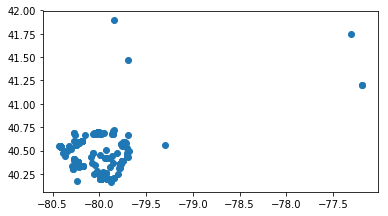

In [223]:
todo_gj.plot()

In [220]:
# Do spatial join to get census block for each address 
# Example from:
#    http://localhost:8820/notebooks/projects/demographics/Census-Planning-DB-2018.ipynb
# mob_blkgroups_gj = gpd.sjoin(blkgrps_cent_gj, mob_gj, how="inner", op='within')
todo_cb_gj = gpd.sjoin(todo_gj, ac_cb_gj, how="inner", op='within')

In [221]:
todo_cb_gj=todo_cb_gj.reset_index()

In [225]:
todo_cb_gj

,index,address_raw,geometry,index_right,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE10,GEOID10,NAME10,MTFCC10,UR10,UACE10,UATYP10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10
0,186,205 BROOK ST MC DONALD PA 15057,POINT (-80.23542999999999 40.37612),8048,42,003,564000,2047,420035640002047,Block 2047,G5040,U,69697,U,S,86275.0,0.0,+40.3779068,-080.2355015


In [226]:
# Process all the newly processed census blocks into canonical_addr_map
process_addrs_to_cb_into_cam(todo_cb_gj)

Processing took 0:00:00.001322 for 1 addresses


In [229]:
list(todo_cb_gj.address_raw)

['205 BROOK ST MC DONALD PA 15057']

In [230]:
# Make a copy of addrs_to_blocks_todo_set to keep track of what addresses are left
# after we process the ones that came back with valid census blocks
failed_census_block_addrs = addrs_to_blocks_todo_set

# Remove all the elements that successfully generated census blocks
map(failed_census_block_addrs.remove, list(todo_cb_gj.address_raw))

# Update the vids in addrs_to_blocks_update_map={}
for addr in addrs_to_blocks_update_map:
    census_block = None
    # Check if this is a failed address
    if addr in failed_census_block_addrs:
        # Record 'census_block'=None in canonical_addr_map if not already recorded
        if(not 'census_block' in canonical_addr_map[addr]):
            canonical_addr_map[addr]['census_block']=None
    else:
        # Make sure addr is in canonical_addr_map
        if(not addr in canonical_addr_map or not 'census_block' in canonical_addr_map[addr]):
            print "ERROR: Trying to find census block for %s, but missing from canonical_addr_map" % (addr)
            continue
        # It is in canonical_addr_map, record the census block
        census_block = canonical_addr_map[addr]['census_block']
        
    # census_block should either be None or set to a valid value, record it in the relevant voter IDs.
    for vid in addrs_to_blocks_update_map[addr]:
        # Make sure vid is in voter_map
        if(not vid in voter_map):
            print "ERROR: Trying to update %s with census block %s, but missing from voter_map " % (vid, census_block)
            continue
        vrec = voter_map[vid]
        if(not 'addr_arr' in vrec):
            print "ERROR: Trying to update %s with census block %s, but 'addr_arr' missing from voter_map " % (vid, census_block)
            continue
        # Find the entry in addr_arr matching this address
        for i in range(0,len(voter_map[vid]['addr_arr'])):
            if(addr == voter_map[vid]['addr_arr'][i]['address']):
                # Matches! Update census block
                voter_map[vid]['addr_arr'][i]['census_block'] = census_block

ERROR: Trying to find census block for 1741 BRODHEAD RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 6203 AUBURN ST PITTSBURGH PA 15206, but missing from canonical_addr_map
ERROR: Trying to find census block for 1303 P PENNSYLVANIA AVE NATRONA HEIGHTS PA 15065, but missing from canonical_addr_map
ERROR: Trying to find census block for 127 DELAWARE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 4609 BRIGHTVIEW AVE W PITTSBURGH PA 15227, but missing from canonical_addr_map
ERROR: Trying to find census block for 119 ARROWHEAD RD PITTSBURGH PA 15237, but missing from canonical_addr_map
ERROR: Trying to find census block for 5200 BRIGHTWOOD RD BETHEL PARK PA 15102, but missing from canonical_addr_map
ERROR: Trying to find census block for 100 HUNTER GARDEN CT VERONA PA 15147, but missing from canonical_addr_map
ERROR: Trying to find census block for 415 LUNAR LN APT MOON TWP PA 15108, but miss

ERROR: Trying to find census block for 7229 BEACON HILL DR PITTSBURGH PA 15221, but missing from canonical_addr_map
ERROR: Trying to find census block for 500 LANG AVE S PITTSBURGH PA 15208, but missing from canonical_addr_map
ERROR: Trying to find census block for 102 GENESSEE ST W PITTSBURGH PA 15223, but missing from canonical_addr_map
ERROR: Trying to find census block for 134 SHEPARD RD GIBSONIA PA 15044, but missing from canonical_addr_map
ERROR: Trying to find census block for 2818 VENTANA DR CORAOPOLIS PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 222 RIVER CREST DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 22 B LONGFELLOW DR MUNHALL PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 97 MAPLE AVE PITTSBURGH PA 15202, but missing from canonical_addr_map
ERROR: Trying to find census block for 1339 HIGH RD JEFFERSON HILLS PA 15025, but missing from canonical

ERROR: Trying to find census block for 3999 OLD WM PENN HWY PITTSBURGH PA 15235, but missing from canonical_addr_map
ERROR: Trying to find census block for 1402 TEAL TRCE PITTSBURGH PA 15237, but missing from canonical_addr_map
ERROR: Trying to find census block for 1 B BLAINE ST PITTSBURGH PA 15226, but missing from canonical_addr_map
ERROR: Trying to find census block for 1965 STATE RTE 908 NATRONA HEIGHTS PA 15065, but missing from canonical_addr_map
ERROR: Trying to find census block for 17 A WHARTON CT PITTSBURGH PA 15203, but missing from canonical_addr_map
ERROR: Trying to find census block for 1374 A WILDWOOD RD GIBSONIA PA 15044, but missing from canonical_addr_map
ERROR: Trying to find census block for 1812 CHESTNUT RIDGE DR PITTSBURGH PA 15205, but missing from canonical_addr_map
ERROR: Trying to find census block for 8 NAYSMITH RD BOX NORTH VERSAILLES PA 15137, but missing from canonical_addr_map
ERROR: Trying to find census block for 240 10TH AVE W TARENTUM PA 15084, but m

ERROR: Trying to find census block for 1640 JEFFERSON RIDGE DR JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 537 RAILROAD AVE E VERONA PA 15147, but missing from canonical_addr_map
ERROR: Trying to find census block for 4821 EMBLEM DR S PITTSBURGH PA 15236, but missing from canonical_addr_map
ERROR: Trying to find census block for 41 BELLECREST AVE W PITTSBURGH PA 15227, but missing from canonical_addr_map
ERROR: Trying to find census block for 115 8TH AVE W TARENTUM PA 15084, but missing from canonical_addr_map
ERROR: Trying to find census block for 320 N GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222, but missing from canonical_addr_map
ERROR: Trying to find census block for 555 NORTH BRANCH RD OAKDALE PA 15071, but missing from canonical_addr_map
ERROR: Trying to find census block for 300 COLONY WEST DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 2355 MASONIC DR SEWICKLEY PA 15143,

ERROR: Trying to find census block for 812 PERRYTOWN PL APT PITTSBURGH PA 15237, but missing from canonical_addr_map
ERROR: Trying to find census block for 635 1/2 NORTH AVE PITTSBURGH PA 15209, but missing from canonical_addr_map
ERROR: Trying to find census block for 101 1ST ST W WEST MIFFLIN PA 15122, but missing from canonical_addr_map
ERROR: Trying to find census block for 1035 MORELLE AVE EAST MC KEESPORT PA 15035, but missing from canonical_addr_map
ERROR: Trying to find census block for 1111 ORIOLE DR E PITTSBURGH PA 15220, but missing from canonical_addr_map
ERROR: Trying to find census block for 315 13TH AVE W HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 114 NIKE RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 4043 STATE RTE 8 ALLISON PARK PA 15101, but missing from canonical_addr_map
ERROR: Trying to find census block for 1100 LOUISE ST MUNHALL PA 15120, but missing from canoni

ERROR: Trying to find census block for 15 PENNRIDGE CT PITTSBURGH PA 15235, but missing from canonical_addr_map
ERROR: Trying to find census block for 300 7TH AVE E TARENTUM PA 15084, but missing from canonical_addr_map
ERROR: Trying to find census block for 1734 STEVENSAN DR SEWICKLEY PA 15143, but missing from canonical_addr_map
ERROR: Trying to find census block for 208 CENTERDALE RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 1903 VENTANA DR CORAOPOLIS PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 22 LUNAR LN APT MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 221 SPRINGER DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 9003 CLUB HOUSE RD PRESTO PA 15142, but missing from canonical_addr_map
ERROR: Trying to find census block for 1012 1ST ST JEFFERSON HILLS PA 15025, but missing from canonical_addr_map

ERROR: Trying to find census block for 1897 BEECHFORD AVE MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 111 DALE ST JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 204 MASON RD TARENTUM PA 15084, but missing from canonical_addr_map
ERROR: Trying to find census block for 225 MAIN ST E CARNEGIE PA 15106, but missing from canonical_addr_map
ERROR: Trying to find census block for 148 ARBOR TRAIL DR MCKEES ROCKS PA 15136, but missing from canonical_addr_map
ERROR: Trying to find census block for 113 CLARIDGE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 205 HIGHLAND AVE S CHESWICK PA 15024, but missing from canonical_addr_map
ERROR: Trying to find census block for 118 PHILOMENA DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 602 LANG AVE S PITTSBURGH PA 15208, but missing from canonical_addr_m

ERROR: Trying to find census block for 96 NOBLESTOWN RD RD1 BOX OAKDALE PA 15071, but missing from canonical_addr_map
ERROR: Trying to find census block for 27810 EVERGREEN RUN IMPERIAL PA 15126, but missing from canonical_addr_map
ERROR: Trying to find census block for 655 8TH AVE W HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 204 HIGHLAND AVE S PITTSBURGH PA 15206, but missing from canonical_addr_map
ERROR: Trying to find census block for 1205 STATE RTE 885 JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 3021 PHILLIP DR JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 953 MONTCLAIR DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 114 ROLLING WOODS DR NORTH VERSAILLES PA 15137, but missing from canonical_addr_map
ERROR: Trying to find census block for 1136 MAPLE ST EXT MOON TWP PA 1510

ERROR: Trying to find census block for 943 WARRINGTON AVE E PITTSBURGH PA 15210, but missing from canonical_addr_map
ERROR: Trying to find census block for 39 PARKVIEW DR JT TR CT CLINTON PA 15026, but missing from canonical_addr_map
ERROR: Trying to find census block for 119 STATE RTE 908 NATRONA HEIGHTS PA 15065, but missing from canonical_addr_map
ERROR: Trying to find census block for 2011 WHITE OAK CT MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 2 K LONGFELLOW DR MUNHALL PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 1508 ALABAMA AVE PITTSBURGH PA 15216, but missing from canonical_addr_map
ERROR: Trying to find census block for 108 BROADWAY AVE N NORTH VERSAILLES PA 15137, but missing from canonical_addr_map
ERROR: Trying to find census block for 95 PROSPECT ST EAST PITTSBURGH PA 15112, but missing from canonical_addr_map
ERROR: Trying to find census block for 334 12TH AVE E HOMESTEAD PA 15120, 

ERROR: Trying to find census block for 322 11TH AVE E HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 47 PARKVIEW DR JT TR CT CLINTON PA 15026, but missing from canonical_addr_map
ERROR: Trying to find census block for 226 KELLY RUN MONONGAHELA PA 15063, but missing from canonical_addr_map
ERROR: Trying to find census block for 409 CRESCENT BLVD PO BOX CRESCENT PA 15046, but missing from canonical_addr_map
ERROR: Trying to find census block for 154 NORTH-SOUTH DR PITTSBURGH PA 15237, but missing from canonical_addr_map
ERROR: Trying to find census block for 5051 EMPIRE DR BRIDGEVILLE PA 15017, but missing from canonical_addr_map
ERROR: Trying to find census block for 4 BLANFORD CT PITTSBURGH PA 15206, but missing from canonical_addr_map
ERROR: Trying to find census block for 3622 1 RIDGEWOOD DR PITTSBURGH PA 15235, but missing from canonical_addr_map
ERROR: Trying to find census block for 210 MCDONALD ST MC DONALD PA 15057, but missing fro

ERROR: Trying to find census block for 133 SCOTTSDALE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 1 A WHARTON CT PITTSBURGH PA 15203, but missing from canonical_addr_map
ERROR: Trying to find census block for 605 PERRYTOWN PL APT PITTSBURGH PA 15237, but missing from canonical_addr_map
ERROR: Trying to find census block for 99 FREMONT AVE S PITTSBURGH PA 15202, but missing from canonical_addr_map
ERROR: Trying to find census block for 140 ALTERMOOR DR NATRONA HEIGHTS PA 15065, but missing from canonical_addr_map
ERROR: Trying to find census block for 114 3RD ST S DUQUESNE PA 15110, but missing from canonical_addr_map
ERROR: Trying to find census block for 877 BEACON LANE PITTSBURGH PA 15237, but missing from canonical_addr_map
ERROR: Trying to find census block for 56 1/2 GARFIELD ST NATRONA HEIGHTS PA 15065, but missing from canonical_addr_map
ERROR: Trying to find census block for 115 SCHUCHERT ST PITTSBURGH PA 15210, but missing f

ERROR: Trying to find census block for 97 STARR AVE N PITTSBURGH PA 15202, but missing from canonical_addr_map
ERROR: Trying to find census block for 4532 WALNUT RIDGE CIR MCDONALD PA 15057, but missing from canonical_addr_map
ERROR: Trying to find census block for 5441 BROAD ST N SOUTH PARK PA 15129, but missing from canonical_addr_map
ERROR: Trying to find census block for 180 COAL VALLEY RD JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 109 CAMINO CT JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 950 HOOKSTOWN-GRADE RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 6 F SCOTT DR DRAVOSBURG PA 15034, but missing from canonical_addr_map
ERROR: Trying to find census block for 6408 JEFFERSON POINTE CIR JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 520 PERRYTOWN PL APT PITTSBURGH PA

ERROR: Trying to find census block for 1422 CORAOPOLIS HTS RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 435 PARK MANOR PL PITTSBURGH PA 15235, but missing from canonical_addr_map
ERROR: Trying to find census block for 3475 1/2 DENNY ST PITTSBURGH PA 15201, but missing from canonical_addr_map
ERROR: Trying to find census block for 121 HAYESWOLD DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 4113 DUCKHORN DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 305 FAIRACRE CT PRESTO PA 15142, but missing from canonical_addr_map
ERROR: Trying to find census block for 108 BONNIE BRAE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 610 GILL HALL RD JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 824 FAIRWAY DR OAKMONT PA 15139, but missing from canon

ERROR: Trying to find census block for 101 WYNGATE RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 425 WYNDHURST DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 206 PARKRIDGE LN MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 1222 SPRING RUN RD EXT MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 505 FAIRACRE CT PRESTO PA 15142, but missing from canonical_addr_map
ERROR: Trying to find census block for 134 DOVER DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 290 MOON CLINTON RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 305 VILLAGE LN DR WEST MIFFLIN PA 15122, but missing from canonical_addr_map
ERROR: Trying to find census block for 3054 SANLIN DR MOON TWP PA 15108, but missing from canonical_addr_ma

ERROR: Trying to find census block for 395 STATE RTE 908 EXT TARENTUM PA 15084, but missing from canonical_addr_map
ERROR: Trying to find census block for 12 E HATTMAN DR CORAOPOLIS PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 548 A FIRETHORNE DR MONROEVILLE PA 15146, but missing from canonical_addr_map
ERROR: Trying to find census block for 1119 MAPLE ST EXT MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 5034 STAGS LEAP LN MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 513 3RD AVE NORTH VERSAILLES PA 15137, but missing from canonical_addr_map
ERROR: Trying to find census block for 308 SCENIC CT MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 233 EDDIE LEWIS DR PITTSBURGH PA 15090, but missing from canonical_addr_map
ERROR: Trying to find census block for 514 8TH AVE E TARENTUM PA 15084, but missing from cano

ERROR: Trying to find census block for 250 1 BOUQUET ST S PITTSBURGH PA 15213, but missing from canonical_addr_map
ERROR: Trying to find census block for 332 CLAVALE DR NORTH VERSAILLES PA 15137, but missing from canonical_addr_map
ERROR: Trying to find census block for 100 TORY RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 78 VINE ST NATRONA HEIGHTS PA 15065, but missing from canonical_addr_map
ERROR: Trying to find census block for 833 FOREST GREEN DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 121 STATE RTE 908 NATRONA HEIGHTS PA 15065, but missing from canonical_addr_map
ERROR: Trying to find census block for 119 VALENTINE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 471 ELKWOOD DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 701 OLD CLAIRTON RD JEFFERSON HILLS PA 15025, but missing 

ERROR: Trying to find census block for 51 GARDEN CT VERONA PA 15147, but missing from canonical_addr_map
ERROR: Trying to find census block for 124 FRANCIS AVE E PITTSBURGH PA 15227, but missing from canonical_addr_map
ERROR: Trying to find census block for 403 PERRYTOWN PL APT PITTSBURGH PA 15237, but missing from canonical_addr_map
ERROR: Trying to find census block for 156 GILL HALL RD JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 154 MARIGOLD ST W MUNHALL PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 120 WHITE TAIL DR JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 1516 STAUNTON DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 905 TALISMAN LN NATRONA HEIGHTS PA 15065, but missing from canonical_addr_map
ERROR: Trying to find census block for 235 ELMORE ST PITTSBURGH PA 15219, but missing fr

ERROR: Trying to find census block for 27 B MIDWAY DR APT BLDG B WEST MIFFLIN PA 15122, but missing from canonical_addr_map
ERROR: Trying to find census block for 60 GLENN WAY MC KEES ROCKS PA 15136, but missing from canonical_addr_map
ERROR: Trying to find census block for 32 MIDWAY DR APT BLDG F WEST MIFFLIN PA 15122, but missing from canonical_addr_map
ERROR: Trying to find census block for 130 ROGERS CT HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 340 FLAUGHERTY RUN RD RD2 MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 167 MIFFLIN ST W HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 323 8TH AVE W TARENTUM PA 15084, but missing from canonical_addr_map
ERROR: Trying to find census block for 345 INDIAN RIDGE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 2004 REED ST PITTSBURGH PA 15219, but mi

ERROR: Trying to find census block for 303 SERENDIPITY DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 1005 SANDHURST DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 345 NEW WORLD DR JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 311 EVALINE ST S PITTSBURGH PA 15224, but missing from canonical_addr_map
ERROR: Trying to find census block for 412 POLO CLUB DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 6009 CLAIRE VALLEY CT JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 505 BONNIE BRAE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 411 PACIFIC AVE S PITTSBURGH PA 15224, but missing from canonical_addr_map
ERROR: Trying to find census block for 407 GRANDVIEW DR VERONA PA 15147, but missin

ERROR: Trying to find census block for 201 BENDIX DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 4122 VALLEYVUE DR GIBSONIA PA 15044, but missing from canonical_addr_map
ERROR: Trying to find census block for 115 ELM LN MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 34 STEUBEN ST W PITTSBURGH PA 15205, but missing from canonical_addr_map
ERROR: Trying to find census block for 2047 LAUREL RIDGE DR JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 5146 EMPIRE DR BRIDGEVILLE PA 15017, but missing from canonical_addr_map
ERROR: Trying to find census block for 141 ELIZABETH ST E PITTSBURGH PA 15207, but missing from canonical_addr_map
ERROR: Trying to find census block for 217 SERENITY DR PITTSBURGH PA 15239, but missing from canonical_addr_map
ERROR: Trying to find census block for 4092 1 MT ROYAL BLVD ALLISON PARK PA 15101, but missing from ca

ERROR: Trying to find census block for 154 WOODFORD AVE E PITTSBURGH PA 15210, but missing from canonical_addr_map
ERROR: Trying to find census block for 579 MOON CLINTON RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 6415 JEFFERSON POINTE CIR JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 219 15TH AVE E HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 4650 STATE RTE 910 ALLISON PARK PA 15101, but missing from canonical_addr_map
ERROR: Trying to find census block for 121 1ST AVE WEST MIFFLIN PA 15122, but missing from canonical_addr_map
ERROR: Trying to find census block for COTTAGE ST CURTISVILLE PA 15032, but missing from canonical_addr_map
ERROR: Trying to find census block for 608 VILLAGE LN DR WEST MIFFLIN PA 15122, but missing from canonical_addr_map
ERROR: Trying to find census block for 912 JESSICA CIR OAKDALE PA 15071, but missin

ERROR: Trying to find census block for 154 MARIGOLD ST E MUNHALL PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 68 BAYHILL DR BRIDGEVILLE PA 15017, but missing from canonical_addr_map
ERROR: Trying to find census block for 708 CULLODEN CT MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 136 D WATSON DR TURTLE CREEK PA 15145, but missing from canonical_addr_map
ERROR: Trying to find census block for 23 B MIDWAY DR APT BLDG B WEST MIFFLIN PA 15122, but missing from canonical_addr_map
ERROR: Trying to find census block for 104 PENNVIEW ST W PITTSBURGH PA 15223, but missing from canonical_addr_map
ERROR: Trying to find census block for 106 WYNGATE RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 210 TIMBERYOKE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 119 NORTH-SOUTH DR PITTSBURGH PA 15237, but missing from

ERROR: Trying to find census block for 4207 DOG LEG DR PRESTO PA 15142, but missing from canonical_addr_map
ERROR: Trying to find census block for 125 SHEPARD RD GIBSONIA PA 15044, but missing from canonical_addr_map
ERROR: Trying to find census block for 105 BECKS RUN RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 6202 LANDING LN MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 209 SERENITY DR PITTSBURGH PA 15239, but missing from canonical_addr_map
ERROR: Trying to find census block for 411 PAYNE HILL RD JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 250 1 INGLEWOOD DR PITTSBURGH PA 15228, but missing from canonical_addr_map
ERROR: Trying to find census block for 128 MILL ST EXT TARENTUM PA 15084, but missing from canonical_addr_map
ERROR: Trying to find census block for 702 OVERLOOK PL MC KEES ROCKS PA 15136, but missing from canonical_

ERROR: Trying to find census block for 807 STONELEA ST PITTSBURGH PA 15212, but missing from canonical_addr_map
ERROR: Trying to find census block for 44 HARRISON AVE N PITTSBURGH PA 15202, but missing from canonical_addr_map
ERROR: Trying to find census block for 5446 LANTERN HILL DR EXT PITTSBURGH PA 15236, but missing from canonical_addr_map
ERROR: Trying to find census block for 11 ESMOND CT PITTSBURGH PA 15206, but missing from canonical_addr_map
ERROR: Trying to find census block for 112 OLDE MANOR LN MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 300 STATE RTE 909 VERONA PA 15147, but missing from canonical_addr_map
ERROR: Trying to find census block for 253 STATE RTE 908 NATRONA HEIGHTS PA 15065, but missing from canonical_addr_map
ERROR: Trying to find census block for 70 HARRISON ST GLASSPORT PA 15045, but missing from canonical_addr_map
ERROR: Trying to find census block for 463 STARZ RD W CHESWICK PA 15024, but missing from can

ERROR: Trying to find census block for 21 WOODFORD AVE W PITTSBURGH PA 15210, but missing from canonical_addr_map
ERROR: Trying to find census block for 315 PRIMROSE LN NATRONA HEIGHTS PA 15065, but missing from canonical_addr_map
ERROR: Trying to find census block for 2038 CONNECTICUT LN SEWICKLEY PA 15143, but missing from canonical_addr_map
ERROR: Trying to find census block for 2921 GAS ST MC KEESPORT PA 15132, but missing from canonical_addr_map
ERROR: Trying to find census block for 115 MOONCREST DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 58 PROSPECT ST EAST PITTSBURGH PA 15112, but missing from canonical_addr_map
ERROR: Trying to find census block for 243 SCHWAB AVE W MUNHALL PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 204 WINCHESTER DR PITTSBURGH PA 15239, but missing from canonical_addr_map
ERROR: Trying to find census block for 6150 STATION ST PITTSBURGH PA 15206, but missing from c

ERROR: Trying to find census block for 4 E MIDWAY DR APT BLDG E WEST MIFFLIN PA 15122, but missing from canonical_addr_map
ERROR: Trying to find census block for 214 LYTTON RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 322 HOME AVE S PITTSBURGH PA 15202, but missing from canonical_addr_map
ERROR: Trying to find census block for 238 SERENITY DR PITTSBURGH PA 15239, but missing from canonical_addr_map
ERROR: Trying to find census block for 329 HAMILTON AVE HARWICK PA 15049, but missing from canonical_addr_map
ERROR: Trying to find census block for 632 GARFIELD AVE HEIDELBERG PA 15106, but missing from canonical_addr_map
ERROR: Trying to find census block for 322 14TH AVE W HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 214 MILLER AVE W MUNHALL PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 229 LARKSPUR ST W MUNHALL PA 15120, but missing from canonical_a

ERROR: Trying to find census block for 5004 JACKSON DR JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 807 E PGH-MCKEESPORT BLVD NORTH VERSAILLES PA 15137, but missing from canonical_addr_map
ERROR: Trying to find census block for 3827 NORTHERN PIKE MONROEVILLE PA 15146, but missing from canonical_addr_map
ERROR: Trying to find census block for 3046 STATE RTE 885 CLAIRTON RD WEST MIFFLIN PA 15122, but missing from canonical_addr_map
ERROR: Trying to find census block for 18 MCINTYRE AVE W PITTSBURGH PA 15214, but missing from canonical_addr_map
ERROR: Trying to find census block for 2302 MYRTLE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 187 PILLAR DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 302 10TH ST SHARPSBURG PA 15215, but missing from canonical_addr_map
ERROR: Trying to find census block for 220 ATLANTIC AVE S PITTSBURGH PA

ERROR: Trying to find census block for 105 PROSPECT TERR E PITTSBURGH PA 15112, but missing from canonical_addr_map
ERROR: Trying to find census block for 443 N LEWIS RUN WEST MIFFLIN PA 15122, but missing from canonical_addr_map
ERROR: Trying to find census block for 233 LYTTON RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 346 13TH AVE W HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 667 STATE RTE 908 EXT TARENTUM PA 15084, but missing from canonical_addr_map
ERROR: Trying to find census block for 1111 MAPLE ST EXT MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 62 A CRAWFORD VLG MC KEESPORT PA 15132, but missing from canonical_addr_map
ERROR: Trying to find census block for 52 BELLECREST AVE W PITTSBURGH PA 15227, but missing from canonical_addr_map
ERROR: Trying to find census block for 9307 LANDING LN MOON TWP PA 15108, but missing from ca

ERROR: Trying to find census block for 3451 RIDGE RD JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 1361 HILDA ST EAST MC KEESPORT PA 15035, but missing from canonical_addr_map
ERROR: Trying to find census block for 1122 EAGLES NEST LN MONROEVILLE PA 15146, but missing from canonical_addr_map
ERROR: Trying to find census block for 112 SOUTH PATTON DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 504 WESTINGHOUSE AVE NORTH VERSAILLES PA 15137, but missing from canonical_addr_map
ERROR: Trying to find census block for 501 LANG AVE S PITTSBURGH PA 15208, but missing from canonical_addr_map
ERROR: Trying to find census block for 908 TOTTENHAM DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 320 LINDEN AVE S PITTSBURGH PA 15208, but missing from canonical_addr_map
ERROR: Trying to find census block for 10 B BRUNO DR INDIANOLA PA 15051, but mis

ERROR: Trying to find census block for 261 BECKS RUN RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 547 B 7TH AVE W HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 143 LARKSPUR ST W MUNHALL PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 122 8TH AVE W HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 506 BONNIE BRAE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 1651 VILLAGE GREEN DR JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 3008 THOMAS JEFFERSON DR JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 242 MILLVALE AVE S PITTSBURGH PA 15224, but missing from canonical_addr_map
ERROR: Trying to find census block for 104 SPYGLASS DR PITTSBURGH PA 15229, but m

ERROR: Trying to find census block for 112 MAIN ST N SHARPSBURG PA 15215, but missing from canonical_addr_map
ERROR: Trying to find census block for 3020 PHILLIP DR JEFFERSON HILLS PA 15025, but missing from canonical_addr_map
ERROR: Trying to find census block for 222 16TH AVE E HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 410 CANTERBURY CIR CARNEGIE PA 15106, but missing from canonical_addr_map
ERROR: Trying to find census block for 703 NOBLESTOWN RD RD1 BOX OAKDALE PA 15071, but missing from canonical_addr_map
ERROR: Trying to find census block for 2147 MASONIC DR SEWICKLEY PA 15143, but missing from canonical_addr_map
ERROR: Trying to find census block for 305 PRIMROSE LN NATRONA HEIGHTS PA 15065, but missing from canonical_addr_map
ERROR: Trying to find census block for 620 BONNIE BRAE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 28 MEYERS ST W PITTSBURGH PA 15210, but missing fro

ERROR: Trying to find census block for 415 POLO CLUB DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 1063 A BRACKENRIDGE AVE BRACKENRIDGE PA 15014, but missing from canonical_addr_map
ERROR: Trying to find census block for 100 LINWOOD AVE S PITTSBURGH PA 15205, but missing from canonical_addr_map
ERROR: Trying to find census block for 2023 LAFAYETTE ST SWISSVALE PA 15218, but missing from canonical_addr_map
ERROR: Trying to find census block for 214 14TH AVE E HOMESTEAD PA 15120, but missing from canonical_addr_map
ERROR: Trying to find census block for 201 SANTA ANNA DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 54 GARDEN CT VERONA PA 15147, but missing from canonical_addr_map
ERROR: Trying to find census block for 1505 GREYSTONE DR MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 1533 STAUNTON DR MOON TWP PA 15108, but missing from canonical

ERROR: Trying to find census block for 408 KELLYWOOD MNR NEW KENSINGTON PA 15068, but missing from canonical_addr_map
ERROR: Trying to find census block for 1656 CHARLTON HTS RD MOON TWP PA 15108, but missing from canonical_addr_map
ERROR: Trying to find census block for 520 10TH AVE E TARENTUM PA 15084, but missing from canonical_addr_map
ERROR: Trying to find census block for 805 WHITESIDE RD PITTSBURGH PA 15219, but missing from canonical_addr_map
ERROR: Trying to find census block for 165 NORTH-SOUTH DR PITTSBURGH PA 15237, but missing from canonical_addr_map
ERROR: Trying to find census block for 2614 BELMAR PL SWISSVALE PA 15218, but missing from canonical_addr_map
ERROR: Trying to find census block for 7306 RIVER FRONT DR PITTSBURGH PA 15238, but missing from canonical_addr_map


In [233]:
'1741 BRODHEAD RD MOON TWP PA 15108' in addrs_to_blocks_update_map

True

In [231]:
failed_census_block_addrs

{'10 BEECH ST AMBRIDGE PA 15003',
 '10 NOBLESTOWN RD OAKDALE PA 15071',
 '10 RIDGE RD RD1 MARS PA 16046',
 '100 RIDGE RD MONONGAHELA PA 15063',
 '100 RIDGE RD RD1 MARS PA 16046',
 '1005 CONOVER DR NEW KENSINGTON PA 15068',
 '101 HILL ST MC DONALD PA 15057',
 '101 HILL ST MCDONALD PA 15057',
 '101 PLEASANT RISE DR MC DONALD PA 15057',
 '101 PLEASANT RISE DR MCDONALD PA 15057',
 '101 RIDGE RD MONONGAHELA PA 15063',
 '102 MONTROSE AVE FREEPORT PA 16229',
 '1035 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143',
 '1036 OLD ORCHARD CT GIBSONIA PA 15044',
 '1039 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143',
 '104 RIDGE RD MONONGAHELA PA 15063',
 '105 GRANT ST MCDONALD PA 15057',
 '106 DAVIS LN SEWICKLEY PA 15143',
 '106 HIMALAYA RD MONROEVILLE PA 15146',
 '1081 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143',
 '109 RIDGE RD MONONGAHELA PA 15063',
 '110 GRANT ST MCDONALD PA 15057',
 '110 HIMALAYA RD MONROEVILLE PA 15146',
 '1109 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143',
 '112 HIMALAYA RD MONROEVILLE PA 1

In [235]:
canonical_addr_map['1741 BRODHEAD RD MOON TWP PA 15108']

KeyError: '1741 BRODHEAD RD MOON TWP PA 15108'

In [239]:
# Add failed_census_block_addrs to uncomputable_census_block_addrs_set
uncomputable_census_block_addrs_set = uncomputable_census_block_addrs_set.union(failed_census_block_addrs)
print "Added %d addrs to uncomputable_census_block_addrs_set, size now %d" % (len(failed_census_block_addrs), len(uncomputable_census_block_addrs_set))

Added 268 addrs to uncomputable_census_block_addrs_set, size now 268


In [240]:
# Reset TODO related variables to be empty
addrs_to_blocks_todo_set=set()
addrs_to_blocks=[]
coords_to_blocks=[]
addrs_to_blocks_update_map={}


In [196]:
# From ~/education/earthtime/voting/update_vids_in_addrs_to_blocks_update_map_out.txt
# These appear to be addresses that did not match to any of the census blocks
reprocess_addrs = ['14 BEECH ST AMBRIDGE PA 15003',
'245 ERMA ST RD1 MONONGAHELA PA 15063',
'915 INDIANA AVE GLASSPORT PA 15045',
'234 CENTER AVE CECIL PA 15321',
'896 CLINTON FRANKFORT RD BOX CLINTON PA 15026',
'1036 OLD ORCHARD CT GIBSONIA PA 15044',
'1268 US ROUTE 30 CLINTON PA 15026',
'124 FINLEYVILLE R D 4 BOX FINLEYVILLE PA 15332',
'501 EASTVIEW DR IRWIN PA 15642',
'491 EASTVIEW DR IRWIN PA 15642',
'320 MILLERS-HILL RD RD2 BOX NEW KENSINGTON PA 15068',
'78 BEECH ST AMBRIDGE PA 15003',
'131 MAIN ST PO BOX RUSSELLTON PA 15076',
'277 STATE RTE 30 CLINTON PA 15026',
'1171 CAMBIER DR CRESCENT PA 15046',
'187 AIRPORT RD BELLE VERNON PA 15012',
'170 OLD JACKS RUN RD IRWIN PA 15642',
'106 DAVIS LN SEWICKLEY PA 15143',
'LOGANS FERRY RD NEW KENSINGTON PA 15068',
'405 PATRICKS PL MARS PA 16046',
'100 RIDGE RD RD1 MARS PA 16046',
'14 BEAVER ST AMBRIDGE PA 15003',
'2734 MILFORD DR BETHEL PARK PA 15102',
'961 CLINTON FRANKFORT RD BOX CLINTON PA 15026',
'205 BROOK ST MC DONALD PA 15057',
'101 PLEASANT RISE DR MCDONALD PA 15057',
'6 BEECH ST AMBRIDGE PA 15003',
'110 HIMALAYA RD MONROEVILLE PA 15146',
'337 COAL ST MCDONALD PA 15057',
'513 TUSCARORA RD MARS PA 16046',
'302 STATE RTE 8 BOX BAKERSTOWN PA 15007',
'162 RICHLAND MOBILE HOME PARK GIBSONIA PA 15044',
'FOX HILL BLACKBURN RD SEWICKLEY PA 15143',
'648 MILLERS RUN RD CECIL PA 15321',
'257 COLLINS AVE P O BOX CLAIRTON PA 15025',
'533 5TH ST TRAFFORD PA 15085',
'139 CHRISTY RD BOX TARENTUM PA 15084',
'STATE RTE 136 RD3 BOX MONONGAHELA PA 15063',
'1963 LINCOLN HWY NORTH VERSAILLES PA 15137',
'2100 SHORT ST FINLEYVILLE PA 15332',
'147 STATE RTE 30 CLINTON PA 15026',
'206 STATE RTE 51 RD4 BOX ELIZABETH PA 15037',
'500 BEAGLE CLUB RD MCDONALD PA 15057',
'1252 STATE RTE 30 CLINTON PA 15026',
'126 WOODLAWN AVE CECIL PA 15321',
'81 RIDGE RD MONONGAHELA PA 15063',
'224 RIDGE RD RD1 MARS PA 16046',
'22 FORBES RD TRAFFORD PA 15085',
'105 GRANT ST MCDONALD PA 15057',
'51 CHARLES ST CECIL PA 15321',
'4117 WINTERBURN AVE PITTSBURGH PA 15207',
'476 BEAGLE CLUB RD MC DONALD PA 15057',
'3780 FAIRVIEW DR MURRYSVILLE PA 15668',
'128 WOODLAWN AVE CECIL PA 15321',
'4 KRISTOFF LN MCDONALD PA 15057',
'145 RIDGE RD MONONGAHELA PA 15063',
'1385 STATE RTE 30 CLINTON PA 15026',
'979 CLINTON FRANKFORT RD BOX CLINTON PA 15026',
'1248 US ROUTE 30 CLINTON PA 15026',
'4305 WINTERBURN AVE PITTSBURGH PA 15207',
'5066 IMPALA DR PITTSBURGH PA 15239',
'172 CANNON HILL RD SAXONBURG PA 16056',
'1285 STATE RTE 30 CLINTON PA 15026',
'404 PATRICKS PL MARS PA 16046',
'119 RIDGE RD MONONGAHELA PA 15063',
'8 BEECH ST AMBRIDGE PA 15003',
'3401 LOGANS FERRY RD MURRYSVILLE PA 15668',
'590 OLD JACKS RUN RD IRWIN PA 15642',
'1971 GREENSBURG RD NEW KENSINGTON PA 15068',
'678 PRINCETON BLVD PITTSBURGH PA 15221',
'1297 STATE RTE 30 CLINTON PA 15026',
'1281 STATE RTE 30 CLINTON PA 15026',
'4 BEECH ST AMBRIDGE PA 15003',
'114 RIDGE RD MONONGAHELA PA 15063',
'1282 STATE RTE 30 CLINTON PA 15026',
'131 RIDGE RD MONONGAHELA PA 15063',
'1368 STATE RTE 30 CLINTON PA 15026',
'2 CENTER AVE RD1 BOX MONONGAHELA PA 15063',
'138 HIGH ST MC DONALD PA 15057',
'1035 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143',
'123 RIDGE RD MONONGAHELA PA 15063',
'218 MONONGAHELA R D MONONGAHELA PA 15063',
'2900 COULTERVILLE RD MCKEESPORT PA 15131',
'476 BEAGLE CLUB RD MCDONALD PA 15057',
'181 ROBINSON RUN RD RD6 MCDONALD PA 15057',
'242 BLYTHE RD BOX MCDONALD PA 15057',
'185 GAYDOS LN SEWICKLEY PA 15143',
'490 OLD JACKS RUN RD IRWIN PA 15642',
'864 HILL ST NEW KENSINGTON PA 15068',
'54 CHARLES ST CECIL PA 15321',
'106 HIMALAYA RD MONROEVILLE PA 15146',
'230 CENTER AVE CECIL PA 15321',
'MANOWN RD PO BOX MONONGAHELA PA 15063',
'2104 SHORT ST FINLEYVILLE PA 15332',
'527 5TH ST TRAFFORD PA 15085',
'1039 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143',
'44 ROBINSON RUN RD MC DONALD PA 15057',
'347 CENTER AVE MCDONALD PA 15057',
'116 RIDGE RD MONONGAHELA PA 15063',
'715 SCHOOL ST MC KEES ROCKS PA 15136',
'188 STATE RTE 136 RD3 BOX MONONGAHELA PA 15063',
'201 WARRENDALE RD MARS PA 16046',
'339 COAL ST MCDONALD PA 15057',
'1005 CONOVER DR NEW KENSINGTON PA 15068',
'225 STATE RTE 136 RD3 BOX MONONGAHELA PA 15063',
'215 KIRKWOOD DR PITTSBURGH PA 15215',
'142 CHRISTY RD TARENTUM PA 15084',
'236 CENTER AVE CECIL PA 15321',
'135 RIDGE RD MONONGAHELA PA 15063',
'164 CANNON HILL RD SAXONBURG PA 16056',
'10 NOBLESTOWN RD OAKDALE PA 15071',
'1360 US ROUTE 30 CLINTON PA 15026',
'337 CENTER AVE MC DONALD PA 15057',
'116 GRANT ST MC DONALD PA 15057',
'134 CHRISTY RD BOX TARENTUM PA 15084',
'113 RIDGE RD MONONGAHELA PA 15063',
'122 WOODLAWN AVE CECIL PA 15321',
'1285 US ROUTE 30 CLINTON PA 15026',
'1927 DIXIE LN MONONGAHELA PA 15063',
'118 RIDGE RD MONONGAHELA PA 15063',
'2 KRISTOFF LN MC DONALD PA 15057',
'491 OLD JACKS RUN RD IRWIN PA 15642',
'110 GRANT ST MCDONALD PA 15057',
'4218 LOGANS FERRY RD MURRYSVILLE PA 15668',
'145 STATE RTE 8 BOX VALENCIA PA 16059',
'343 COAL ST MCDONALD PA 15057',
'65 RIDGE RD MONONGAHELA PA 15063',
'118 WOODLAWN AVE CECIL PA 15321',
'WARRENDALE AMBRIDGE RD BADEN PA 15005',
'102 MONTROSE AVE FREEPORT PA 16229',
'116 HIMALAYA RD MONROEVILLE PA 15146',
'330 DEER CREEK RD GIBSONIA PA 15044',
'814 WETTACH ST PITTSBURGH PA 15212',
'120 WOODLAWN AVE CECIL PA 15321',
'325 COAL ST MCDONALD PA 15057',
'500 BEAGLE CLUB RD MC DONALD PA 15057',
'115 GRANT ST MCDONALD PA 15057',
'178 AIRPORT RD BELLE VERNON PA 15012',
'219 STATE RTE 136 RD3 BOX MONONGAHELA PA 15063',
'1132 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143',
'67 ROBINSON RUN RD MC DONALD PA 15057',
'109 RIDGE RD MONONGAHELA PA 15063',
'144 CENTER AVE CECIL PA 15321',
'238 STATE RTE 51 FINLEYVILLE PA 15332',
'95 GLASGOW RD RD1 BOX VALENCIA PA 16059',
'1787 SILLVIEW DR PITTSBURGH PA 15243',
'1272 US ROUTE 30 CLINTON PA 15026',
'208 TECH RD PITTSBURGH PA 15205',
'327 COAL ST MC DONALD PA 15057',
'226 CENTER AVE CECIL PA 15321',
'1109 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143',
'2821 BEECHWOOD BLVD PITTSBURGH PA 15217',
'WALKER RD RD MCDONALD PA 15057',
'60 CHARLES ST CECIL PA 15321',
'150 WILDFLOWER LN MARS PA 16046',
'36 BLYTHEDALE (BAD ADD) BLYTHDALE PA 15013',
'1370 STEWART RD MC DONALD PA 15057',
'184 ALDER ST RD3 BOX TARENTUM PA 15084',
'1270 STATE RTE 30 CLINTON PA 15026',
'404 MARBLE DR CRESCENT PA 15046',
'450 OLD JACKS RUN RD IRWIN PA 15642',
'71 STATE RTE 136 RD3 BOX MONONGAHELA PA 15063',
'236 STATE RTE 51 FINLEYVILLE PA 15332',
'196 WILMOT ST DUQUESNE PA 15110',
'126 RIDGE RD MONONGAHELA PA 15063',
'1081 BIG SEWICKLEY CREEK RD SEWICKLEY PA 15143',
'298 STATE RTE 136 RD3 BOX MONONGAHELA PA 15063',
'16 BEAVER ST AMBRIDGE PA 15003',
'100 RIDGE RD MONONGAHELA PA 15063',
'1929 DIXIE LN MONONGAHELA PA 15063',
'1360 STEWART RD MCDONALD PA 15057',
'2020 SNOWDEN RD FINLEYVILLE PA 15332',
'BLYTHEDALE (BAD ADD) BLYTHDALE PA 15013',
'245 KRAMER RD SOUTH PARK PA 15129',
'335 STATE RTE 136 RD3 BOX MONONGAHELA PA 15063',
'3629 LOGANS FERRY RD MURRYSVILLE PA 15668',
'52 STATE RTE 136 RD3 BOX MONONGAHELA PA 15063',
'245 SPRING ST MCDONALD PA 15057',
'538 BEAGLE CLUB RD MC DONALD PA 15057',
'1469 STATE RTE 30 CLINTON PA 15026',
'BROADHEAD TR CT LOT CORAOPOLIS PA 15108',
'PARK RD CECIL PA 15321',
'400 OLD JACKS RUN RD IRWIN PA 15642',
'1282 US ROUTE 30 CLINTON PA 15026',
'1926 DIXIE LN MONONGAHELA PA 15063',
'1963 BLYTHEDALE RD BUENA VISTA PA 15018',
'27 MAIN ST MCDONALD PA 15057',
'538 BEAGLE CLUB RD MCDONALD PA 15057',
'351 STATE RTE 30 CLINTON PA 15026',
'43 STATE RTE 136 RD3 BOX MONONGAHELA PA 15063',
'403 PATRICKS PL MARS PA 16046',
'104 RIDGE RD MONONGAHELA PA 15063',
'204 CRESCENT GARDEN DR PITTSBURGH PA 15235',
'228 CENTER AVE CECIL PA 15321',
'67 STATE RTE 8 BOX VALENCIA PA 16059',
'2020 HOOKSTOWN GRADE RD CLINTON PA 15026',
'203 WARRENDALE RD MARS PA 16046',
'60 DODDS AVE VALENCIA PA 16059',
'4 KRISTOFF LN MC DONALD PA 15057',
'1557 STATE RTE 30 CLINTON PA 15026',
'421 OLD JACKS RUN RD IRWIN PA 15642',
'139 STATE RTE 906 RD ELIZABETH PA 15037',
'543 5TH ST TRAFFORD PA 15085',
'345 SUNSET DR BADEN PA 15005',
'7536 MELROSE ST PITTSBURGH PA 15218',
'114 HIMALAYA RD MONROEVILLE PA 15146',
'2955 COULTERVILLE RD MCKEESPORT PA 15131',
'24 BEECH ST AMBRIDGE PA 15003',
'1270 US ROUTE 30 CLINTON PA 15026',
'1281 US ROUTE 30 CLINTON PA 15026',
'500 CENTER AVE CECIL PA 15321',
'234 RIDGE RD RD1 MARS PA 16046',
'1360 STATE RTE 30 CLINTON PA 15026',
'1223 COLLINS AVE JEFFERSON HILLS PA 15025',
'204 WARRENDALE RD MARS PA 16046',
'451 OLD JACKS RUN RD IRWIN PA 15642',
'323 COAL ST MCDONALD PA 15057',
'51 DEER CREEK RD GIBSONIA PA 15044',
'551 5TH ST TRAFFORD PA 15085',
'392 MILLERS RUN RD MORGAN PA 15064',
'508 TUSCARORA RD MARS PA 16046',
'130 RIDGE RD MONONGAHELA PA 15063',
'53 RIDGE RD MONONGAHELA PA 15063',
'57 RIDGE RD VALENCIA PA 16059',
'112 HIMALAYA RD MONROEVILLE PA 15146',
'289 CHARLES ST CECIL PA 15321',
'330 CENTER AVE MCDONALD PA 15057',
'101 PLEASANT RISE DR MC DONALD PA 15057',
'1403 STATE RTE 30 CLINTON PA 15026',
'78 STATE RTE 136 RD3 BOX MONONGAHELA PA 15063',
'97 BOCKTOWN RD RD1 BOX CLINTON PA 15026',
'369 OLD JACKS RUN RD IRWIN PA 15642',
'67 ROBINSON RUN RD MCDONALD PA 15057',
'1213 COLLINS AVE JEFFERSON HILLS PA 15025',
'8 CLINTON BOCKTOWN RD CLINTON PA 15026',
'1477 STATE RTE 30 CLINTON PA 15026',
'481 EASTVIEW DR IRWIN PA 15642',
'101 HILL ST MC DONALD PA 15057',
'200 WARRENDALE RD MARS PA 16046',
'1283 STATE RTE 30 CLINTON PA 15026',
'440 OLD JACKS RUN RD IRWIN PA 15642',
'202 WARRENDALE RD MARS PA 16046',
'2 KRISTOFF LN MCDONALD PA 15057',
'101 HILL ST MCDONALD PA 15057',
'212 CRAWFORD CT MARS PA 16046',
'508 SCENIC RIDGE DR FINLEYVILLE PA 15332',
'715 SCHOOL ST MCKEES ROCKS PA 15136',
'330 CENTER AVE MC DONALD PA 15057',
'10 RIDGE RD RD1 MARS PA 16046',
'123 STATE RTE 30 CLINTON PA 15026',
'44 ROBINSON RUN RD MCDONALD PA 15057',
'2 BEECH ST AMBRIDGE PA 15003',
'114 GRANT ST MCDONALD PA 15057',
'337 CENTER AVE MCDONALD PA 15057',
'232 CENTER AVE CECIL PA 15321',
'1136 US ROUTE 30 CLINTON PA 15026',
'402 SOUTHPOINT CT MCDONALD PA 15057',
'7 2ND ST PITTSBURGH PA 15215',
'535 5TH ST TRAFFORD PA 15085',
'1268 STATE RTE 30 CLINTON PA 15026',
'240 BLYTHE RD BOX MCDONALD PA 15057',
'499 CENTER AVE CECIL PA 15321',
'10 BEECH ST AMBRIDGE PA 15003',
'273 BOCKTOWN RD PO BOX CRESCENT PA 15046',
'215 STATE RTE 136 RD3 BOX MONONGAHELA PA 15063',
'201 MURRYSVILLE RD NEW KENSINGTON PA 15068',
'CHRISTY COR NEW KENSINGTON PA 15068',
'101 RIDGE RD MONONGAHELA PA 15063',
'1280 US ROUTE 30 CLINTON PA 15026']


In [200]:
reprocess_vids = set()

In [208]:
for this_addr in reprocess_addrs:
    map(reprocess_vids.add,addrs_to_blocks_update_map[this_addr])

In [210]:
len(reprocess_vids)

474

In [212]:
voter_process_address_history_array(list(reprocess_vids),True)

Processing took 0:00:00.038317 for 474 addresses


# Test voter_process_address_history_array components

In [86]:
voter_map[voter_map.keys()[0]]={'DOB': '1/8/1944',
 'addresses': {'2009-07': '415 CHESTNUT ST SPRINGDALE PA 15144',
  '2017-11': '415 CHESTNUT ST SPRINGDALE PA 15144',
  '2018-03': '415 CHESTNUT ST SPRINGDALE PA 15144',
  '2018-08': '415 CHESTNUT ST SPRINGDALE PA 15144'},
 'reg_date': datetime.datetime(1993, 4, 1, 0, 0),
 'reg_info': {'2009-07': {'party': 'D', 'status': 'A'},
  '2017-11': {'party': 'D', 'status': 'A'},
  '2018-03': {'party': 'D', 'status': 'A'},
  '2018-08': {'party': 'D', 'status': 'A'}}}

In [119]:
voter_map[voter_map.keys()[3]]={'DOB': '8/29/1972',
 'addresses': {'2009-07': '1500 SUGARLOAF DR PITTSBURGH PA 15239',
  '2017-11': '3014 SETTLERS CT MURRYSVILLE PA 15668',
  '2018-03': '3014 SETTLERS CT MURRYSVILLE PA 15668',
  '2018-08': '509 OCTOBER CT PLUM PA 15239'},
 'reg_date': datetime.datetime(1990, 10, 1, 0, 0),
 'reg_info': {'2009-07': {'party': 'R', 'status': 'A'},
  '2017-11': {'party': 'R', 'status': 'A'},
  '2018-03': {'party': 'R', 'status': 'A'},
  '2018-08': {'party': 'R', 'status': 'A'}}}

In [120]:
i=3
voter_map[voter_map.keys()[i]]

{'DOB': '8/29/1972',
 'addresses': {'2009-07': '1500 SUGARLOAF DR PITTSBURGH PA 15239',
  '2017-11': '3014 SETTLERS CT MURRYSVILLE PA 15668',
  '2018-03': '3014 SETTLERS CT MURRYSVILLE PA 15668',
  '2018-08': '509 OCTOBER CT PLUM PA 15239'},
 'reg_date': datetime.datetime(1990, 10, 1, 0, 0),
 'reg_info': {'2009-07': {'party': 'R', 'status': 'A'},
  '2017-11': {'party': 'R', 'status': 'A'},
  '2018-03': {'party': 'R', 'status': 'A'},
  '2018-08': {'party': 'R', 'status': 'A'}}}

In [127]:
voter_process_address_history(voter_map.keys()[i], True)

[{'address': '1500 SUGARLOAF DR PITTSBURGH PA 15239',
  'census_block': u'420035263012005',
  'date': datetime.datetime(1990, 10, 1, 0, 0)},
 {'address': '3014 SETTLERS CT MURRYSVILLE PA 15668',
  'date': datetime.datetime(2017, 11, 30, 0, 0)},
 {'address': '509 OCTOBER CT PLUM PA 15239',
  'census_block': None,
  'date': datetime.datetime(2018, 8, 14, 0, 0)}]

In [153]:
voter_map[voter_map.keys()[3]]

{'DOB': '8/29/1972',
 'addr_arr': [{'address': '1500 SUGARLOAF DR PITTSBURGH PA 15239',
   'census_block': u'420035263012005',
   'date': datetime.datetime(1990, 10, 1, 0, 0)},
  {'address': '3014 SETTLERS CT MURRYSVILLE PA 15668',
   'census_block': u'420035263011014',
   'date': datetime.datetime(2017, 11, 30, 0, 0)},
  {'address': '509 OCTOBER CT PLUM PA 15239',
   'census_block': None,
   'date': datetime.datetime(2018, 8, 14, 0, 0)}],
 'addresses': {'2009-07': '1500 SUGARLOAF DR PITTSBURGH PA 15239',
  '2017-11': '3014 SETTLERS CT MURRYSVILLE PA 15668',
  '2018-03': '3014 SETTLERS CT MURRYSVILLE PA 15668',
  '2018-08': '509 OCTOBER CT PLUM PA 15239'},
 'reg_date': datetime.datetime(1990, 10, 1, 0, 0),
 'reg_info': {'2009-07': {'party': 'R', 'status': 'A'},
  '2017-11': {'party': 'R', 'status': 'A'},
  '2018-03': {'party': 'R', 'status': 'A'},
  '2018-08': {'party': 'R', 'status': 'A'}}}

In [129]:
addrs_to_blocks_todo_set

{'3014 SETTLERS CT MURRYSVILLE PA 15668'}

In [130]:
addrs_to_blocks

['3014 SETTLERS CT MURRYSVILLE PA 15668']

In [131]:
coords_to_blocks

In [132]:
addrs_to_blocks_update_map

{'3014 SETTLERS CT MURRYSVILLE PA 15668': {'002323758-02'}}

# Generate random points in census blocks

In [155]:
# From http://localhost:8820/notebooks/projects/demographics/Get%20random%20census%20block%20points%20from%20prototiles.ipynb
import numpy as np
numpy_record_type = [('x','<f4'), ('y','<f4'), ('blockIdx', '<i4'), ('subIdx', '<i4')]
all_pts = np.memmap('prototiles/master-sorted-by-block.bin', dtype=numpy_record_type)

def find_point_idx(block_idx):
    min_idx = 0
    max_idx = len(all_pts)
    while min_idx < max_idx:
        test_idx = int((min_idx + max_idx) / 2)
        if block_idx > all_pts[test_idx][2]:
            min_idx = test_idx + 1
        elif block_idx < all_pts[test_idx][2] or all_pts[test_idx][3] != 0:
            max_idx = test_idx - 1
        else:
            return test_idx

        
def block_points(block_idx):
    ret = []
    idx = find_point_idx(block_idx)
    print idx
    if idx != None:
        while idx < len(all_pts):
            if all_pts[idx][2] == block_idx:
                ret.append({'x':all_pts[idx][0], 'y':all_pts[idx][1]})
            else:
                break
            idx += 1
    return ret

In [156]:
# For each census block, keep track of what voter each index has been assigned to
# Top level key is census block number, secondary key is 'next' for keeping track of the next index to be assigned,
# 'points' for the value returned by block_points, and voter ID: index for other entries
block_id_use_map={}

In [157]:
# Is block_idx the same as int(GEOID10)??
# Assume census_block is a string containing GEOID10
# Ask Randy to make sure this assumption is correct
def block_get_voter_coords(census_block, vid):
    block_idx = int(census_block)
    if(not census_block in block_id_use_map):
        # Need to create an entry, set 'next' to 0, initialize points
        block_id_use_map[census_block]={'next':0, 'points':block_points(block_idx)}
    # We know census_block is in block_id_use_map (which we may have just added)
    # Check if this voter ID is already registered
    if(vid in block_id_use_map[census_block]):
        # Already assigned, just use the same index as before
        point_idx=block_id_use_map[census_block][vid]
    else:
        # Not yet assigned, take the next available 
        # and increment 'next'
        point_idx = block_id_use_map[census_block]['next']
        block_id_use_map[census_block]['next'] = point_idx + 1
        block_id_use_map[census_block][vid] = point_idx
        
    # Create a Point from the coordinates
    point_xy = block_id_use_map[census_block]['points'][point_idx]
    return Point(latlon['lng'], latlon['lat'])
    
def block_get_voter_coords(census_block, vid):
    

# Write out dots files

In [40]:
def color_from_floats(r,g,b):
    return r + g * 256.0 + b * 256.0 * 256.0

def pack_color(color):
    return color['r'] + color['g'] * 256.0 + color['b'] * 256.0 * 256.0;

def parse_color(color):
    color = color.strip()
    c = color
    try:
        if c[0] == '#':
            c = c[1:]
        if len(c) == 3:
            return pack_color({'r': 17 * int(c[0:1], 16),
                               'g': 17 * int(c[1:2], 16),
                               'b': 17 * int(c[2:3], 16)})
        if len(c) == 6:
            return pack_color({'r': int(c[0:2], 16),
                               'g': int(c[2:4], 16),
                               'b': int(c[4:6], 16)})
    except:
        pass
    raise InvalidUsage('Cannot parse color <code><b>%s</b></code> from spreadsheet.<br><br>Color must be in standard web form, <code><b>#RRGGBB</b></code>, where RR, GG, and BB are each two-digit hexadecimal numbers between 00 and FF.<br><br>See <a href="https://www.w3schools.com/colors/colors_picker.asp">HTML Color Picker</a>' % color)

def parse_colors(colors):
    packed = [parse_color(color) for color in colors]
    return numpy.array(packed, dtype = numpy.float32)

In [41]:
out_suffix="1808"

In [202]:

start=arrow.now()

dem_a_color = '#0000fb'
rep_a_color = '#db0404'
dem_i_color = '#254b87'
rep_i_color = '#821616'
other_color = '#decc64'
unknown_color = '#303030'

def vid_to_color(vid, month_str):
    if (not vid in voter_map):
        return unknown_color
    vrec = voter_map[vid]
    if(month_str in vrec['reg_info']):
        rrec = vrec['reg_info'][month_str]
        if(rrec['party']=='D' and rrec['status']=='A'):
            return dem_a_color
        elif(rrec['party']=='D' and rrec['status']=='I'):
            return dem_i_color
        elif(rrec['party']=='R' and rrec['status']=='A'):
            return rep_a_color
        elif(rrec['party']=='R' and rrec['status']=='I'):
            return rep_i_color
        else:
            return other_color
    return unknown_color

def vid_to_coords(vid, month_str):
    if (not vid in voter_map):
        return None
    vrec = voter_map[vid]
    if(month_str in vrec['addresses']):
        addr = vrec['addresses'][month_str]
        # Try coords from census first
        coords = get_canonical_coords(addr)
        if(not coords):
            # Didn't work, try google
            coords = get_canonical_coords_google(addr)
    return coords

def output_voter_reg_dots(vid_arr, suffix):
    # If vid_arr not specified, do all of the keys in voter_map
    if(len(vid_arr)==0):
        vid_arr=voter_map.keys()
        
    # Write out voter registration for each voter in vid_arr
    points = []
    start=arrow.now()
    chunk_start_time=arrow.now()
    chunk_size=1000
    chunk_cnt=0
    
    for vid in vid_arr:
        if(not vid in voter_map):
            continue
        vrec = voter_map[vid]
        
        # Get the month_str values in sorted order for this voter
        month_strs = sorted(vrec['reg_info'].keys())

        # Keep track of the date of the last datapoint. 
        # Initialize last_date to be the registration date for this voter
        
        # Initially, 'reg_date' was a string.  The conversion here was taking 
        # too long, so I converted it to be output from dateparser.parse(vrec['reg_date']) 
        # at ~9am 10/22/18 (_b.pickle and later).  Double check here
        # that the stored type isn't a string and skip if it is.
        if(isinstance(vrec['reg_date'], basestring)):
            print "Unconverted reg_date for %s: %s, skipping" % (vid, vrec['reg_date'])
            continue
            
        last_date = vrec['reg_date']
        last_color=0

        for j in range(0,len(month_strs)):
            month_str = month_strs[j]
            centroid=None
            did_output_dot=False
            try:
                centroid = vid_to_coords(vid, month_str)
                if(not centroid):
                    print "Cannot compute coords for %s, %s = %r, skipping" % (vid, month_str, vrec['addresses'][month_str])
                    continue
            except:
                print "Error computing coords for %s, %s, skipping" % (vid, month_str)
                continue

            try:
                # Handle periodic debug message
                if((chunk_cnt%chunk_size)==0 and chunk_cnt>0):
                    print "%d-%d: processing %r, %s time elapsed" %(chunk_cnt-(chunk_size-1), chunk_cnt, vid, arrow.now()-chunk_start_time)
                    addcnt=0
                    chunk_start_time=arrow.now()

                # Get color for this registration event
                color = vid_to_color(vid, month_str)

                if((chunk_cnt%chunk_size)==0):
                    print "  %s: %s = %s" % (vid, month_str, color)

                # Get range of dates for this color
                startdate_epoch = GetEpoch(last_date)
                # If this is the last month, set enddate_epoch to the far future.  Otherwise set it to month_str.
                end_date = dateparser.parse(month_str)
                enddate_epoch = GetEpoch(end_date)
                if(j==len(month_strs)-1):
                    enddate_epoch = float(1e38)
                if(color != None):
                    points += PointToPixelXY(centroid)     
                    points.append(parse_color(color))
                    # Put epoch time for SALEDATE as start valid time, and next_date as end valid time
                    points.append(float(startdate_epoch))
                    points.append(float(enddate_epoch))
                    #print "  %s: %s - %s = %s (len %d)" % (parid, event_date, next_date, color, len(points))
                else:
                    print "Color of " + str(vid) + " is None"

                # Set last_date and last_color for next loop
                last_date = end_date
                last_color= color
                did_output_dot=True
            except:
                print "Unexpected error processing %s:" % (vid), sys.exc_info()[0]
                raise

            #Increment debug message counter
            if(did_output_dot):
                chunk_cnt = chunk_cnt+1

    array.array('f', points).tofile(open(('voting/voter_reg_%s.bin'%suffix), 'wb'))

    end=arrow.now()
    print "Processing took %s for %d dots" % (str(end-start), chunk_cnt)
    

In [159]:
all_vids=sorted(voter_map.keys())

In [160]:
len(all_vids)

1196866

In [ ]:
# Output all the voter dots for Allegheny County
output_voter_reg_dots(all_vids, "17_18_18_b")

  001004817-02: 2017-11 = #db0404
Cannot compute coords for 001008094-02, 2017-11 = '2453 MASONIC DR SEWICKLEY PA 15143', skipping
Cannot compute coords for 001022781-02, 2017-11 = '332 INDIAN RIDGE DR MOON TWP PA 15108', skipping
Cannot compute coords for 001039005-02, 2017-11 = '126 JACKSON AVE N PITTSBURGH PA 15202', skipping
Cannot compute coords for 001057292-02, 2017-11 = '412 GREEN ST MUNHALL PA 15120', skipping
Cannot compute coords for 001065524-02, 2017-11 = '1604 JEFFERSON RIDGE DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001067337-02, 2017-11 = '148 OAKVILLE DR PITTSBURGH PA 15220', skipping
Cannot compute coords for 001233910-02, 2017-11 = '102 GRAHAM ST S PITTSBURGH PA 15206', skipping
1-1000: processing '001303897-02', 0:00:48.397881 time elapsed
  001303897-02: 2018-08 = #decc64
Cannot compute coords for 001307339-02, 2017-11 = '2031 BROAD HILL FARMS RD MOON TWP PA 15108', skipping
Cannot compute coords for 001309404-02, 2017-11 = '1509 STAUNTON DR 

Cannot compute coords for 001376037-02, 2017-11 = '138 CIMARRON DR MOON TWP PA 15108', skipping
Cannot compute coords for 001376398-02, 2017-11 = '123 ROSEMONT DR MOON TWP PA 15108', skipping
Cannot compute coords for 001376473-02, 2017-11 = '309 WESTBURY DR MOON TWP PA 15108', skipping
Cannot compute coords for 001376491-02, 2017-11 = '178 CIMARRON DR MOON TWP PA 15108', skipping
Cannot compute coords for 001376789-02, 2017-11 = '1156 QUEENS DR MOON TWP PA 15108', skipping
Cannot compute coords for 001377373-02, 2017-11 = '915 TALISMAN LN NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 001377423-02, 2017-11 = '1522 VENTANA DR CORAOPOLIS PA 15108', skipping
Cannot compute coords for 001377539-02, 2017-11 = '1030 WHISPERING WOODS DR MOON TWP PA 15108', skipping
Cannot compute coords for 001377593-02, 2017-11 = '217 TIMBERYOKE DR MOON TWP PA 15108', skipping
Cannot compute coords for 001378928-02, 2017-11 = '114 BOGGS AVE MOON TWP PA 15108', skipping
Cannot compute coords f

Cannot compute coords for 001562160-02, 2017-11 = '271 SHAFER RD MOON TWP PA 15108', skipping
Cannot compute coords for 001562996-02, 2018-08 = '2321 MASONIC DR SEWICKLEY PA 15143', skipping
14001-15000: processing '001574128-02', 0:00:51.060807 time elapsed
  001574128-02: 2018-08 = #db0404
Google: Fetch '225 STATE RTE 908 NATRONA HEIGHTS PA 15065' seemed to succeed, but results empty or non-unique
Cannot compute coords for 001574448-02, 2017-11 = '225 STATE RTE 908 NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 001574448-02, 2018-03 = '225 STATE RTE 908 NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 001574448-02, 2018-08 = '225 STATE RTE 908 NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 001578630-02, 2017-11 = '319 CEDAR DR MOON TWP PA 15108', skipping
Cannot compute coords for 001579300-02, 2017-11 = '8720 BARKHURST DR E PITTSBURGH PA 15237', skipping
Cannot compute coords for 001581457-02, 2017-11 = '25 HARRISON AVE N PITTSBURGH PA 1520

Cannot compute coords for 001915443-02, 2017-11 = '156 ROSEMONT DR MOON TWP PA 15108', skipping
Cannot compute coords for 001915452-02, 2017-11 = '114 LYCOMING DR MOON TWP PA 15108', skipping
Cannot compute coords for 001915469-02, 2017-11 = '613 FOREST GREEN DR MOON TWP PA 15108', skipping
Cannot compute coords for 001915470-02, 2017-11 = '5004 STAGS LEAP LN MOON TWP PA 15108', skipping
Cannot compute coords for 001915471-02, 2017-11 = '1432 ROSEDALE ST MOON TWP PA 15108', skipping
Cannot compute coords for 001915475-02, 2017-11 = '1889 BEECHFORD AVE MOON TWP PA 15108', skipping
Cannot compute coords for 001915478-02, 2017-11 = '1500 WOODCREST AVE MOON TWP PA 15108', skipping
Cannot compute coords for 001915515-02, 2017-11 = '234 MCCARTNEY DR MOON TWP PA 15108', skipping
Cannot compute coords for 001915523-02, 2017-11 = '215 SNYDER DR MOON TWP PA 15108', skipping
Cannot compute coords for 001915540-02, 2017-11 = '254 LYTTON RD MOON TWP PA 15108', skipping
24001-25000: processing '0019

Cannot compute coords for 001933672-02, 2017-11 = '123 MILLER AVE W MUNHALL PA 15120', skipping
39001-40000: processing '001933821-02', 0:00:30.411112 time elapsed
  001933821-02: 2017-11 = #0000fb
Cannot compute coords for 001933917-02, 2017-11 = '198 MEADOWFIELD LN JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001933985-02, 2017-11 = '3421 WASHINGTON RD CLINTON PA 15026', skipping
Cannot compute coords for 001934003-02, 2017-11 = '1204 BRIERLY LN MUNHALL PA 15120', skipping
Cannot compute coords for 001934082-02, 2017-11 = '194 MEADOWFIELD LN JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001934098-02, 2017-11 = '140 TORY RD MOON TWP PA 15108', skipping
Cannot compute coords for 001934118-02, 2017-11 = '103 HAZELNUT ST JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001934241-02, 2017-11 = '317 SMALLWOOD DR MOON TWP PA 15108', skipping
Cannot compute coords for 001934350-02, 2017-11 = '1612 GLENBROOK AVE MOON TWP PA 15108', skipping
40001-

Cannot compute coords for 001938975-02, 2017-11 = '929 MONTCLAIR DR MOON TWP PA 15108', skipping
Cannot compute coords for 001939052-02, 2017-11 = '427 BRADDOCK AVE S PITTSBURGH PA 15221', skipping
48001-49000: processing '001939096-02', 0:00:36.968745 time elapsed
  001939096-02: 2018-03 = #decc64
Cannot compute coords for 001939120-02, 2017-11 = '123 SCHUCHERT ST PITTSBURGH PA 15210', skipping
Cannot compute coords for 001939341-02, 2017-11 = '4364 BRIGHTVIEW AVE E PITTSBURGH PA 15227', skipping
Cannot compute coords for 001939417-02, 2017-11 = '301 VINE ST JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001939595-02, 2017-11 = '3413 WOODWIND DR JEFFERSON HILLS PA 15025', skipping
49001-50000: processing '001939689-02', 0:00:27.327783 time elapsed
  001939689-02: 2018-08 = #db0404
Cannot compute coords for 001939697-02, 2018-08 = '2207 LINDALON DR MC KEESPORT PA 15135', skipping
Cannot compute coords for 001940115-02, 2017-11 = '118 DARNLEY DR MOON TWP PA 15108', skippi

Cannot compute coords for 001947715-02, 2017-11 = '207 LARKSPUR ST E MUNHALL PA 15120', skipping
Cannot compute coords for 001947882-02, 2017-11 = '533 9TH AVE W TARENTUM PA 15084', skipping
62001-63000: processing '001948027-02', 0:00:31.341650 time elapsed
  001948027-02: 2017-11 = #0000fb
Cannot compute coords for 001948296-02, 2017-11 = '123 COTTONWOOD CT MOON TWP PA 15108', skipping
Cannot compute coords for 001948400-02, 2017-11 = '5005 STAGS LEAP LN MOON TWP PA 15108', skipping
Cannot compute coords for 001948415-02, 2017-11 = '115 4TH ST S DUQUESNE PA 15110', skipping
Cannot compute coords for 001948573-02, 2017-11 = '203 MIFFLIN ST W HOMESTEAD PA 15120', skipping
Cannot compute coords for 001948698-02, 2017-11 = '202 12TH AVE E HOMESTEAD PA 15120', skipping
63001-64000: processing '001948725-02', 0:00:39.562924 time elapsed
  001948725-02: 2018-03 = #db0404
Cannot compute coords for 001948819-02, 2017-11 = '204 PINE ST W HOMESTEAD PA 15120', skipping
Cannot compute coords for 

Cannot compute coords for 001957136-02, 2017-11 = '63 HOWARD AVE S PITTSBURGH PA 15202', skipping
Cannot compute coords for 001957178-02, 2017-11 = '4629 LAWNVIEW DR W PITTSBURGH PA 15227', skipping
75001-76000: processing '001957223-02', 0:00:41.174075 time elapsed
  001957223-02: 2018-08 = #0000fb
Cannot compute coords for 001957226-02, 2017-11 = '208 ANDREW DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001957389-02, 2017-11 = '128 GRAHAM ST S PITTSBURGH PA 15206', skipping
Cannot compute coords for 001957465-02, 2017-11 = '18 FOSTER SQ PITTSBURGH PA 15212', skipping
Cannot compute coords for 001957594-02, 2017-11 = '320 D GATEWAY TRS FT DUKE BLVD PITTSBURGH PA 15222', skipping
Cannot compute coords for 001957662-02, 2017-11 = '217 HOMEWOOD AVE N PITTSBURGH PA 15208', skipping
Cannot compute coords for 001957821-02, 2017-11 = '3361 WOODWIND DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001957918-02, 2017-11 = '122 MARZOLF RD PITTSBURGH PA 15209',

87001-88000: processing '001967252-02', 0:00:37.104592 time elapsed
  001967252-02: 2018-03 = #0000fb
Cannot compute coords for 001967391-02, 2017-11 = '330 BROADWAY EXT NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 001967451-02, 2017-11 = '44 EMILY ST N PITTSBURGH PA 15205', skipping
Cannot compute coords for 001967895-02, 2017-11 = '2093 STATE RTE 908 NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 001967895-02, 2018-03 = '2093 STATE RTE 908 NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 001967895-02, 2018-08 = '2093 STATE RTE 908 NATRONA HEIGHTS PA 15065', skipping
Google: Fetch '1116 STATE RTE 908 NATRONA HEIGHTS PA 15065' seemed to succeed, but results empty or non-unique
Cannot compute coords for 001968003-02, 2017-11 = '1116 STATE RTE 908 NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 001968003-02, 2018-03 = '1116 STATE RTE 908 NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 001968003-02, 2018-08 = '1116 

Cannot compute coords for 001975487-02, 2017-11 = '925 FOSTER RD JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001975512-02, 2017-11 = '125 JAMESTOWN RD S MOON TWP PA 15108', skipping
Cannot compute coords for 001975608-02, 2017-11 = '78 RIDGE RD RD1 CARNEGIE PA 15106', skipping
Cannot compute coords for 001975614-02, 2017-11 = '131 HONEYCRISP LN PITTSBURGH PA 15201', skipping
Cannot compute coords for 001975760-02, 2017-11 = '401 DAYS RUN RD TARENTUM PA 15084', skipping
Cannot compute coords for 001976104-02, 2017-11 = '1150 STATE RTE 885 JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001976217-02, 2017-11 = '7507 ELLELMERE ST SWISSVALE PA 15218', skipping
97001-98000: processing '001976261-02', 0:00:31.134675 time elapsed
  001976261-02: 2018-08 = #decc64
Cannot compute coords for 001976348-02, 2017-11 = '409 HOMEWOOD AVE N PITTSBURGH PA 15208', skipping
Cannot compute coords for 001976490-02, 2017-11 = '103 CRANSTON DR MOON TWP PA 15108', skipping
Cann

Cannot compute coords for 001985490-02, 2017-11 = '1213 FOREST GREEN DR MOON TWP PA 15108', skipping
Cannot compute coords for 001985682-02, 2017-11 = '1376 4TH ST JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001985727-02, 2017-11 = '13224 CLUB HOUSE RD PRESTO PA 15142', skipping
Cannot compute coords for 001985745-02, 2017-11 = '313 STETTLER DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001985773-02, 2018-08 = '150 MUIRFIELD DR PITTSBURGH PA 15229', skipping
Cannot compute coords for 001985821-02, 2017-11 = '139 RIVER CREST DR MOON TWP PA 15108', skipping
109001-110000: processing '001986003-02', 0:00:29.842858 time elapsed
  001986003-02: 2018-08 = #0000fb
Cannot compute coords for 001986053-02, 2017-11 = '7609 ROSLYN ST SWISSVALE PA 15218', skipping
Cannot compute coords for 001986105-02, 2017-11 = '96 BRYANT AVE S PITTSBURGH PA 15202', skipping
Cannot compute coords for 001986263-02, 2017-11 = '524 ST GEORGE DR NORTH VERSAILLES PA 15137', skippin

Cannot compute coords for 001993265-02, 2017-11 = '16 MEYERS ST E PITTSBURGH PA 15210', skipping
Cannot compute coords for 001993354-02, 2017-11 = '217 BRUCETON RD E PITTSBURGH PA 15236', skipping
Cannot compute coords for 001993361-02, 2017-11 = '203 7TH AVE E TARENTUM PA 15084', skipping
Cannot compute coords for 001993463-02, 2017-11 = '204 LARKSPUR ST E MUNHALL PA 15120', skipping
119001-120000: processing '001993584-02', 0:00:52.265463 time elapsed
  001993584-02: 2017-11 = #0000fb
Cannot compute coords for 001993753-02, 2018-03 = '49 BELLECREST AVE W PITTSBURGH PA 15227', skipping
Cannot compute coords for 001993899-02, 2017-11 = '1043 WHISPERING WOODS DR MOON TWP PA 15108', skipping
Cannot compute coords for 001994251-02, 2017-11 = '305 MORAY DR MOON TWP PA 15108', skipping
Cannot compute coords for 001994271-02, 2017-11 = '112 NEY DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 001994285-02, 2017-11 = '122 LYCOMING DR MOON TWP PA 15108', skipping
Cannot compute

Cannot compute coords for 002000684-02, 2017-11 = '1001 THORN RUN RD MOON TWP PA 15108', skipping
Cannot compute coords for 002000774-02, 2017-11 = '126 MARIGOLD ST W MUNHALL PA 15120', skipping
Cannot compute coords for 002000905-02, 2017-11 = '400 CUMBERLAND WOODS DR ALLISON PARK PA 15101', skipping
Cannot compute coords for 002001151-02, 2017-11 = '334 MOON CLINTON RD MOON TWP PA 15108', skipping
Cannot compute coords for 002001217-02, 2017-11 = '332 COLLEGE PARK DR MOON TWP PA 15108', skipping
Cannot compute coords for 002001224-02, 2017-11 = '2017 STILLEY RD JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002001226-02, 2017-11 = '123 GARDEN RD W PITTSBURGH PA 15227', skipping
129001-130000: processing '002001259-02', 0:00:42.806994 time elapsed
  002001259-02: 2017-11 = #db0404
Cannot compute coords for 002001266-02, 2017-11 = '2202 TEE CT PRESTO PA 15142', skipping
Cannot compute coords for 002001267-02, 2017-11 = '1207 HARROW HILL CT MOON TWP PA 15108', skipping
Ca

Cannot compute coords for 002008987-02, 2017-11 = '37 BRYANT AVE N PITTSBURGH PA 15202', skipping
Cannot compute coords for 002009032-02, 2017-11 = '122 FRANCIS AVE E PITTSBURGH PA 15227', skipping
Cannot compute coords for 002009061-02, 2017-11 = '1350 EVERS DR PITTSBURGH PA 15206', skipping
Cannot compute coords for 002009260-02, 2017-11 = '314 8TH AVE W TARENTUM PA 15084', skipping
Cannot compute coords for 002009291-02, 2017-11 = '1028 SANDHURST DR MOON TWP PA 15108', skipping
Cannot compute coords for 002009333-02, 2017-11 = '21 BRYANT AVE N PITTSBURGH PA 15202', skipping
Cannot compute coords for 002009341-02, 2017-11 = '35 HOWARD AVE S PITTSBURGH PA 15202', skipping
140001-141000: processing '002009449-02', 0:00:33.871621 time elapsed
  002009449-02: 2018-08 = #db0404
Cannot compute coords for 002009638-02, 2017-11 = '116 NIKE RD MOON TWP PA 15108', skipping
Cannot compute coords for 002009721-02, 2017-11 = '2302 MEADOW VUE DR MOON TWP PA 15108', skipping
Cannot compute coords f

Cannot compute coords for 002016942-02, 2017-11 = '148 MANILLA AVE W PITTSBURGH PA 15220', skipping
Cannot compute coords for 002017041-02, 2017-11 = '268 MOON CLINTON RD MOON TWP PA 15108', skipping
Cannot compute coords for 002017252-02, 2017-11 = '117 13TH AVE W HOMESTEAD PA 15120', skipping
Cannot compute coords for 002017275-02, 2017-11 = '805 MONROE CIR E PITTSBURGH PA 15229', skipping
151001-152000: processing '002017327-02', 0:00:45.531035 time elapsed
  002017327-02: 2018-03 = #decc64
Cannot compute coords for 002017427-02, 2017-11 = '3027 CHESTNUT RIDGE DR PITTSBURGH PA 15205', skipping
Cannot compute coords for 002017610-02, 2017-11 = '816 BRADDOCK AVE S PITTSBURGH PA 15221', skipping
Cannot compute coords for 002017676-02, 2017-11 = '154 JAMESTOWN RD S MOON TWP PA 15108', skipping
Cannot compute coords for 002017679-02, 2017-11 = '81 HARRISON AVE S PITTSBURGH PA 15202', skipping
Cannot compute coords for 002017681-02, 2017-11 = '303 FILLY CIR CLINTON PA 15026', skipping
Can

Cannot compute coords for 002022820-02, 2017-11 = '1840 STATE RTE 885 CLAIRTON RD WEST MIFFLIN PA 15122', skipping
Cannot compute coords for 002022913-02, 2017-11 = '528 MURTLAND ST S PITTSBURGH PA 15208', skipping
Cannot compute coords for 002023037-02, 2017-11 = '118 LANSDOWNE DR MOON TWP PA 15108', skipping
Cannot compute coords for 002023068-02, 2017-11 = '13202 CLUB HOUSE RD PRESTO PA 15142', skipping
Cannot compute coords for 002023114-02, 2017-11 = '106 GILLCREST DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002023211-02, 2017-11 = '17 C MIDWAY DR APT BLDG C WEST MIFFLIN PA 15122', skipping
160001-161000: processing '002023308-02', 0:00:57.467203 time elapsed
  002023308-02: 2018-08 = #decc64
Cannot compute coords for 002023380-02, 2017-11 = '112 BRYANT AVE S PITTSBURGH PA 15202', skipping
Cannot compute coords for 002023559-02, 2017-11 = '1145 STATE RTE 885 JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002023565-02, 2017-11 = '111 STEVENS RIDG

Cannot compute coords for 002032304-02, 2017-11 = '3005 NOTTINGHILL DR MOON TWP PA 15108', skipping
Cannot compute coords for 002032321-02, 2017-11 = '259 MOON CLINTON RD MOON TWP PA 15108', skipping
Cannot compute coords for 002032324-02, 2017-11 = '456 MOON CLINTON RD MOON TWP PA 15108', skipping
Cannot compute coords for 002032336-02, 2017-11 = '223 MCCARTNEY DR MOON TWP PA 15108', skipping
Cannot compute coords for 002032359-02, 2017-11 = '231 WYNGATE RD MOON TWP PA 15108', skipping
Google: Fetch '434 MONROE CT PITTSBURGH PA 15243' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002032652-02, 2017-11 = '434 MONROE CT PITTSBURGH PA 15243', skipping
Cannot compute coords for 002033040-02, 2017-11 = '20 MEYERS ST W PITTSBURGH PA 15210', skipping
Cannot compute coords for 002033145-02, 2017-11 = '179 LARKSPUR ST W MUNHALL PA 15120', skipping
Cannot compute coords for 002033161-02, 2017-11 = '130 VIRGINIA AVE E MUNHALL PA 15120', skipping
Cannot compute coor

Cannot compute coords for 002050108-02, 2017-11 = '535 ELMER WILLIAMS SQ PITTSBURGH PA 15206', skipping
181001-182000: processing '002050138-02', 0:00:32.015082 time elapsed
  002050138-02: 2018-08 = #0000fb
Google: Fetch '715 PENNSBURY BLVD S PITTSBURGH PA 15205' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002050249-02, 2017-11 = '715 PENNSBURY BLVD S PITTSBURGH PA 15205', skipping
Cannot compute coords for 002050249-02, 2018-03 = '715 PENNSBURY BLVD S PITTSBURGH PA 15205', skipping
Cannot compute coords for 002050294-02, 2017-11 = '207 FAIRMOUNT ST N PITTSBURGH PA 15206', skipping
Cannot compute coords for 002050309-02, 2017-11 = '314 WINDSOR DR MOON TWP PA 15108', skipping
Cannot compute coords for 002050337-02, 2018-08 = '321 DUPONT DR MC DONALD PA 15057', skipping
Cannot compute coords for 002050452-02, 2017-11 = '104 RED CLIFFE DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002050551-02, 2017-11 = '1614 GLENBROOK AVE MOON TWP PA 

Cannot compute coords for 002056609-02, 2017-11 = '1101 RIVER FRONT DR PITTSBURGH PA 15238', skipping
192001-193000: processing '002056609-02', 0:00:27.645700 time elapsed
  002056609-02: 2018-08 = #0000fb
Cannot compute coords for 002056683-02, 2017-11 = '8744 BARKHURST DR W PITTSBURGH PA 15237', skipping
Cannot compute coords for 002056722-02, 2017-11 = '403 CRIDERS LN PITTSBURGH PA 15237', skipping
Cannot compute coords for 002056813-02, 2017-11 = '9 FERN CIR PITTSBURGH PA 15224', skipping
Cannot compute coords for 002056835-02, 2017-11 = '267 FOSTER RD NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002056997-02, 2017-11 = '311 MAIN ST S SHARPSBURG PA 15215', skipping
Cannot compute coords for 002057038-02, 2017-11 = '400 MEADE DR MOON TWP PA 15108', skipping
Cannot compute coords for 002057151-02, 2018-08 = '5214 RIVERFRONT DR PITTSBURGH PA 15238', skipping
193001-194000: processing '002057199-02', 0:00:24.979266 time elapsed
  002057199-02: 2018-08 = #0000fb
Cannot

Cannot compute coords for 002063520-02, 2017-11 = '121 BON HIGHLAND DR MOON TWP PA 15108', skipping
Cannot compute coords for 002063611-02, 2017-11 = '923 A NEGLEY AVE N PITTSBURGH PA 15206', skipping
Cannot compute coords for 002063762-02, 2017-11 = '313 BLAKE CT MOON TWP PA 15108', skipping
Cannot compute coords for 002063806-02, 2017-11 = '320 MOON CLINTON RD MOON TWP PA 15108', skipping
Cannot compute coords for 002064021-02, 2017-11 = '2 A NORTH BRADDOCK HTS BRADDOCK PA 15104', skipping
Cannot compute coords for 002064063-02, 2017-11 = '1209 SEIDEL ST PITTSBURGH PA 15212', skipping
204001-205000: processing '002064086-02', 0:00:34.710673 time elapsed
  002064086-02: 2018-03 = #0000fb
Cannot compute coords for 002064096-02, 2017-11 = '123 EUCLID AVE S PITTSBURGH PA 15202', skipping
Cannot compute coords for 002064125-02, 2017-11 = '190 A UPPER HECKMAN RD NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002064149-02, 2017-11 = '153 16TH AVE W HOMESTEAD PA 15120', skipp

Cannot compute coords for 002072376-02, 2017-11 = '210 THORNWOOD CT MOON TWP PA 15108', skipping
Cannot compute coords for 002072379-02, 2017-11 = '116 RED CLIFFE DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002072669-02, 2017-11 = '516 RIDERS WAY MOON TWP PA 15108', skipping
Cannot compute coords for 002072845-02, 2017-11 = '419 POPLAR CT MOON TWP PA 15108', skipping
217001-218000: processing '002072969-02', 0:00:32.593155 time elapsed
  002072969-02: 2017-11 = #0000fb
Cannot compute coords for 002073033-02, 2017-11 = '80 EMILY ST N PITTSBURGH PA 15205', skipping
Cannot compute coords for 002073242-02, 2017-11 = '527 WARRINGTON AVE E PITTSBURGH PA 15210', skipping
Cannot compute coords for 002073298-02, 2017-11 = '101 LEE RIDGE DR MOON TWP PA 15108', skipping
Cannot compute coords for 002073627-02, 2017-11 = '314 1ST ST BOX WEST ELIZABETH PA 15088', skipping
218001-219000: processing '002073699-02', 0:00:36.443816 time elapsed
  002073699-02: 2017-11 = #decc64
Cann

Cannot compute coords for 002083368-02, 2017-11 = '171 DIX DR NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002083433-02, 2017-11 = '7512 ELLELMERE ST SWISSVALE PA 15218', skipping
Cannot compute coords for 002083457-02, 2017-11 = '51 BOYDS RUN RD OAKDALE PA 15071', skipping
Cannot compute coords for 002083692-02, 2017-11 = '3404 WARWICK CT MOON TWP PA 15108', skipping
230001-231000: processing '002083709-02', 0:00:42.535835 time elapsed
  002083709-02: 2018-03 = #decc64
Cannot compute coords for 002083798-02, 2017-11 = '1816 CLARK ST PITTSBURGH PA 15221', skipping
Cannot compute coords for 002083978-02, 2017-11 = '185 SHAFER RD MOON TWP PA 15108', skipping
Cannot compute coords for 002084344-02, 2017-11 = '7227 BEACON HILL DR PITTSBURGH PA 15221', skipping
Cannot compute coords for 002084436-02, 2017-11 = '9257 A PINE ST PITTSBURGH PA 15239', skipping
Cannot compute coords for 002084483-02, 2017-11 = '922 MONTCLAIR DR MOON TWP PA 15108', skipping
Cannot compute coords

Cannot compute coords for 002093905-02, 2017-11 = '1202 ELECTRIC AVE EAST PITTSBURGH PA 15112', skipping
Cannot compute coords for 002093975-02, 2017-11 = '125 JAMESTOWN RD N MOON TWP PA 15108', skipping
Cannot compute coords for 002094567-02, 2017-11 = '200 HIGHLAND AVE S PITTSBURGH PA 15206', skipping
Cannot compute coords for 002094599-02, 2017-11 = '125 GLENGARRY DR MOON TWP PA 15108', skipping
Cannot compute coords for 002094617-02, 2017-11 = '314 MAC NAB DR MOON TWP PA 15108', skipping
242001-243000: processing '002094705-02', 0:00:42.375987 time elapsed
  002094705-02: 2017-11 = #0000fb
Cannot compute coords for 002094925-02, 2017-11 = '3100 STILLEY ST JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002094984-02, 2017-11 = '505 GEORGETOWN CT WEXFORD PA 15090', skipping
Cannot compute coords for 002095079-02, 2017-11 = '7 WELLINGTON DR PITTSBURGH PA 15229', skipping
Cannot compute coords for 002095079-02, 2018-03 = '7 WELLINGTON DR PITTSBURGH PA 15229', skipping
Can

Cannot compute coords for 002104117-02, 2017-11 = '311 11TH AVE W TARENTUM PA 15084', skipping
Cannot compute coords for 002104197-02, 2017-11 = '1038 WHISPERING WOODS DR MOON TWP PA 15108', skipping
Cannot compute coords for 002104331-02, 2017-11 = '224 CLUBSIDE DR MOON TWP PA 15108', skipping
254001-255000: processing '002104345-02', 0:00:27.886329 time elapsed
  002104345-02: 2018-03 = #0000fb
Cannot compute coords for 002104635-02, 2017-11 = '1156 ALICE AVE JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002105107-02, 2017-11 = '40 STEUBEN ST E PITTSBURGH PA 15205', skipping
Cannot compute coords for 002105107-02, 2018-03 = '40 STEUBEN ST E PITTSBURGH PA 15205', skipping
Cannot compute coords for 002105107-02, 2018-08 = '40 STEUBEN ST E PITTSBURGH PA 15205', skipping
255001-256000: processing '002105136-02', 0:00:26.583164 time elapsed
  002105136-02: 2018-03 = #db0404
Cannot compute coords for 002105245-02, 2017-11 = '146 STOEBNER WAY PITTSBURGH PA 15206', skipping
C

265001-266000: processing '002112776-02', 0:01:03.247480 time elapsed
  002112776-02: 2017-11 = #decc64
Cannot compute coords for 002112797-02, 2017-11 = '1312 MARION CIR CLAIRTON PA 15025', skipping
Cannot compute coords for 002112920-02, 2017-11 = '222 MIFFLIN ST W HOMESTEAD PA 15120', skipping
Cannot compute coords for 002112974-02, 2017-11 = '906 TALISMAN LN NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 002113048-02, 2018-08 = '942 MONTCLAIR DR MOON TWP PA 15108', skipping
Cannot compute coords for 002113065-02, 2017-11 = '207 WESTBURY DR MOON TWP PA 15108', skipping
Cannot compute coords for 002113288-02, 2017-11 = '117 16TH AVE W HOMESTEAD PA 15120', skipping
Cannot compute coords for 002113357-02, 2017-11 = '111 BENTLY DOWN DR MOON TWP PA 15108', skipping
Cannot compute coords for 002113406-02, 2017-11 = '1446 RANDOLPH DR S JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002113412-02, 2017-11 = '111 LOCUST ST PITTSBURGH PA 15223', skipping
Cannot co

Cannot compute coords for 002119410-02, 2018-08 = '1307 GLADWELL BRIDGEVILLE PA 15017', skipping
Cannot compute coords for 002119523-02, 2017-11 = '356 13TH AVE W HOMESTEAD PA 15120', skipping
Google: Fetch '1036 FINDLEY DR W PITTSBURGH PA 15221' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002119588-02, 2017-11 = '1036 FINDLEY DR W PITTSBURGH PA 15221', skipping
274001-275000: processing '002119753-02', 0:00:40.537686 time elapsed
  002119753-02: 2018-03 = #0000fb
Cannot compute coords for 002119855-02, 2017-11 = '2404 HENDERSON DR MC KEESPORT PA 15131', skipping
Cannot compute coords for 002119860-02, 2017-11 = '412 CARTER DR E NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002119878-02, 2017-11 = '908 COLONY WEST DR MOON TWP PA 15108', skipping
Cannot compute coords for 002120273-02, 2017-11 = '206 LINDEN AVE N PITTSBURGH PA 15208', skipping
Cannot compute coords for 002120438-02, 2017-11 = '501 MEYERS ST MC KEES ROCKS PA 15136', skipp

Cannot compute coords for 002125794-02, 2017-11 = '115 SHADOW LN MOON TWP PA 15108', skipping
Cannot compute coords for 002126063-02, 2017-11 = '224 MIFFLIN ST W HOMESTEAD PA 15120', skipping
Cannot compute coords for 002126220-02, 2017-11 = '288 FERN ST PITTSBURGH PA 15224', skipping
Cannot compute coords for 002126313-02, 2017-11 = '4392 OLD WM PENN HWY MONROEVILLE PA 15146', skipping
Cannot compute coords for 002126391-02, 2017-11 = '213 LYTTON RD MOON TWP PA 15108', skipping
283001-284000: processing '002126467-02', 0:00:40.337645 time elapsed
  002126467-02: 2018-08 = #254b87
Cannot compute coords for 002126497-02, 2017-11 = '207 WINDSOR DR MOON TWP PA 15108', skipping
Cannot compute coords for 002126754-02, 2017-11 = '438 DEER PARK DR W JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002126928-02, 2017-11 = '128 MEADOWBROOK DR MOON TWP PA 15108', skipping
Cannot compute coords for 002127091-02, 2017-11 = '212 LYTTON RD MOON TWP PA 15108', skipping
Cannot compute coo

Cannot compute coords for 002132391-02, 2017-11 = '22 CAMBRIA CT PITTSBURGH PA 15206', skipping
Cannot compute coords for 002132391-02, 2018-03 = '22 CAMBRIA CT PITTSBURGH PA 15206', skipping
Cannot compute coords for 002132391-02, 2018-08 = '22 CAMBRIA CT PITTSBURGH PA 15206', skipping
Cannot compute coords for 002132431-02, 2017-11 = '2012 BERKLEY RIDGE DR MCDONALD PA 15057', skipping
Cannot compute coords for 002132436-02, 2017-11 = '167 JAMESTOWN RD N MOON TWP PA 15108', skipping
Cannot compute coords for 002132680-02, 2017-11 = '116 PROSPECT TERR E PITTSBURGH PA 15112', skipping
Cannot compute coords for 002132708-02, 2017-11 = '207 MAC NAB DR MOON TWP PA 15108', skipping
Cannot compute coords for 002132765-02, 2017-11 = '274 BURCH DR MOON TWP PA 15108', skipping
Cannot compute coords for 002132937-02, 2017-11 = '20 NATRONA ST NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 002132954-02, 2017-11 = '44 MANILLA AVE W PITTSBURGH PA 15220', skipping
292001-293000: proces

302001-303000: processing '002139622-02', 0:00:23.724602 time elapsed
  002139622-02: 2018-03 = #0000fb
Cannot compute coords for 002139740-02, 2017-11 = '125 VIRGINIA AVE E MUNHALL PA 15120', skipping
Cannot compute coords for 002139862-02, 2017-11 = '300 HEMLOCK DR MOON TWP PA 15108', skipping
Cannot compute coords for 002139894-02, 2017-11 = '2002 WHITE OAK CT MOON TWP PA 15108', skipping
Cannot compute coords for 002139908-02, 2017-11 = '302 BLAKE CT MOON TWP PA 15108', skipping
Cannot compute coords for 002139910-02, 2017-11 = '135 BRUCETON RD E PITTSBURGH PA 15236', skipping
Cannot compute coords for 002139938-02, 2017-11 = '427 SCOTTSDALE DR MOON TWP PA 15108', skipping
Cannot compute coords for 002139992-02, 2017-11 = '150 GRANT ST HOMESTEAD PA 15120', skipping
Cannot compute coords for 002140022-02, 2017-11 = '257 EDDIE LEWIS DR PITTSBURGH PA 15090', skipping
Cannot compute coords for 002140038-02, 2017-11 = '115 OHIO ST S PITTSBURGH PA 15202', skipping
Cannot compute coords f

Cannot compute coords for 002151681-02, 2017-11 = '177 ROSEMONT DR MOON TWP PA 15108', skipping
Cannot compute coords for 002151765-02, 2017-11 = '10918 8 FRANKSTOWN RD PITTSBURGH PA 15235', skipping
Cannot compute coords for 002151867-02, 2018-08 = '1711 WHEATLAND CT MOON TWP PA 15108', skipping
313001-314000: processing '002152502-02', 0:00:33.851679 time elapsed
  002152502-02: 2017-11 = #0000fb
Cannot compute coords for 002153289-02, 2017-11 = '253 ELMORE ST PITTSBURGH PA 15219', skipping
Cannot compute coords for 002153663-02, 2017-11 = '516 MATHILDA ST S PITTSBURGH PA 15224', skipping
Cannot compute coords for 002153682-02, 2017-11 = '357 WINEBIDDLE ST S PITTSBURGH PA 15224', skipping
Cannot compute coords for 002153749-02, 2017-11 = '255 MATHILDA ST S PITTSBURGH PA 15224', skipping
314001-315000: processing '002154043-02', 0:00:35.209365 time elapsed
  002154043-02: 2017-11 = #0000fb
Cannot compute coords for 002155378-02, 2017-11 = '104 GRANDVIEW DR VERONA PA 15147', skipping
3

Cannot compute coords for 002168919-02, 2017-11 = '1019 SCENIC DR RD 7 BOX MARS PA 16046', skipping
Cannot compute coords for 002168950-02, 2017-11 = '85 GRANDVIEW AVE S PITTSBURGH PA 15205', skipping
Cannot compute coords for 002169031-02, 2017-11 = '906 CANTERBURY DR MOON TWP PA 15108', skipping
Cannot compute coords for 002169066-02, 2017-11 = '113 JAMESTOWN RD N MOON TWP PA 15108', skipping
Cannot compute coords for 002169109-02, 2017-11 = '337 A STEUBENVILLE PIKE IMPERIAL PA 15126', skipping
328001-329000: processing '002169113-02', 0:00:20.205057 time elapsed
  002169113-02: 2018-03 = #db0404
Cannot compute coords for 002169180-02, 2017-11 = '116 SHIPPEN DR MOON TWP PA 15108', skipping
Cannot compute coords for 002169351-02, 2017-11 = '108 CLARIDGE DR MOON TWP PA 15108', skipping
Cannot compute coords for 002169381-02, 2017-11 = '261 BRADFORD RD BRADFORDWOODS PA 15015', skipping
Cannot compute coords for 002169388-02, 2018-08 = '62 BULL CREEK RD TARENTUM PA 15084', skipping
Canno

Cannot compute coords for 002174908-02, 2017-11 = '1802 GREENSBURG AVE NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002174908-02, 2018-03 = '1802 GREENSBURG AVE NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002174975-02, 2017-11 = '307 FAIRACRE CT PRESTO PA 15142', skipping
Cannot compute coords for 002174975-02, 2018-03 = '307 FAIRACRE CT PRESTO PA 15142', skipping
Cannot compute coords for 002174975-02, 2018-08 = '307 FAIRACRE CT PRESTO PA 15142', skipping
Cannot compute coords for 002175030-02, 2017-11 = '6071 VALENCIA RD GIBSONIA PA 15044', skipping
338001-339000: processing '002175244-02', 0:00:19.864060 time elapsed
  002175244-02: 2017-11 = #db0404
Cannot compute coords for 002175401-02, 2017-11 = '704 CANTERBURY DR MOON TWP PA 15108', skipping
Cannot compute coords for 002175439-02, 2017-11 = '5 DORCHESTER DR PITTSBURGH PA 15241', skipping
Cannot compute coords for 002175439-02, 2018-03 = '5 DORCHESTER DR PITTSBURGH PA 15241', skipping
Cannot 

Cannot compute coords for 002181846-02, 2017-11 = '120 OLDE MANOR LN MOON TWP PA 15108', skipping
Cannot compute coords for 002181851-02, 2017-11 = '5025 JACKSON DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002181867-02, 2017-11 = '414 VALLEYVIEW DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002181879-02, 2017-11 = '396 HOGBACK RD BOX WEST ELIZABETH PA 15088', skipping
Cannot compute coords for 002182001-02, 2017-11 = '120 HARLESTON DR S PITTSBURGH PA 15237', skipping
Cannot compute coords for 002182025-02, 2017-11 = '11 ANN ST PITTSBURGH PA 15223', skipping
349001-350000: processing '002182149-02', 0:00:35.643511 time elapsed
  002182149-02: 2018-08 = #0000fb
Cannot compute coords for 002182490-02, 2017-11 = '246 20TH AVE E HOMESTEAD PA 15120', skipping
Cannot compute coords for 002182552-02, 2017-11 = '257 OAK DR MOON TWP PA 15108', skipping
350001-351000: processing '002182816-02', 0:00:40.569958 time elapsed
  002182816-02: 2017-11 = #0000fb
C

361001-362000: processing '002190583-02', 0:00:26.981813 time elapsed
  002190583-02: 2018-03 = #0000fb
Cannot compute coords for 002190778-02, 2017-11 = '2033 GOLDEN GROVE DR MARS PA 16046', skipping
Google: Fetch '10 WOODLAND RD W PITTSBURGH PA 15232' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002190936-02, 2017-11 = '10 WOODLAND RD W PITTSBURGH PA 15232', skipping
Cannot compute coords for 002190988-02, 2017-11 = '1332 HIGH RD JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002190998-02, 2017-11 = '20 D LONGFELLOW DR MUNHALL PA 15120', skipping
Cannot compute coords for 002191152-02, 2017-11 = '3 DORCHESTER DR PITTSBURGH PA 15241', skipping
Cannot compute coords for 002191152-02, 2018-03 = '3 DORCHESTER DR PITTSBURGH PA 15241', skipping
Cannot compute coords for 002191152-02, 2018-08 = '3 DORCHESTER DR PITTSBURGH PA 15241', skipping
362001-363000: processing '002191310-02', 0:00:35.576793 time elapsed
  002191310-02: 2017-11 = #0000fb


Cannot compute coords for 002197236-02, 2017-11 = '1187 CREST DR OAKDALE PA 15071', skipping
Cannot compute coords for 002197399-02, 2017-11 = '206 FAIRMOUNT ST N PITTSBURGH PA 15206', skipping
Cannot compute coords for 002197477-02, 2017-11 = '47 BALPH AVE S PITTSBURGH PA 15202', skipping
Cannot compute coords for 002197530-02, 2017-11 = '521 MURTLAND ST N PITTSBURGH PA 15208', skipping
370001-371000: processing '002197589-02', 0:00:33.368718 time elapsed
  002197589-02: 2017-11 = #0000fb
Cannot compute coords for 002197679-02, 2017-11 = '119 HELDON DR MOON TWP PA 15108', skipping
Google: Fetch '1010 FINDLEY DR E PITTSBURGH PA 15221' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002197788-02, 2017-11 = '1010 FINDLEY DR E PITTSBURGH PA 15221', skipping
Google: Fetch '1069 FINDLEY DR E PITTSBURGH PA 15221' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002197788-02, 2018-03 = '1069 FINDLEY DR E PITTSBURGH PA 15221', skipping
C

Cannot compute coords for 002207038-02, 2017-11 = '1205 ELM HOLLOW RD JEFFERSON HILLS PA 15025', skipping
380001-381000: processing '002207098-02', 0:00:26.299587 time elapsed
  002207098-02: 2017-11 = #0000fb
Cannot compute coords for 002207120-02, 2018-08 = '1521 HAWTHORNE ST NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 002207147-02, 2017-11 = '207 BONNIE BRAE DR MOON TWP PA 15108', skipping
Cannot compute coords for 002207367-02, 2017-11 = '123 OLDE MANOR LN MOON TWP PA 15108', skipping
Cannot compute coords for 002207485-02, 2017-11 = '25 4TH ST N DUQUESNE PA 15110', skipping
Google: Fetch '43 STATE RTE 136 RD 3 BOX MONONGAHELA PA 15063' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002207518-02, 2017-11 = '43 STATE RTE 136 RD 3 BOX MONONGAHELA PA 15063', skipping
Cannot compute coords for 002207518-02, 2018-03 = '43 STATE RTE 136 RD 3 BOX MONONGAHELA PA 15063', skipping
Cannot compute coords for 002207518-02, 2018-08 = '43 STATE RTE 

Cannot compute coords for 002213326-02, 2017-11 = '209 WESSEX HILLS DR MOON TWP PA 15108', skipping
Cannot compute coords for 002213472-02, 2017-11 = '245 OAK DR MOON TWP PA 15108', skipping
Cannot compute coords for 002213684-02, 2017-11 = '132 SCOTTSDALE DR MOON TWP PA 15108', skipping
Cannot compute coords for 002213780-02, 2018-08 = '139 SUMMER SEAT LN PITTSBURGH PA 15237', skipping
388001-389000: processing '002213832-02', 0:00:40.776662 time elapsed
  002213832-02: 2018-08 = #0000fb
Cannot compute coords for 002214001-02, 2017-11 = '105 TREEVIEW DR MOON TWP PA 15108', skipping
Cannot compute coords for 002214190-02, 2017-11 = '110 VILLAGE GREEN DR NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 002214192-02, 2017-11 = '4147 MATILDA ST PITTSBURGH PA 15234', skipping
Cannot compute coords for 002214214-02, 2017-11 = '204 NORMAN DR MOON TWP PA 15108', skipping
Cannot compute coords for 002214360-02, 2017-11 = '42 F MIDWAY DR APT BLDG F WEST MIFFLIN PA 15122', skipping


Cannot compute coords for 002221892-02, 2017-11 = '1802 VENTANA DR CORAOPOLIS PA 15108', skipping
398001-399000: processing '002221958-02', 0:00:46.466455 time elapsed
  002221958-02: 2017-11 = #db0404
Cannot compute coords for 002222066-02, 2017-11 = '333 7TH AVE W TARENTUM PA 15084', skipping
Cannot compute coords for 002222099-02, 2017-11 = '313 GILL HALL RD JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002222126-02, 2017-11 = '1458 VILLAGE GREEN DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002222138-02, 2017-11 = '2107 MASONIC DR SEWICKLEY PA 15143', skipping
Cannot compute coords for 002222220-02, 2017-11 = '102 FOX PATH MOON TWP PA 15108', skipping
Cannot compute coords for 002222270-02, 2017-11 = '314 DALLAS AVE S PITTSBURGH PA 15208', skipping
Cannot compute coords for 002222388-02, 2017-11 = '522 NORTH AVE E PITTSBURGH PA 15212', skipping
Cannot compute coords for 002222485-02, 2017-11 = '410 10TH AVE E TARENTUM PA 15084', skipping
Cannot co

408001-409000: processing '002229679-02', 0:00:36.974007 time elapsed
  002229679-02: 2017-11 = #db0404
Cannot compute coords for 002229756-02, 2017-11 = '400 SKYLARK DR MOON TWP PA 15108', skipping
Cannot compute coords for 002229998-02, 2017-11 = '317 EVALINE ST N PITTSBURGH PA 15224', skipping
Cannot compute coords for 002230034-02, 2017-11 = '408 8TH AVE E MUNHALL PA 15120', skipping
Cannot compute coords for 002230038-02, 2017-11 = '408 MEADE DR MOON TWP PA 15108', skipping
Google: Fetch '216 10TH ST SHARPSBURG PA 15215' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002230070-02, 2017-11 = '216 10TH ST SHARPSBURG PA 15215', skipping
409001-410000: processing '002230529-02', 0:00:43.683425 time elapsed
  002230529-02: 2018-03 = #0000fb
Cannot compute coords for 002230869-02, 2017-11 = '6052 INDEPENDENCE DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002231144-02, 2017-11 = '336 STATE RTE 909 VERONA PA 15147', skipping
Cannot compute 

Cannot compute coords for 002236333-02, 2017-11 = '619 LANG AVE S PITTSBURGH PA 15208', skipping
417001-418000: processing '002236637-02', 0:00:30.687612 time elapsed
  002236637-02: 2018-08 = #decc64
Cannot compute coords for 002236896-02, 2017-11 = '517 LOW GRADE RD CHESWICK PA 15024', skipping
Cannot compute coords for 002237023-02, 2017-11 = '1007 AUTUMN WOODS DR MOON TWP PA 15108', skipping
Cannot compute coords for 002237308-02, 2017-11 = '307 WINDSOR DR MOON TWP PA 15108', skipping
Cannot compute coords for 002237352-02, 2017-11 = '137 FOXWOOD RD MOON TWP PA 15108', skipping
418001-419000: processing '002237375-02', 0:00:28.669317 time elapsed
  002237375-02: 2018-03 = #db0404
Cannot compute coords for 002237483-02, 2017-11 = '4384 BRIGHTVIEW AVE E PITTSBURGH PA 15227', skipping
Cannot compute coords for 002237517-02, 2017-11 = '158 DIX DR NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002237537-02, 2017-11 = '143 A WATSON DR TURTLE CREEK PA 15145', skipping
Cann

Cannot compute coords for 002244855-02, 2017-11 = '132 ATLANTIC AVE N CHESWICK PA 15024', skipping
Cannot compute coords for 002245252-02, 2017-11 = '1004 GREYSTONE DR MOON TWP PA 15108', skipping
Cannot compute coords for 002245285-02, 2017-11 = '111 MANILLA AVE E PITTSBURGH PA 15220', skipping
Cannot compute coords for 002245336-02, 2017-11 = '114 ARROWHEAD RD PITTSBURGH PA 15237', skipping
Cannot compute coords for 002245336-02, 2018-03 = '114 ARROWHEAD RD PITTSBURGH PA 15237', skipping
Cannot compute coords for 002245336-02, 2018-08 = '114 ARROWHEAD RD PITTSBURGH PA 15237', skipping
Cannot compute coords for 002245421-02, 2017-11 = '220 ESSEX KNOLL DR MOON TWP PA 15108', skipping
Cannot compute coords for 002245463-02, 2017-11 = '23 MARYLAND AVE WEST MIFFLIN PA 15122', skipping
Cannot compute coords for 002245471-02, 2018-08 = '219 MAIN ST W CARNEGIE PA 15106', skipping
Cannot compute coords for 002245506-02, 2017-11 = '142 WRAY LARGE RD JEFFERSON HILLS PA 15025', skipping
429001-4

Cannot compute coords for 002251314-02, 2017-11 = '2089 REED ST PITTSBURGH PA 15219', skipping
Cannot compute coords for 002251346-02, 2017-11 = '2823 ELFINWILD RD ALLISON PARK PA 15101', skipping
Cannot compute coords for 002251400-02, 2017-11 = '103 SWISS DR RD2 OAKDALE PA 15071', skipping
Cannot compute coords for 002251438-02, 2017-11 = '109 NEWTON SQ MOON TWP PA 15108', skipping
Cannot compute coords for 002251526-02, 2017-11 = '119 MILLER AVE W MUNHALL PA 15120', skipping
Cannot compute coords for 002251585-02, 2017-11 = '5020 ALTA VISTA DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002251639-02, 2017-11 = '927 MONTCLAIR DR MOON TWP PA 15108', skipping
Cannot compute coords for 002251641-02, 2017-11 = '1006 WHISPERING WOODS DR MOON TWP PA 15108', skipping
Cannot compute coords for 002251822-02, 2017-11 = '201 RIDGESTAR DR MOON TWP PA 15108', skipping
Cannot compute coords for 002251894-02, 2017-11 = '560 RAILROAD AVE W VERONA PA 15147', skipping
Cannot compute 

447001-448000: processing '002257898-02', 0:00:27.856980 time elapsed
  002257898-02: 2017-11 = #0000fb
Cannot compute coords for 002257920-02, 2017-11 = '111 FITHIAN CT BRADFORDWOODS PA 15090', skipping
Cannot compute coords for 002258025-02, 2017-11 = '1315 STATE RTE 885 JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002258041-02, 2017-11 = '1346 RANDOLPH DR S JEFFERSON HILLS PA 15025', skipping
Google: Fetch '619 WALNUT ST OR FIRST ST W PITTSBURGH PA 15238' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002258046-02, 2017-11 = '619 WALNUT ST OR FIRST ST W PITTSBURGH PA 15238', skipping
Cannot compute coords for 002258360-02, 2017-11 = '4331 HARLIN DR JEFFERSON HILLS PA 15025', skipping
448001-449000: processing '002258936-02', 0:00:31.334048 time elapsed
  002258936-02: 2018-08 = #0000fb
Cannot compute coords for 002258957-02, 2017-11 = '9765 BELLCREST RD INGOMAR PA 15127', skipping
Cannot compute coords for 002259379-02, 2017-11 = '5 DOR

Cannot compute coords for 002267911-02, 2017-11 = 'LOGAN RD PO BOX IMPERIAL PA 15126', skipping
Cannot compute coords for 002267913-02, 2017-11 = '410 STEUBENVILLE PIKE RD1 OAKDALE PA 15071', skipping
Cannot compute coords for 002267927-02, 2017-11 = '477 PINKERTON RUN RD RD2 BOX OAKDALE PA 15071', skipping
Cannot compute coords for 002268052-02, 2017-11 = '725 3RD AVE NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002268132-02, 2017-11 = '514 WESTINGHOUSE AVE NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002268132-02, 2018-03 = '514 WESTINGHOUSE AVE NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002268132-02, 2018-08 = '514 WESTINGHOUSE AVE NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002268478-02, 2017-11 = '215 10TH ST ASPINWALL PA 15215', skipping
Cannot compute coords for 002268479-02, 2017-11 = '411 GRANDVIEW DR VERONA PA 15147', skipping
455001-456000: processing '002268559-02', 0:00:46.420394 time elapsed
  0022

Cannot compute coords for 002283492-02, 2017-11 = '3057 SANLIN DR MOON TWP PA 15108', skipping
Cannot compute coords for 002283541-02, 2017-11 = '151 BRUCETON RD E PITTSBURGH PA 15236', skipping
Cannot compute coords for 002283601-02, 2017-11 = '127 WRAY DR JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002283787-02, 2017-11 = '116 HOMEWOOD AVE S PITTSBURGH PA 15208', skipping
467001-468000: processing '002283829-02', 0:00:25.578726 time elapsed
  002283829-02: 2018-03 = #0000fb
Google: Fetch '1174 PENNSBURY BLVD N PITTSBURGH PA 15205' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002283834-02, 2017-11 = '1174 PENNSBURY BLVD N PITTSBURGH PA 15205', skipping
Cannot compute coords for 002284155-02, 2017-11 = '114 W CRESTRIDGE DR MOON TWP PA 15108', skipping
Google: Fetch '102 DIVELYS DR PITTSBURGH PA 15237' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002284226-02, 2017-11 = '102 DIVELYS DR PITTSBURGH PA 15237'

Cannot compute coords for 002290093-02, 2017-11 = '1220 JACKSON RD MOON TWP PA 15108', skipping
Cannot compute coords for 002290148-02, 2017-11 = '2731 BEAVER GRADE RD MOON TWP PA 15108', skipping
478001-479000: processing '002290226-02', 0:00:38.666115 time elapsed
  002290226-02: 2018-03 = #0000fb
Cannot compute coords for 002290245-02, 2017-11 = '425 SPENCER LN GLENSHAW PA 15116', skipping
Cannot compute coords for 002290254-02, 2017-11 = '109 BLACK FRIAR DR MOON TWP PA 15108', skipping
Cannot compute coords for 002290284-02, 2017-11 = '301 7TH AVE E TARENTUM PA 15084', skipping
Cannot compute coords for 002290291-02, 2017-11 = '434 8TH AVE E MUNHALL PA 15120', skipping
Cannot compute coords for 002290330-02, 2017-11 = '1037 COLONY DR CARNEGIE PA 15205', skipping
Cannot compute coords for 002290369-02, 2017-11 = '401 HIGHLAND AVE S PITTSBURGH PA 15206', skipping
Cannot compute coords for 002290386-02, 2017-11 = '1026 EAGLES NEST LN MONROEVILLE PA 15146', skipping
Cannot compute coor

Cannot compute coords for 002296874-02, 2017-11 = '104 BUTTERNUT ST JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002296993-02, 2017-11 = '1003 CHAMBERLIN RD JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002297118-02, 2017-11 = '57 BRYANT AVE N PITTSBURGH PA 15202', skipping
489001-490000: processing '002297229-02', 0:00:29.764336 time elapsed
  002297229-02: 2017-11 = #0000fb
Cannot compute coords for 002297439-02, 2017-11 = '122 NORMAN DR MOON TWP PA 15108', skipping
Cannot compute coords for 002297695-02, 2017-11 = '4037 RUSTIC WOODS DR JEFFERSON HILLS PA 15025', skipping
490001-491000: processing '002297890-02', 0:00:17.101742 time elapsed
  002297890-02: 2017-11 = #db0404
Cannot compute coords for 002298074-02, 2017-11 = '616 NORTH AVE W PITTSBURGH PA 15212', skipping
Cannot compute coords for 002298128-02, 2017-11 = '5 DORCHESTER DR PITTSBURGH PA 15241', skipping
Cannot compute coords for 002298128-02, 2018-03 = '5 DORCHESTER DR PITTSBURGH PA 15241

504001-505000: processing '002307626-02', 0:00:31.085851 time elapsed
  002307626-02: 2018-08 = #0000fb
Cannot compute coords for 002307644-02, 2017-11 = '147 DOVER DR MOON TWP PA 15108', skipping
Cannot compute coords for 002307864-02, 2017-11 = '126 LANG DR MOON TWP PA 15108', skipping
Cannot compute coords for 002308256-02, 2017-11 = '219 WINEBIDDLE ST S PITTSBURGH PA 15224', skipping
505001-506000: processing '002308339-02', 0:00:42.381439 time elapsed
  002308339-02: 2017-11 = #db0404
Google: Fetch '260 SMITHFIELD ST E MC KEESPORT PA 15135' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002308368-02, 2017-11 = '260 SMITHFIELD ST E MC KEESPORT PA 15135', skipping
Cannot compute coords for 002308368-02, 2018-03 = '260 SMITHFIELD ST E MC KEESPORT PA 15135', skipping
Cannot compute coords for 002308368-02, 2018-08 = '260 SMITHFIELD ST E MC KEESPORT PA 15135', skipping
Cannot compute coords for 002308473-02, 2017-11 = '512 LINDEN AVE S PITTSBURGH PA 15208'

Cannot compute coords for 002317278-02, 2017-11 = '513 BRADDOCK AVE S PITTSBURGH PA 15221', skipping
516001-517000: processing '002317337-02', 0:00:49.547642 time elapsed
  002317337-02: 2018-03 = #db0404
Google: Fetch '1016 FINDLEY DR E PITTSBURGH PA 15221' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002317723-02, 2017-11 = '1016 FINDLEY DR E PITTSBURGH PA 15221', skipping
Cannot compute coords for 002317745-02, 2017-11 = '239 BRUCETON RD W PITTSBURGH PA 15236', skipping
Cannot compute coords for 002317975-02, 2017-11 = '2860 BARDONNER RD W GIBSONIA PA 15044', skipping
Cannot compute coords for 002318043-02, 2017-11 = '218 BRUCETON RD W PITTSBURGH PA 15236', skipping
Cannot compute coords for 002318255-02, 2017-11 = '314 FOREST GREEN DR MOON TWP PA 15108', skipping
Cannot compute coords for 002318288-02, 2017-11 = '303 NEWTON SQ MOON TWP PA 15108', skipping
Cannot compute coords for 002318315-02, 2017-11 = '1537 WOODCREST AVE MOON TWP PA 15108', skippi

Cannot compute coords for 002326560-02, 2017-11 = '204 DE MOR DR VERONA PA 15147', skipping
Cannot compute coords for 002326770-02, 2017-11 = '2000 LAFAYETTE ST SWISSVALE PA 15218', skipping
Cannot compute coords for 002326938-02, 2017-11 = '907 OVERLOOK PL MC KEES ROCKS PA 15136', skipping
Cannot compute coords for 002326996-02, 2018-08 = '108 4TH ST N DUQUESNE PA 15110', skipping
Cannot compute coords for 002327049-02, 2017-11 = '72 PROSPECT AVE W PITTSBURGH PA 15205', skipping
Cannot compute coords for 002327133-02, 2017-11 = '800 SHERBROOK CT WEXFORD PA 15090', skipping
527001-528000: processing '002327339-02', 0:00:14.338077 time elapsed
  002327339-02: 2017-11 = #0000fb
Cannot compute coords for 002327471-02, 2017-11 = '941 BRADDOCK AVE S PITTSBURGH PA 15221', skipping
Cannot compute coords for 002327568-02, 2017-11 = '1109 HARROW HILL CT MOON TWP PA 15108', skipping
Cannot compute coords for 002327595-02, 2017-11 = '403 MARNEY DR MOON TWP PA 15108', skipping
Cannot compute coord

Cannot compute coords for 002335294-02, 2017-11 = '1024 AUTUMN WOODS DR MOON TWP PA 15108', skipping
Cannot compute coords for 002335388-02, 2017-11 = '171 GRANT ST HOMESTEAD PA 15120', skipping
Cannot compute coords for 002335490-02, 2017-11 = '208 GLENGARRY DR MOON TWP PA 15108', skipping
537001-538000: processing '002335518-02', 0:00:32.094766 time elapsed
  002335518-02: 2018-03 = #254b87
Cannot compute coords for 002335755-02, 2017-11 = '1543 STAUNTON DR MOON TWP PA 15108', skipping
Cannot compute coords for 002335824-02, 2017-11 = '1011 2ND ST JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002335824-02, 2018-03 = '1011 2ND ST JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002335824-02, 2018-08 = '1011 2ND ST JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002335832-02, 2018-03 = '116 JAMES ST W MUNHALL PA 15120', skipping
Cannot compute coords for 002335917-02, 2017-11 = '311 9TH AVE E HOMESTEAD PA 15120', skipping
Cannot compute coords

Cannot compute coords for 002343939-02, 2017-11 = '317 BRUCETON RD E PITTSBURGH PA 15236', skipping
Cannot compute coords for 002343955-02, 2017-11 = '125 JAROD DR MOON TWP PA 15108', skipping
Cannot compute coords for 002343975-02, 2017-11 = '202 VINE ST JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002343999-02, 2018-03 = '2013 OLD CLAIRTON RD JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002344165-02, 2017-11 = '124 15TH AVE W HOMESTEAD PA 15120', skipping
Cannot compute coords for 002344195-02, 2017-11 = '617 ABERDEEN CT MOON TWP PA 15108', skipping
548001-549000: processing '002344225-02', 0:00:26.681156 time elapsed
  002344225-02: 2018-08 = #db0404
Cannot compute coords for 002344438-02, 2017-11 = '1343 RANDOLPH DR S JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002344447-02, 2018-08 = '2840 BEAVER GRADE RD MOON TWP PA 15108', skipping
Cannot compute coords for 002344603-02, 2017-11 = '229 POINTER DR JEFFERSON HILLS PA 15025', skip

Cannot compute coords for 002351446-02, 2017-11 = '401 POPLAR CT MOON TWP PA 15108', skipping
Cannot compute coords for 002351570-02, 2018-08 = '3804 MIDDLE AY SOUTH PARK PA 15129', skipping
Cannot compute coords for 002351756-02, 2017-11 = '706 6TH ST WEST ELIZABETH PA 15088', skipping
Cannot compute coords for 002351806-02, 2018-08 = '2701 OVERLAND ST NATRONA HEIGHTS PA 15065', skipping
Cannot compute coords for 002351833-02, 2017-11 = '208 KELLYWOOD MNR NEW KENSINGTON PA 15068', skipping
558001-559000: processing '002351954-02', 0:00:56.951428 time elapsed
  002351954-02: 2018-08 = #db0404
Cannot compute coords for 002352042-02, 2017-11 = '214 WESTMINSTER DR MOON TWP PA 15108', skipping
Cannot compute coords for 002352174-02, 2017-11 = '10185 PERRY HWY PITTSBURGH PA 15237', skipping
Cannot compute coords for 002352468-02, 2017-11 = '1235 ELM HOLLOW RD JEFFERSON HILLS PA 15025', skipping
Cannot compute coords for 002352495-02, 2017-11 = '136 SHAFER RD MOON TWP PA 15108', skipping
Can

Cannot compute coords for 002358879-02, 2017-11 = '119 ST ANDREWS DR PITTSBURGH PA 15205', skipping
Cannot compute coords for 002359099-02, 2017-11 = '345 12TH AVE W HOMESTEAD PA 15120', skipping
Cannot compute coords for 002359119-02, 2017-11 = '444 PACIFIC AVE S PITTSBURGH PA 15224', skipping
Cannot compute coords for 002359182-02, 2017-11 = '709 CULLODEN CT MOON TWP PA 15108', skipping
Cannot compute coords for 002359334-02, 2017-11 = '26 MEYERS ST E PITTSBURGH PA 15210', skipping
Cannot compute coords for 002359374-02, 2017-11 = '338 12TH AVE E HOMESTEAD PA 15120', skipping
Cannot compute coords for 002359571-02, 2017-11 = '400 3RD AVE NORTH VERSAILLES PA 15137', skipping
Cannot compute coords for 002359577-02, 2017-11 = '116 ROLLING WOODS DR NORTH VERSAILLES PA 15137', skipping
568001-569000: processing '002359631-02', 0:00:30.747099 time elapsed
  002359631-02: 2017-11 = #0000fb
Cannot compute coords for 002359637-02, 2017-11 = '321 RANCHERO DR MOON TWP PA 15108', skipping
Cannot

Cannot compute coords for 002366263-02, 2017-11 = '210 PARLIAMENT DR MOON TWP PA 15108', skipping
577001-578000: processing '002366315-02', 0:00:24.256295 time elapsed
  002366315-02: 2018-08 = #db0404
Google: Fetch '106 DUANE AVE N PITTSBURGH PA 15205' seemed to succeed, but results empty or non-unique
Cannot compute coords for 002366360-02, 2017-11 = '106 DUANE AVE N PITTSBURGH PA 15205', skipping


In [194]:
failed_vids = []
for i in range(0,len(all_vids)):
    try:
        vid = all_vids[i]
        vrec = voter_map[vid]
        month_strs = sorted(vrec['reg_info'].keys())
        last_date = dateparser.parse(vrec['reg_date'])
    except Exception as e:
        print "%d: %s failed: %s\n\t%r" % (i,vid,e,vrec)
        failed_vids.append(i)

352013: 002748431-02 failed: Input type must be str or unicode
	{'DOB': '2/22/1943', 'reg_date': nan, 'addresses': {'2018-08': '3080 FELIX DR SOUTH PARK PA 15129', '2018-03': '3080 FELIX DR SOUTH PARK PA 15129', '2017-11': '3080 FELIX DR SOUTH PARK PA 15129'}, 'reg_info': {'2018-08': {'status': 'A', 'party': 'D'}, '2018-03': {'status': 'A', 'party': 'D'}, '2017-11': {'status': 'A', 'party': 'D'}}}


In [195]:
# Manually fixup Robert Felix to not have a nan reg_date
voter_map['002748431-02']['reg_date']="09/01/1944"

In [199]:
# Convert all the vrec['reg_date'] to be parsed dates: This only had to be done once!
#for vid in voter_map:
#    voter_map[vid]['reg_date'] = dateparser.parse(voter_map[vid]['reg_date'])

In [187]:
len(voter_map)

945667

In [135]:
# Get the voter ids for 15213
vids_15213=list(vdf_2018_08[vdf_2018_08['Zip_Code']=='15213'].index)

In [136]:
len(vids_15213)

27214

In [181]:
output_voter_reg_dots(vids_15213, "1808_15213_b")

  102892955-02: 2017-11 = #decc64
Cannot compute coords for 002489479-02, 2018-08 = '1606 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 107459954-02, 2018-08 = '3990 5TH AVE-MCCORMICK HALL PITTSBURGH PA 15213', skipping
Cannot compute coords for 003075356-02, 2018-08 = '208 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 105479268-02, 2018-08 = '3990 5TH AVE-MCCORMICK HALL PITTSBURGH PA 15213', skipping
Cannot compute coords for 012357120-02, 2018-08 = '1008 XAMOS HALL PITTSBURGH PA 15213', skipping
Cannot compute coords for 021514977-02, 2018-08 = '611 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 021559828-02, 2018-08 = '1614 A XPITT TOWERS PITTSBURGH PA 15213', skipping
1-1000: processing '104102587-02', 0:00:19.073903 time elapsed
  104102587-02: 2018-03 = #0000fb
Cannot compute coords for 020027833-02, 2018-08 = '1714 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 102903510-02, 201

Cannot compute coords for 020824351-02, 2018-08 = '304 A XPITT TOWERS PITTSBURGH PA 15213', skipping
14001-15000: processing '021544030-02', 0:00:16.613285 time elapsed
  021544030-02: 2018-08 = #254b87
Cannot compute coords for 003075366-02, 2018-08 = '206 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 020314282-02, 2018-08 = '1411 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 021694983-02, 2018-08 = '1713 A XPITT TOWERS PITTSBURGH PA 15213', skipping
15001-16000: processing '021401022-02', 0:00:02.468747 time elapsed
  021401022-02: 2018-03 = #821616
Cannot compute coords for 108116166-02, 2018-08 = '3990 5TH AVE-MCCORMICK HALL PITTSBURGH PA 15213', skipping
Cannot compute coords for 107605528-02, 2018-08 = '3990 5TH AVE-MCCORMICK HALL PITTSBURGH PA 15213', skipping
16001-17000: processing '107903864-02', 0:00:05.448025 time elapsed
  107903864-02: 2018-08 = #0000fb
Cannot compute coords for 020254776-02, 2018-08 = '220 A XPITT TOWER

Cannot compute coords for 020378211-02, 2018-08 = '710 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 002021466-02, 2018-08 = '3990 5TH AVE-MCCORMICK HALL PITTSBURGH PA 15213', skipping
Cannot compute coords for 021576078-02, 2018-08 = '1708 B XPITT TOWERS PITTSBURGH PA 15213', skipping
29001-30000: processing '103974350-02', 0:00:03.058096 time elapsed
  103974350-02: 2017-11 = #0000fb
Cannot compute coords for 021295570-02, 2018-08 = '1504 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 002021395-02, 2018-08 = '1214 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 021617683-02, 2018-08 = '1208 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 002365271-02, 2018-08 = '1515 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 108203694-02, 2018-08 = '3990 5TH AVE-MCCORMICK HALL PITTSBURGH PA 15213', skipping
Cannot compute coords for 021193570-02, 2018-08 = '610 A XPITT TOWE

41001-42000: processing '108213031-02', 0:00:03.150590 time elapsed
  108213031-02: 2018-03 = #0000fb
Cannot compute coords for 002372425-02, 2018-08 = '502 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 021827603-02, 2018-08 = '305 B XPITT TOWERS PITTSBURGH PA 15213', skipping
42001-43000: processing '021191963-02', 0:00:03.150416 time elapsed
  021191963-02: 2017-11 = #0000fb
Cannot compute coords for 020314180-02, 2018-08 = '509 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 021734629-02, 2018-08 = '3990 5TH AVE-MCCORMICK HALL PITTSBURGH PA 15213', skipping
Cannot compute coords for 021559846-02, 2018-08 = '1207 B XPITT TOWERS PITTSBURGH PA 15213', skipping
43001-44000: processing '107912815-02', 0:00:03.228126 time elapsed
  107912815-02: 2017-11 = #0000fb
Cannot compute coords for 020029823-02, 2018-08 = '608 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 021838536-02, 2018-08 = '301 A XPITT TOWERS PITTSBUR

Cannot compute coords for 002723813-02, 2018-08 = '910 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 020029702-02, 2018-08 = '706 A XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 020029455-02, 2018-08 = '508 A XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 002372442-02, 2018-08 = '301 A XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 002371753-02, 2018-08 = '416 C XPITT TOWERS PITTSBURGH PA 15213', skipping
55001-56000: processing '021850142-02', 0:00:02.480182 time elapsed
  021850142-02: 2017-11 = #254b87
Cannot compute coords for 021812027-02, 2018-08 = '1110 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 020030358-02, 2018-08 = '504 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 021188181-02, 2018-08 = '1715 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 021332347-02, 2018-08 = '1515 B XPITT TOWERS PITTSBURGH PA 152

Cannot compute coords for 020029990-02, 2018-08 = '1816 B XPITT TOWERS PITTSBURGH PA 15213', skipping
68001-69000: processing '108101288-02', 0:00:08.551516 time elapsed
  108101288-02: 2018-03 = #decc64
Cannot compute coords for 002824950-02, 2018-08 = '604 A XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 103595166-02, 2018-08 = '3990 5TH AVE-MCCORMICK HALL PITTSBURGH PA 15213', skipping
69001-70000: processing '021406188-02', 0:00:09.602733 time elapsed
  021406188-02: 2018-03 = #0000fb
Cannot compute coords for 002482311-02, 2018-08 = '806 B XPITT TOWERS PITTSBURGH PA 15213', skipping
Cannot compute coords for 002723817-02, 2018-08 = '1310 B XPITT TOWERS PITTSBURGH PA 15213', skipping
70001-71000: processing '107980845-02', 0:00:03.188365 time elapsed
  107980845-02: 2018-08 = #db0404
Cannot compute coords for 021826814-02, 2018-08 = '408 B XPITT TOWERS PITTSBURGH PA 15213', skipping
71001-72000: processing '002020380-02', 0:00:04.633208 time elapsed
  0020203

In [104]:
voter_map['102892955-02']['addresses']['2018-08']

'3990 A 5TH AVE PITT TOWERS PITTSBURGH PA 15213'

In [127]:
vdf_2018_08.loc['002021371-02']

Title                                                      NaN
Last_Name                                         ZAJUCZKOWSKI
First_Name                                             GREGORY
Middle_Name                                                  J
Suffix                                                     NaN
Sex                                                          M
Date_Of_Birth                                         1/1/1800
Date_Registered                                      10/1/2002
Voter_Status                                                 I
StatusChangeDate                             1/21/2016 12:52:6
Political_Party                                             NO
House__                                                    212
HouseNoSuffix                                                A
StreetNameComplete                                XPITT TOWERS
Apt__                                                        2
Address_Line_2                                         

In [110]:
canonical_addr_map['3725 SUTHERLAND DR PITTSBURGH PA 15213']

KeyError: '3725 SUTHERLAND DR PITTSBURGH PA 15213'

In [105]:
get_canonical_coords(voter_map['102892955-02']['addresses']['2018-08'])

In [106]:
get_canonical_coords_google(voter_map['102892955-02']['addresses']['2018-08'])

In [83]:
vid_to_coords('021189057-02','2018-08')

# Archive

In [ ]:
# This version predates addition of addr_arr and census_block IDs to voter map
start=arrow.now()

dem_a_color = '#0000fb'
rep_a_color = '#db0404'
dem_i_color = '#254b87'
rep_i_color = '#821616'
other_color = '#decc64'
unknown_color = '#303030'

def vid_to_color(vid, month_str):
    if (not vid in voter_map):
        return unknown_color
    vrec = voter_map[vid]
    if(month_str in vrec['reg_info']):
        rrec = vrec['reg_info'][month_str]
        if(rrec['party']=='D' and rrec['status']=='A'):
            return dem_a_color
        elif(rrec['party']=='D' and rrec['status']=='I'):
            return dem_i_color
        elif(rrec['party']=='R' and rrec['status']=='A'):
            return rep_a_color
        elif(rrec['party']=='R' and rrec['status']=='I'):
            return rep_i_color
        else:
            return other_color
    return unknown_color

def vid_to_coords(vid, month_str):
    if (not vid in voter_map):
        return None
    vrec = voter_map[vid]
    if(month_str in vrec['addresses']):
        addr = vrec['addresses'][month_str]
        # Try coords from census first
        coords = get_canonical_coords(addr)
        if(not coords):
            # Didn't work, try google
            coords = get_canonical_coords_google(addr)
    return coords

def output_voter_reg_dots(vid_arr, suffix):
    # If vid_arr not specified, do all of the keys in voter_map
    if(len(vid_arr)==0):
        vid_arr=voter_map.keys()
        
    # Write out voter registration for each voter in vid_arr
    points = []
    start=arrow.now()
    chunk_start_time=arrow.now()
    chunk_size=1000
    chunk_cnt=0
    
    for vid in vid_arr:
        if(not vid in voter_map):
            continue
        vrec = voter_map[vid]
        
        # Get the month_str values in sorted order for this voter
        month_strs = sorted(vrec['reg_info'].keys())

        # Keep track of the date of the last datapoint. 
        # Initialize last_date to be the registration date for this voter
        
        # Initially, 'reg_date' was a string.  The conversion here was taking 
        # too long, so I converted it to be output from dateparser.parse(vrec['reg_date']) 
        # at ~9am 10/22/18 (_b.pickle and later).  Double check here
        # that the stored type isn't a string and skip if it is.
        if(isinstance(vrec['reg_date'], basestring)):
            print "Unconverted reg_date for %s: %s, skipping" % (vid, vrec['reg_date'])
            continue
            
        last_date = vrec['reg_date']
        last_color=0

        for j in range(0,len(month_strs)):
            month_str = month_strs[j]
            centroid=None
            did_output_dot=False
            try:
                centroid = vid_to_coords(vid, month_str)
                if(not centroid):
                    print "Cannot compute coords for %s, %s = %r, skipping" % (vid, month_str, vrec['addresses'][month_str])
                    continue
            except:
                print "Error computing coords for %s, %s, skipping" % (vid, month_str)
                continue

            try:
                # Handle periodic debug message
                if((chunk_cnt%chunk_size)==0 and chunk_cnt>0):
                    print "%d-%d: processing %r, %s time elapsed" %(chunk_cnt-(chunk_size-1), chunk_cnt, vid, arrow.now()-chunk_start_time)
                    addcnt=0
                    chunk_start_time=arrow.now()

                # Get color for this registration event
                color = vid_to_color(vid, month_str)

                if((chunk_cnt%chunk_size)==0):
                    print "  %s: %s = %s" % (vid, month_str, color)

                # Get range of dates for this color
                startdate_epoch = GetEpoch(last_date)
                # If this is the last month, set enddate_epoch to the far future.  Otherwise set it to month_str.
                end_date = dateparser.parse(month_str)
                enddate_epoch = GetEpoch(end_date)
                if(j==len(month_strs)-1):
                    enddate_epoch = float(1e38)
                if(color != None):
                    points += PointToPixelXY(centroid)     
                    points.append(parse_color(color))
                    # Put epoch time for SALEDATE as start valid time, and next_date as end valid time
                    points.append(float(startdate_epoch))
                    points.append(float(enddate_epoch))
                    #print "  %s: %s - %s = %s (len %d)" % (parid, event_date, next_date, color, len(points))
                else:
                    print "Color of " + str(vid) + " is None"

                # Set last_date and last_color for next loop
                last_date = end_date
                last_color= color
                did_output_dot=True
            except:
                print "Unexpected error processing %s:" % (vid), sys.exc_info()[0]
                raise

            #Increment debug message counter
            if(did_output_dot):
                chunk_cnt = chunk_cnt+1

    array.array('f', points).tofile(open(('voting/voter_reg_%s.bin'%suffix), 'wb'))

    end=arrow.now()
    print "Processing took %s for %d dots" % (str(end-start), chunk_cnt)
    